In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.arima.model import ARIMA
from sklearn.metrics import mean_absolute_error, mean_squared_error
from pandas.plotting import autocorrelation_plot
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
import statsmodels.api as sm
import itertools

import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('Financial Assistance-Final.csv', parse_dates=['Date'], dayfirst=True)

In [3]:
df

,Date,District,CEFA,SHS
0,2018-06-01,North,472,565
1,2018-06-01,East,505,830
2,2018-06-01,West,480,427
3,2018-06-01,South,350,554
4,2018-06-01,Urban,83,424
...,...,...,...,...
60,2024-02-01,North,1611,510
61,2024-02-01,East,1830,784
62,2024-02-01,West,1803,565
63,2024-02-01,South,1456,504


In [4]:
df

,Date,District,CEFA,SHS
0,2018-06-01,North,472,565
1,2018-06-01,East,505,830
2,2018-06-01,West,480,427
3,2018-06-01,South,350,554
4,2018-06-01,Urban,83,424
...,...,...,...,...
60,2024-02-01,North,1611,510
61,2024-02-01,East,1830,784
62,2024-02-01,West,1803,565
63,2024-02-01,South,1456,504


In [5]:
totalCEFA = df.groupby('Date')['CEFA'].sum()
totalSHS = df.groupby('Date')['SHS'].sum()


In [6]:
totalCEFA

Date
2018-06-01    1890
2018-10-01    1798
2019-06-01    1918
2019-10-01    1833
2020-06-01    1815
2020-10-01    4620
2021-02-01    4160
2021-08-01    6668
2022-02-01    6141
2022-10-01    7046
2023-06-01    6299
2023-09-01    8013
2024-02-01    7165
Name: CEFA, dtype: int64

In [7]:
totalSHS

Date
2018-06-01    2800
2018-10-01    3500
2019-06-01    3991
2019-10-01    2994
2020-06-01    3330
2020-10-01    4846
2021-02-01    4359
2021-08-01    3829
2022-02-01    3463
2022-10-01    3060
2023-06-01    2541
2023-09-01    2807
2024-02-01    2517
Name: SHS, dtype: int64

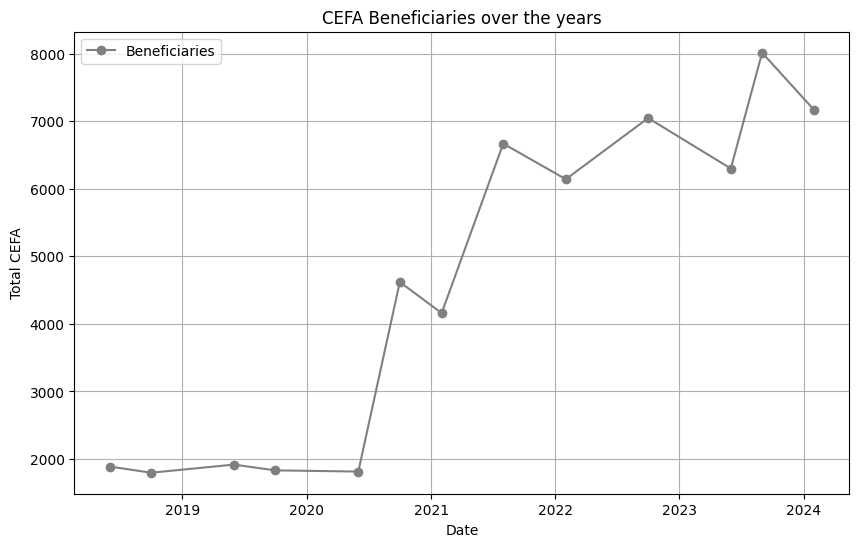

In [8]:
plt.figure(figsize=(10, 6))
plt.plot(totalCEFA.index, totalCEFA, label='Beneficiaries', marker='o', color='gray')
plt.xlabel('Date')
plt.ylabel('Total CEFA')
plt.title('CEFA Beneficiaries over the years')
plt.legend()
plt.grid()
plt.show()

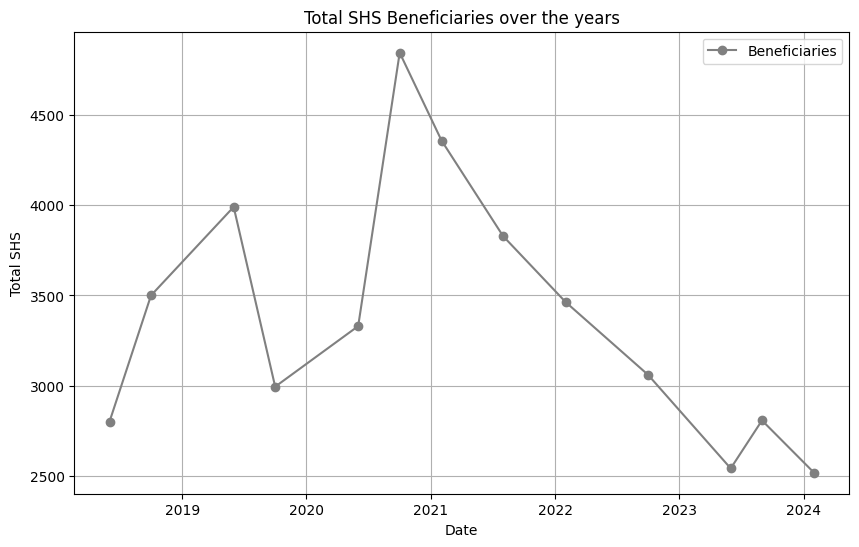

In [9]:
plt.figure(figsize=(10, 6))
plt.plot(totalSHS.index, totalSHS, label='Beneficiaries', marker='o', color='gray')
plt.xlabel('Date')
plt.ylabel('Total SHS')
plt.title('Total SHS Beneficiaries over the years')
plt.legend()
plt.grid()
plt.show()

Both graphs have an additive trends due to the relatively consistent changes over time without proportional scaling of variations with the trend. The SHS graph shows a peak around 2020, and the values decline sharply afterward. However, the changes seem relatively constant in magnitude, meaning the variation does not increase or decrease proportionally with the overall trend. The CEFA graph shows a much more substantial rise in the latter part of the data (after 2021), with a marked increase in beneficiaries. The variations are not dramatically scaling with the trend, and the magnitude of the change appears consistent

**Pointers:**
* Additive Model: The fluctuations or changes in the values remain relatively constant over time. The difference between peaks and troughs (amplitude) stays the same, regardless of the trend. This suggests that the seasonality or variation is additive (i.e., added to the trend).
* Multiplicative Model: The fluctuations increase or decrease proportionally with the trend. If the series has more significant variations when the trend is higher and smaller variations when the trend is lower, the model is multiplicative. The seasonality or variations scale with the level of the trend.

In [10]:
totalSHS

Date
2018-06-01    2800
2018-10-01    3500
2019-06-01    3991
2019-10-01    2994
2020-06-01    3330
2020-10-01    4846
2021-02-01    4359
2021-08-01    3829
2022-02-01    3463
2022-10-01    3060
2023-06-01    2541
2023-09-01    2807
2024-02-01    2517
Name: SHS, dtype: int64

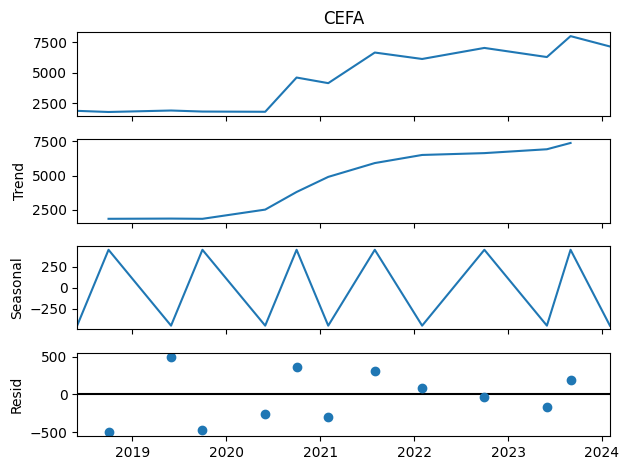

In [11]:
totalCEFASeasonalDecomposition = seasonal_decompose(totalCEFA, model='additive', period=2)
totalCEFASeasonalDecomposition.plot()
pyplot.show()

The trend shows a steady upward growth, starting from 2019 and continuing until 2024, with some dips around 2021. The seasonality exhibits more pronounced fluctuations (around +250 and -250). The residuals suggest that there is some random variation that cannot be explained by the trend or seasonal components. These residuals are relatively low, indicating that the model captured most of the variability in the data.

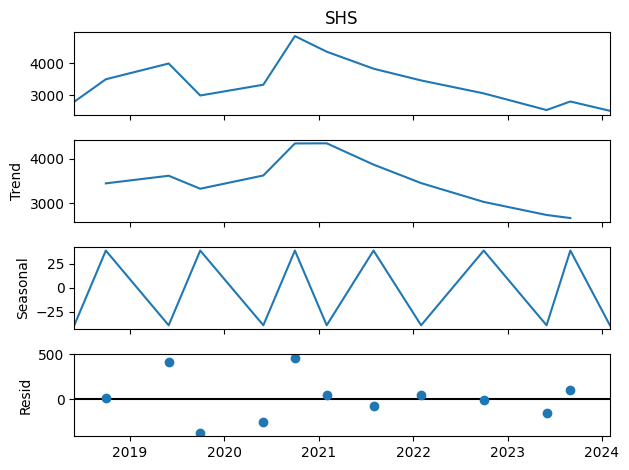

In [12]:
totalSHSSeasonalDecomposition = seasonal_decompose(totalSHS, model='additive', period=2)
totalSHSSeasonalDecomposition.plot()
pyplot.show()

There is an initial increase in the trend until 2021, followed by a gradual decline through 2022 and 2023. The seasonality seems consistent in magnitude (oscillating between +25 and -25). The residuals suggest that there is some random variation that cannot be explained by the trend or seasonal components. These residuals are relatively low, indicating that the model captured most of the variability in the data.

Since the data contains yearly slot data clear observable seasonality in the time series, SARIMA is the best choice for forecasting the number of beneficiaries per year without any external variables.

# Total CEFA

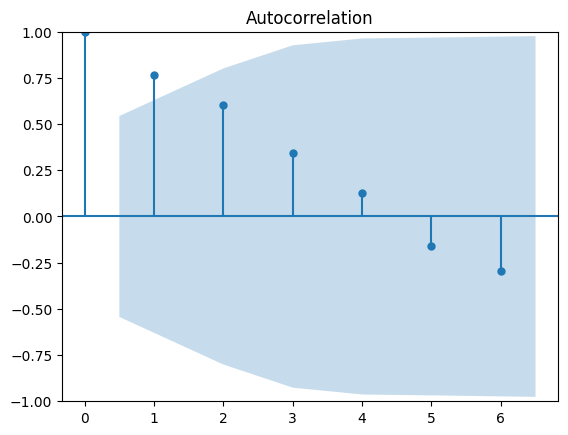

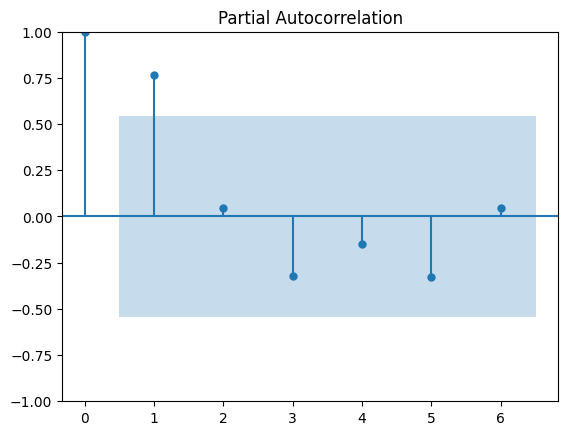

In [13]:
collegeACF = plot_acf(totalCEFA)
collegePACF = plot_pacf(totalCEFA)

The PACF plot shows a significant spike at lag 1 and a drop-off afterwards. This suggests that an AR(1) process might fit well. The ACF plot shows a gradual decline, which suggests the presence of a moving average component, likely MA(1) as the autocorrelation dies off after a couple of lags. There are no clear signs of non-stationarity , suggesting that the series may not need differencing. 

To check further, Augmented Dickey-Fuller Test is to be done using the data


**Pointers**
* Autocorrelation plots (Box and Jenkins, pp. 28-32) are a commonly-used tool for checking randomness in a data set. This randomness is ascertained by computing autocorrelations for data values at varying time lags. If random, such autocorrelations should be near zero for any and all time-lag separations. If non-random, then one or more of the autocorrelations will be significantly non-zero. Reference: https://www.itl.nist.gov/div898/handbook/eda/section3/autocopl.html
* The shaded blue area represents the confidence interval (95%). Any points outside this shaded area indicate significant autocorrelation
* Y-Axis (Autocorrelation): This axis shows the autocorrelation coefficients, which measure the correlation between the time series and its lagged values.
* X-Axis (Lag): This axis represents the lag number, which is the number of time steps by which the series is shifted. For example, a lag of 1 compares the series with itself offset by one time period.
* Confidence Bands: The dashed lines (usually set around ±1.96/√n, where n is the sample size) indicate the confidence intervals. If the autocorrelation values (bars) are within these bands, they are not statistically significant, meaning there is no strong correlation at that lag.

**Pointers for ADF Test**
* Augmented Dickey Fuller test (ADF Test) is a common statistical test used to test whether a given Time series is stationary or not. It is one of the most commonly used statistical test when it comes to analyzing the stationary of a series.
* The ADF test belongs to a category of tests called ‘Unit Root Test’, which is the proper method for testing the stationarity of a time series. Unit root is a characteristic of a time series that makes it non-stationary. Technically speaking, a unit root is said to exist in a time series of the value of alpha = 1. Unit Root in Data? Non-Stationary
* A Dickey-Fuller test is a unit root test that tests the null hypothesis that α=1 in the following model equation. alpha is the coefficient of the first lag on Y. The ADF test expands the Dickey-Fuller test equation to include high order regressive process in the model.
* Since the null hypothesis assumes the presence of unit root, that is α=1, the p-value obtained should be less than the significance level (say 0.05) in order to reject the null hypothesis. Thereby, inferring that the series is stationary.

Reference: https://www.machinelearningplus.com/time-series/augmented-dickey-fuller-test/

In [14]:
# Null Hypothesis: There is a unit root in the data. The data is non-stationary
# Alternative Hypothesis: There is no unit root in the data. The data is stationary

result = adfuller(totalCEFA)
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -0.29097827363085016
p-value: 0.9267723953545675


P-value is significantly higher than the typical threshold of 0.05. We failed to reject the Null Hypothesis, therefore, the data is non-stationary. To proceed, the data needs differencing to make it stationary

In [15]:
data_diff = df['CEFA'].diff().dropna()

# ADF test
result = adfuller(data_diff)
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -3.0123537283195576
p-value: 0.033756712815424916


P-value is now less than 0.05 after first oreder of differencing, hence, we will proceed with an initial estimation of I(1).

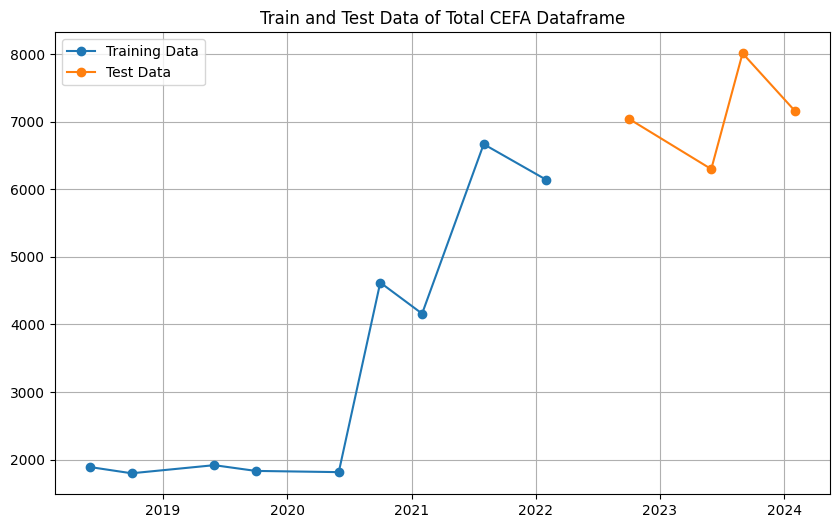

In [16]:
trainSize = int(len(totalCEFA) * 0.7)
train, test = totalCEFA[:trainSize], totalCEFA[trainSize:]

plt.figure(figsize=(10,6))
plt.plot(train, label='Training Data', marker='o')
plt.plot(test, label='Test Data', marker='o')
plt.title('Train and Test Data of Total CEFA Dataframe')
plt.legend()
plt.grid()
plt.show()

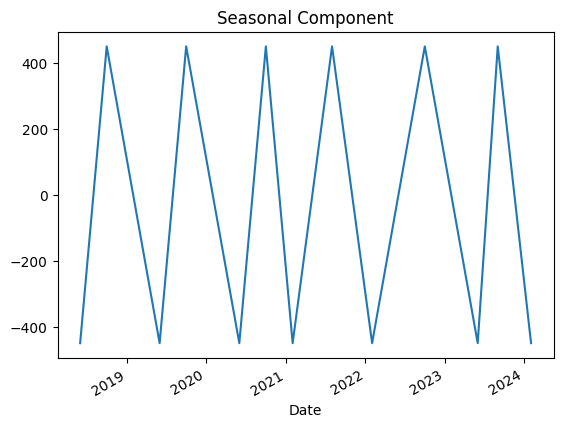

In [17]:
totalCEFA.index = pd.to_datetime(totalCEFA.index)
decomposition = seasonal_decompose(totalCEFA, model='additive', period=2)
decomposition.seasonal.plot(title='Seasonal Component')
plt.show()

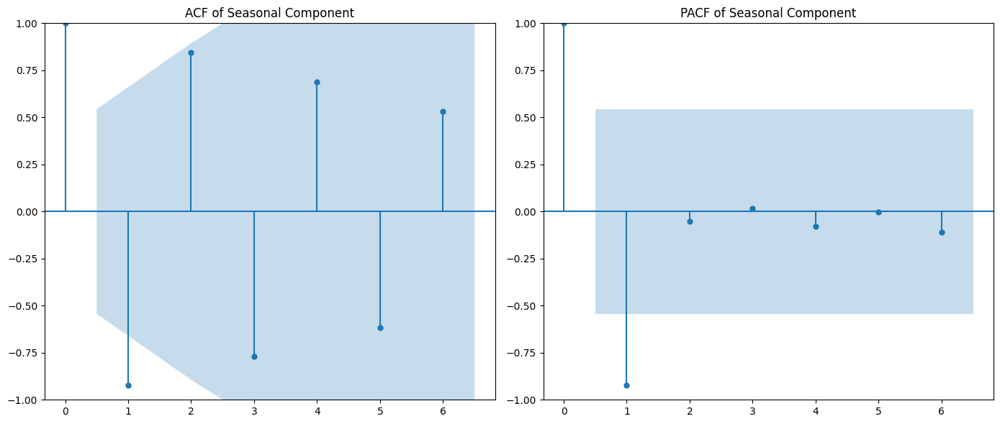

In [18]:
plt.figure(figsize=(14, 6))

plt.subplot(121)
plot_acf(decomposition.seasonal.dropna(), lags=6, ax=plt.gca())
plt.title('ACF of Seasonal Component')

plt.subplot(122)
plot_pacf(decomposition.seasonal.dropna(), lags=6, ax=plt.gca())
plt.title('PACF of Seasonal Component')

plt.tight_layout()
plt.show()

For the seasonal order of the data, we are proceeding with an initial estimation of AR(1) and MA(1) with the significant lags being lag 1 and falling off afterwards for both ACF and PACF of the Seasonal Component

In [19]:
result = adfuller(decomposition.seasonal.dropna())
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -1.5840150915942536e+16
p-value: 0.0


The ADF Statistic is extremely negative, which is a strong indication that the seasonal component is stationary. The p-value is 0.0, which means we reject the null hypothesis that the data has a unit root (i.e., it's non-stationary).

In [20]:
model = SARIMAX(train, order=(1, 2, 1), seasonal_order=(1, 0, 1, 2))

results = model.fit()
print(results.summary())

                                     SARIMAX Results                                     
Dep. Variable:                              CEFA   No. Observations:                    9
Model:             SARIMAX(1, 2, 1)x(1, 0, 1, 2)   Log Likelihood                -123.507
Date:                           Fri, 20 Sep 2024   AIC                            257.014
Time:                                   11:46:22   BIC                            256.743
Sample:                                        0   HQIC                           253.671
                                             - 9                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6395      0.291     -2.197      0.028      -1.210      -0.069
ma.L1         -0.8560      0.365     -2.347

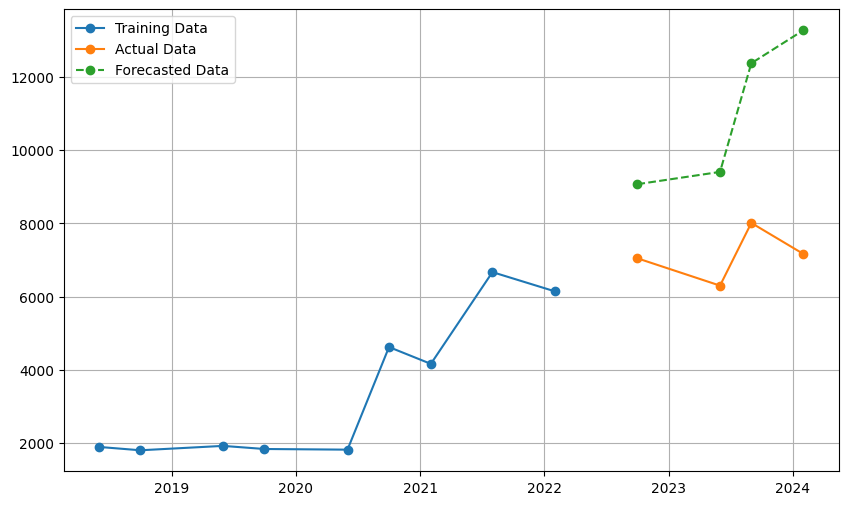

Root Mean Squared Error: 4189.223677391429


In [21]:
forecast = results.forecast(steps=len(test))

plt.figure(figsize=(10,6))
plt.plot(train.index, train, label='Training Data', marker='o')
plt.plot(test.index, test, label='Actual Data', marker='o')
plt.plot(test.index, forecast, label='Forecasted Data', linestyle='--', marker='o')
plt.legend()
plt.grid()
plt.show()

mse = mean_squared_error(test, forecast)
rmse = np.sqrt(mse)
print(f'Root Mean Squared Error: {rmse}')

forecast_df = pd.DataFrame(forecast, index=test.index, columns=['Forecast'])

RMSE of the created model is extremely high, further model fine tuning will be required to fully capture the data's trend and seasonality

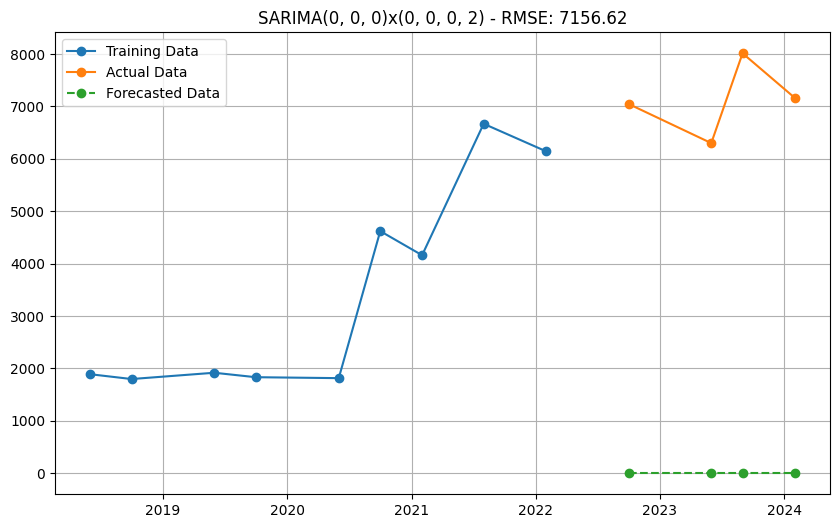

Model: SARIMA(0, 0, 0)x(0, 0, 0, 2) - AIC: 176.45 - RMSE: 7156.62
New best model found: SARIMA(0, 0, 0)x(0, 0, 0, 2) - AIC: 176.45


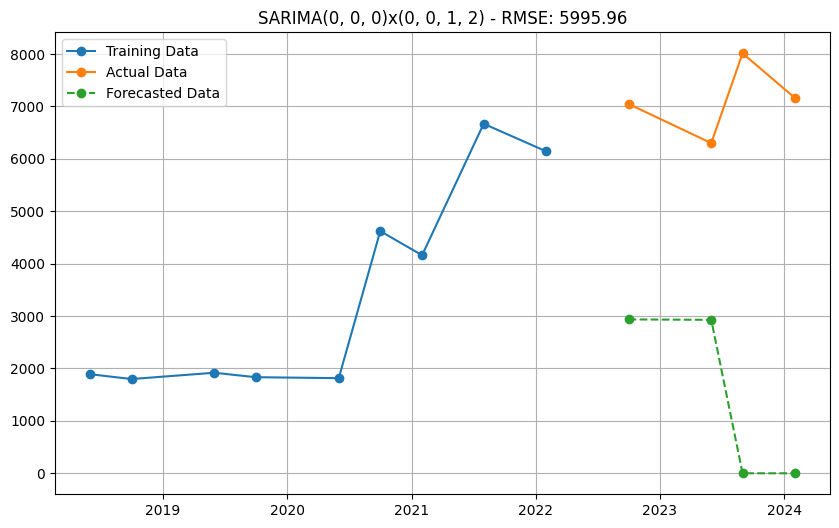

Model: SARIMA(0, 0, 0)x(0, 0, 1, 2) - AIC: 172.22 - RMSE: 5995.96
New best model found: SARIMA(0, 0, 0)x(0, 0, 1, 2) - AIC: 172.22


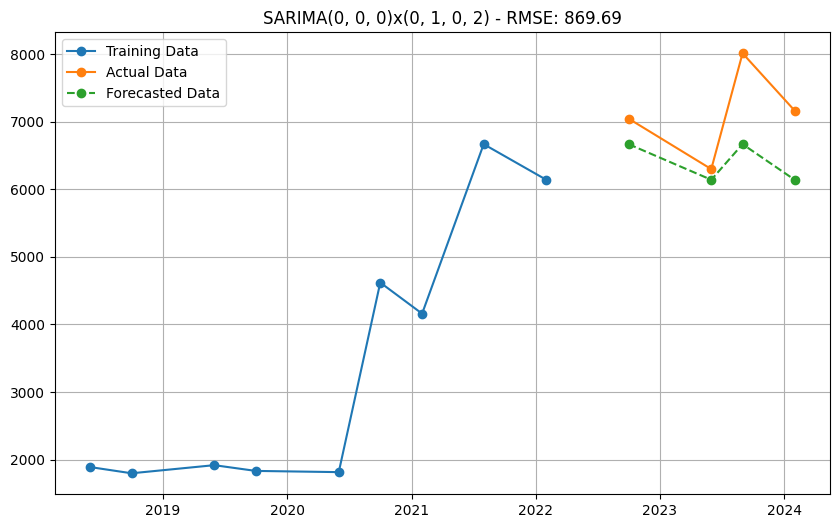

Model: SARIMA(0, 0, 0)x(0, 1, 0, 2) - AIC: 126.40 - RMSE: 869.69
New best model found: SARIMA(0, 0, 0)x(0, 1, 0, 2) - AIC: 126.40


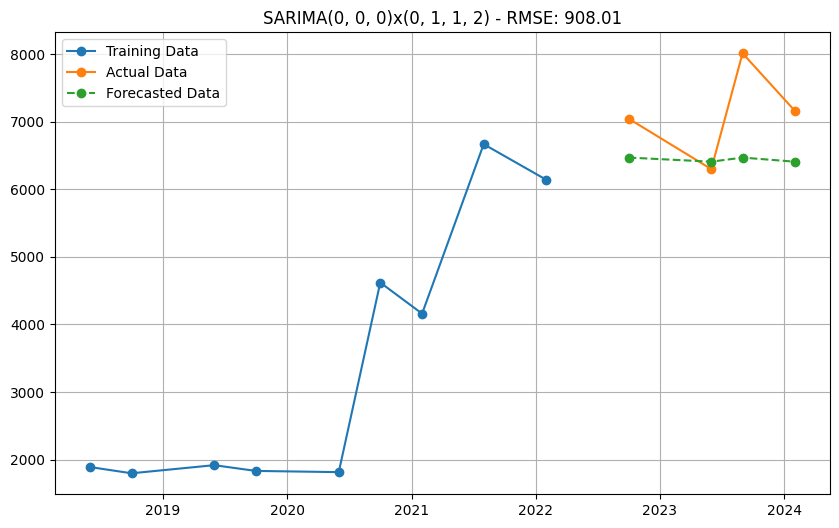

Model: SARIMA(0, 0, 0)x(0, 1, 1, 2) - AIC: 126.42 - RMSE: 908.01


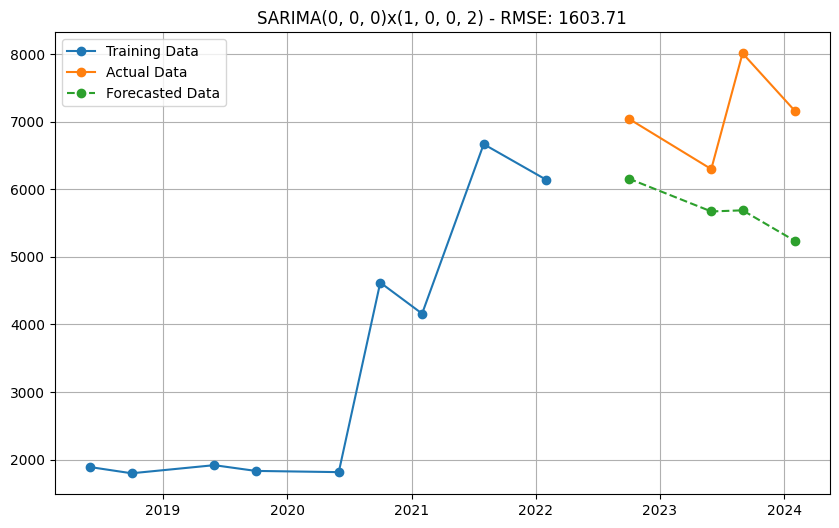

Model: SARIMA(0, 0, 0)x(1, 0, 0, 2) - AIC: 167.55 - RMSE: 1603.71


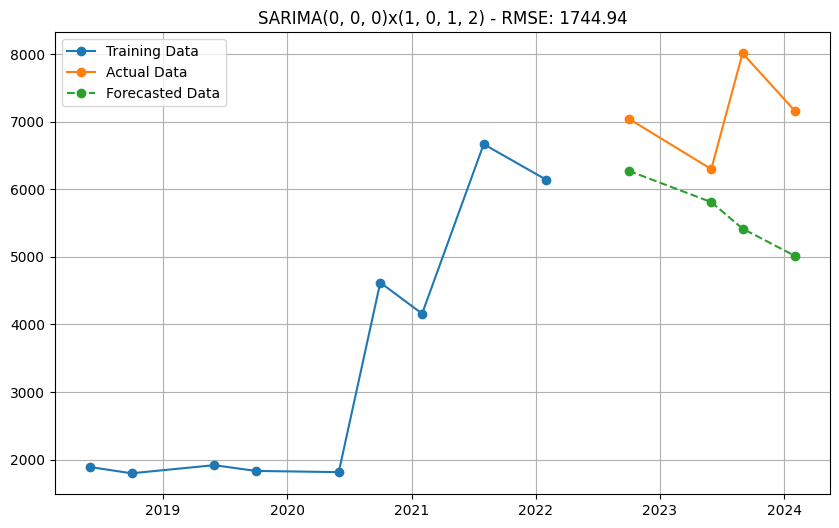

Model: SARIMA(0, 0, 0)x(1, 0, 1, 2) - AIC: 166.67 - RMSE: 1744.94


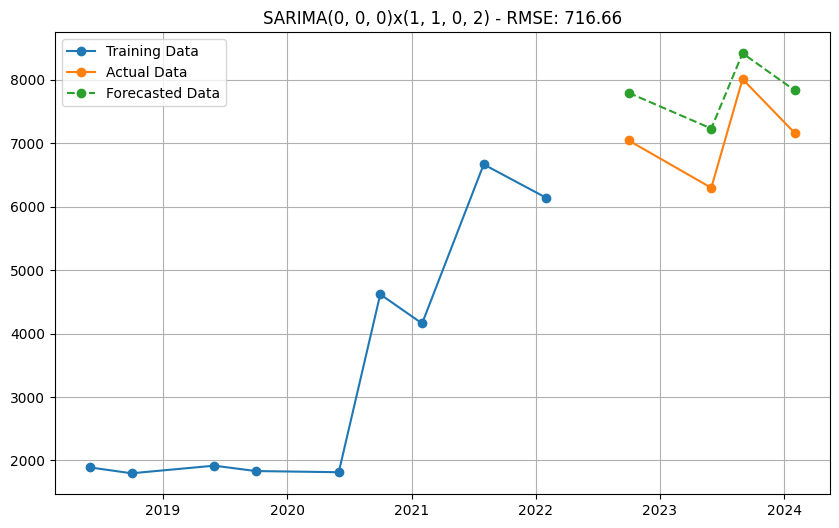

Model: SARIMA(0, 0, 0)x(1, 1, 0, 2) - AIC: 126.19 - RMSE: 716.66
New best model found: SARIMA(0, 0, 0)x(1, 1, 0, 2) - AIC: 126.19


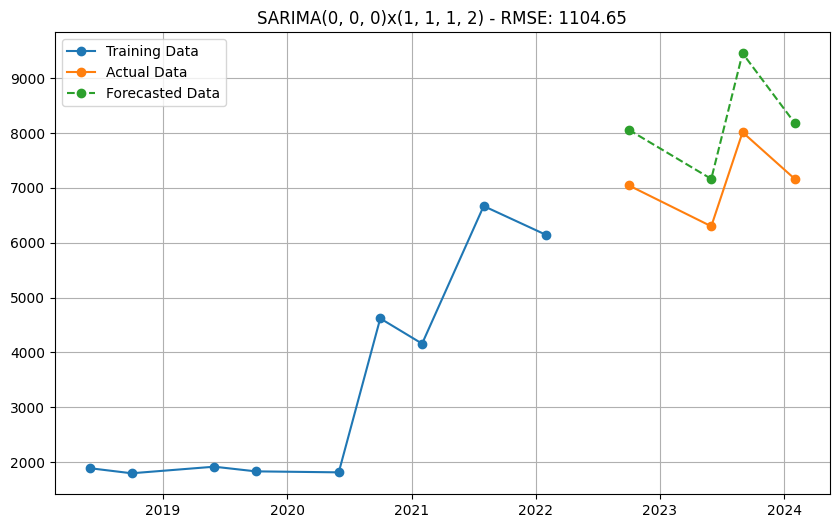

Model: SARIMA(0, 0, 0)x(1, 1, 1, 2) - AIC: 127.40 - RMSE: 1104.65


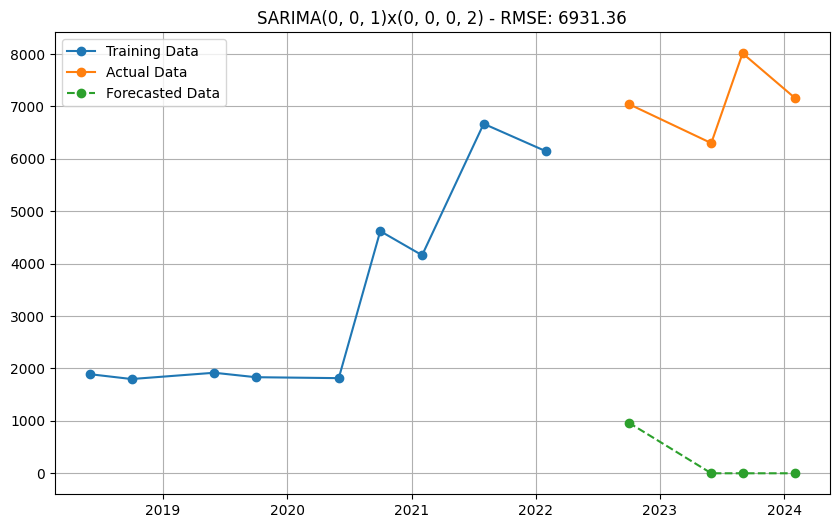

Model: SARIMA(0, 0, 1)x(0, 0, 0, 2) - AIC: 171.28 - RMSE: 6931.36


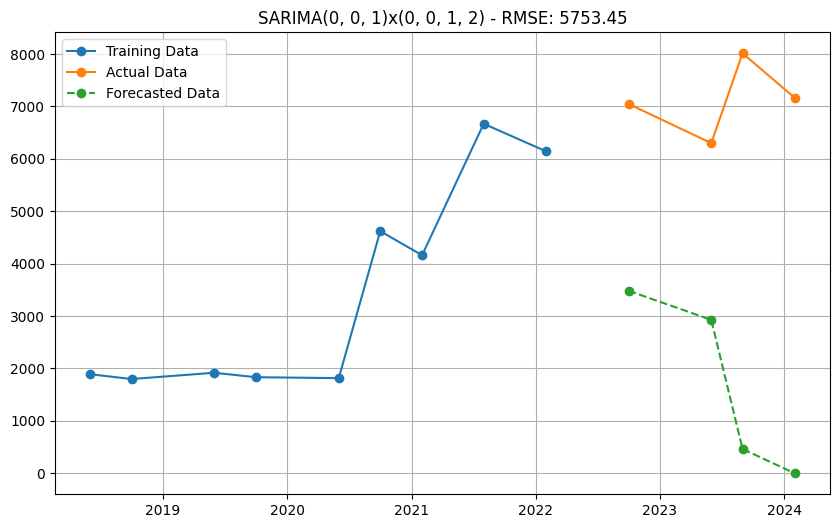

Model: SARIMA(0, 0, 1)x(0, 0, 1, 2) - AIC: 166.56 - RMSE: 5753.45


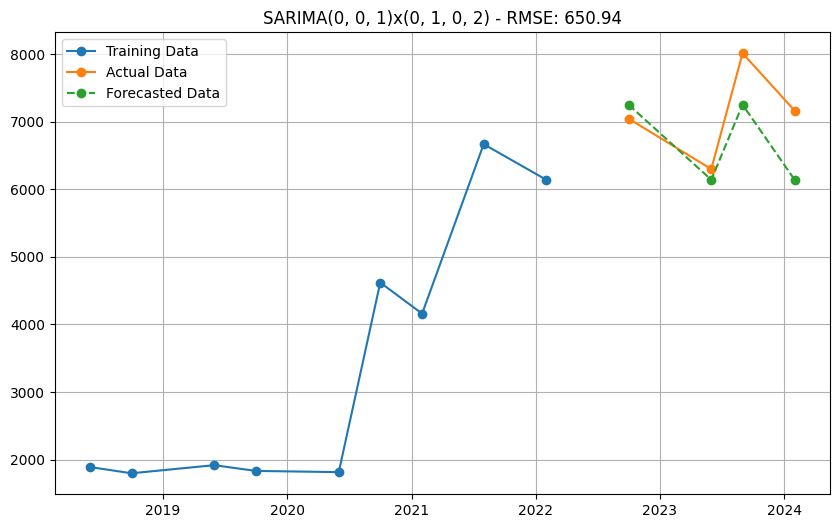

Model: SARIMA(0, 0, 1)x(0, 1, 0, 2) - AIC: 125.08 - RMSE: 650.94
New best model found: SARIMA(0, 0, 1)x(0, 1, 0, 2) - AIC: 125.08


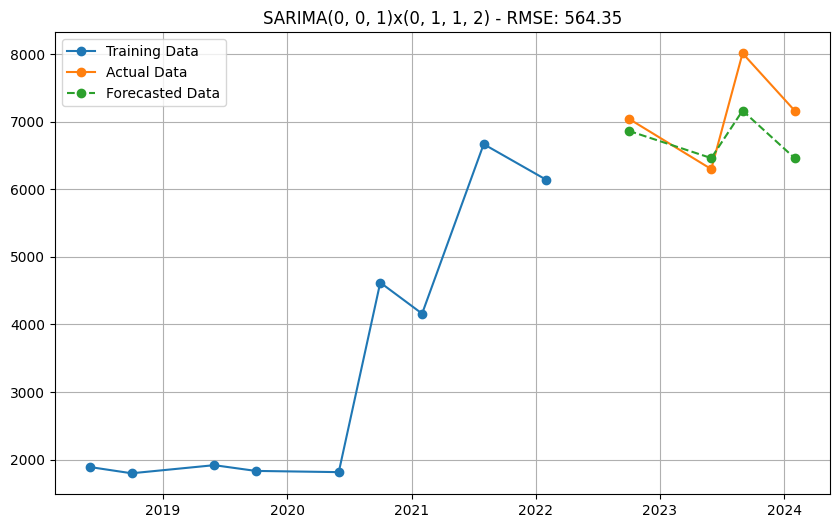

Model: SARIMA(0, 0, 1)x(0, 1, 1, 2) - AIC: 125.00 - RMSE: 564.35
New best model found: SARIMA(0, 0, 1)x(0, 1, 1, 2) - AIC: 125.00


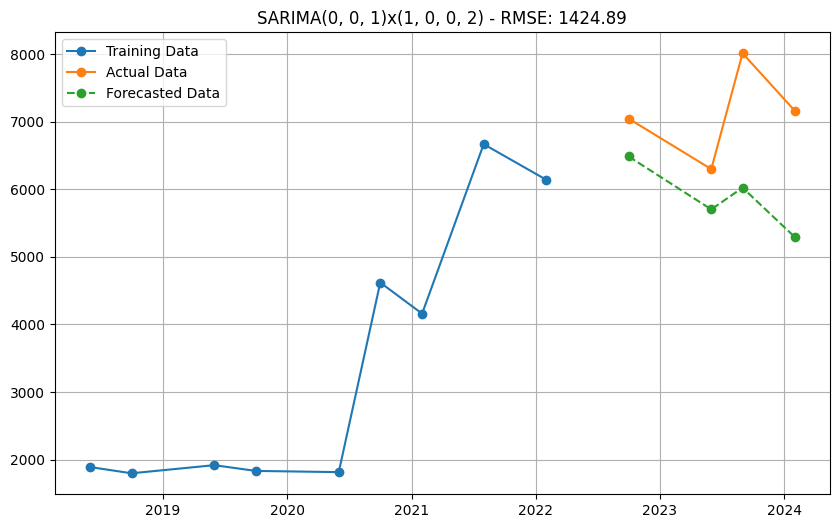

Model: SARIMA(0, 0, 1)x(1, 0, 0, 2) - AIC: 162.80 - RMSE: 1424.89


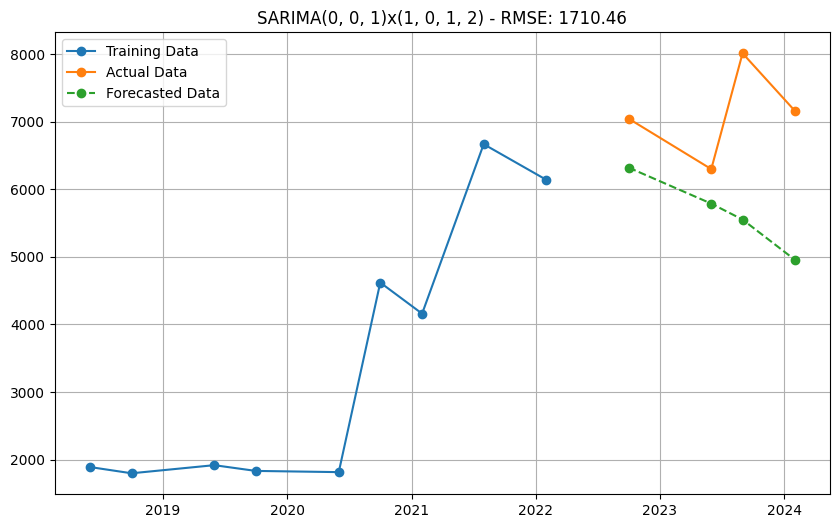

Model: SARIMA(0, 0, 1)x(1, 0, 1, 2) - AIC: 161.70 - RMSE: 1710.46


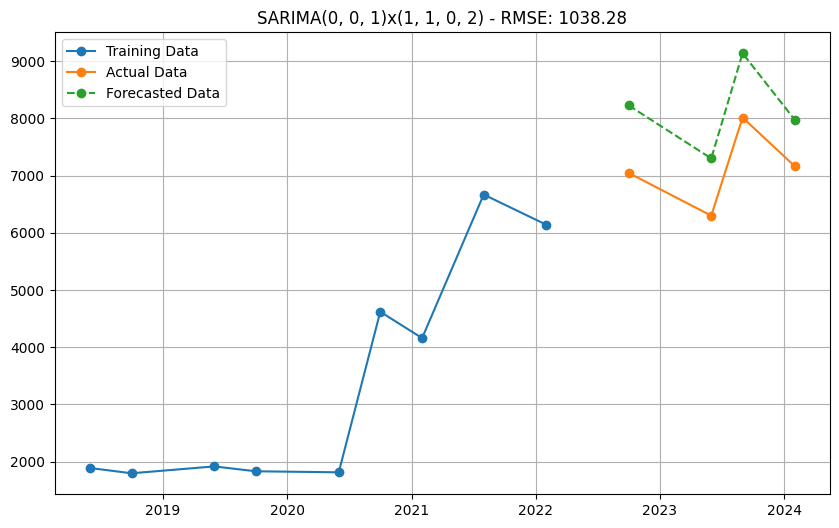

Model: SARIMA(0, 0, 1)x(1, 1, 0, 2) - AIC: 124.96 - RMSE: 1038.28
New best model found: SARIMA(0, 0, 1)x(1, 1, 0, 2) - AIC: 124.96


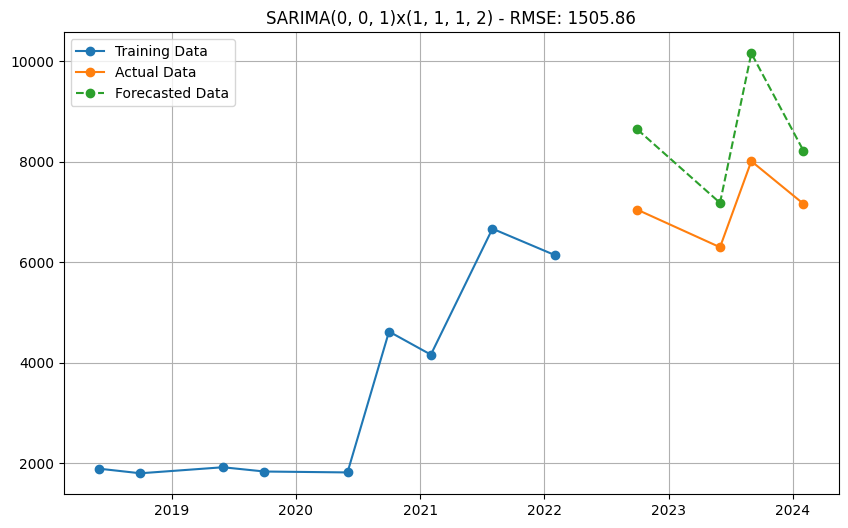

Model: SARIMA(0, 0, 1)x(1, 1, 1, 2) - AIC: 126.49 - RMSE: 1505.86


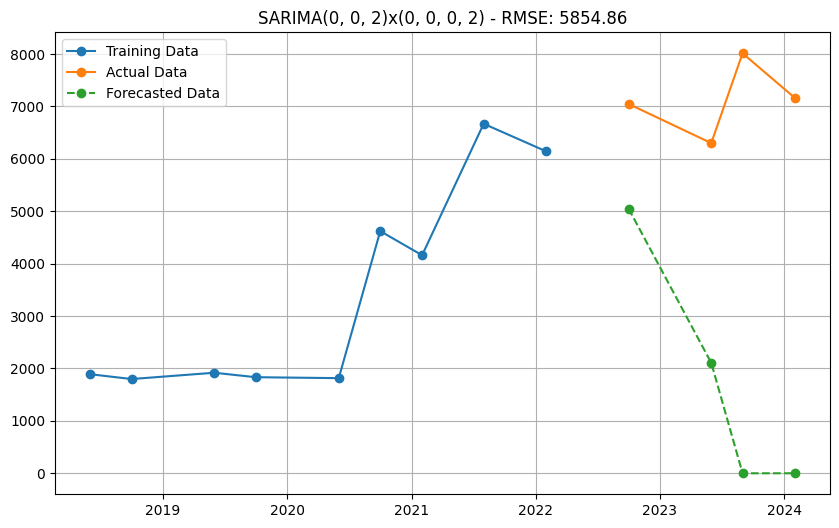

Model: SARIMA(0, 0, 2)x(0, 0, 0, 2) - AIC: 169.49 - RMSE: 5854.86
Failed to fit SARIMA(0, 0, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


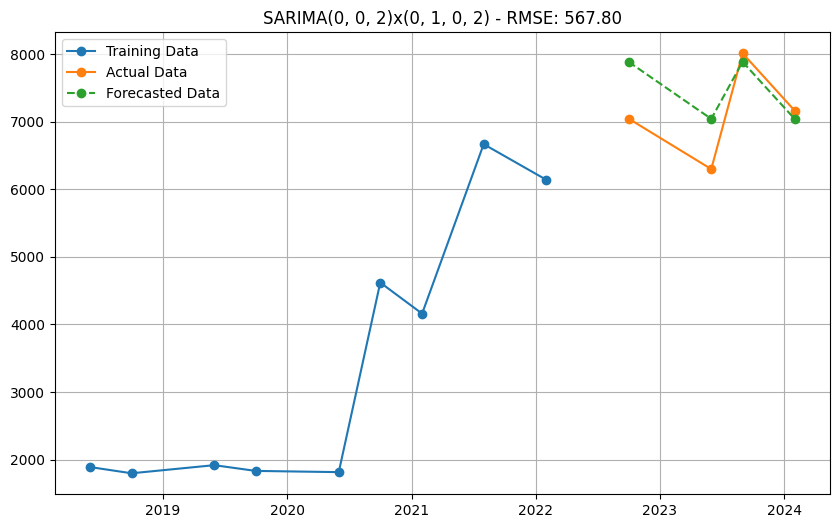

Model: SARIMA(0, 0, 2)x(0, 1, 0, 2) - AIC: 125.38 - RMSE: 567.80
Failed to fit SARIMA(0, 0, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


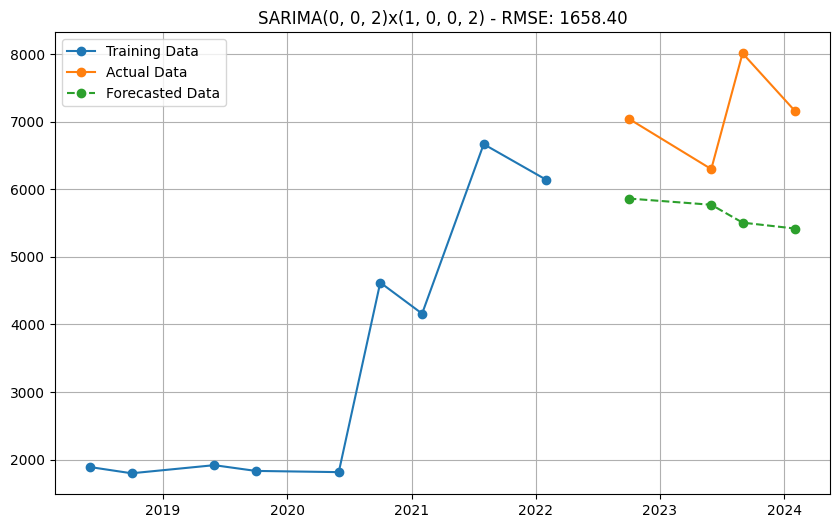

Model: SARIMA(0, 0, 2)x(1, 0, 0, 2) - AIC: 165.45 - RMSE: 1658.40
Failed to fit SARIMA(0, 0, 2)x(1, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


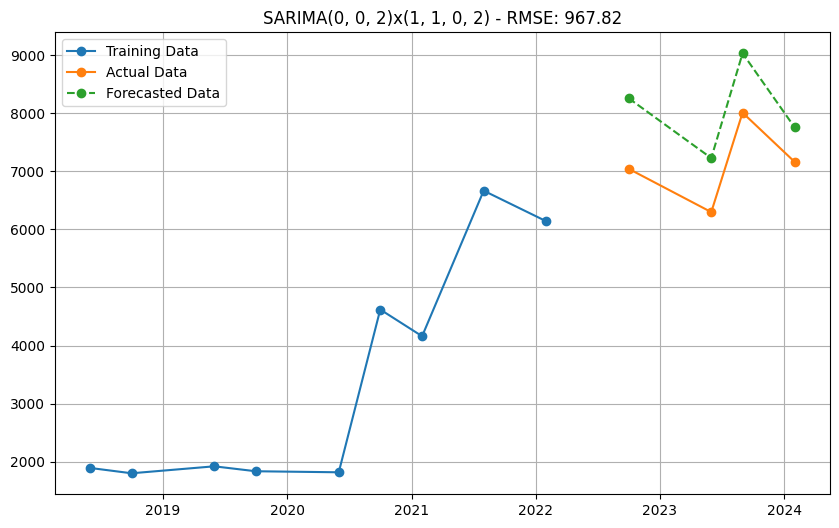

Model: SARIMA(0, 0, 2)x(1, 1, 0, 2) - AIC: 126.91 - RMSE: 967.82
Failed to fit SARIMA(0, 0, 2)x(1, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


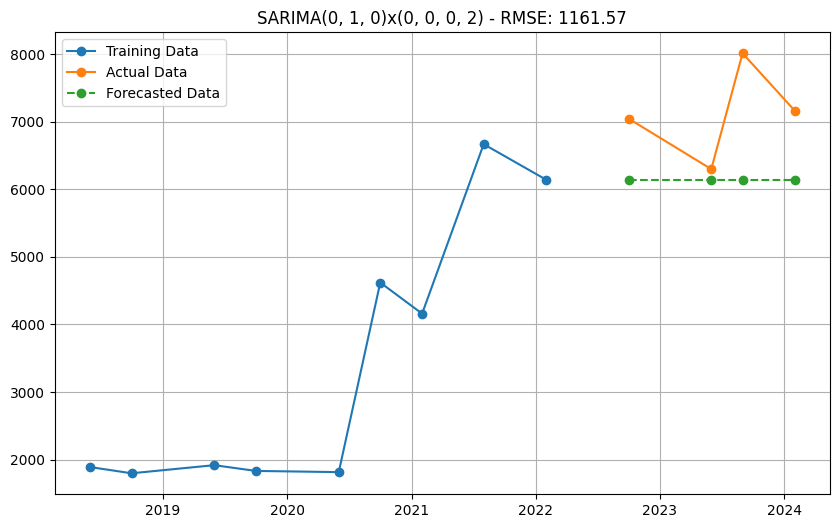

Model: SARIMA(0, 1, 0)x(0, 0, 0, 2) - AIC: 140.08 - RMSE: 1161.57


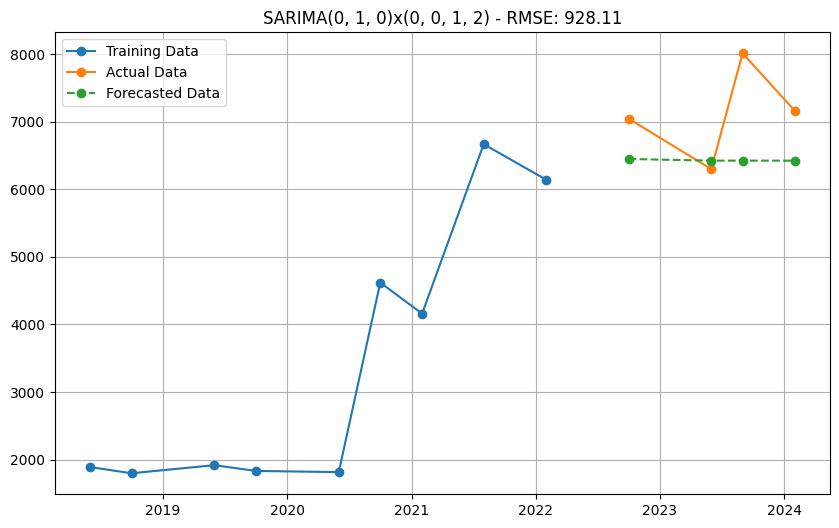

Model: SARIMA(0, 1, 0)x(0, 0, 1, 2) - AIC: 138.66 - RMSE: 928.11


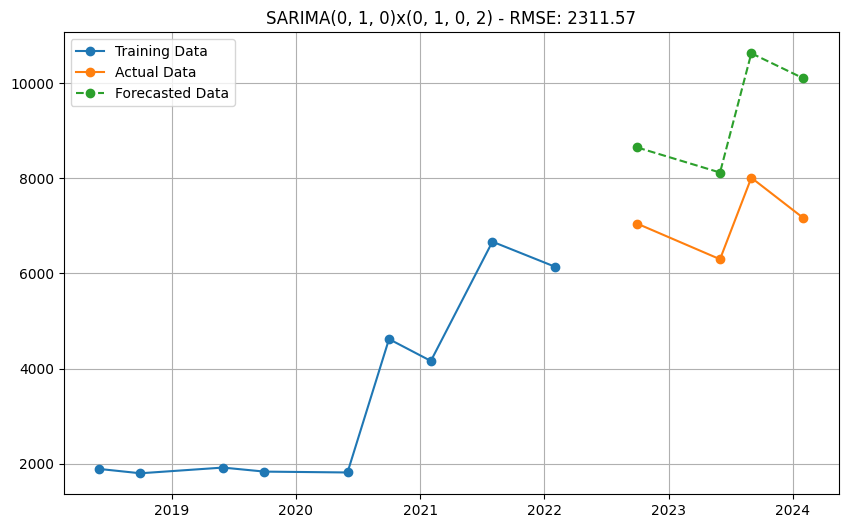

Model: SARIMA(0, 1, 0)x(0, 1, 0, 2) - AIC: 104.12 - RMSE: 2311.57
New best model found: SARIMA(0, 1, 0)x(0, 1, 0, 2) - AIC: 104.12


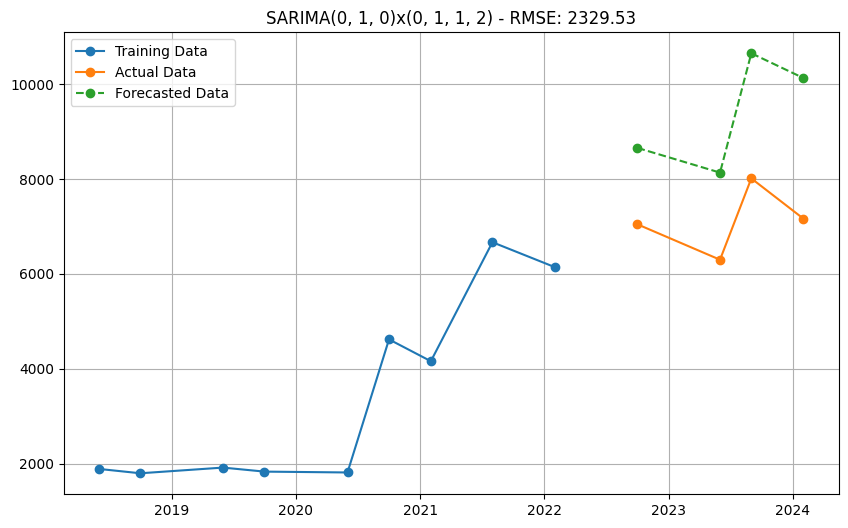

Model: SARIMA(0, 1, 0)x(0, 1, 1, 2) - AIC: 106.10 - RMSE: 2329.53


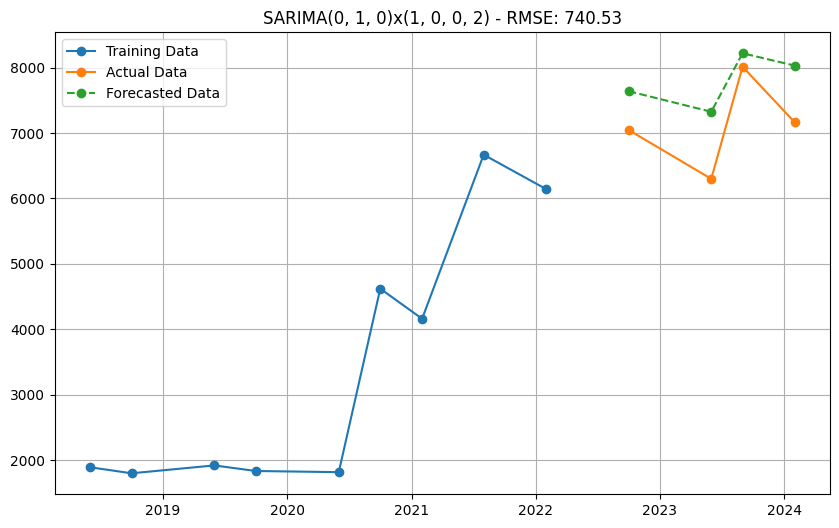

Model: SARIMA(0, 1, 0)x(1, 0, 0, 2) - AIC: 139.17 - RMSE: 740.53


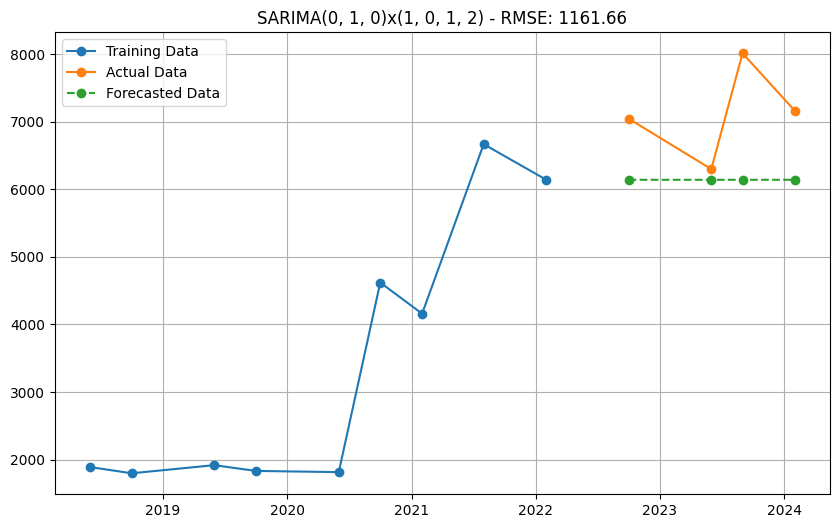

Model: SARIMA(0, 1, 0)x(1, 0, 1, 2) - AIC: 144.09 - RMSE: 1161.66


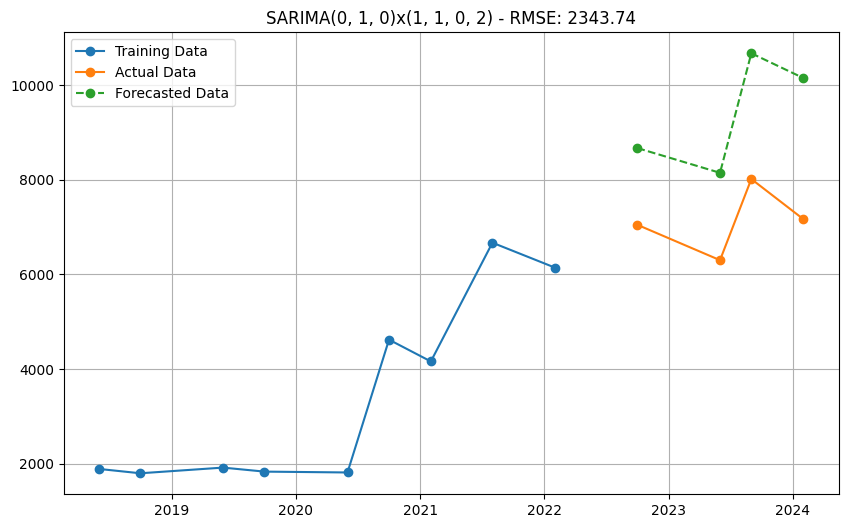

Model: SARIMA(0, 1, 0)x(1, 1, 0, 2) - AIC: 106.09 - RMSE: 2343.74


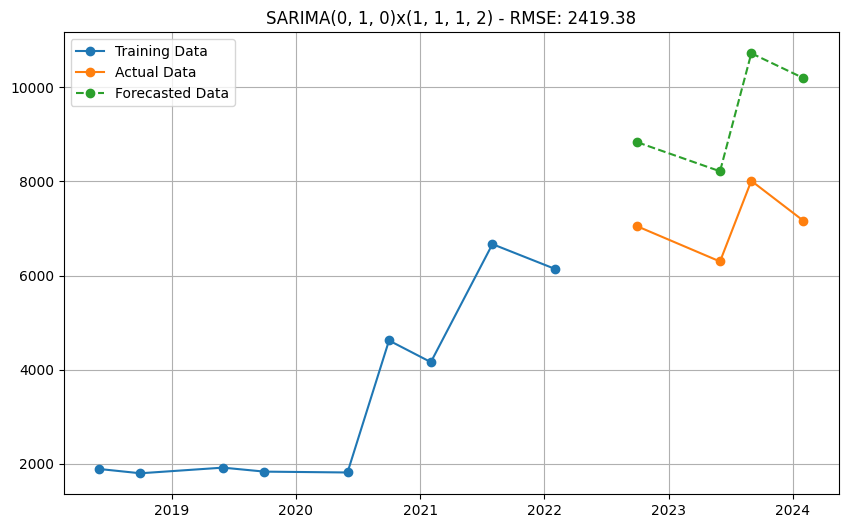

Model: SARIMA(0, 1, 0)x(1, 1, 1, 2) - AIC: 108.08 - RMSE: 2419.38


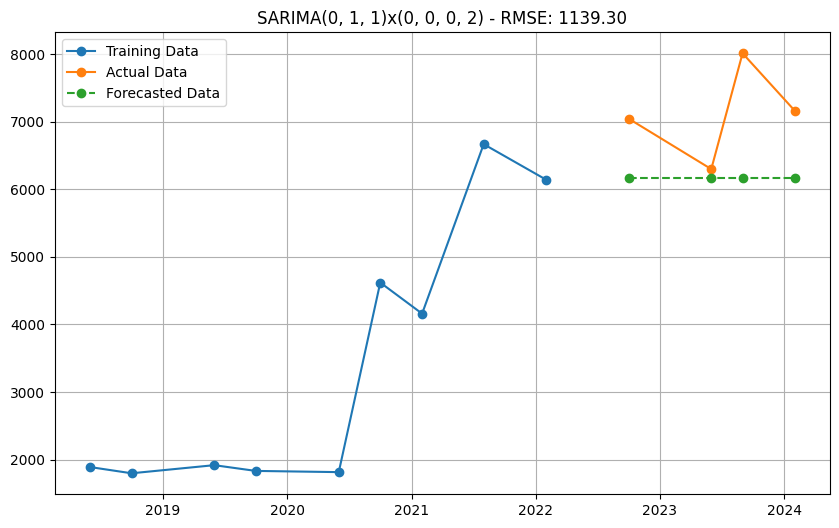

Model: SARIMA(0, 1, 1)x(0, 0, 0, 2) - AIC: 141.80 - RMSE: 1139.30


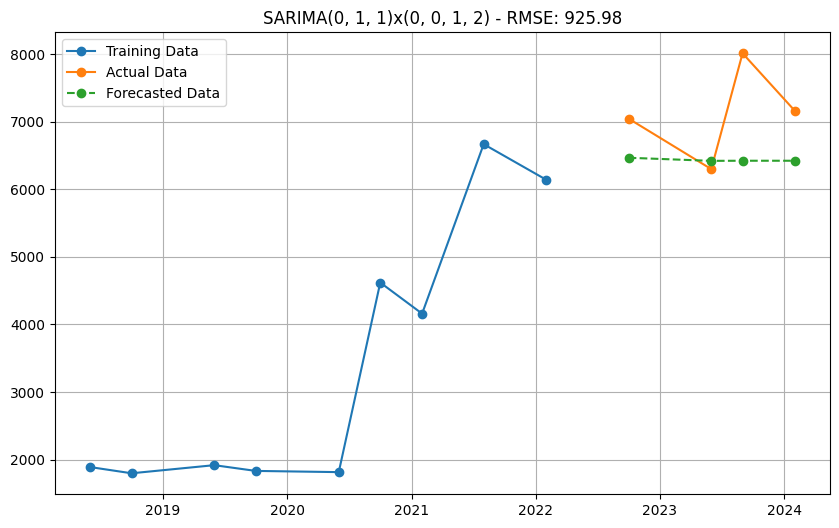

Model: SARIMA(0, 1, 1)x(0, 0, 1, 2) - AIC: 140.58 - RMSE: 925.98


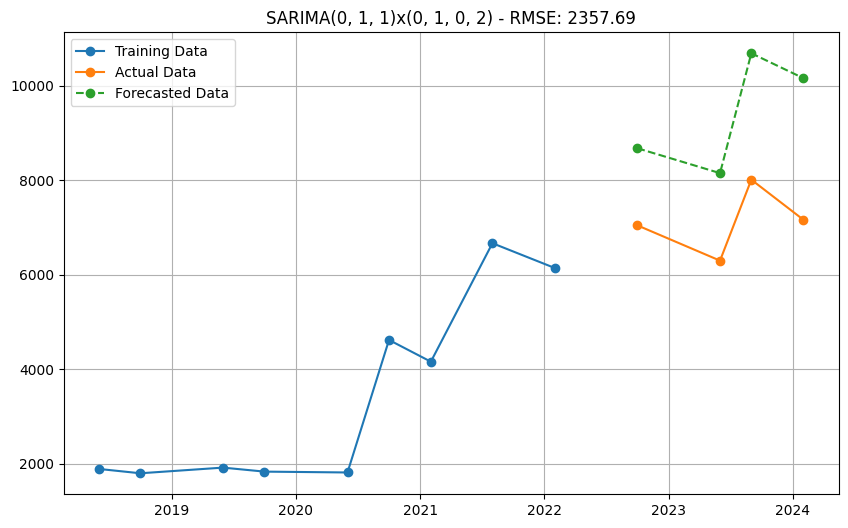

Model: SARIMA(0, 1, 1)x(0, 1, 0, 2) - AIC: 105.89 - RMSE: 2357.69


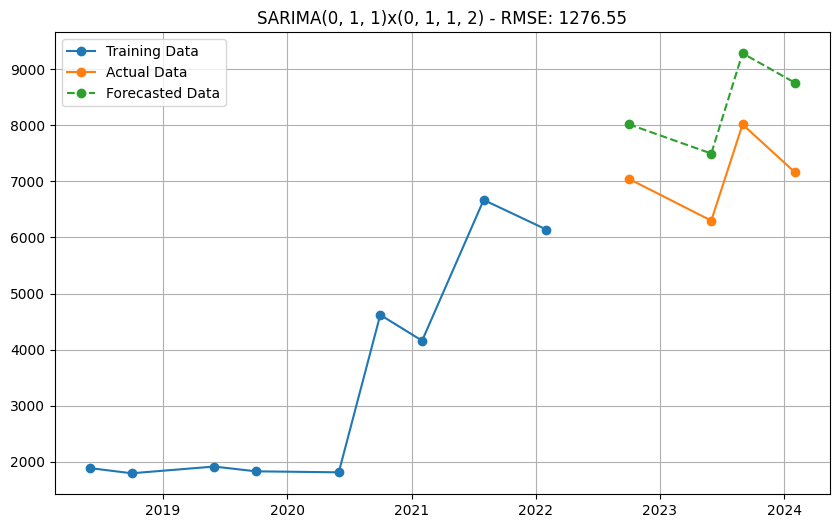

Model: SARIMA(0, 1, 1)x(0, 1, 1, 2) - AIC: 109.47 - RMSE: 1276.55


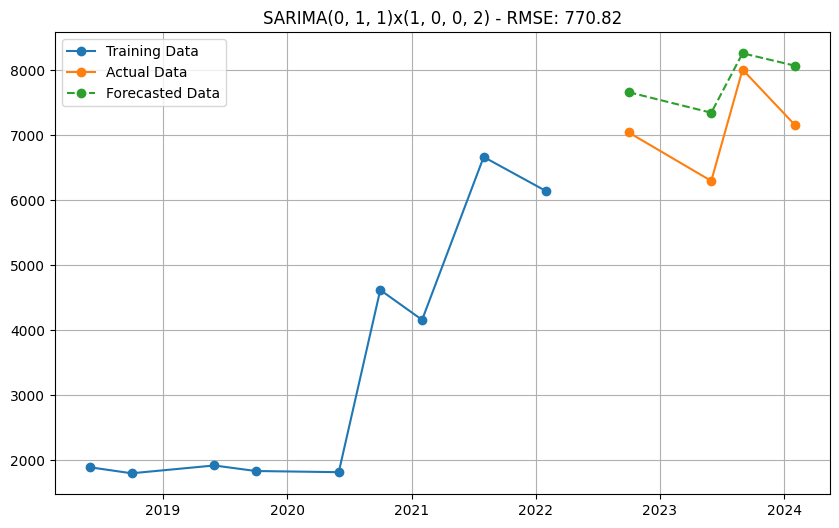

Model: SARIMA(0, 1, 1)x(1, 0, 0, 2) - AIC: 140.85 - RMSE: 770.82


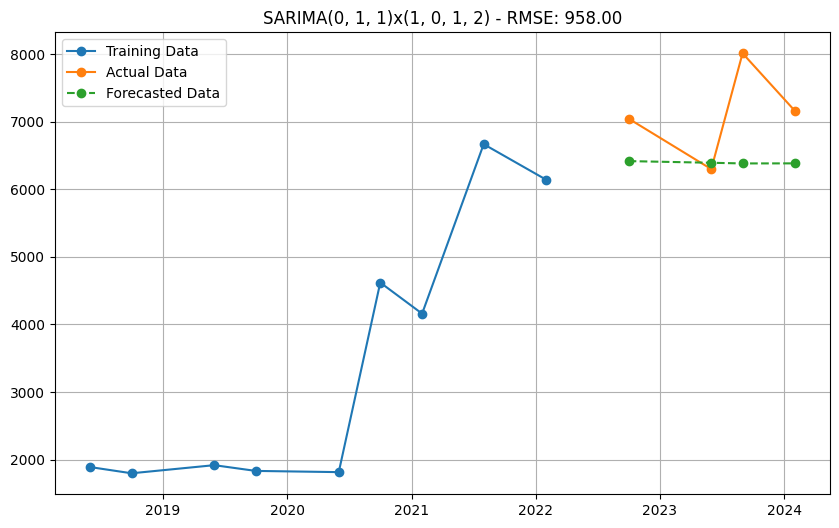

Model: SARIMA(0, 1, 1)x(1, 0, 1, 2) - AIC: 142.57 - RMSE: 958.00


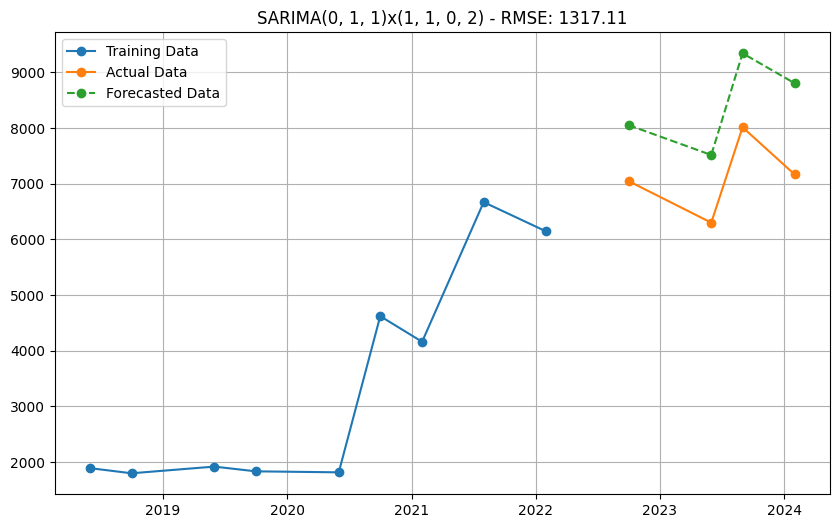

Model: SARIMA(0, 1, 1)x(1, 1, 0, 2) - AIC: 109.52 - RMSE: 1317.11


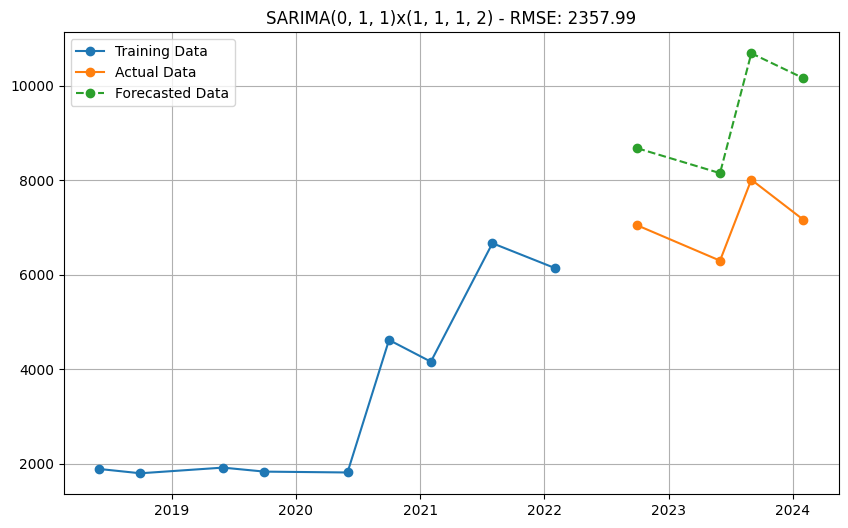

Model: SARIMA(0, 1, 1)x(1, 1, 1, 2) - AIC: 109.89 - RMSE: 2357.99


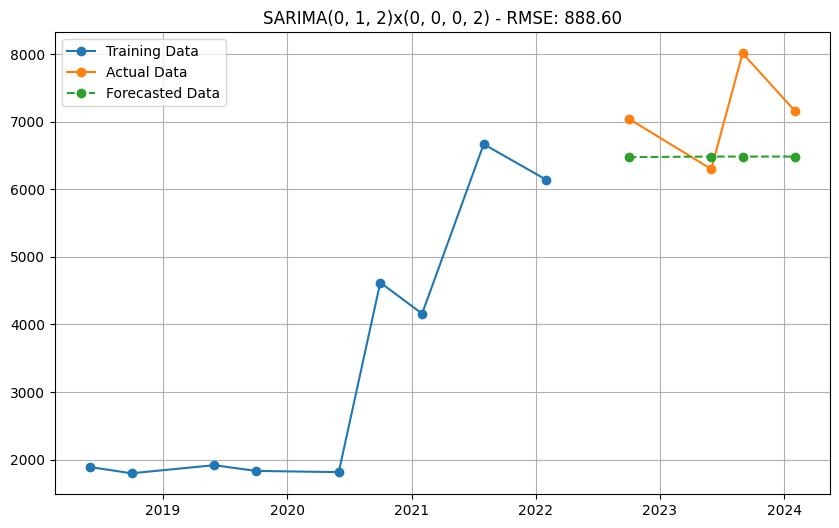

Model: SARIMA(0, 1, 2)x(0, 0, 0, 2) - AIC: 140.65 - RMSE: 888.60
Failed to fit SARIMA(0, 1, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


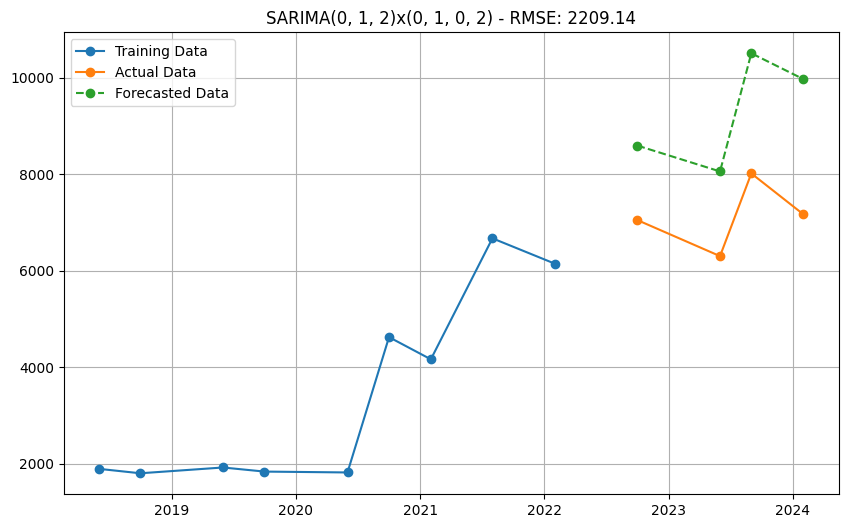

Model: SARIMA(0, 1, 2)x(0, 1, 0, 2) - AIC: 107.67 - RMSE: 2209.14
Failed to fit SARIMA(0, 1, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


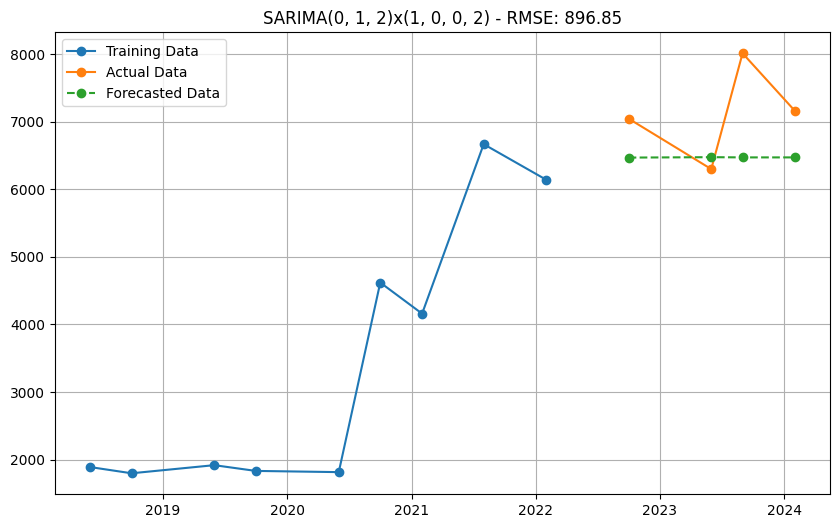

Model: SARIMA(0, 1, 2)x(1, 0, 0, 2) - AIC: 142.65 - RMSE: 896.85
Failed to fit SARIMA(0, 1, 2)x(1, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


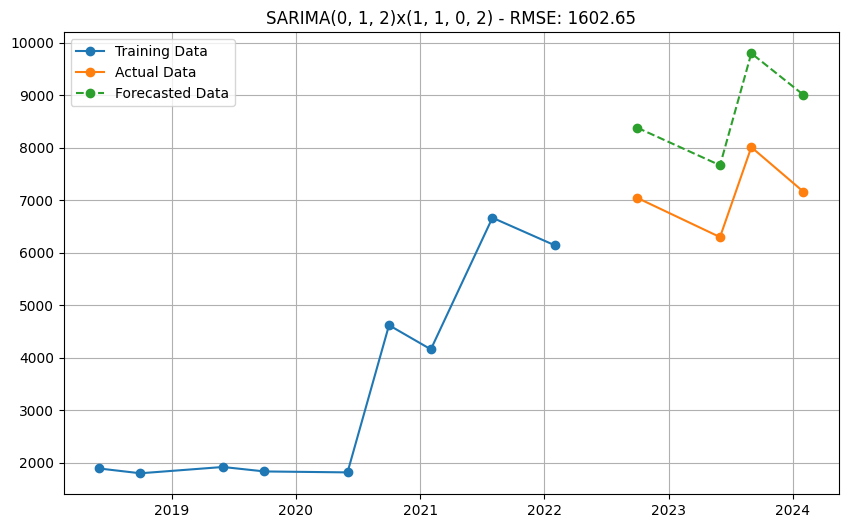

Model: SARIMA(0, 1, 2)x(1, 1, 0, 2) - AIC: 109.51 - RMSE: 1602.65
Failed to fit SARIMA(0, 1, 2)x(1, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


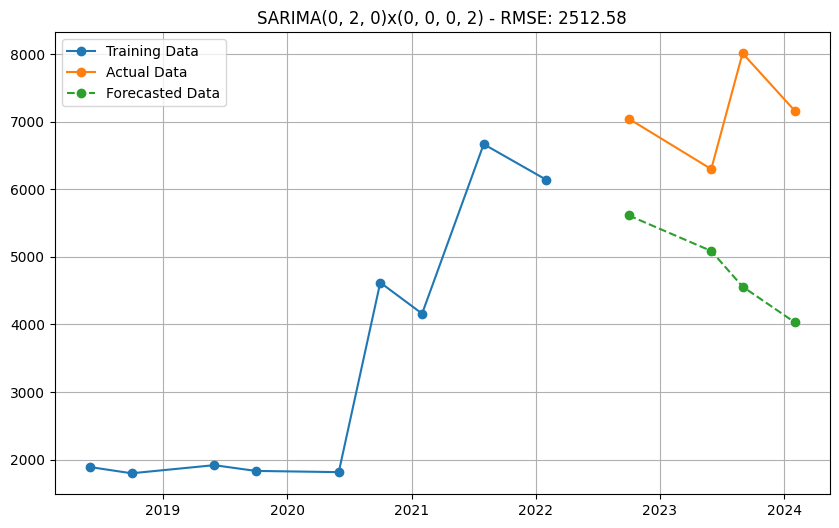

Model: SARIMA(0, 2, 0)x(0, 0, 0, 2) - AIC: 130.18 - RMSE: 2512.58


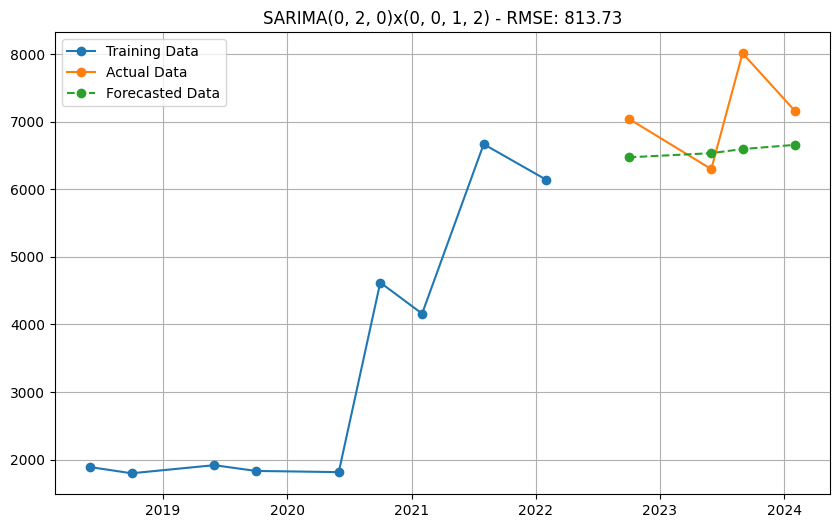

Model: SARIMA(0, 2, 0)x(0, 0, 1, 2) - AIC: 128.36 - RMSE: 813.73


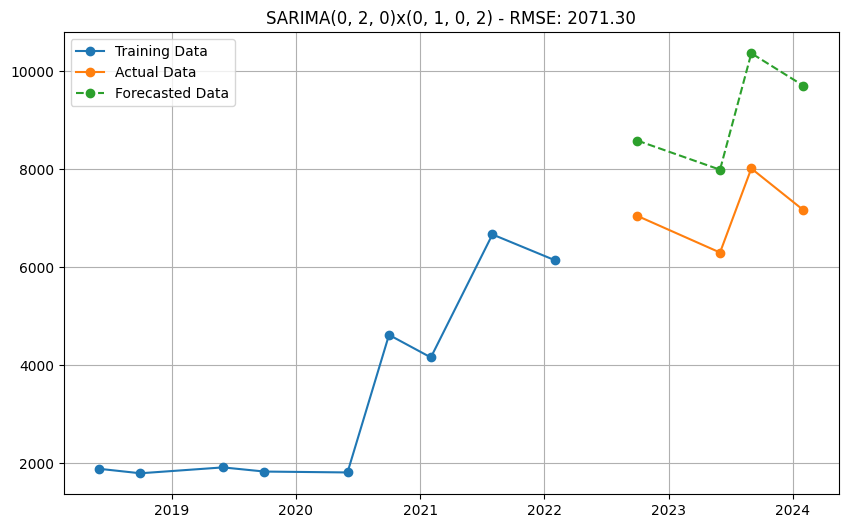

Model: SARIMA(0, 2, 0)x(0, 1, 0, 2) - AIC: 92.29 - RMSE: 2071.30
New best model found: SARIMA(0, 2, 0)x(0, 1, 0, 2) - AIC: 92.29


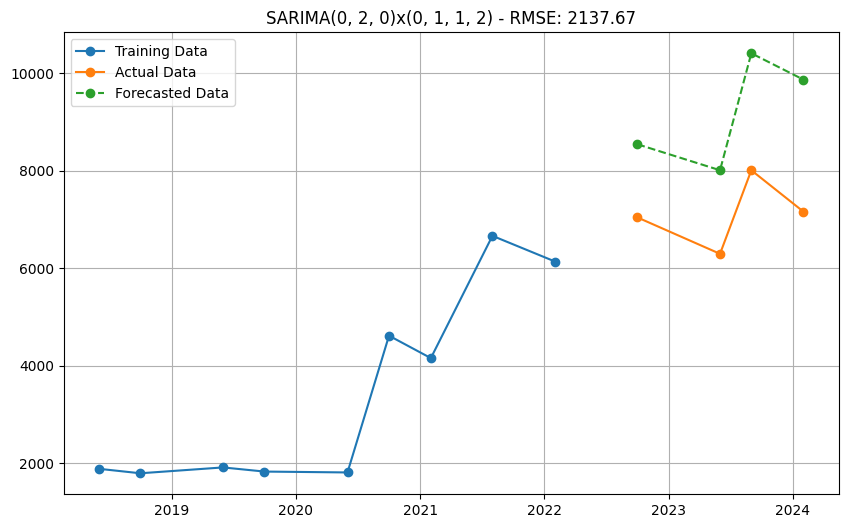

Model: SARIMA(0, 2, 0)x(0, 1, 1, 2) - AIC: 94.25 - RMSE: 2137.67


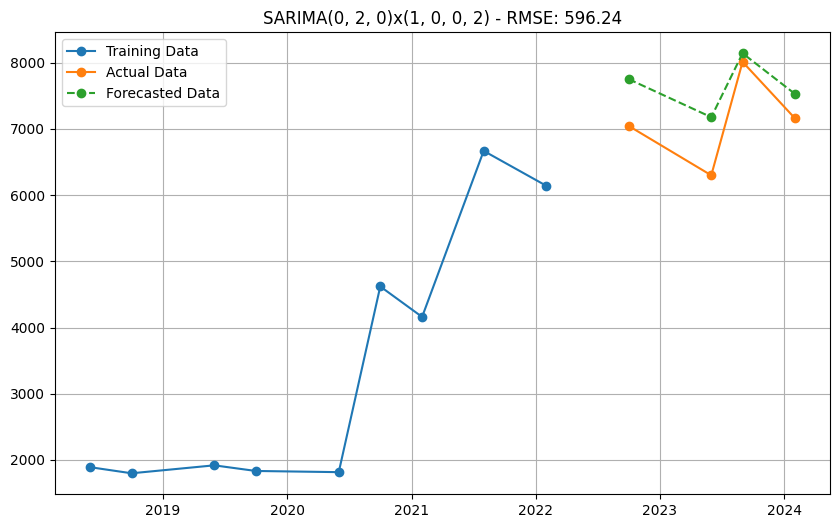

Model: SARIMA(0, 2, 0)x(1, 0, 0, 2) - AIC: 128.98 - RMSE: 596.24


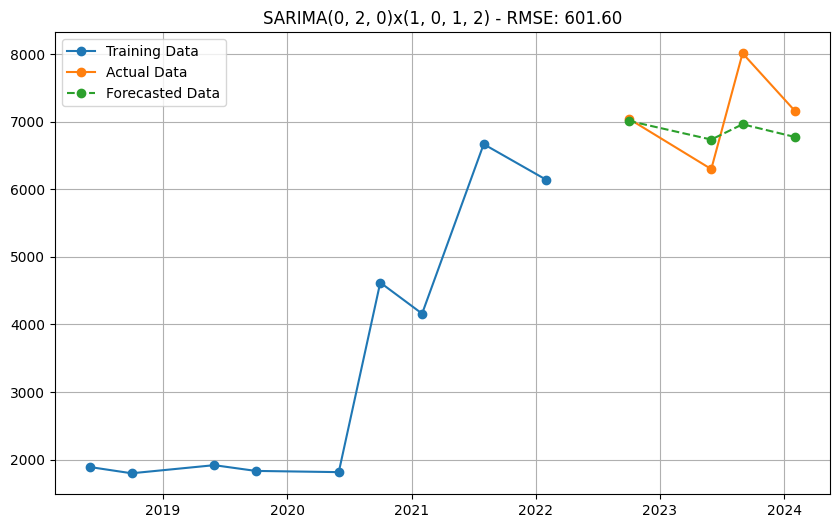

Model: SARIMA(0, 2, 0)x(1, 0, 1, 2) - AIC: 130.14 - RMSE: 601.60


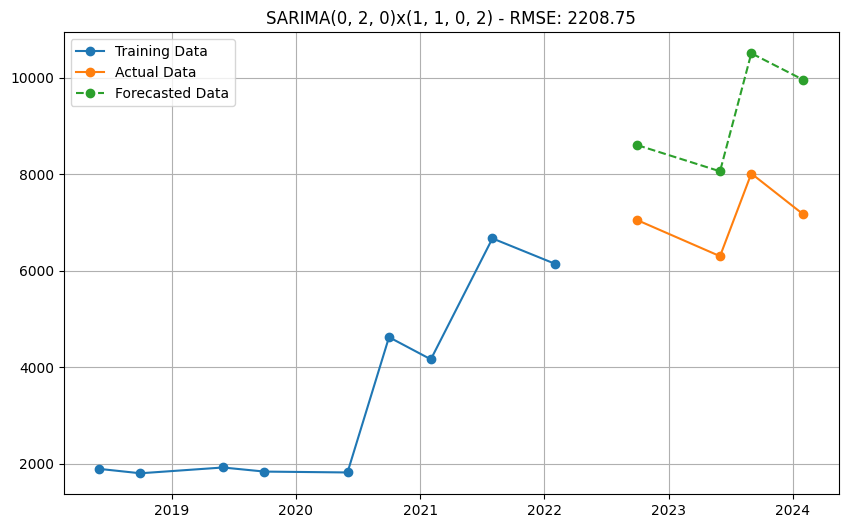

Model: SARIMA(0, 2, 0)x(1, 1, 0, 2) - AIC: 94.18 - RMSE: 2208.75


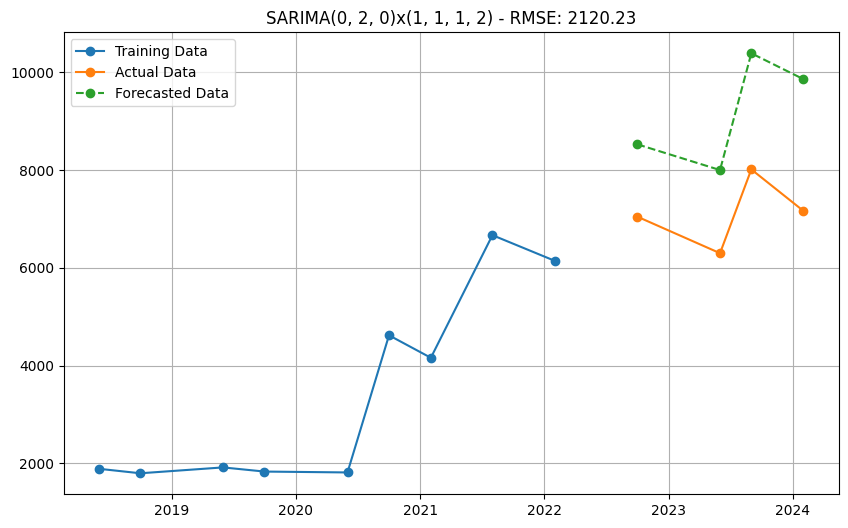

Model: SARIMA(0, 2, 0)x(1, 1, 1, 2) - AIC: 96.17 - RMSE: 2120.23


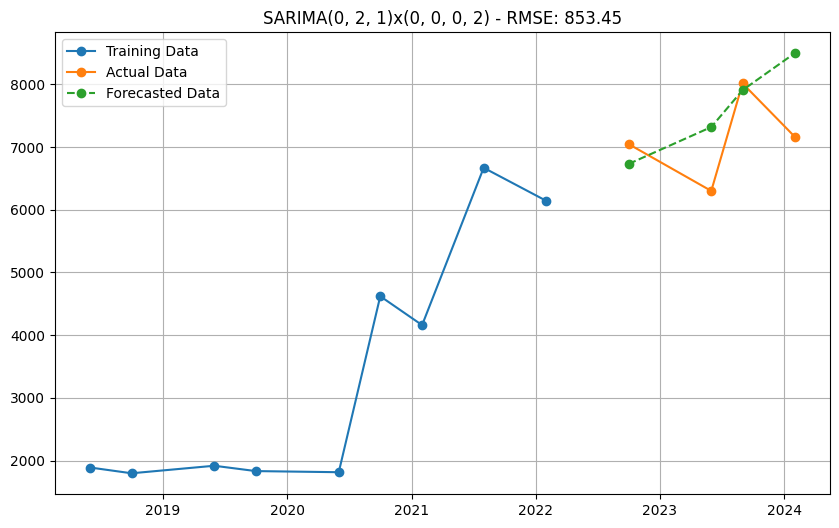

Model: SARIMA(0, 2, 1)x(0, 0, 0, 2) - AIC: 125.76 - RMSE: 853.45


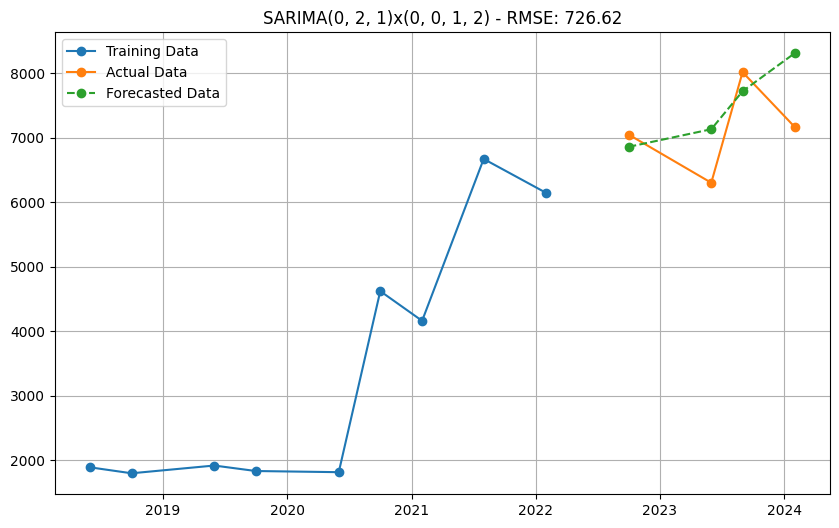

Model: SARIMA(0, 2, 1)x(0, 0, 1, 2) - AIC: 124.93 - RMSE: 726.62


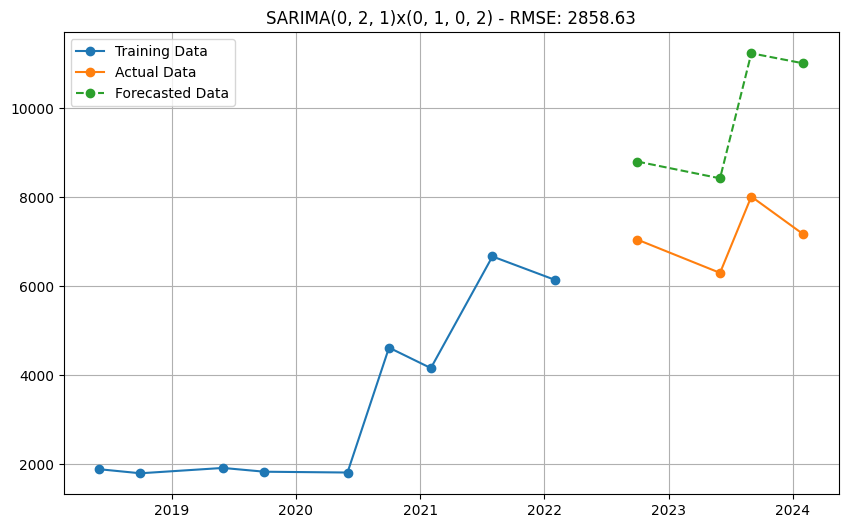

Model: SARIMA(0, 2, 1)x(0, 1, 0, 2) - AIC: 91.00 - RMSE: 2858.63
New best model found: SARIMA(0, 2, 1)x(0, 1, 0, 2) - AIC: 91.00


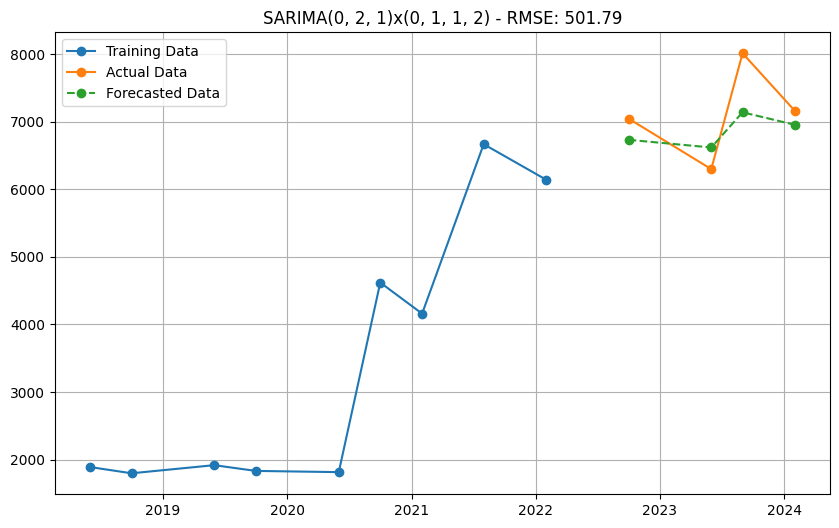

Model: SARIMA(0, 2, 1)x(0, 1, 1, 2) - AIC: 95.63 - RMSE: 501.79


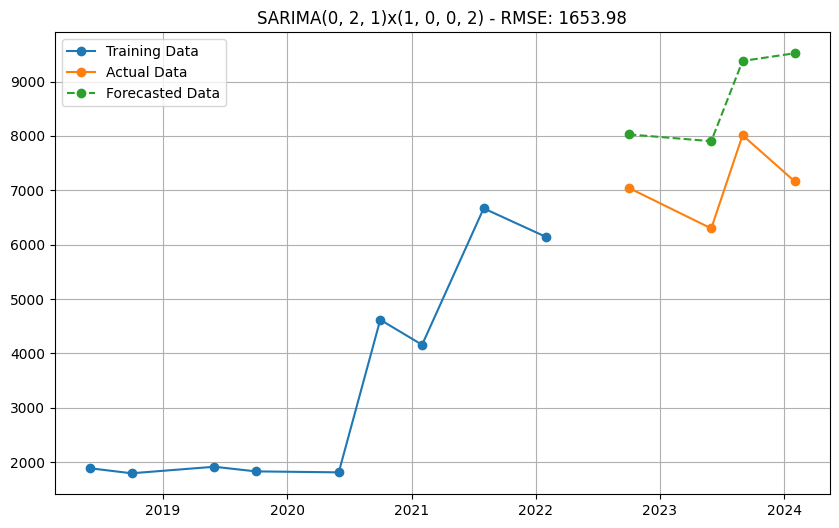

Model: SARIMA(0, 2, 1)x(1, 0, 0, 2) - AIC: 125.15 - RMSE: 1653.98


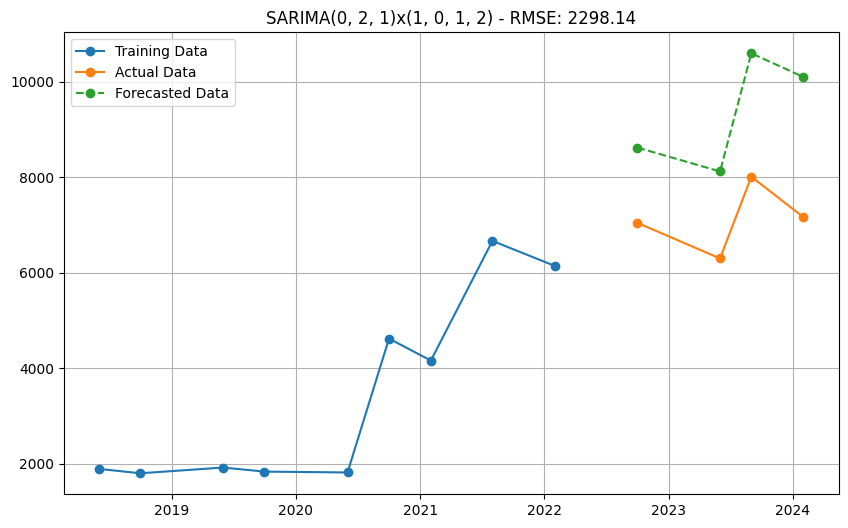

Model: SARIMA(0, 2, 1)x(1, 0, 1, 2) - AIC: 128.27 - RMSE: 2298.14


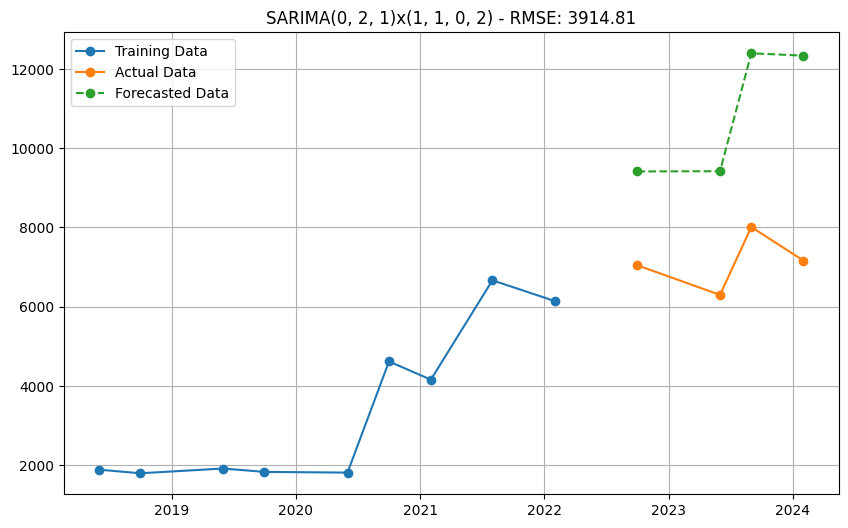

Model: SARIMA(0, 2, 1)x(1, 1, 0, 2) - AIC: 97.21 - RMSE: 3914.81


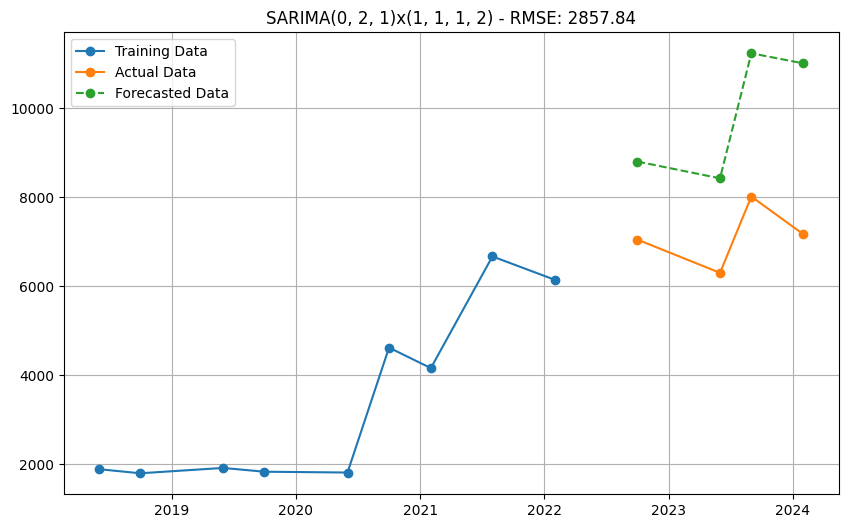

Model: SARIMA(0, 2, 1)x(1, 1, 1, 2) - AIC: 95.00 - RMSE: 2857.84


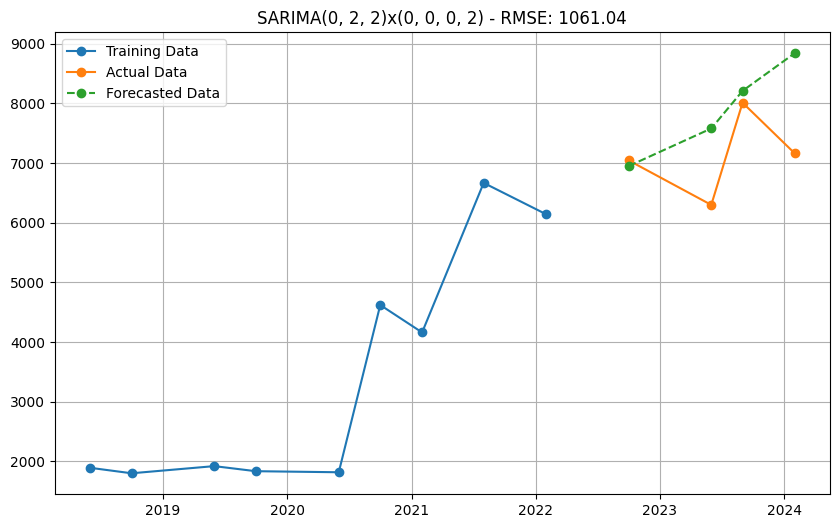

Model: SARIMA(0, 2, 2)x(0, 0, 0, 2) - AIC: 126.33 - RMSE: 1061.04
Failed to fit SARIMA(0, 2, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


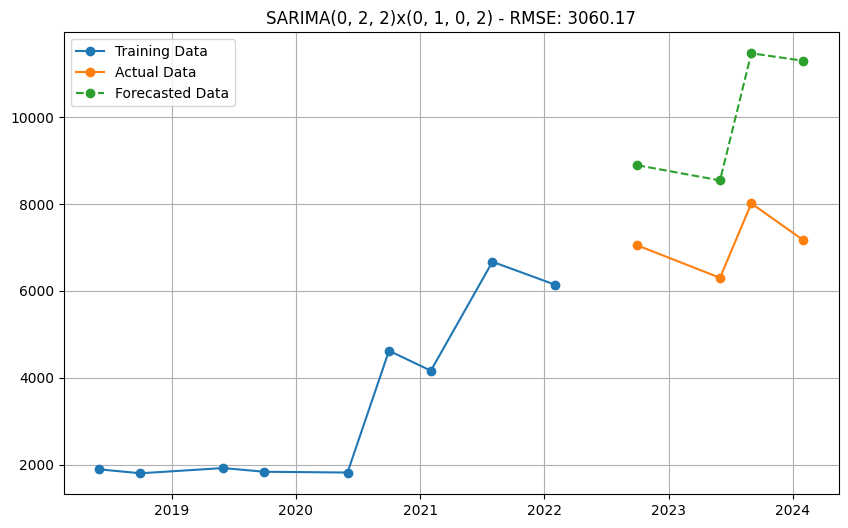

Model: SARIMA(0, 2, 2)x(0, 1, 0, 2) - AIC: 92.90 - RMSE: 3060.17
Failed to fit SARIMA(0, 2, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


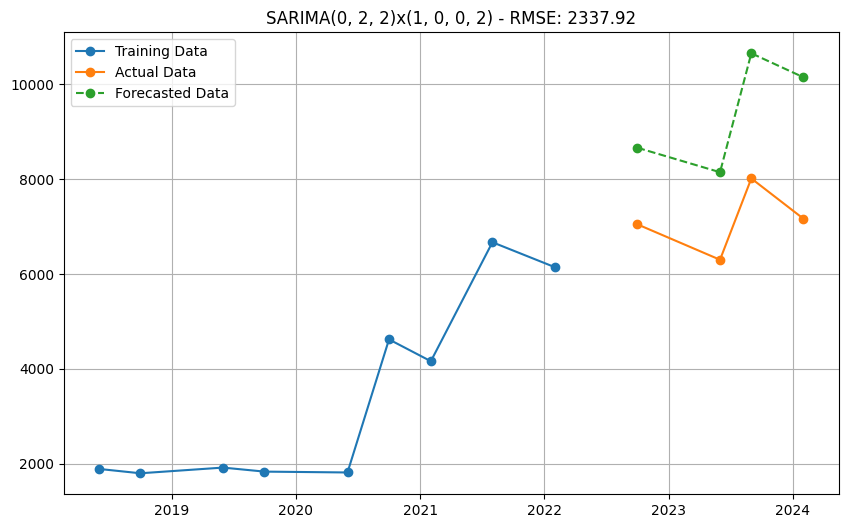

Model: SARIMA(0, 2, 2)x(1, 0, 0, 2) - AIC: 129.09 - RMSE: 2337.92
Failed to fit SARIMA(0, 2, 2)x(1, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


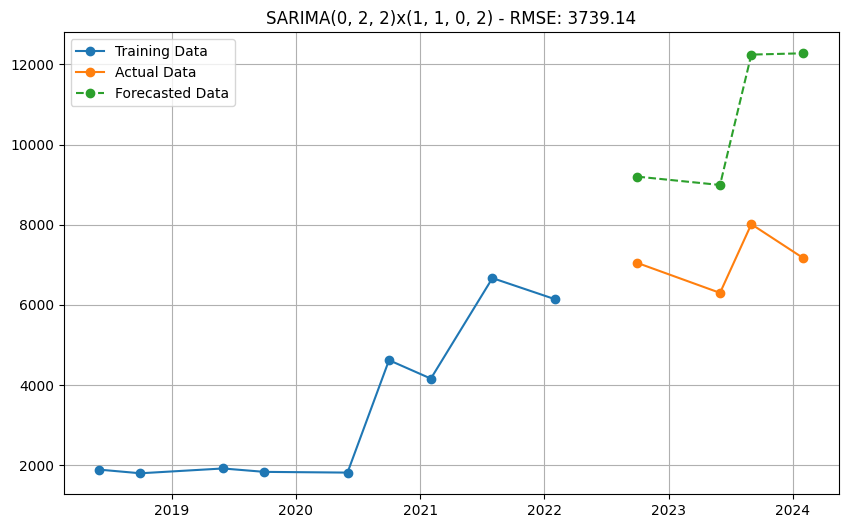

Model: SARIMA(0, 2, 2)x(1, 1, 0, 2) - AIC: 94.79 - RMSE: 3739.14
Failed to fit SARIMA(0, 2, 2)x(1, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


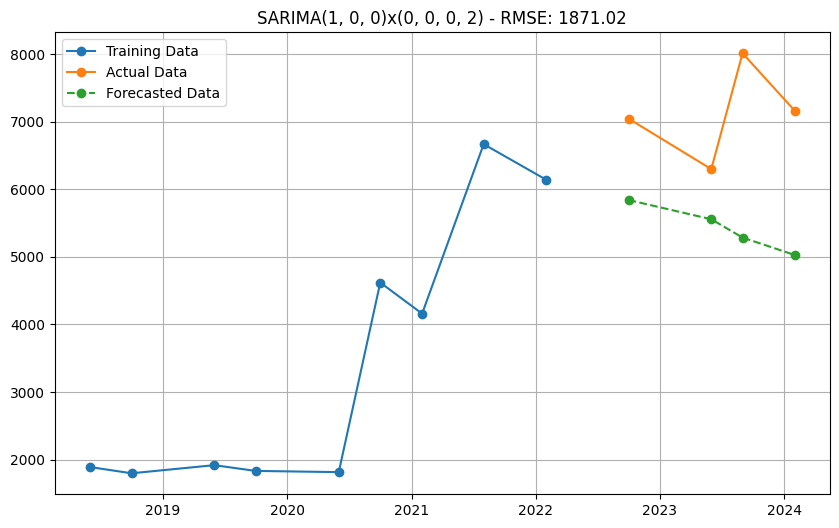

Model: SARIMA(1, 0, 0)x(0, 0, 0, 2) - AIC: 161.53 - RMSE: 1871.02


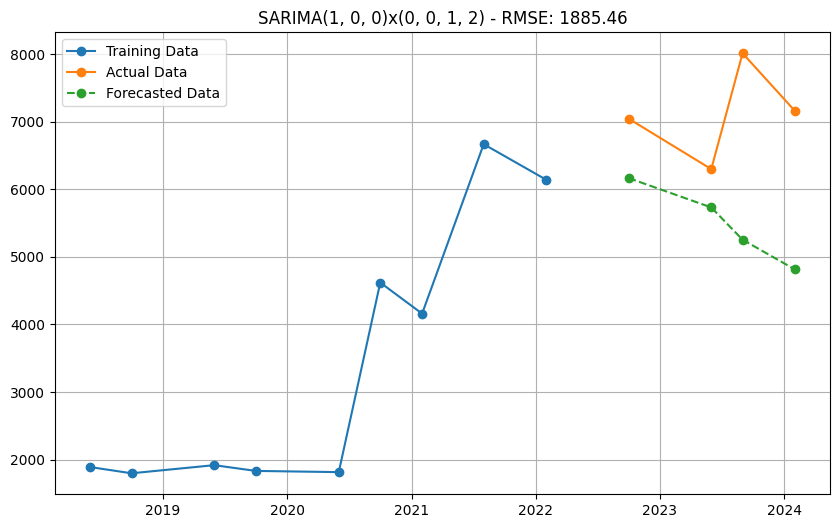

Model: SARIMA(1, 0, 0)x(0, 0, 1, 2) - AIC: 159.78 - RMSE: 1885.46


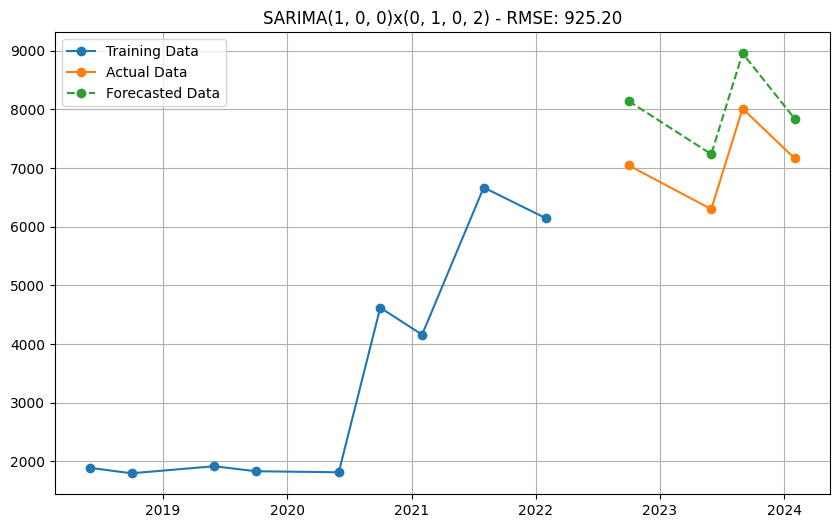

Model: SARIMA(1, 0, 0)x(0, 1, 0, 2) - AIC: 123.00 - RMSE: 925.20


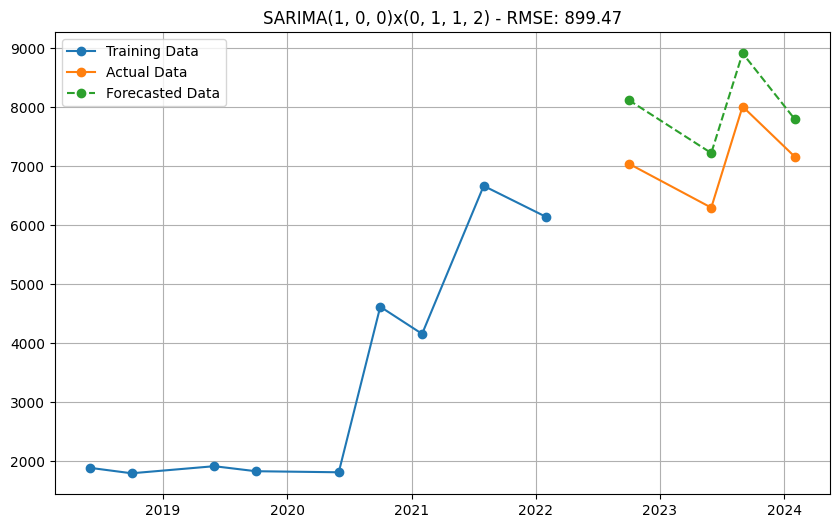

Model: SARIMA(1, 0, 0)x(0, 1, 1, 2) - AIC: 124.99 - RMSE: 899.47


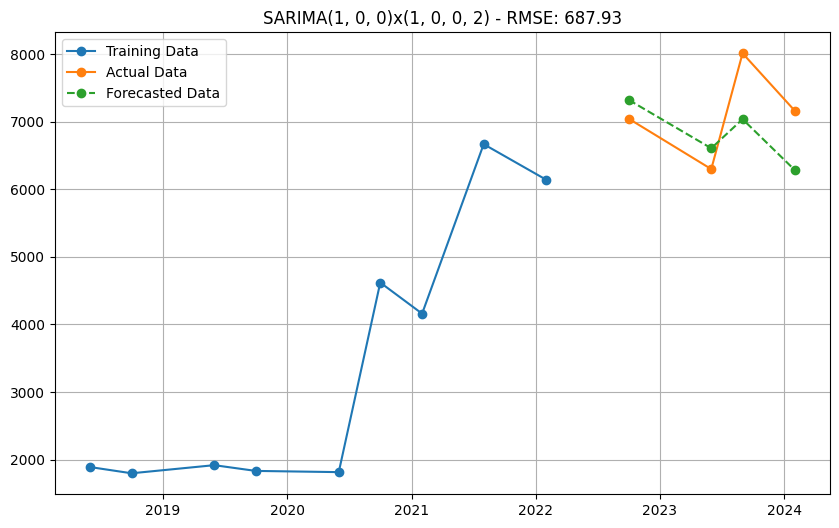

Model: SARIMA(1, 0, 0)x(1, 0, 0, 2) - AIC: 160.70 - RMSE: 687.93


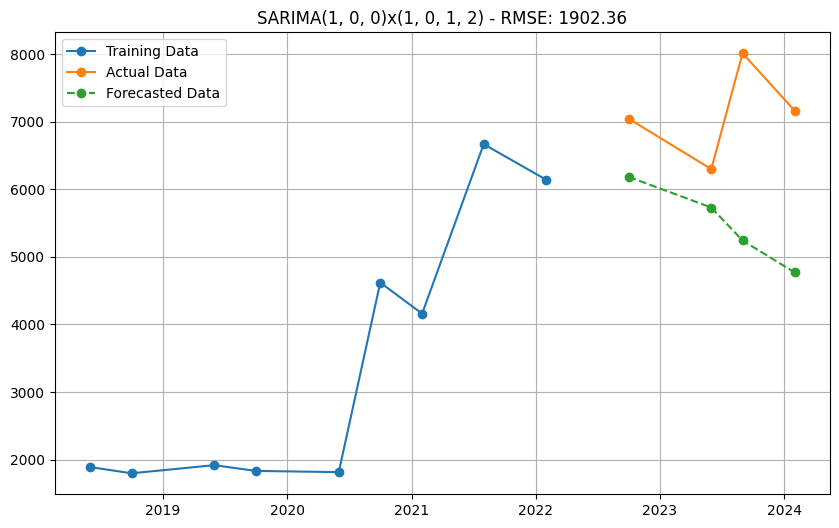

Model: SARIMA(1, 0, 0)x(1, 0, 1, 2) - AIC: 161.75 - RMSE: 1902.36


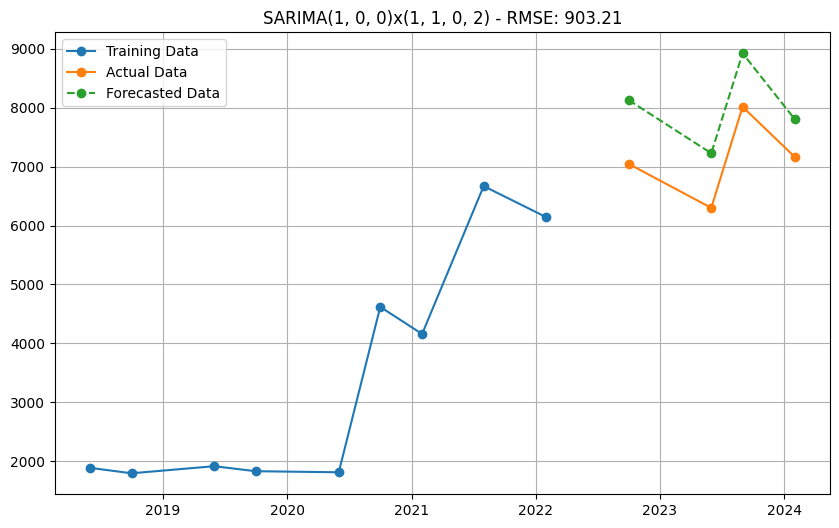

Model: SARIMA(1, 0, 0)x(1, 1, 0, 2) - AIC: 124.99 - RMSE: 903.21


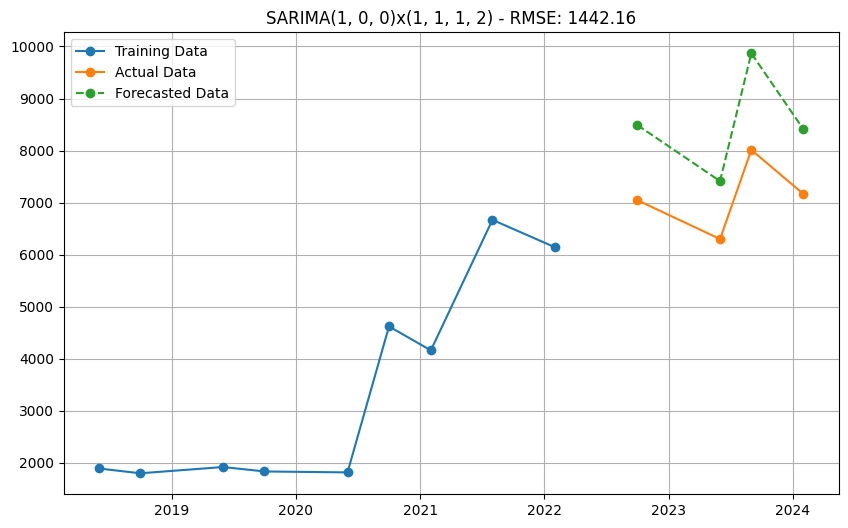

Model: SARIMA(1, 0, 0)x(1, 1, 1, 2) - AIC: 126.59 - RMSE: 1442.16


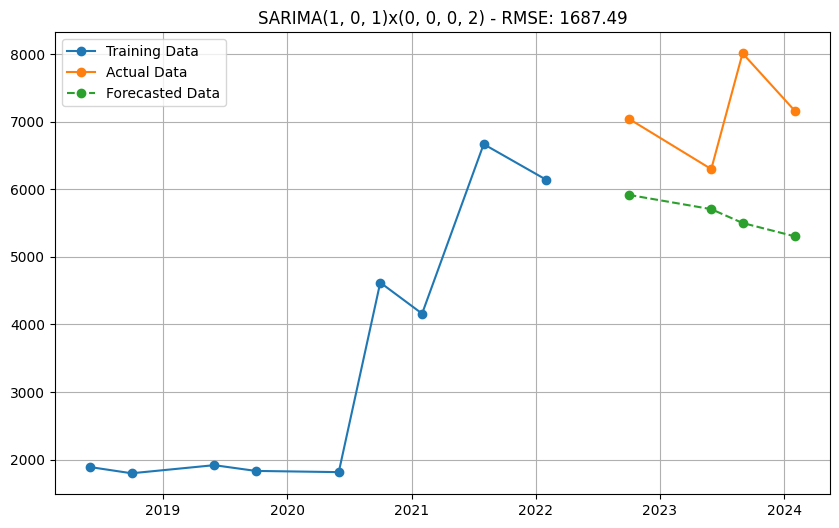

Model: SARIMA(1, 0, 1)x(0, 0, 0, 2) - AIC: 163.32 - RMSE: 1687.49


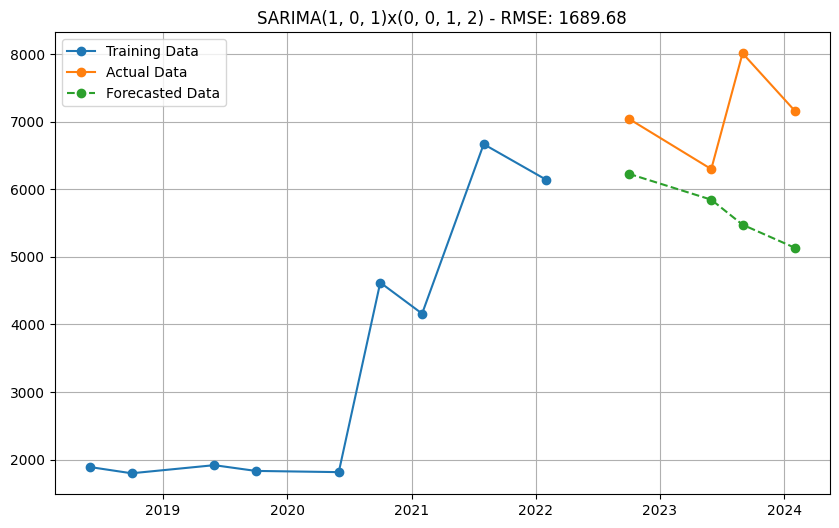

Model: SARIMA(1, 0, 1)x(0, 0, 1, 2) - AIC: 161.66 - RMSE: 1689.68


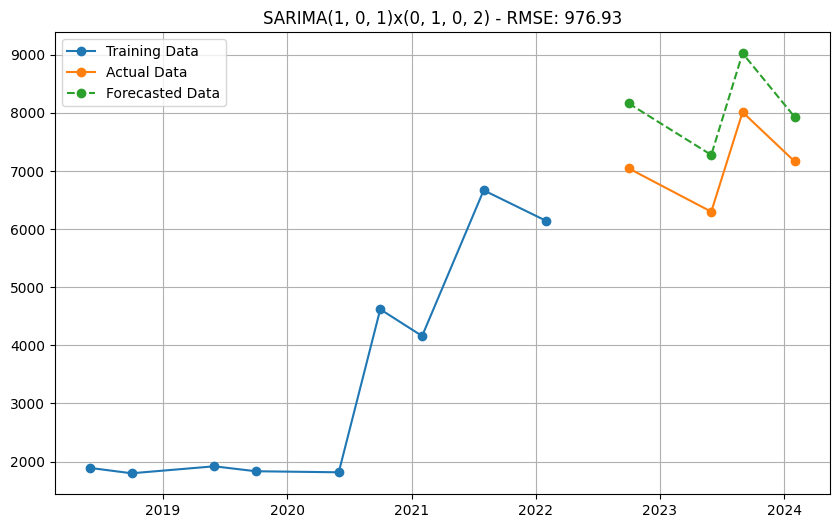

Model: SARIMA(1, 0, 1)x(0, 1, 0, 2) - AIC: 124.99 - RMSE: 976.93


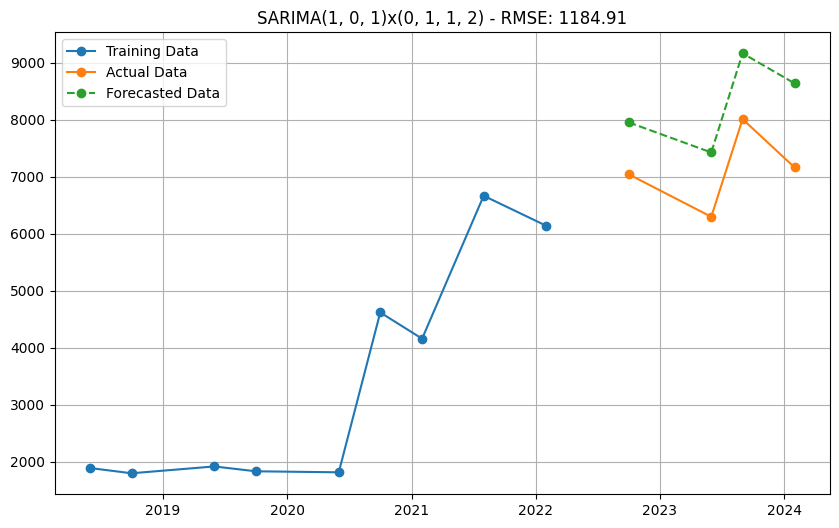

Model: SARIMA(1, 0, 1)x(0, 1, 1, 2) - AIC: 128.24 - RMSE: 1184.91


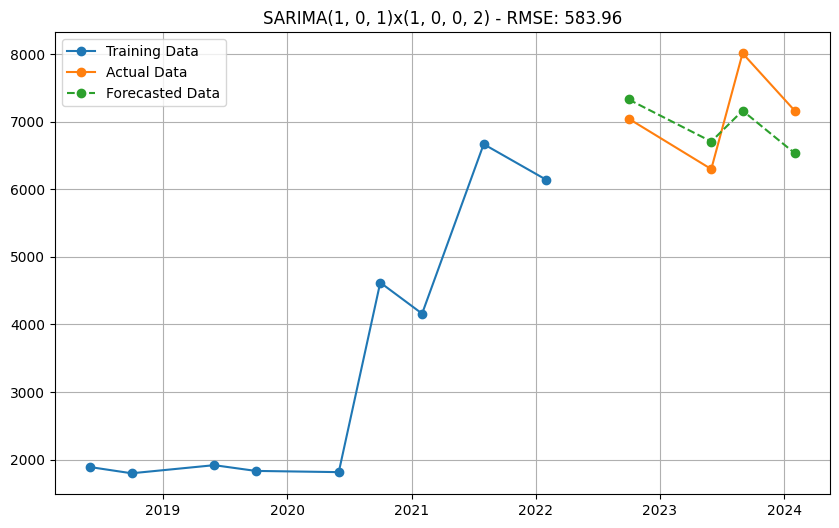

Model: SARIMA(1, 0, 1)x(1, 0, 0, 2) - AIC: 162.65 - RMSE: 583.96


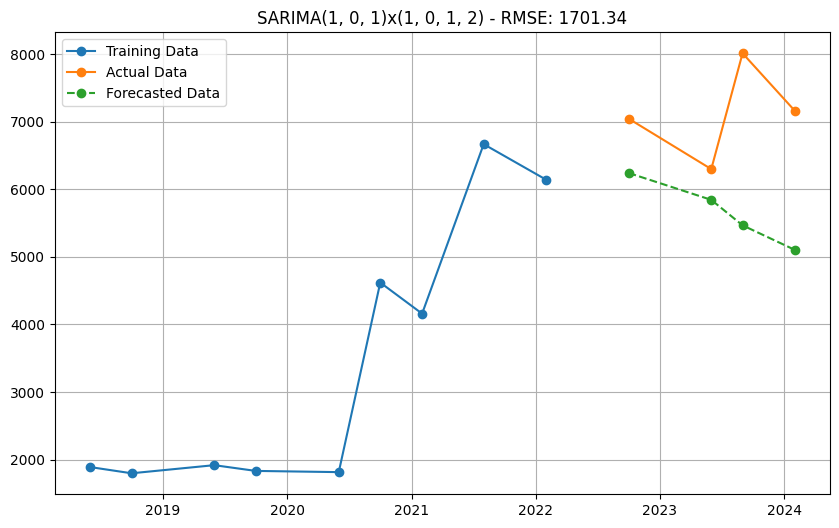

Model: SARIMA(1, 0, 1)x(1, 0, 1, 2) - AIC: 163.66 - RMSE: 1701.34


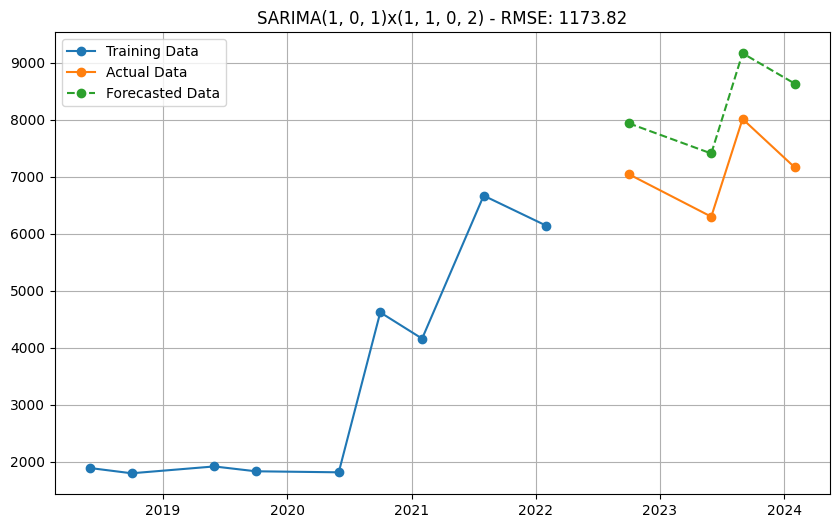

Model: SARIMA(1, 0, 1)x(1, 1, 0, 2) - AIC: 128.26 - RMSE: 1173.82


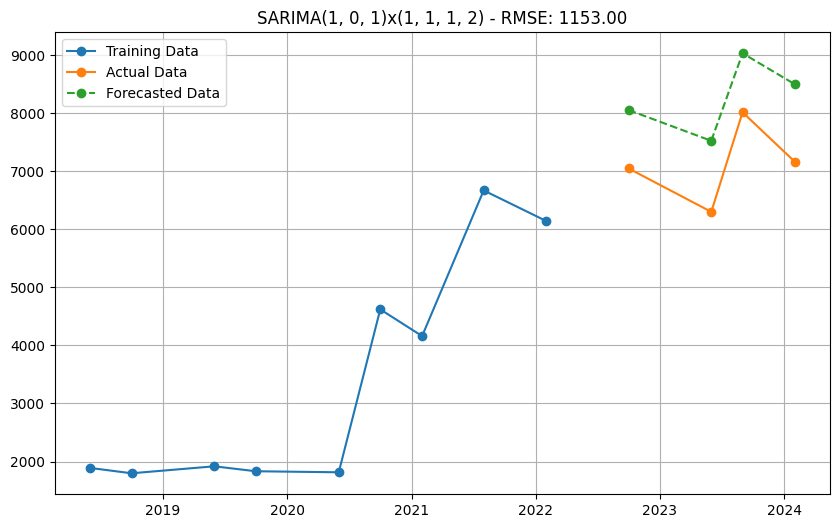

Model: SARIMA(1, 0, 1)x(1, 1, 1, 2) - AIC: 129.22 - RMSE: 1153.00


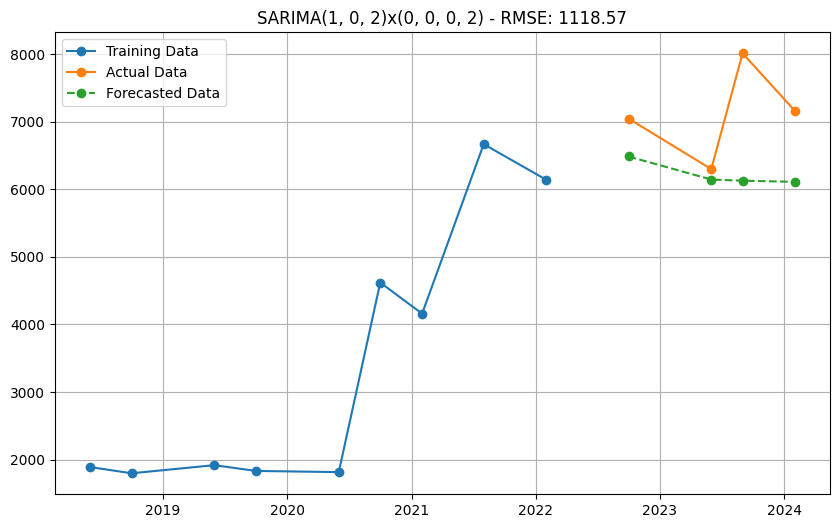

Model: SARIMA(1, 0, 2)x(0, 0, 0, 2) - AIC: 540.80 - RMSE: 1118.57
Failed to fit SARIMA(1, 0, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


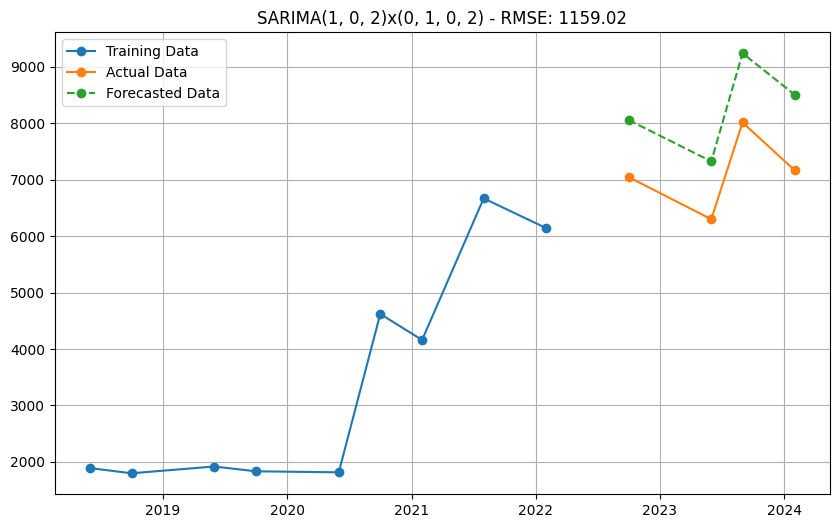

Model: SARIMA(1, 0, 2)x(0, 1, 0, 2) - AIC: 126.77 - RMSE: 1159.02
Failed to fit SARIMA(1, 0, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


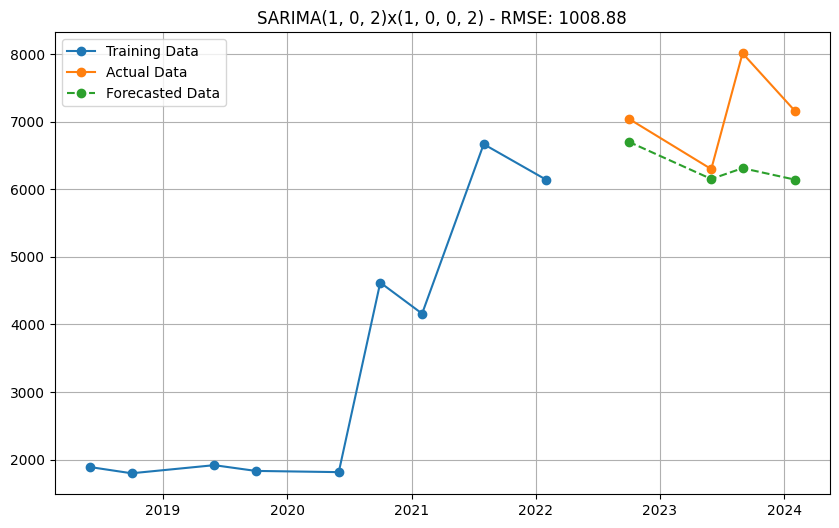

Model: SARIMA(1, 0, 2)x(1, 0, 0, 2) - AIC: 584.94 - RMSE: 1008.88
Failed to fit SARIMA(1, 0, 2)x(1, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


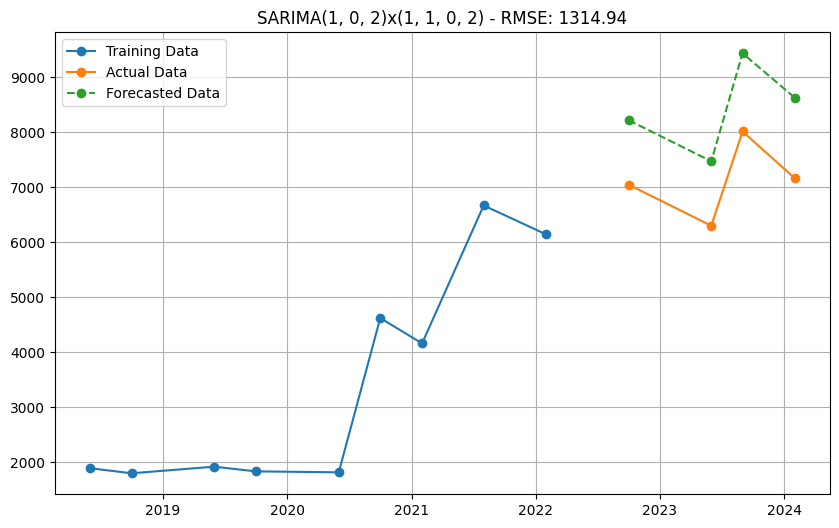

Model: SARIMA(1, 0, 2)x(1, 1, 0, 2) - AIC: 128.47 - RMSE: 1314.94
Failed to fit SARIMA(1, 0, 2)x(1, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


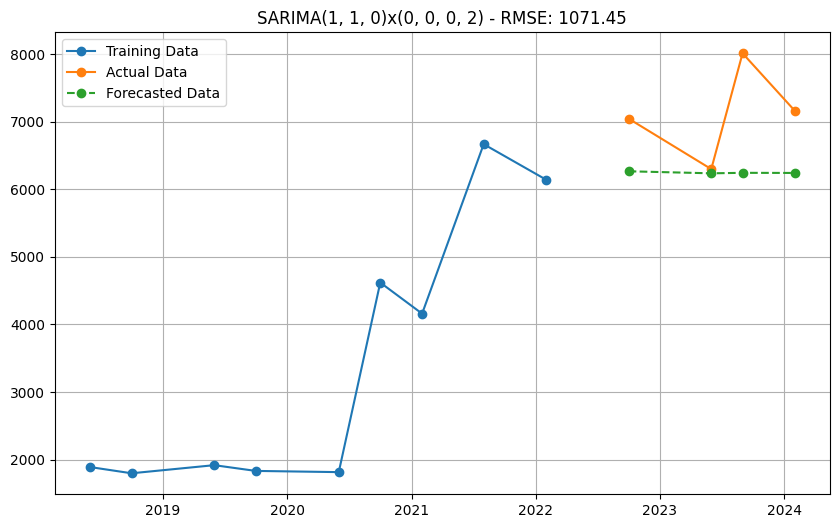

Model: SARIMA(1, 1, 0)x(0, 0, 0, 2) - AIC: 141.55 - RMSE: 1071.45


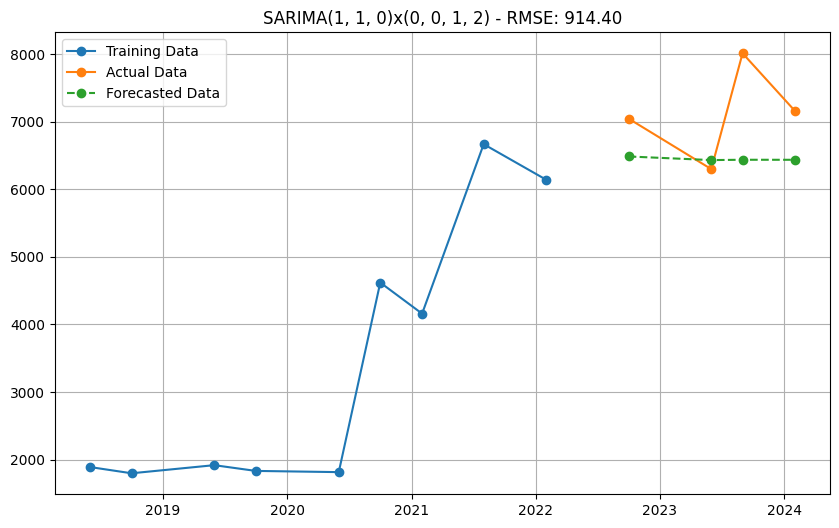

Model: SARIMA(1, 1, 0)x(0, 0, 1, 2) - AIC: 140.58 - RMSE: 914.40


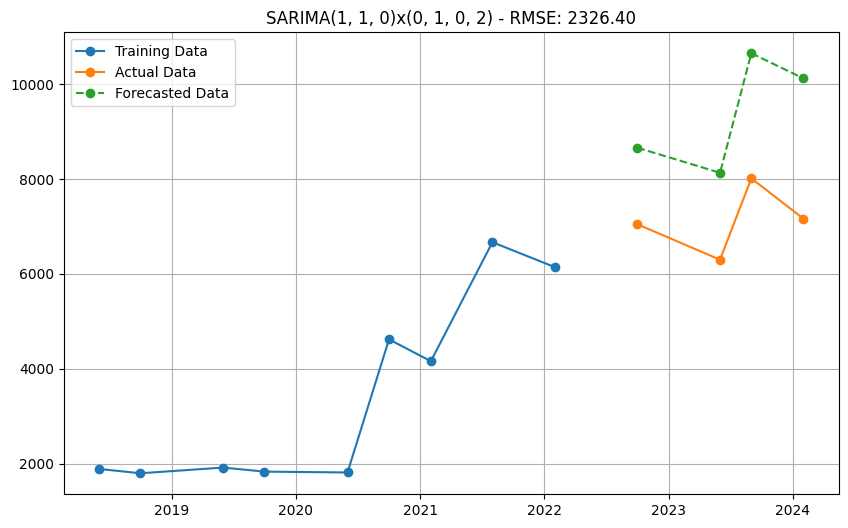

Model: SARIMA(1, 1, 0)x(0, 1, 0, 2) - AIC: 105.95 - RMSE: 2326.40


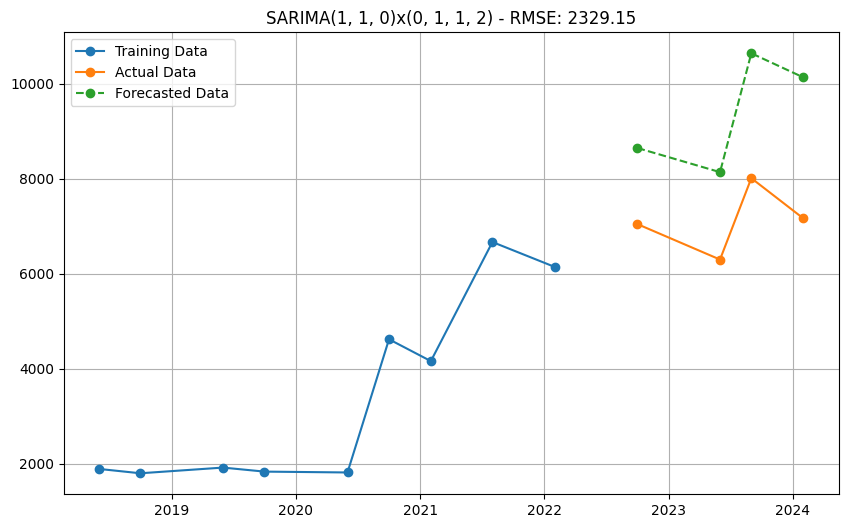

Model: SARIMA(1, 1, 0)x(0, 1, 1, 2) - AIC: 107.79 - RMSE: 2329.15


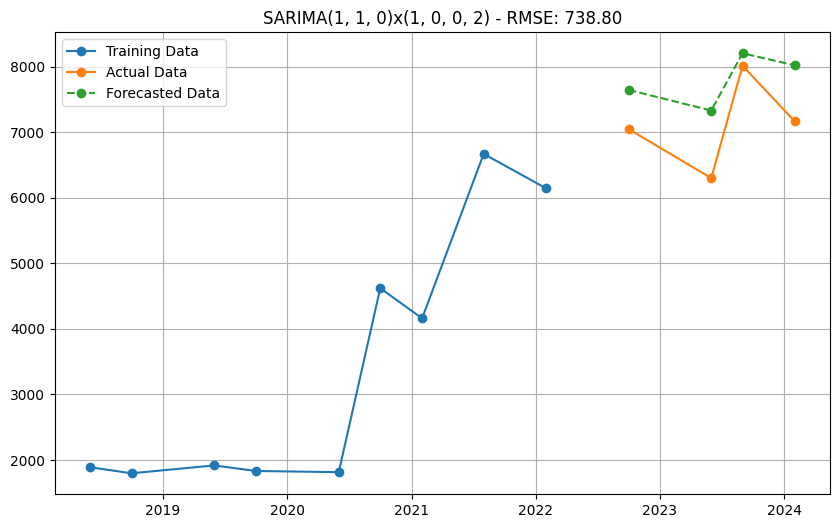

Model: SARIMA(1, 1, 0)x(1, 0, 0, 2) - AIC: 140.82 - RMSE: 738.80


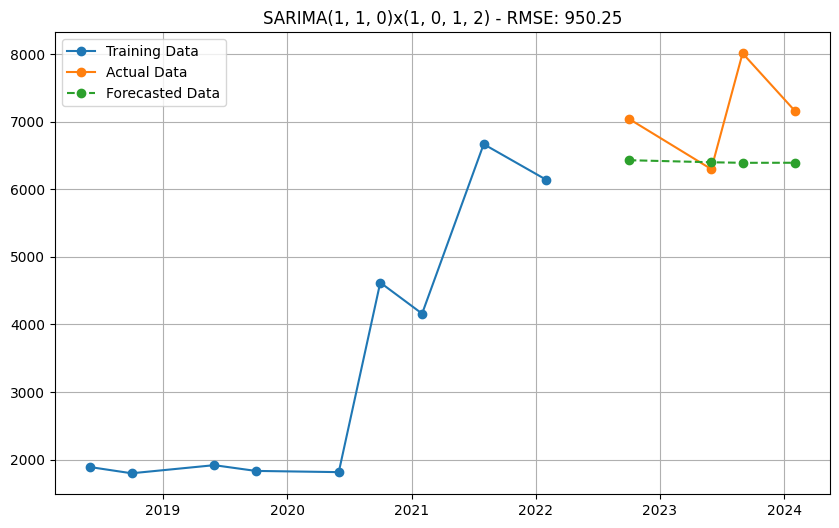

Model: SARIMA(1, 1, 0)x(1, 0, 1, 2) - AIC: 142.57 - RMSE: 950.25


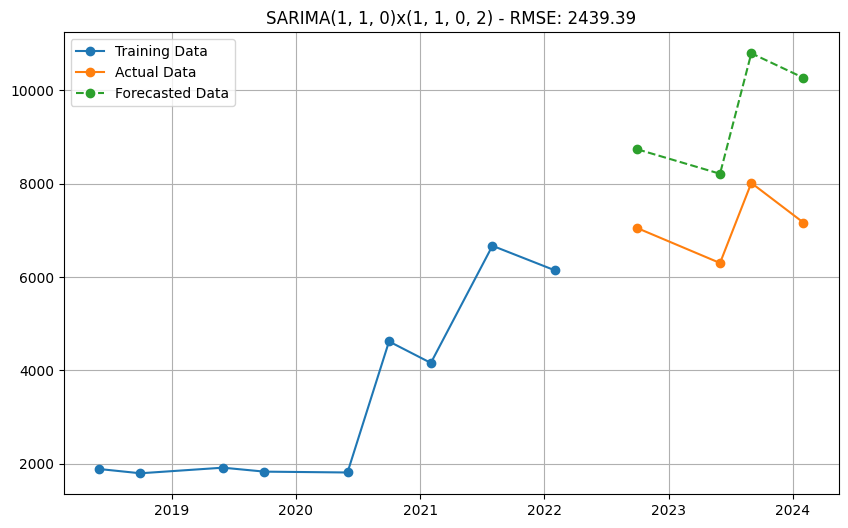

Model: SARIMA(1, 1, 0)x(1, 1, 0, 2) - AIC: 107.80 - RMSE: 2439.39


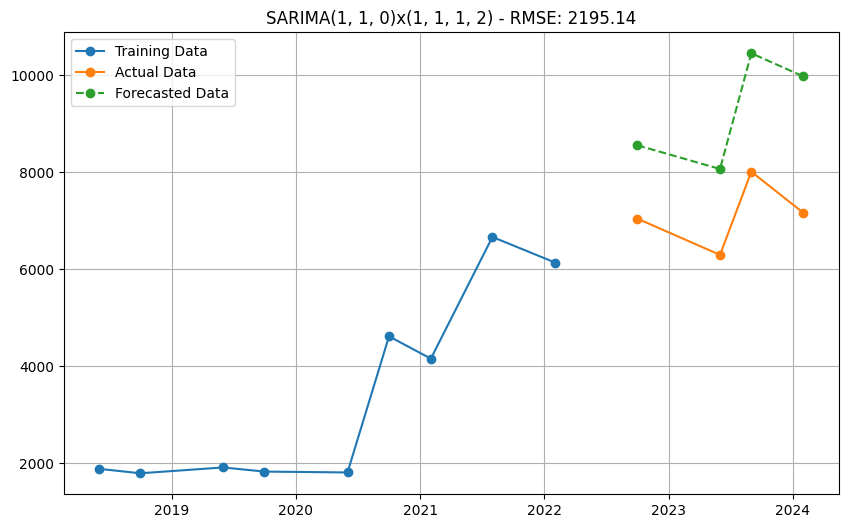

Model: SARIMA(1, 1, 0)x(1, 1, 1, 2) - AIC: 109.79 - RMSE: 2195.14


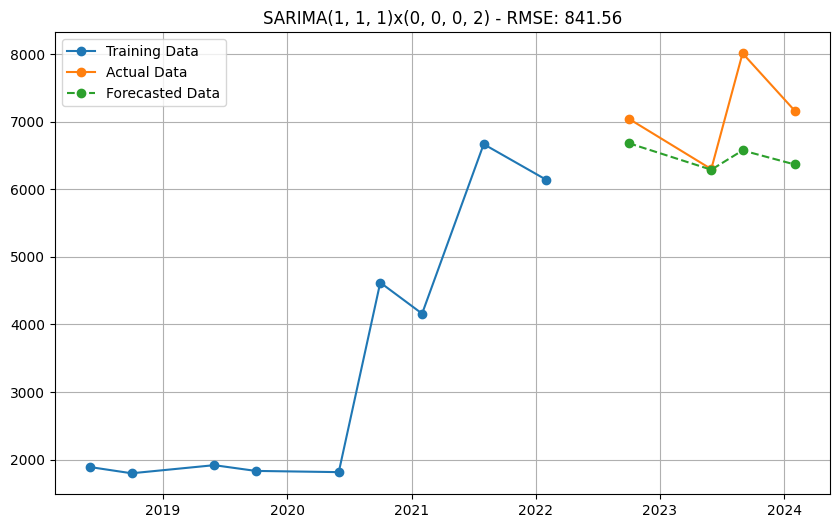

Model: SARIMA(1, 1, 1)x(0, 0, 0, 2) - AIC: 142.91 - RMSE: 841.56


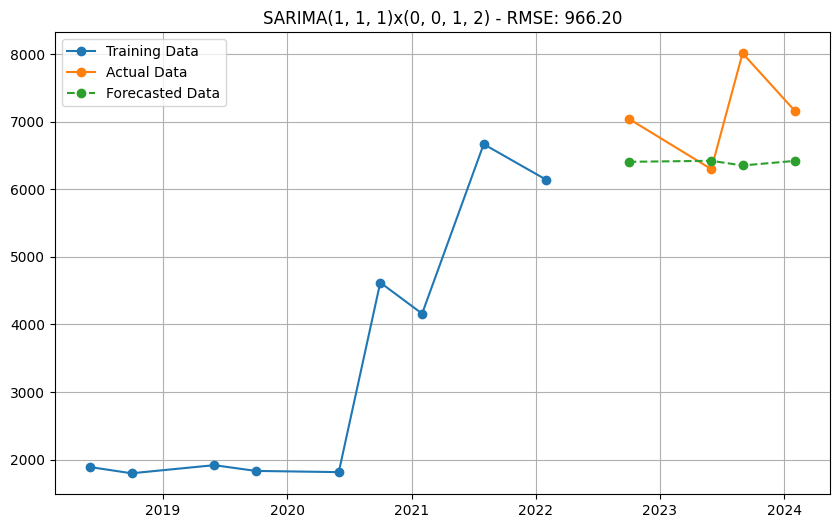

Model: SARIMA(1, 1, 1)x(0, 0, 1, 2) - AIC: 142.65 - RMSE: 966.20


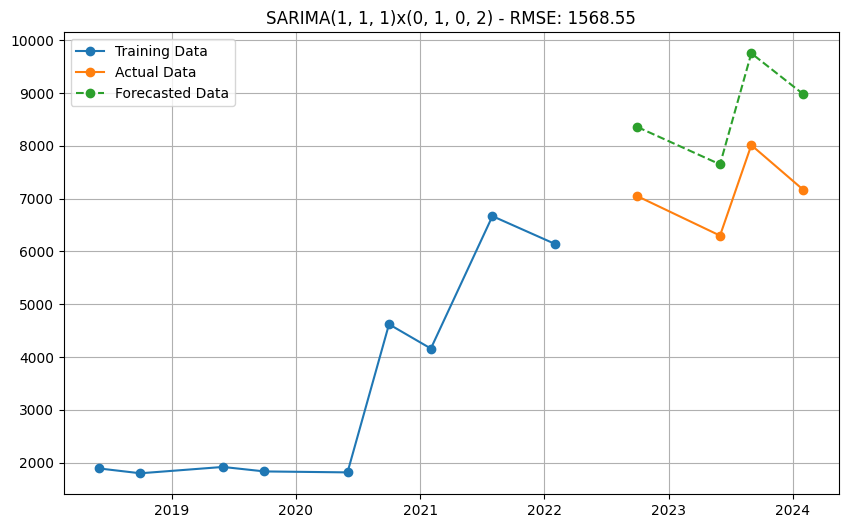

Model: SARIMA(1, 1, 1)x(0, 1, 0, 2) - AIC: 107.52 - RMSE: 1568.55


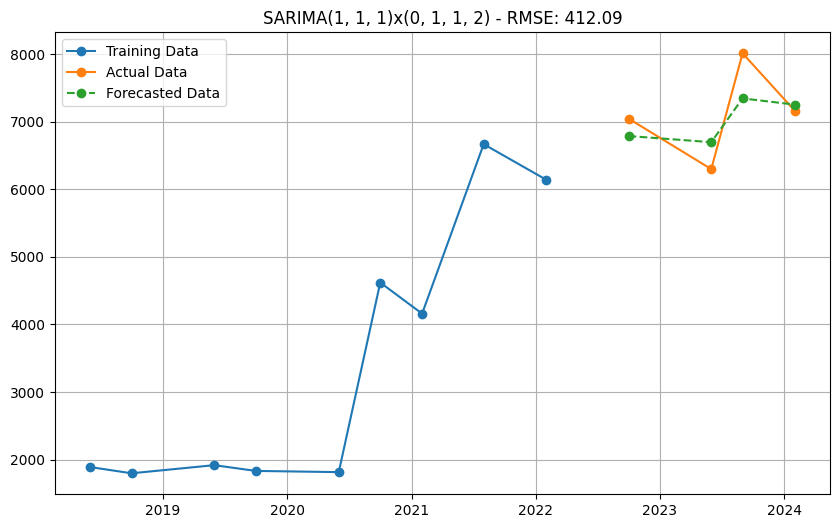

Model: SARIMA(1, 1, 1)x(0, 1, 1, 2) - AIC: 113.88 - RMSE: 412.09


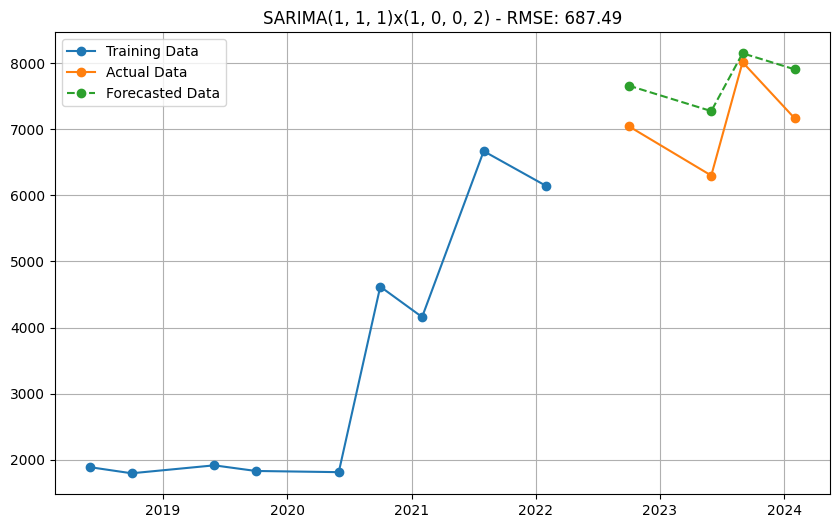

Model: SARIMA(1, 1, 1)x(1, 0, 0, 2) - AIC: 142.70 - RMSE: 687.49


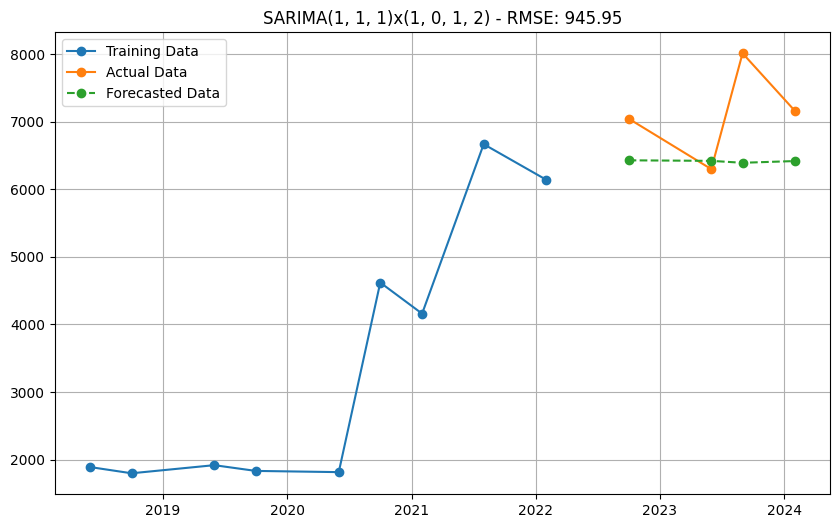

Model: SARIMA(1, 1, 1)x(1, 0, 1, 2) - AIC: 144.65 - RMSE: 945.95


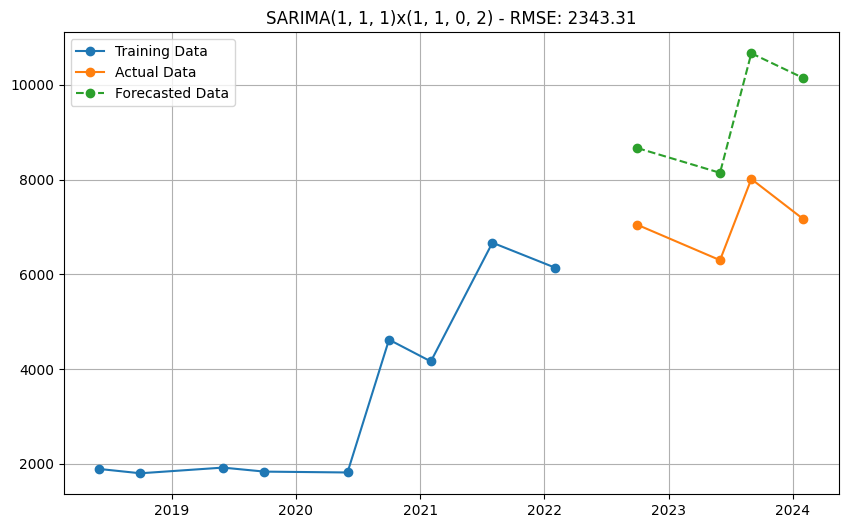

Model: SARIMA(1, 1, 1)x(1, 1, 0, 2) - AIC: 110.09 - RMSE: 2343.31


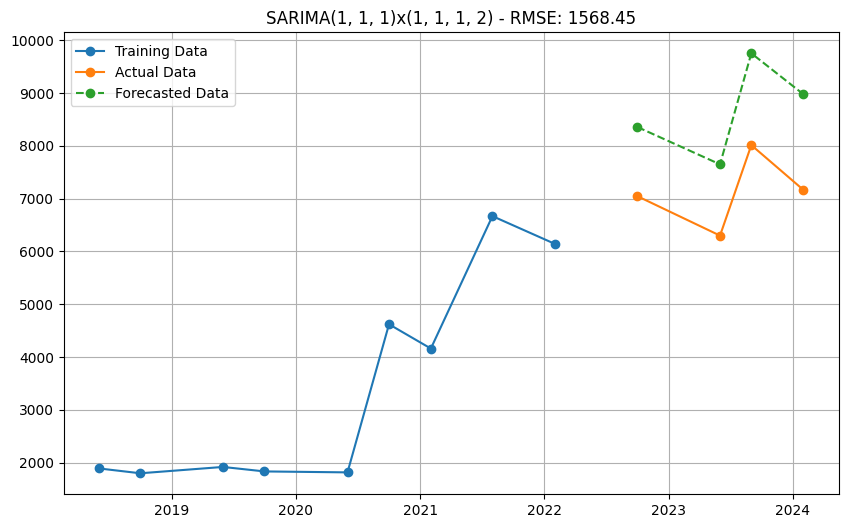

Model: SARIMA(1, 1, 1)x(1, 1, 1, 2) - AIC: 111.52 - RMSE: 1568.45


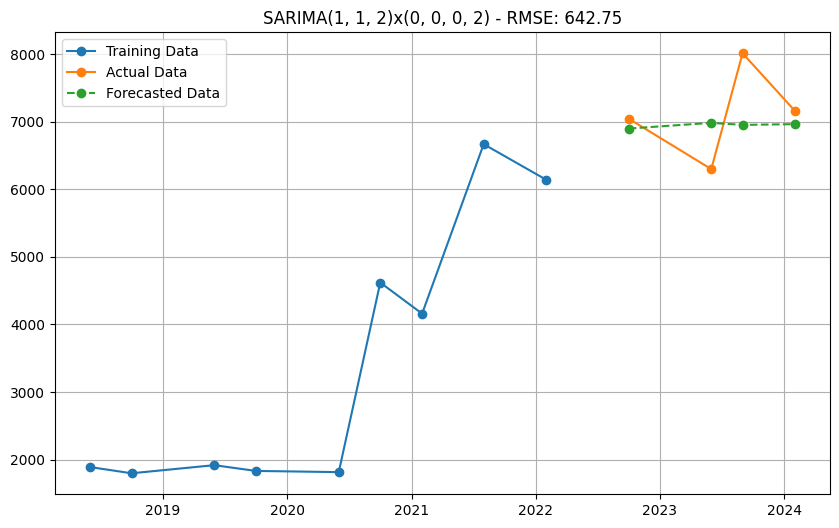

Model: SARIMA(1, 1, 2)x(0, 0, 0, 2) - AIC: 142.28 - RMSE: 642.75
Failed to fit SARIMA(1, 1, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


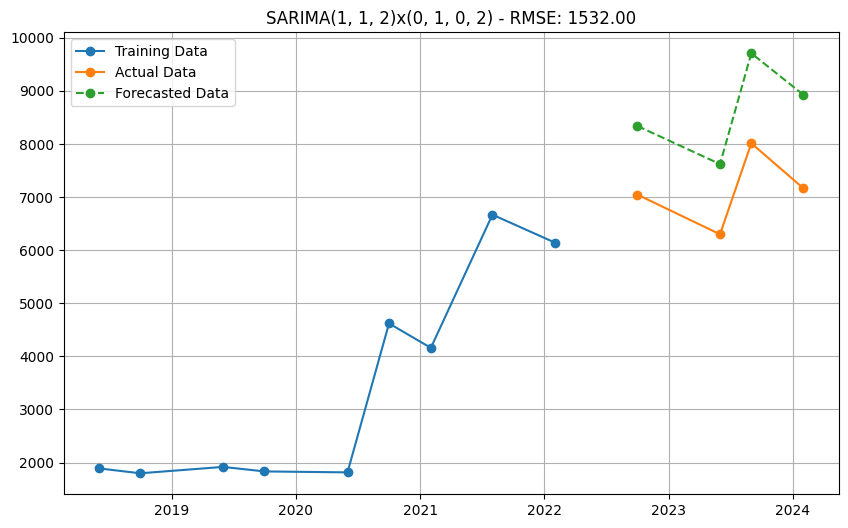

Model: SARIMA(1, 1, 2)x(0, 1, 0, 2) - AIC: 109.52 - RMSE: 1532.00
Failed to fit SARIMA(1, 1, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


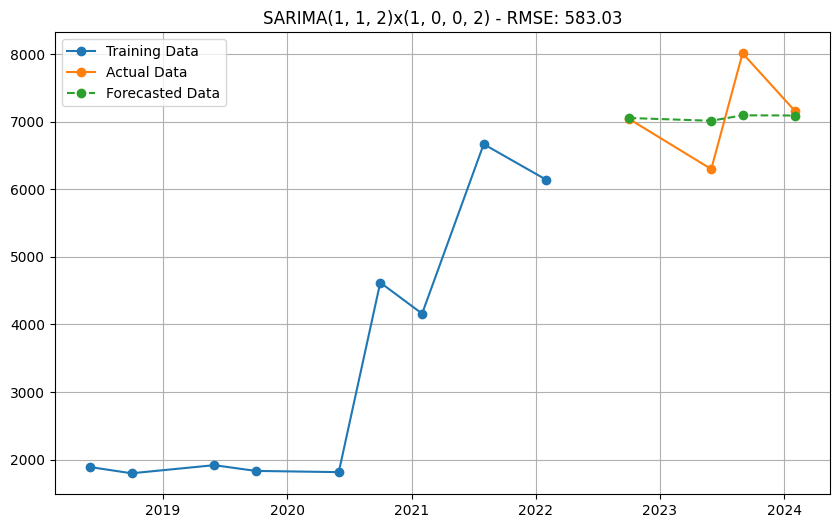

Model: SARIMA(1, 1, 2)x(1, 0, 0, 2) - AIC: 144.27 - RMSE: 583.03
Failed to fit SARIMA(1, 1, 2)x(1, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


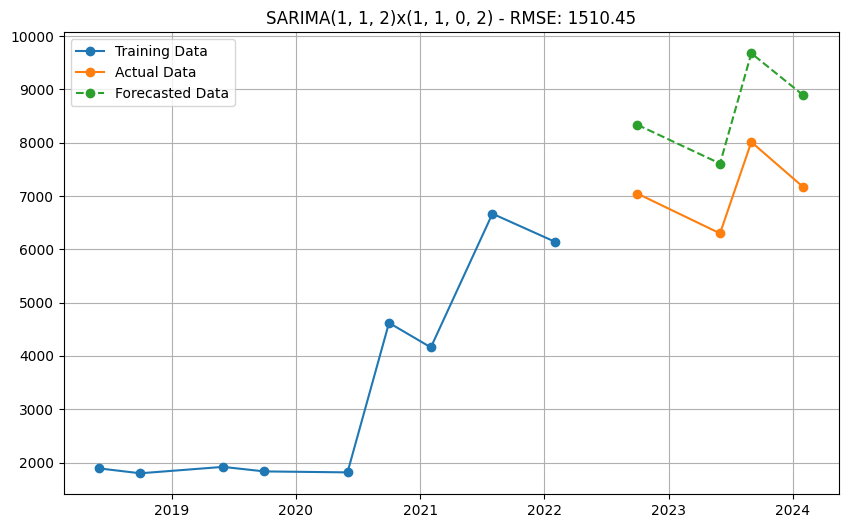

Model: SARIMA(1, 1, 2)x(1, 1, 0, 2) - AIC: 111.43 - RMSE: 1510.45
Failed to fit SARIMA(1, 1, 2)x(1, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


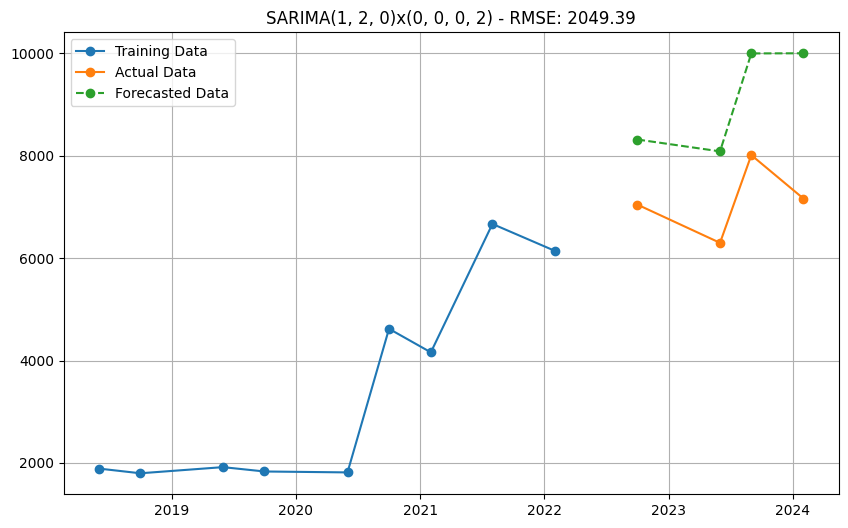

Model: SARIMA(1, 2, 0)x(0, 0, 0, 2) - AIC: 123.63 - RMSE: 2049.39


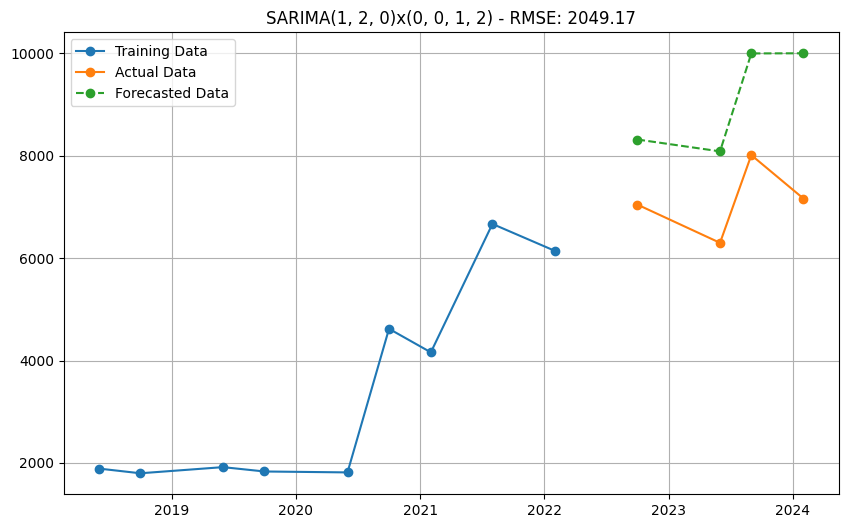

Model: SARIMA(1, 2, 0)x(0, 0, 1, 2) - AIC: 125.63 - RMSE: 2049.17


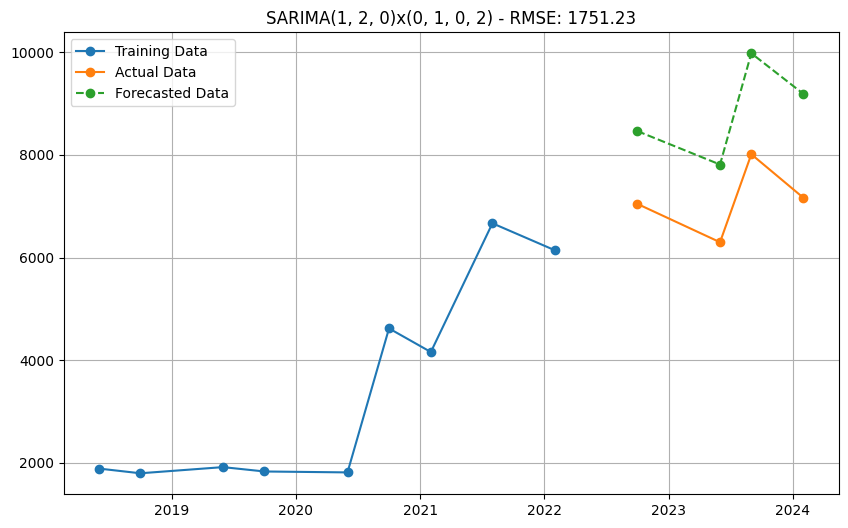

Model: SARIMA(1, 2, 0)x(0, 1, 0, 2) - AIC: 92.65 - RMSE: 1751.23


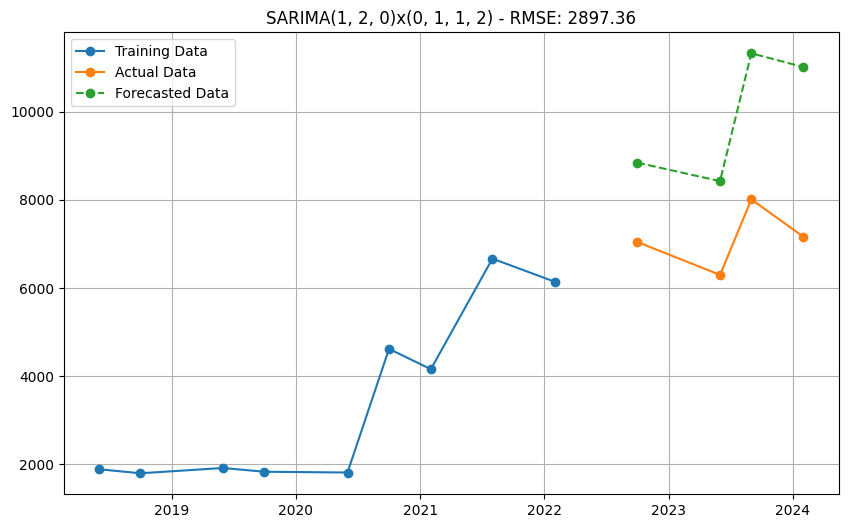

Model: SARIMA(1, 2, 0)x(0, 1, 1, 2) - AIC: 92.99 - RMSE: 2897.36


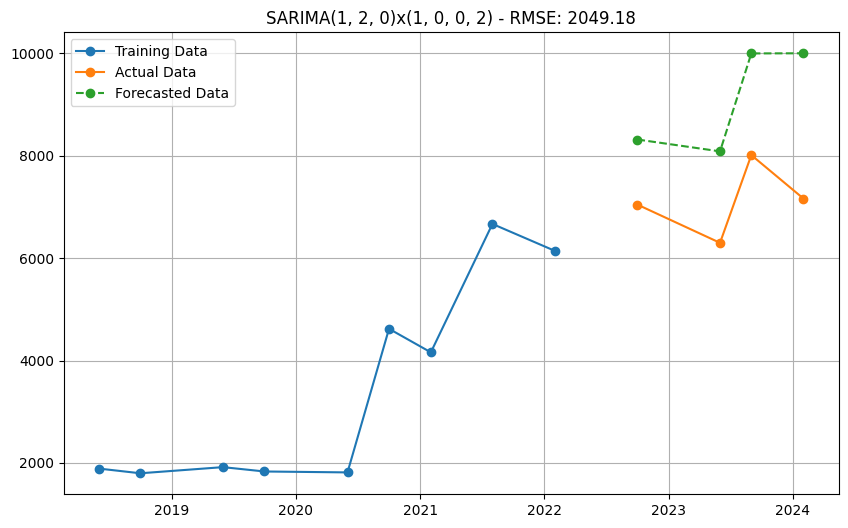

Model: SARIMA(1, 2, 0)x(1, 0, 0, 2) - AIC: 125.63 - RMSE: 2049.18


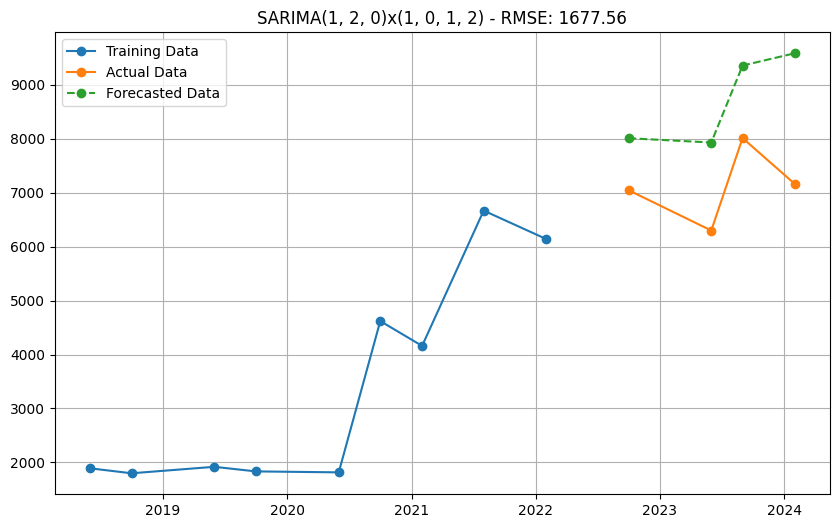

Model: SARIMA(1, 2, 0)x(1, 0, 1, 2) - AIC: 127.06 - RMSE: 1677.56


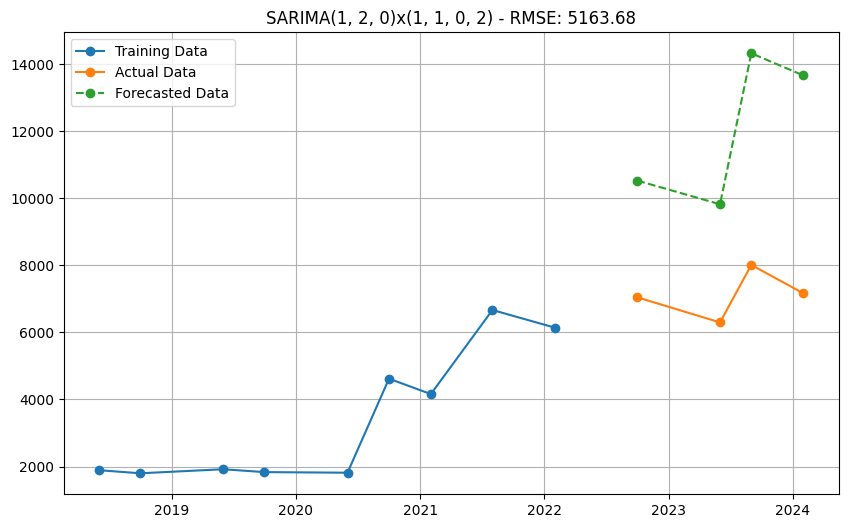

Model: SARIMA(1, 2, 0)x(1, 1, 0, 2) - AIC: 93.21 - RMSE: 5163.68


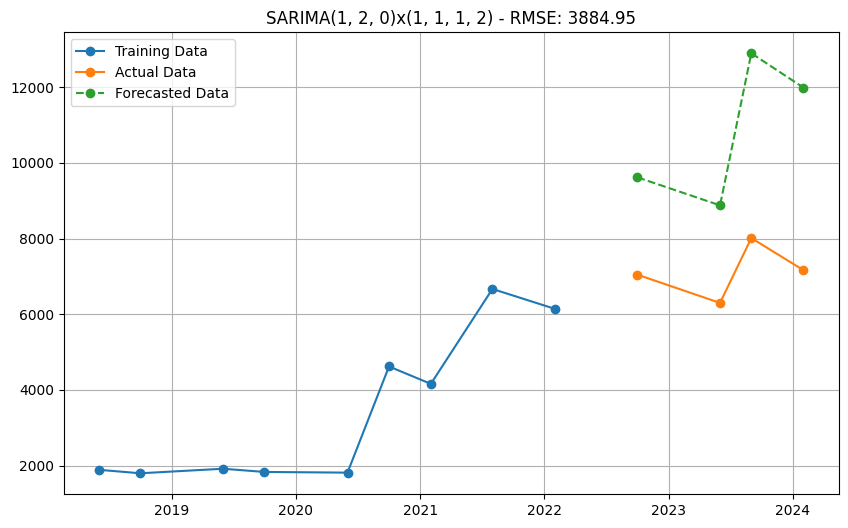

Model: SARIMA(1, 2, 0)x(1, 1, 1, 2) - AIC: 94.81 - RMSE: 3884.95


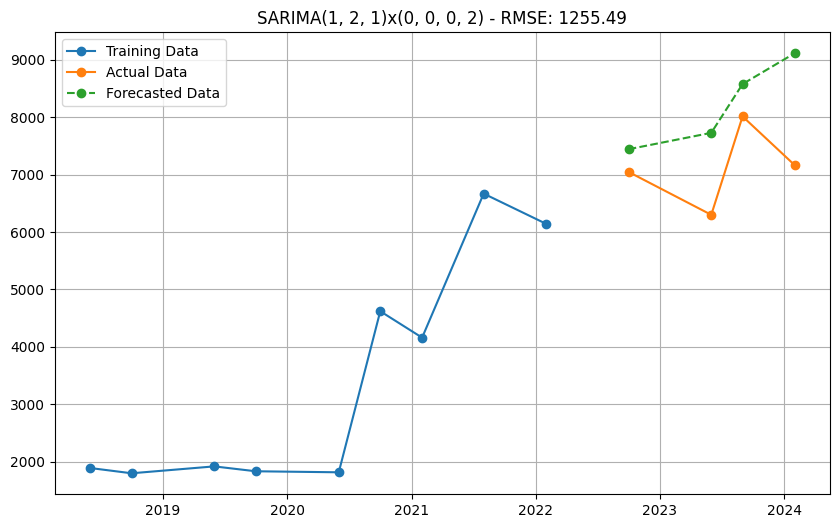

Model: SARIMA(1, 2, 1)x(0, 0, 0, 2) - AIC: 125.39 - RMSE: 1255.49


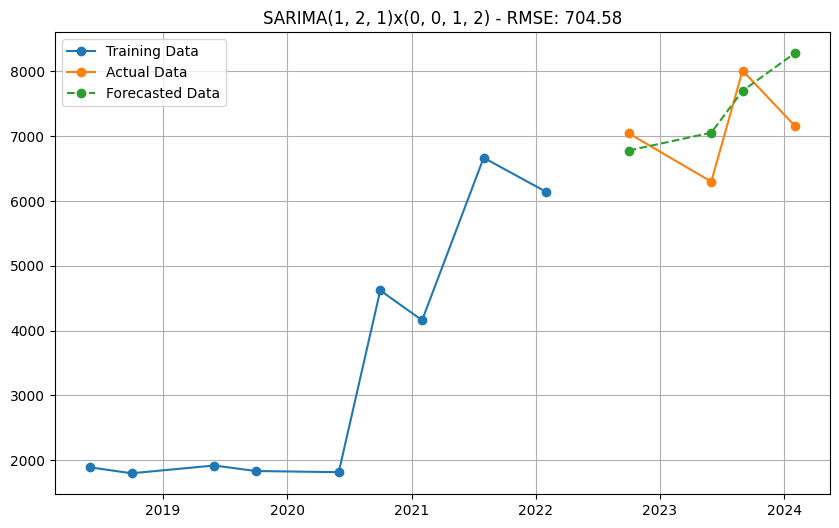

Model: SARIMA(1, 2, 1)x(0, 0, 1, 2) - AIC: 126.72 - RMSE: 704.58


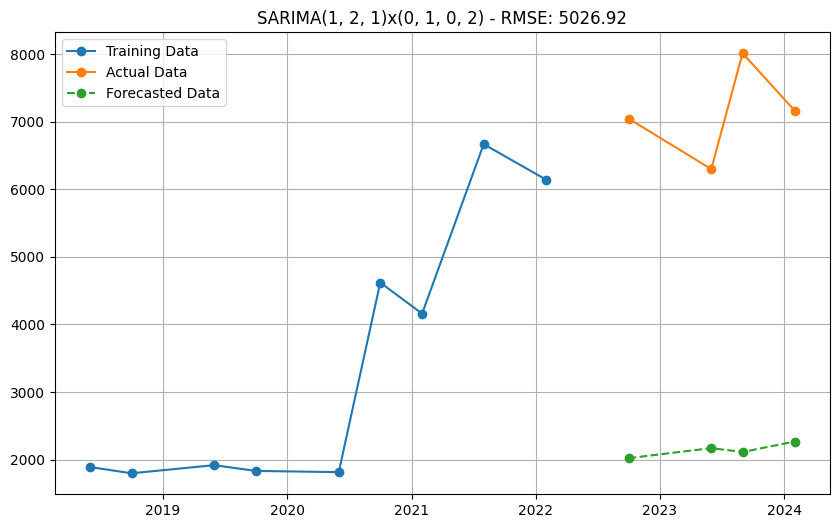

Model: SARIMA(1, 2, 1)x(0, 1, 0, 2) - AIC: 6.00 - RMSE: 5026.92
New best model found: SARIMA(1, 2, 1)x(0, 1, 0, 2) - AIC: 6.00


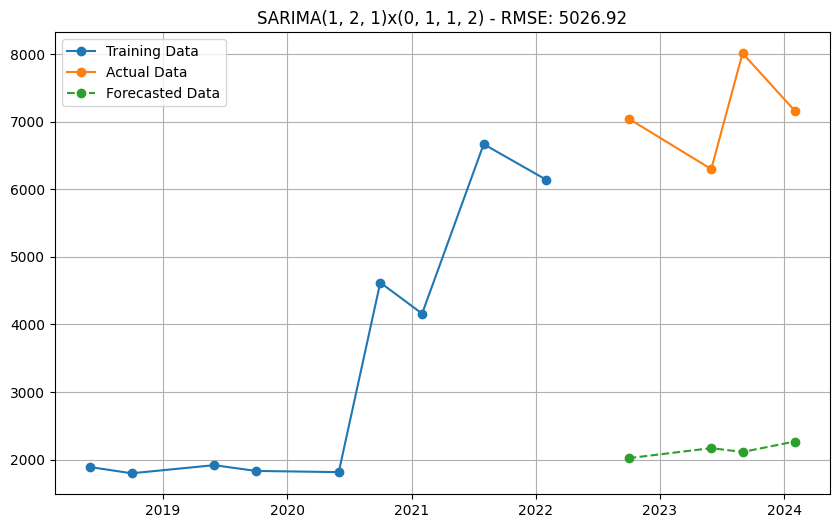

Model: SARIMA(1, 2, 1)x(0, 1, 1, 2) - AIC: 8.00 - RMSE: 5026.92


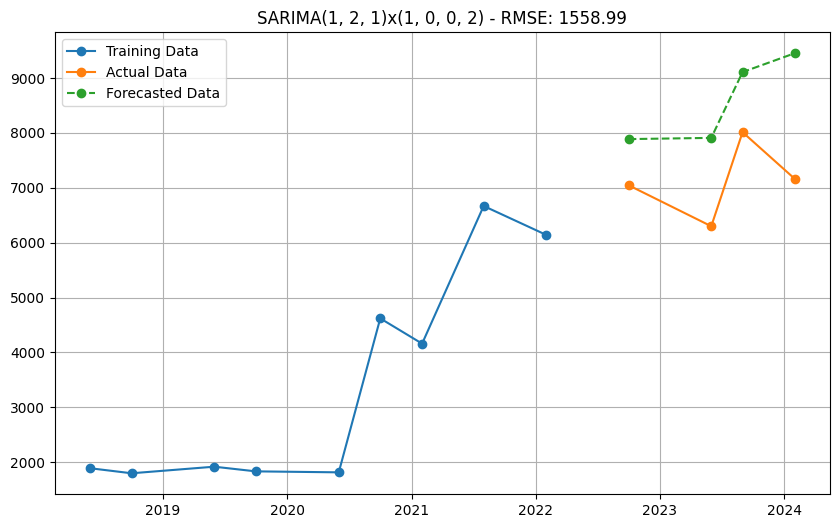

Model: SARIMA(1, 2, 1)x(1, 0, 0, 2) - AIC: 126.68 - RMSE: 1558.99


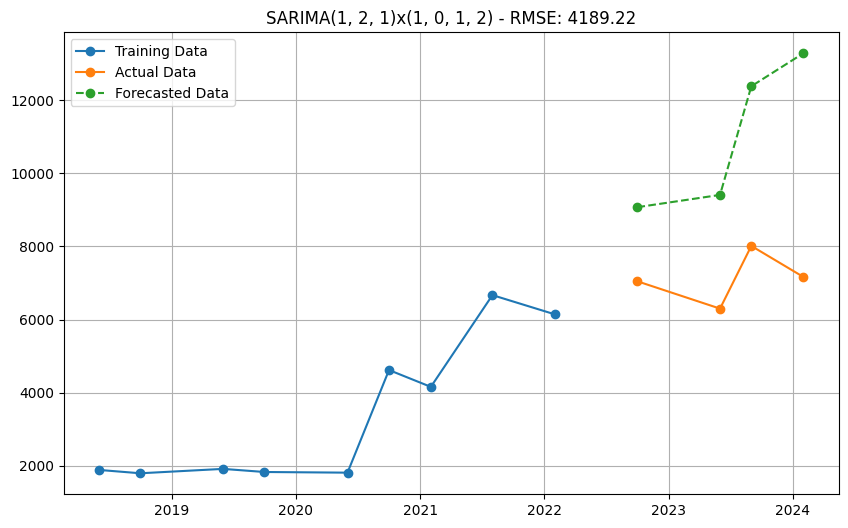

Model: SARIMA(1, 2, 1)x(1, 0, 1, 2) - AIC: 257.01 - RMSE: 4189.22


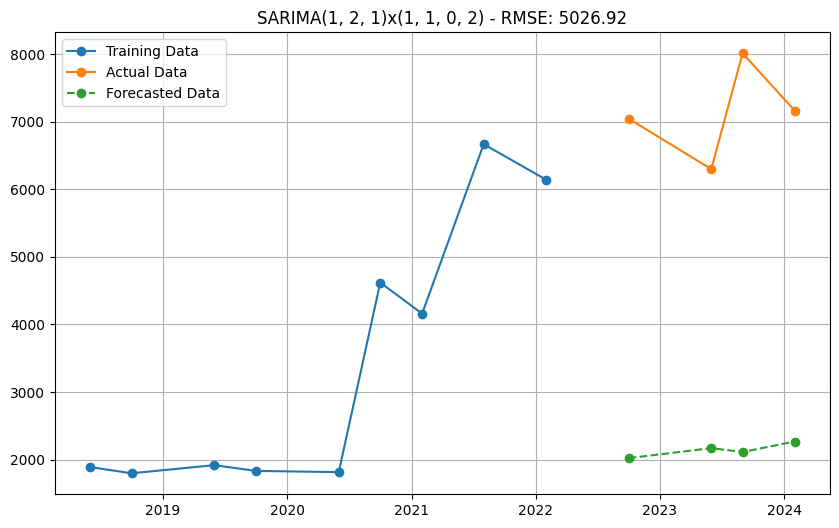

Model: SARIMA(1, 2, 1)x(1, 1, 0, 2) - AIC: 8.00 - RMSE: 5026.92


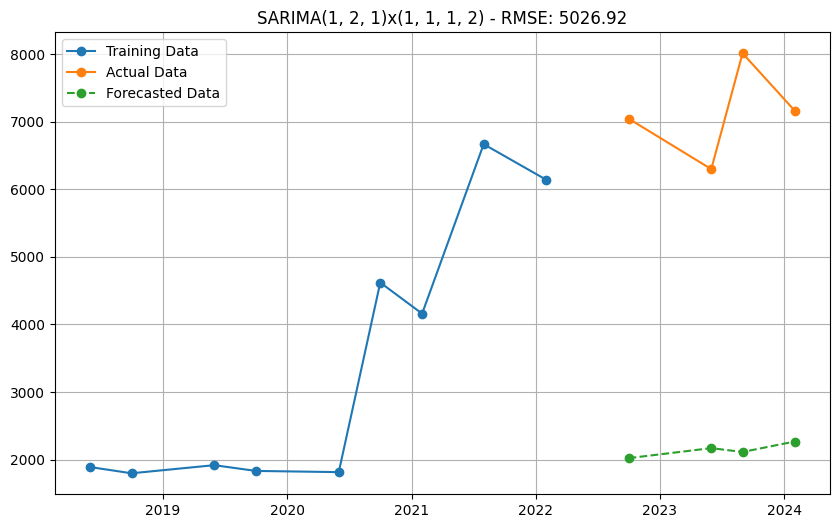

Model: SARIMA(1, 2, 1)x(1, 1, 1, 2) - AIC: 10.00 - RMSE: 5026.92


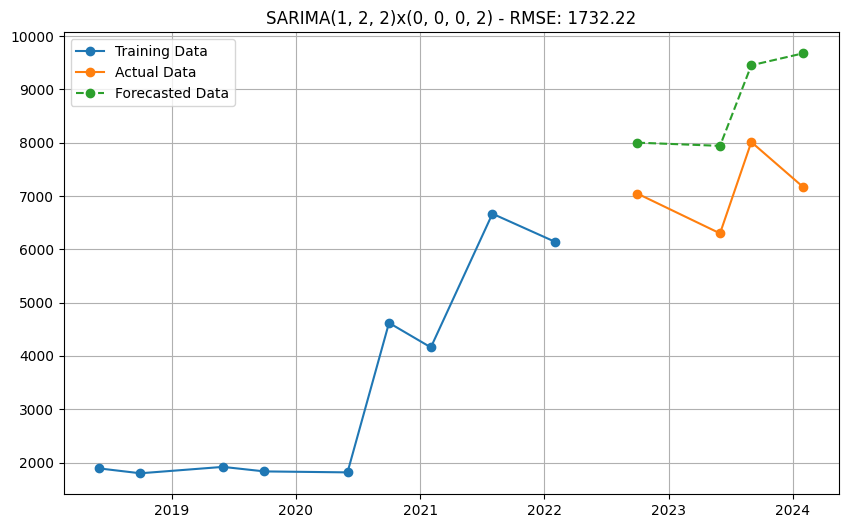

Model: SARIMA(1, 2, 2)x(0, 0, 0, 2) - AIC: 126.92 - RMSE: 1732.22
Failed to fit SARIMA(1, 2, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


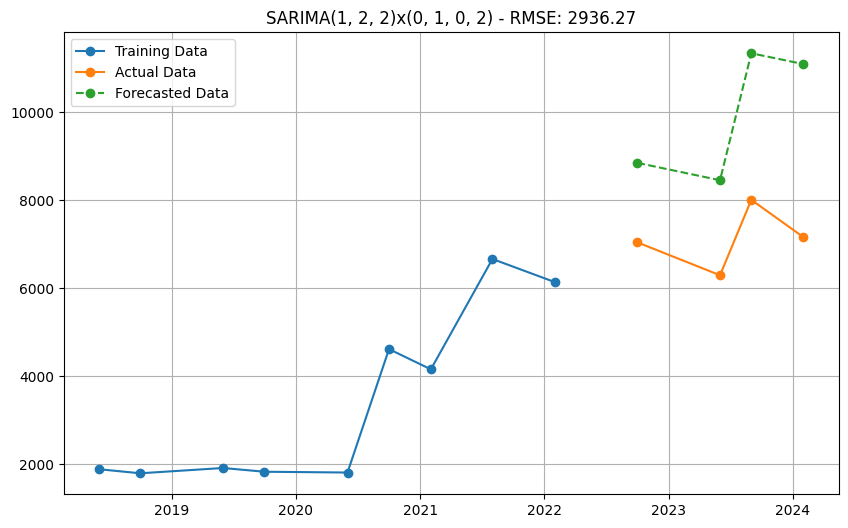

Model: SARIMA(1, 2, 2)x(0, 1, 0, 2) - AIC: 94.92 - RMSE: 2936.27
Failed to fit SARIMA(1, 2, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


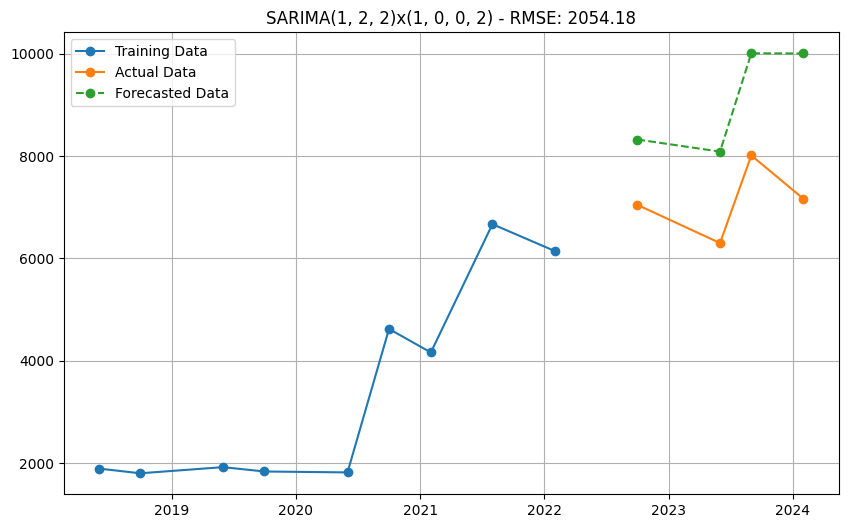

Model: SARIMA(1, 2, 2)x(1, 0, 0, 2) - AIC: 129.63 - RMSE: 2054.18
Failed to fit SARIMA(1, 2, 2)x(1, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


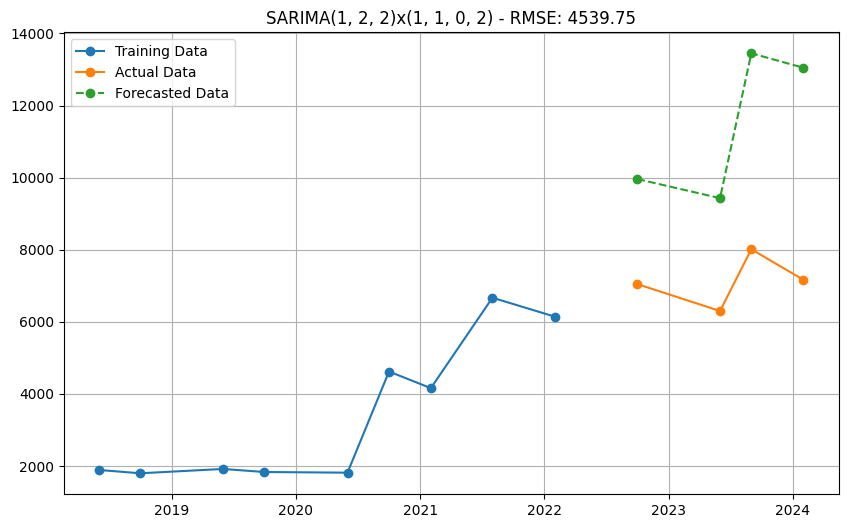

Model: SARIMA(1, 2, 2)x(1, 1, 0, 2) - AIC: 96.51 - RMSE: 4539.75
Failed to fit SARIMA(1, 2, 2)x(1, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


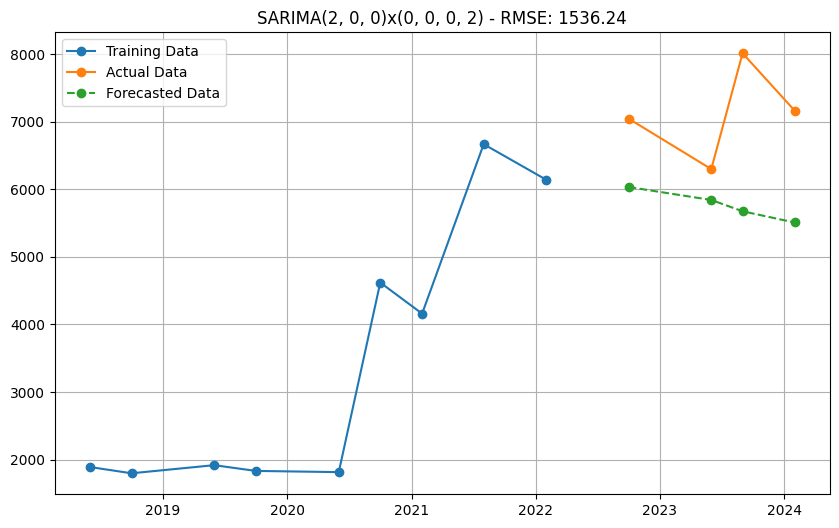

Model: SARIMA(2, 0, 0)x(0, 0, 0, 2) - AIC: 163.14 - RMSE: 1536.24


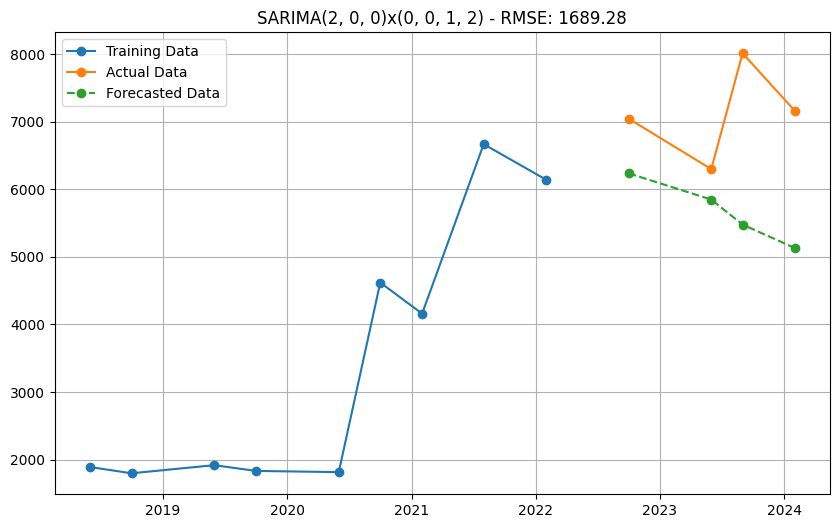

Model: SARIMA(2, 0, 0)x(0, 0, 1, 2) - AIC: 161.66 - RMSE: 1689.28


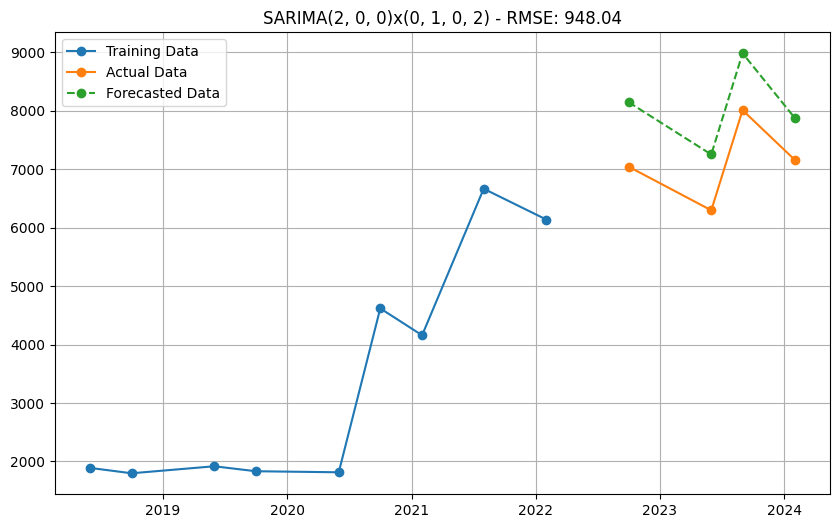

Model: SARIMA(2, 0, 0)x(0, 1, 0, 2) - AIC: 124.99 - RMSE: 948.04


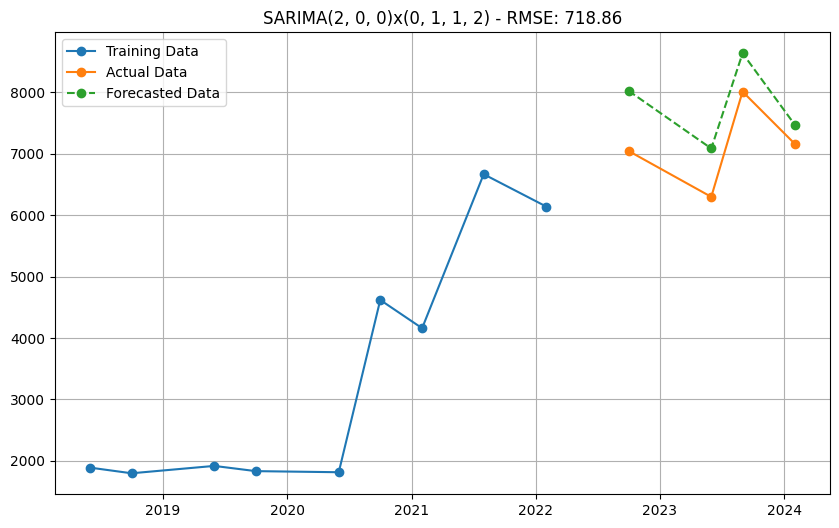

Model: SARIMA(2, 0, 0)x(0, 1, 1, 2) - AIC: 126.98 - RMSE: 718.86
Failed to fit SARIMA(2, 0, 0)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 0)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 0)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 0)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


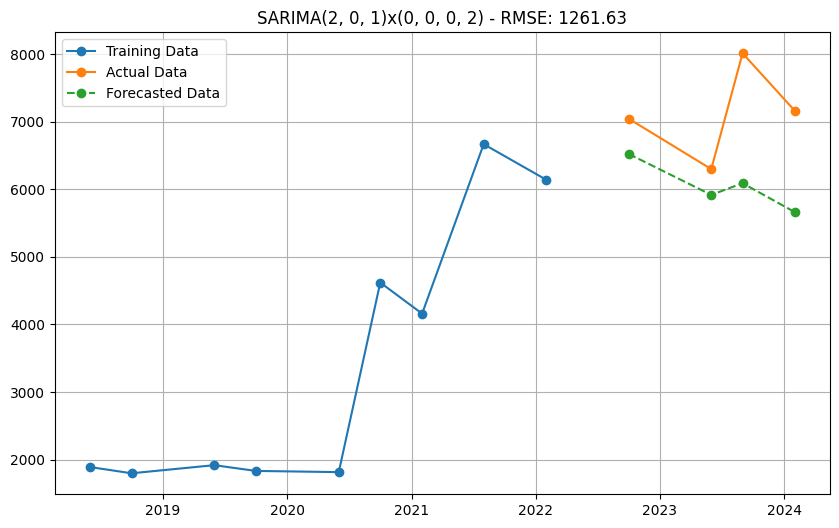

Model: SARIMA(2, 0, 1)x(0, 0, 0, 2) - AIC: 164.50 - RMSE: 1261.63


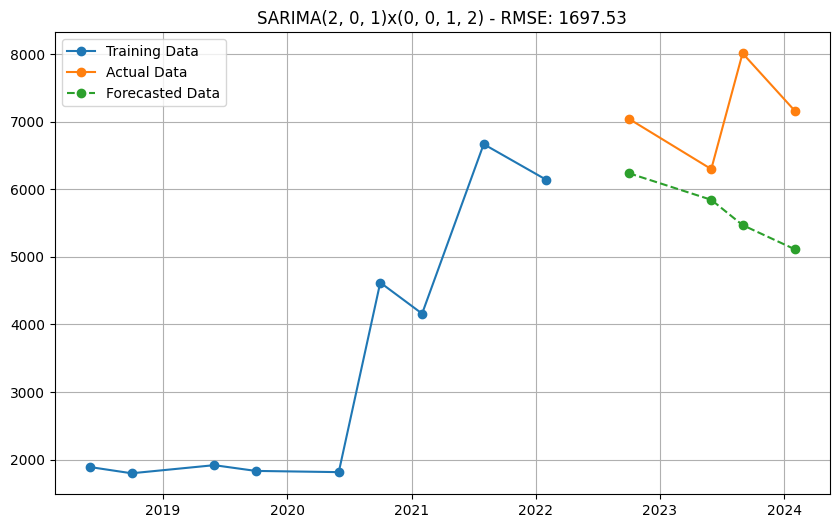

Model: SARIMA(2, 0, 1)x(0, 0, 1, 2) - AIC: 163.66 - RMSE: 1697.53


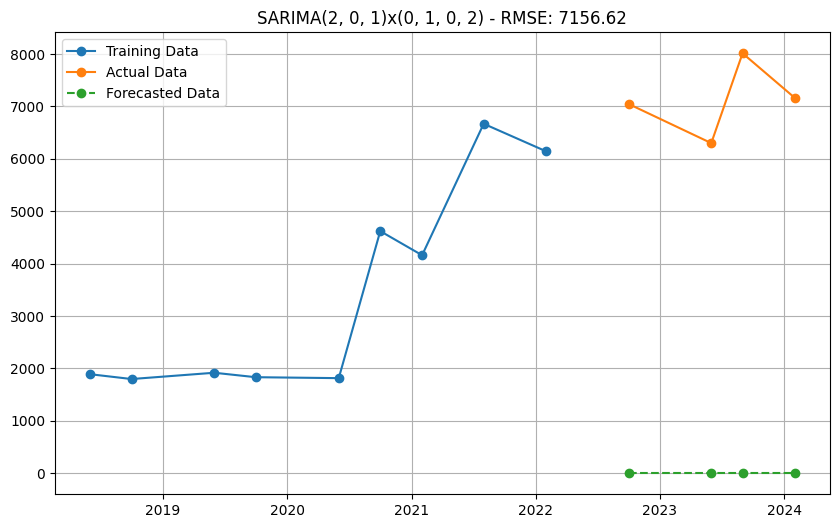

Model: SARIMA(2, 0, 1)x(0, 1, 0, 2) - AIC: 8.00 - RMSE: 7156.62


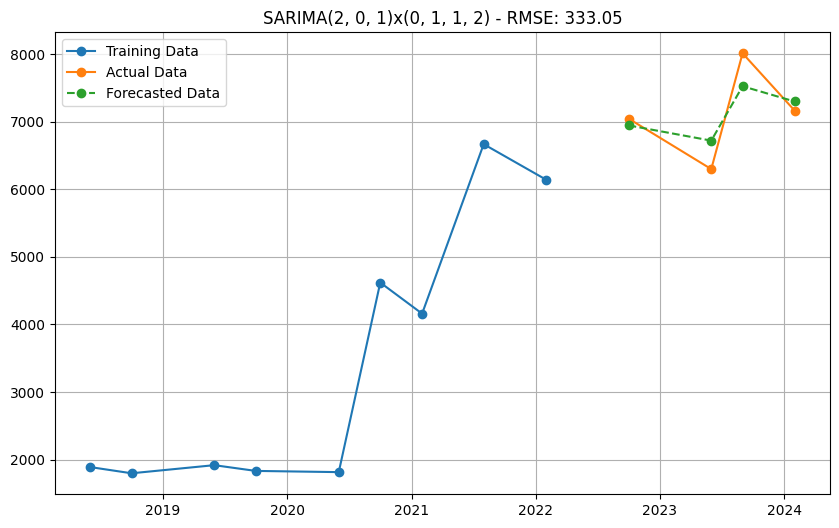

Model: SARIMA(2, 0, 1)x(0, 1, 1, 2) - AIC: 135.10 - RMSE: 333.05
Failed to fit SARIMA(2, 0, 1)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 1)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 1)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 1)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


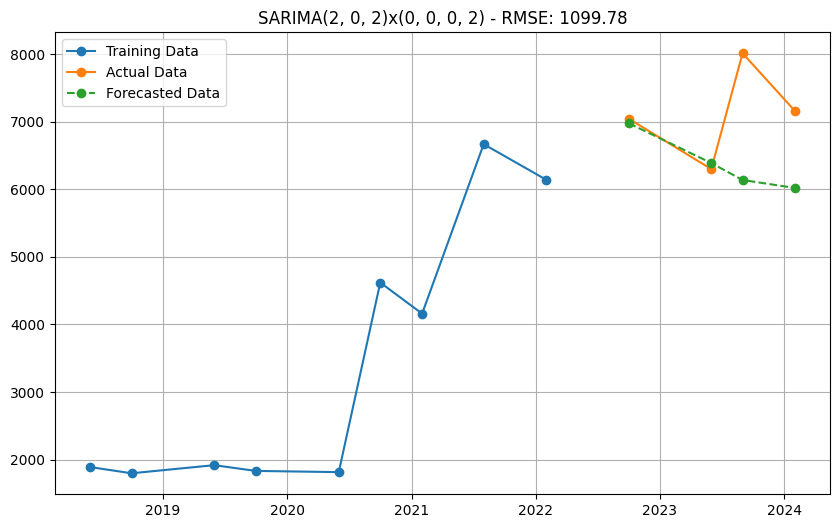

Model: SARIMA(2, 0, 2)x(0, 0, 0, 2) - AIC: 1816.83 - RMSE: 1099.78
Failed to fit SARIMA(2, 0, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


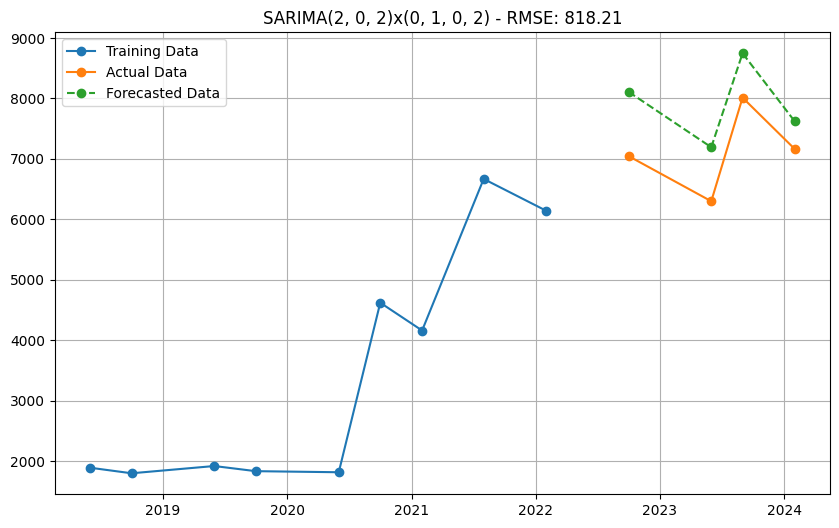

Model: SARIMA(2, 0, 2)x(0, 1, 0, 2) - AIC: 128.88 - RMSE: 818.21
Failed to fit SARIMA(2, 0, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.
Failed to fit SARIMA(2, 0, 2)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 2)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 2)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 2)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


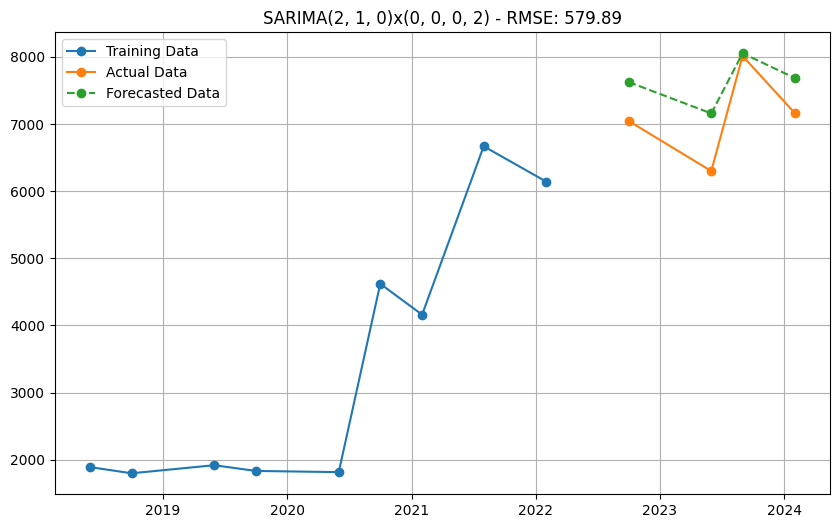

Model: SARIMA(2, 1, 0)x(0, 0, 0, 2) - AIC: 140.93 - RMSE: 579.89


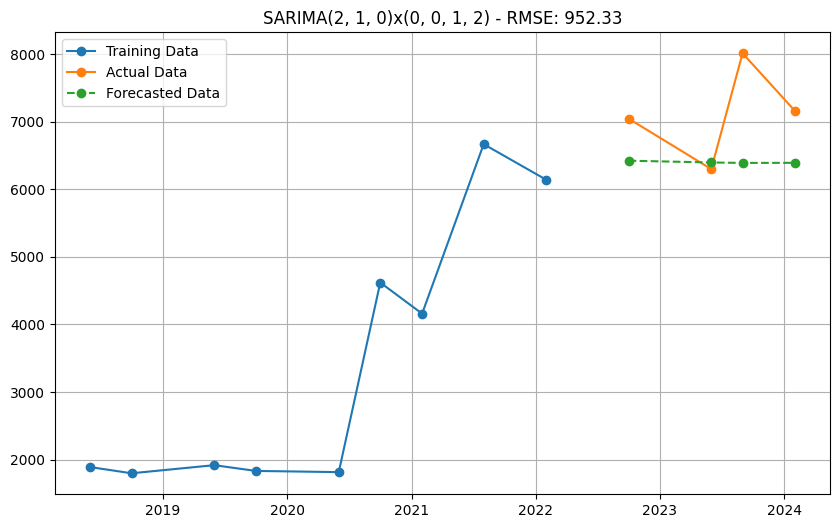

Model: SARIMA(2, 1, 0)x(0, 0, 1, 2) - AIC: 142.58 - RMSE: 952.33


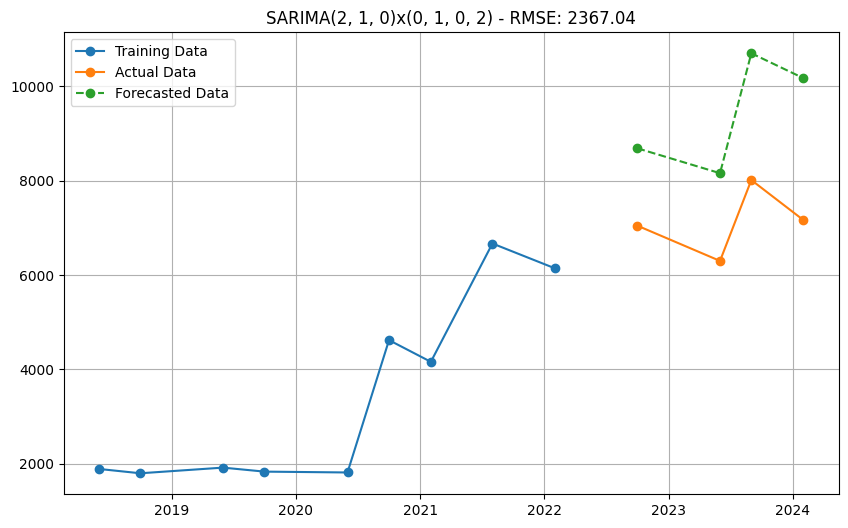

Model: SARIMA(2, 1, 0)x(0, 1, 0, 2) - AIC: 107.90 - RMSE: 2367.04


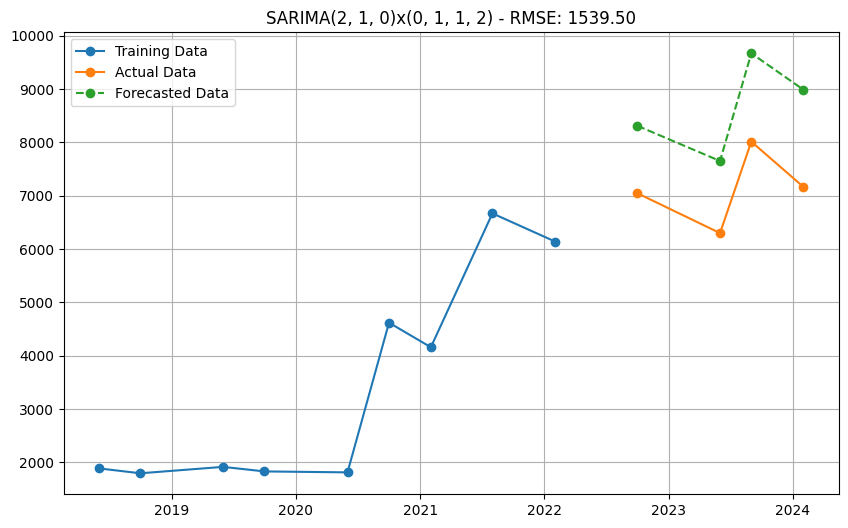

Model: SARIMA(2, 1, 0)x(0, 1, 1, 2) - AIC: 109.52 - RMSE: 1539.50
Failed to fit SARIMA(2, 1, 0)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 0)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 0)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 0)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


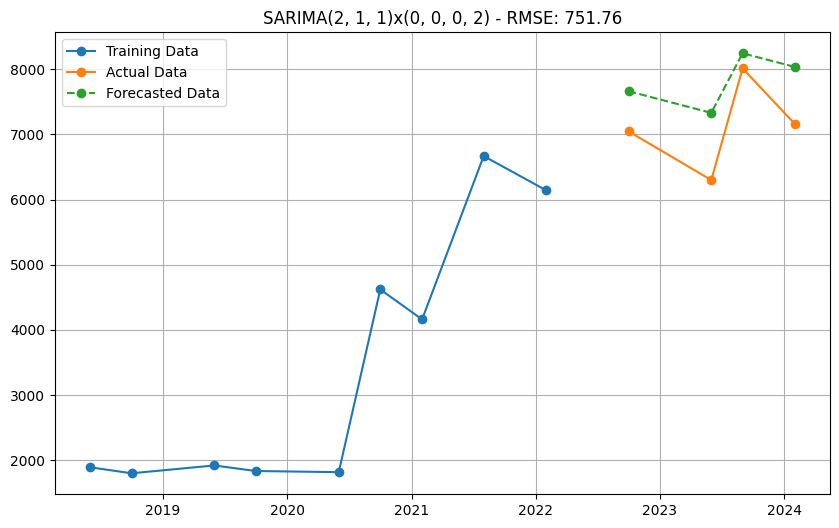

Model: SARIMA(2, 1, 1)x(0, 0, 0, 2) - AIC: 142.85 - RMSE: 751.76


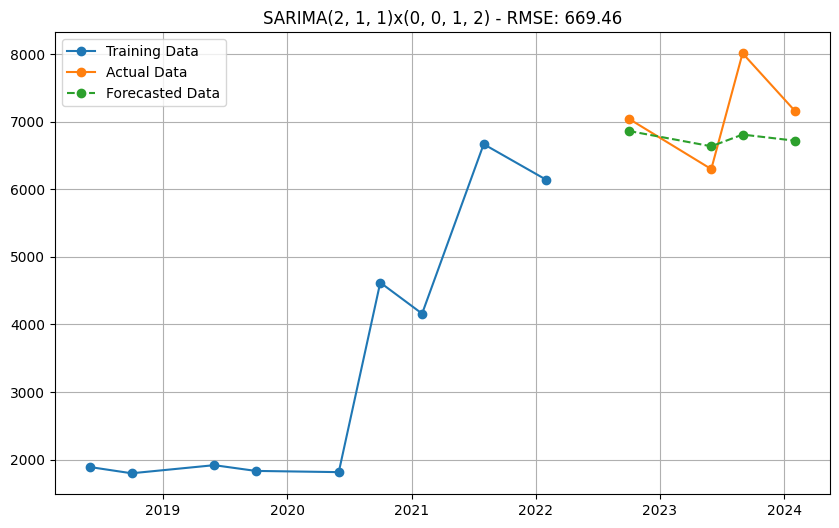

Model: SARIMA(2, 1, 1)x(0, 0, 1, 2) - AIC: 144.54 - RMSE: 669.46


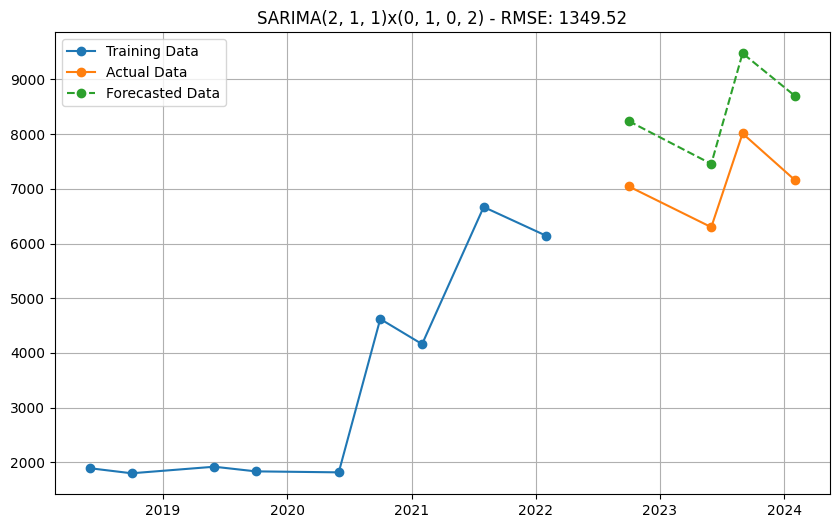

Model: SARIMA(2, 1, 1)x(0, 1, 0, 2) - AIC: 2763.88 - RMSE: 1349.52


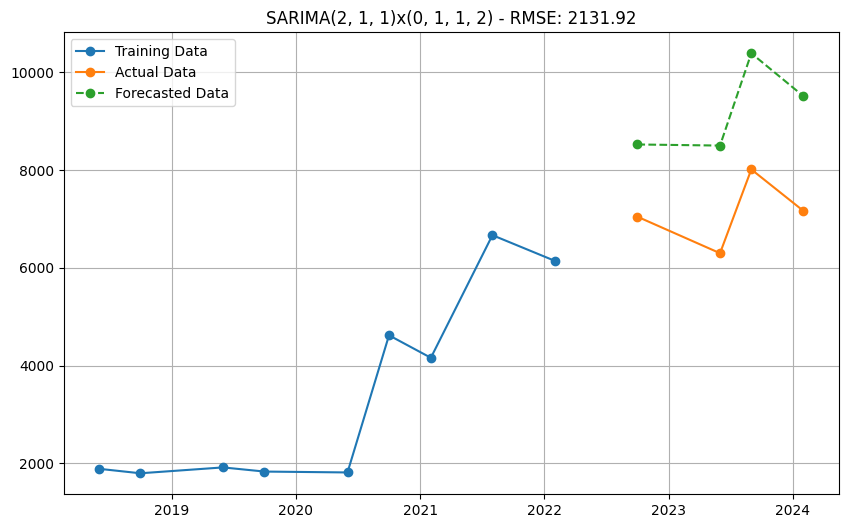

Model: SARIMA(2, 1, 1)x(0, 1, 1, 2) - AIC: 1934.04 - RMSE: 2131.92
Failed to fit SARIMA(2, 1, 1)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 1)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 1)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 1)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


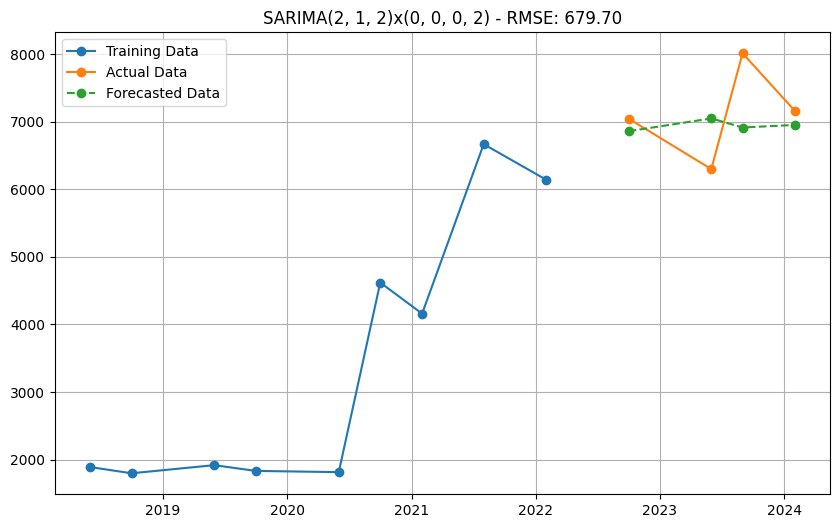

Model: SARIMA(2, 1, 2)x(0, 0, 0, 2) - AIC: 144.27 - RMSE: 679.70
Failed to fit SARIMA(2, 1, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


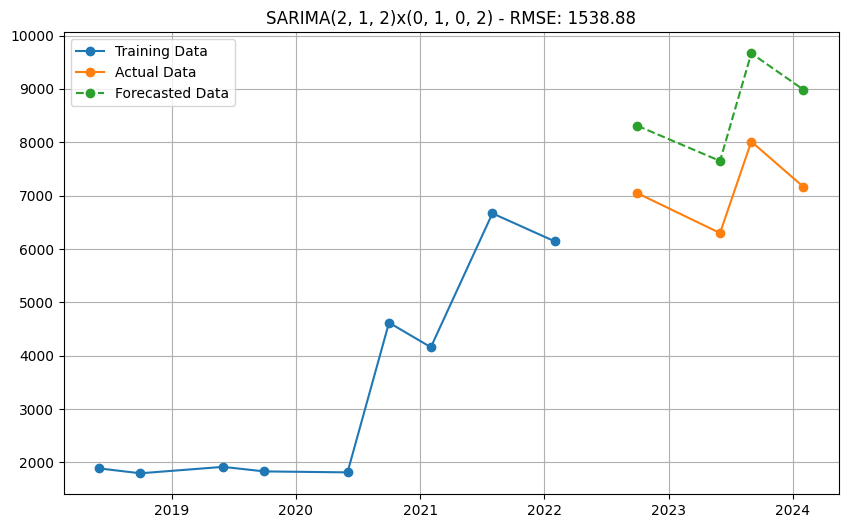

Model: SARIMA(2, 1, 2)x(0, 1, 0, 2) - AIC: 111.52 - RMSE: 1538.88
Failed to fit SARIMA(2, 1, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.
Failed to fit SARIMA(2, 1, 2)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 2)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 2)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 2)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


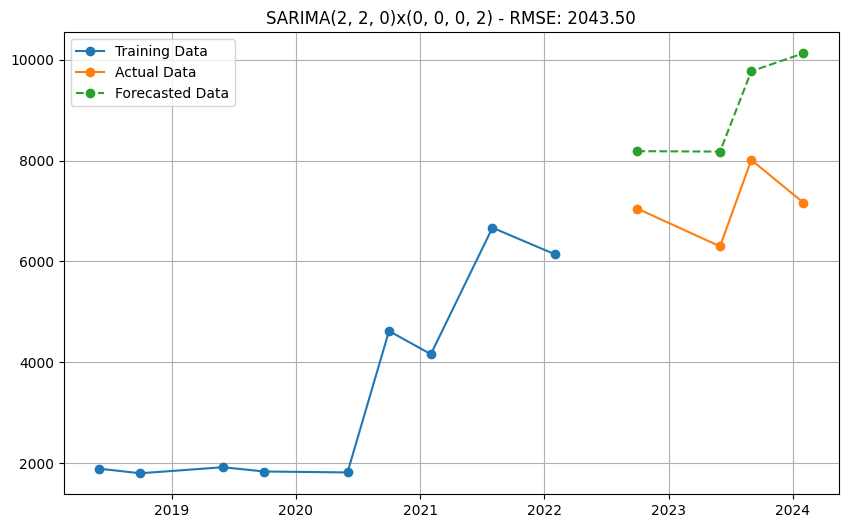

Model: SARIMA(2, 2, 0)x(0, 0, 0, 2) - AIC: 125.25 - RMSE: 2043.50


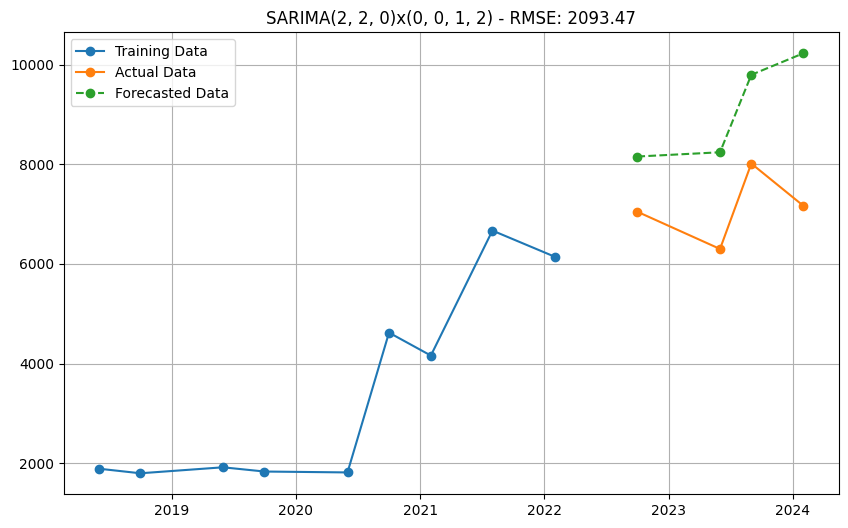

Model: SARIMA(2, 2, 0)x(0, 0, 1, 2) - AIC: 127.12 - RMSE: 2093.47


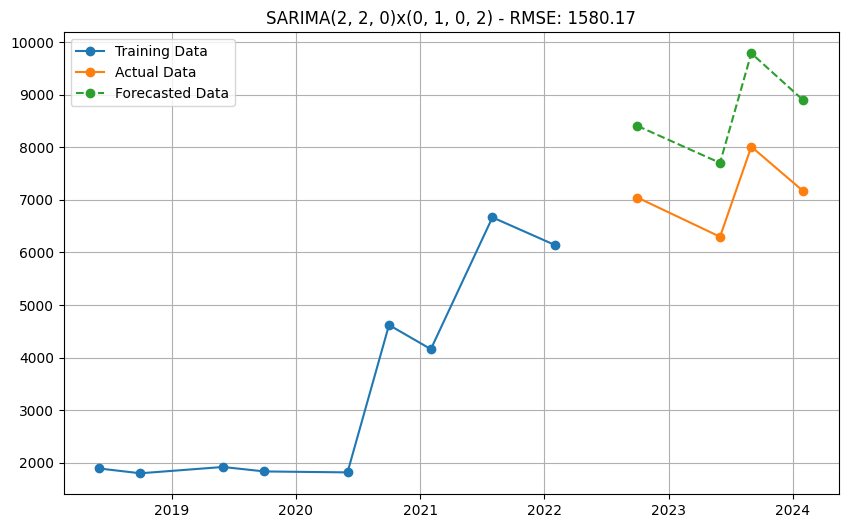

Model: SARIMA(2, 2, 0)x(0, 1, 0, 2) - AIC: 94.43 - RMSE: 1580.17


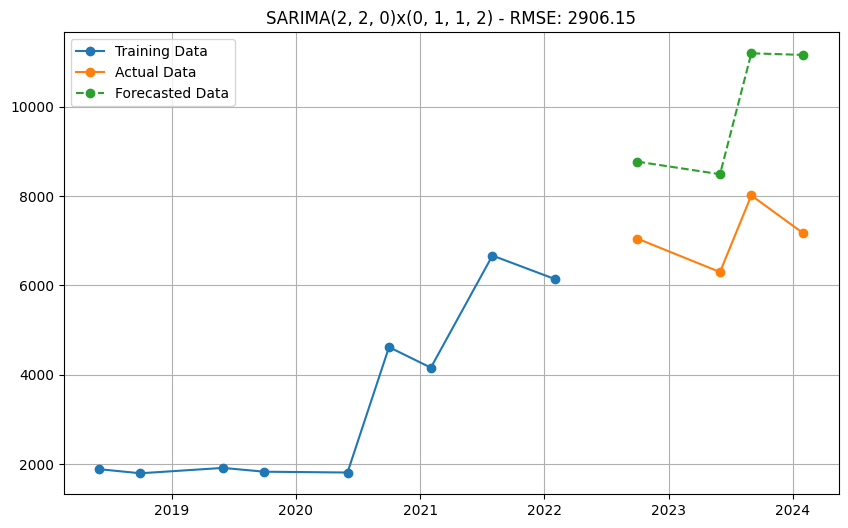

Model: SARIMA(2, 2, 0)x(0, 1, 1, 2) - AIC: 94.91 - RMSE: 2906.15
Failed to fit SARIMA(2, 2, 0)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 0)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 0)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 0)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


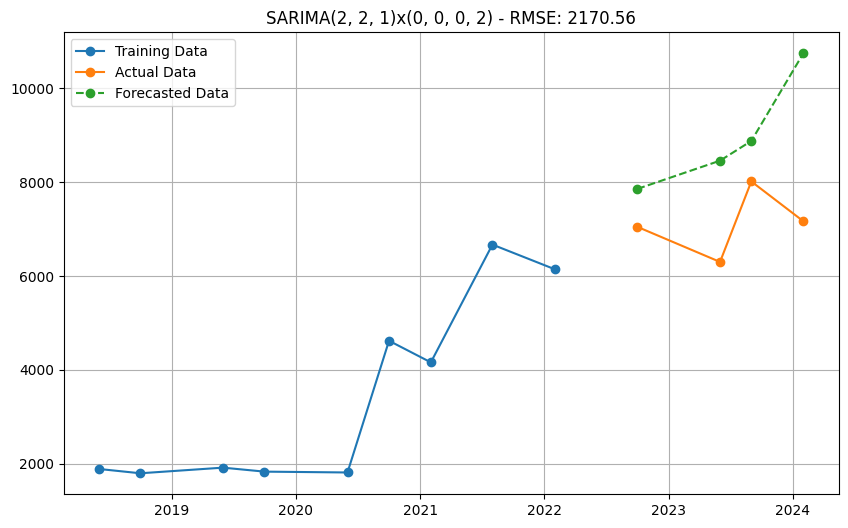

Model: SARIMA(2, 2, 1)x(0, 0, 0, 2) - AIC: 127.11 - RMSE: 2170.56


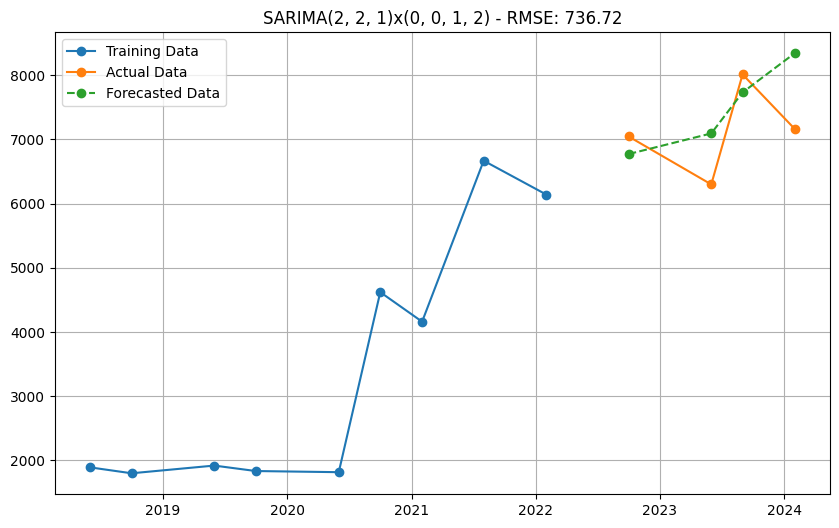

Model: SARIMA(2, 2, 1)x(0, 0, 1, 2) - AIC: 128.64 - RMSE: 736.72


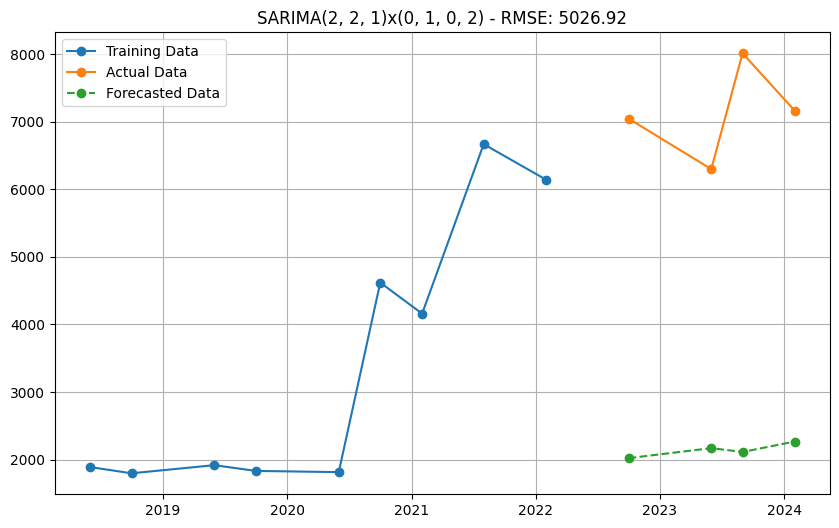

Model: SARIMA(2, 2, 1)x(0, 1, 0, 2) - AIC: 8.00 - RMSE: 5026.92


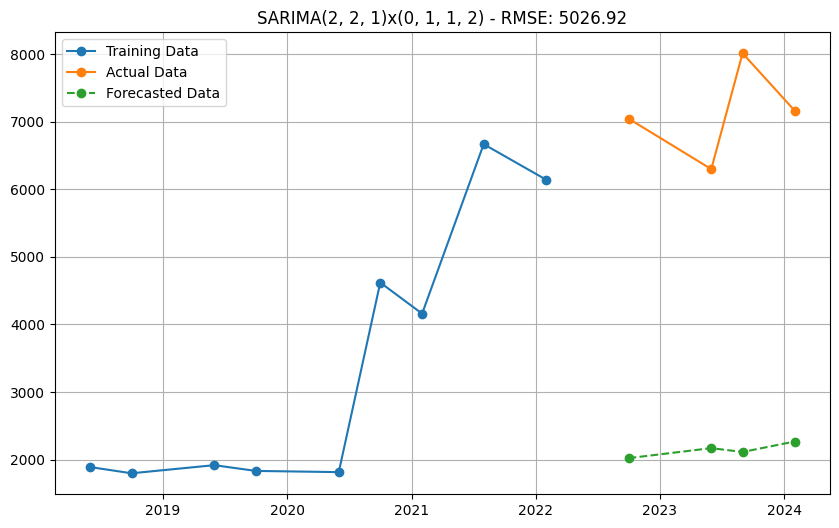

Model: SARIMA(2, 2, 1)x(0, 1, 1, 2) - AIC: 10.00 - RMSE: 5026.92
Failed to fit SARIMA(2, 2, 1)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 1)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 1)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 1)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


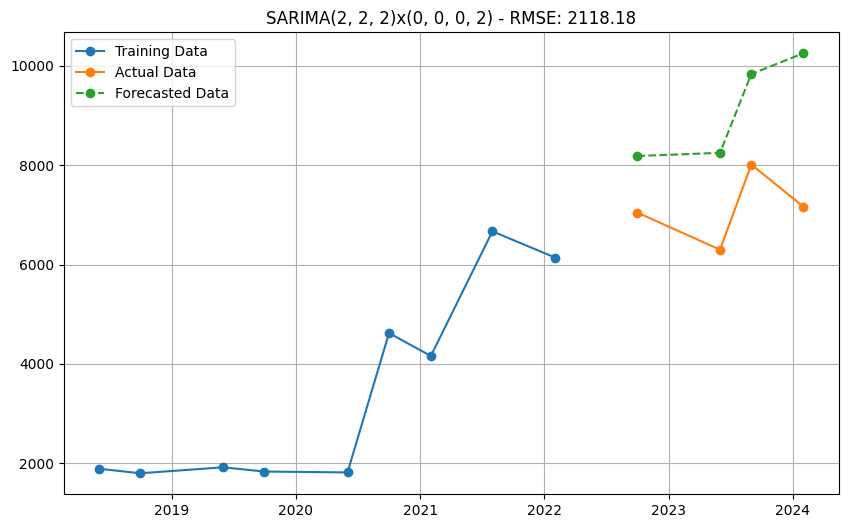

Model: SARIMA(2, 2, 2)x(0, 0, 0, 2) - AIC: 129.10 - RMSE: 2118.18
Failed to fit SARIMA(2, 2, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


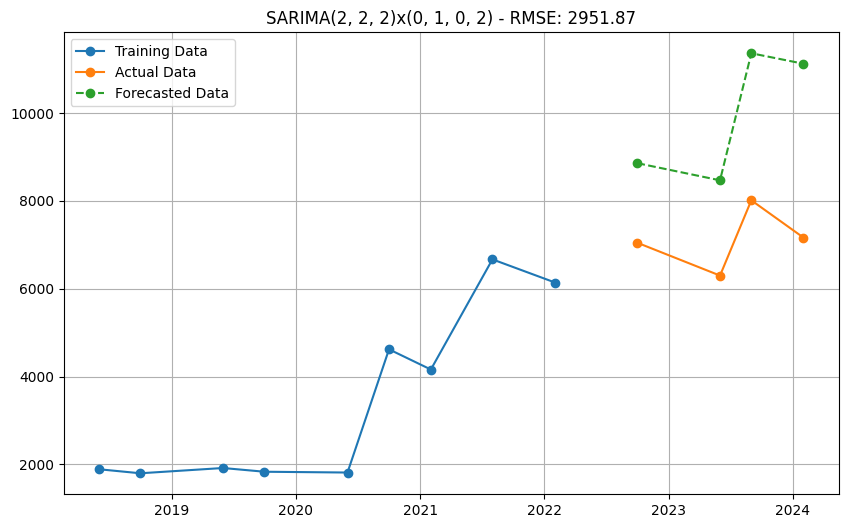

Model: SARIMA(2, 2, 2)x(0, 1, 0, 2) - AIC: 96.92 - RMSE: 2951.87
Failed to fit SARIMA(2, 2, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.
Failed to fit SARIMA(2, 2, 2)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 2)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 2)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 2)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


In [41]:
p = d = q = range(0, 3)
P = D = Q = range(0, 2)
m = [2]


non_seasonal_pdq = list(itertools.product(p, d, q))
seasonal_pdq = list(itertools.product(P, D, Q, m))


def sarima_grid_search(train, test, non_seasonal_pdq, seasonal_pdq):
    best_aic = float('inf')
    best_params = None
    best_model = None
    
    for param in non_seasonal_pdq:
        for seasonal_param in seasonal_pdq:
            try:
                model = SARIMAX(train, 
                                order=param, 
                                seasonal_order=seasonal_param)
                
                model_fit = model.fit(disp=False)
                
                forecast = model_fit.forecast(steps=len(test))

                mse = mean_squared_error(test, forecast)
                rmse = np.sqrt(mse)

                plt.figure(figsize=(10,6))
                plt.plot(train.index, train, label='Training Data', marker='o')
                plt.plot(test.index, test, label='Actual Data', marker='o')
                plt.plot(test.index, forecast, label='Forecasted Data', linestyle='--', marker='o')
                plt.title(f'SARIMA{param}x{seasonal_param} - RMSE: {rmse:.2f}')
                plt.legend()
                plt.grid()
                plt.show()
                
                print(f"Model: SARIMA{param}x{seasonal_param} - AIC: {model_fit.aic:.2f} - RMSE: {rmse:.2f}")
                
                if model_fit.aic < best_aic:
                    best_aic = model_fit.aic
                    best_params = (param, seasonal_param)
                    best_model = model_fit
                    print(f"New best model found: SARIMA{param}x{seasonal_param} - AIC: {model_fit.aic:.2f}")
                    
            except Exception as e:
                print(f"Failed to fit SARIMA{param}x{seasonal_param}: {e}")
                continue
                
    return best_model, best_params

best_model, best_params = sarima_grid_search(train, test, non_seasonal_pdq, seasonal_pdq)

To get the best model, the proponents utilized a Grid Search to test every possible parameter combination to get the most accurate forecast. AIC (Akaike Information Criterion) is a metric used to measure the relative quality of a statistical model for a given dataset. 

**Pointers**:
* In time series models like SARIMA, there are multiple combinations of parameters (p, d, q, P, D, Q, m). Simply picking the model that best fits the training data can lead to overfitting, where the model captures noise rather than the underlying pattern. AIC penalizes complex models with too many parameters, encouraging a balance between simplicity and accuracy. This helps in finding the model that generalizes well to unseen data, which is essential for accurate forecasting.

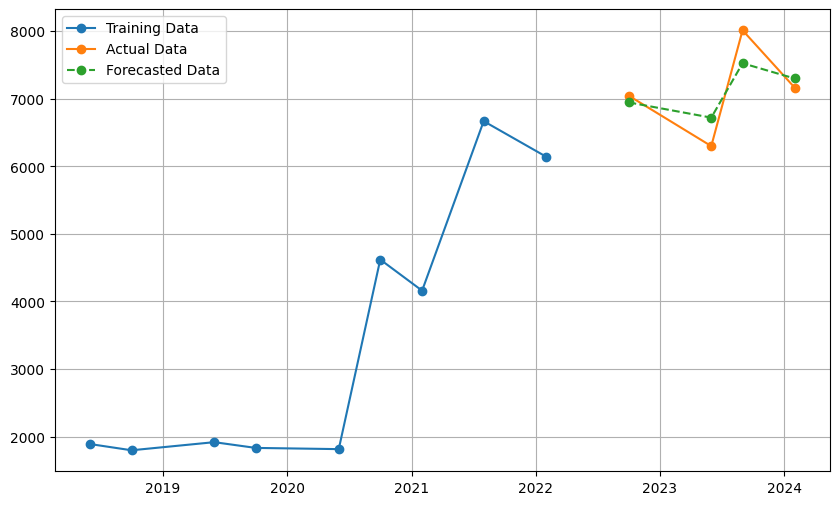

Root Mean Squared Error: 333.0518816851035
Mean Absolute Error: 285.99963146336245
Mean Absolute Percentage Error: 4.01%


In [95]:
model = SARIMAX(train, order=(2, 0, 1), seasonal_order=(0, 1, 1, 2))
results = model.fit()
forecast = results.forecast(steps=len(test))

plt.figure(figsize=(10,6))
plt.plot(train.index, train, label='Training Data', marker='o')
plt.plot(test.index, test, label='Actual Data', marker='o')
plt.plot(test.index, forecast, label='Forecasted Data', linestyle='--', marker='o')
plt.legend()
plt.grid()
plt.show()

def MAE_to_MAPE(mae, actual_values):
    mean_actual = np.mean(actual_values)
    mape = (mae / mean_actual) * 100
    return mape

mse = mean_squared_error(test, forecast)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test, forecast)
mape = MAE_to_MAPE(mae, test)
print(f'Root Mean Squared Error: {rmse}')
print(f'Mean Absolute Error: {mae}')
print(f'Mean Absolute Percentage Error: {mape:.2f}%')

forecast_df = pd.DataFrame(forecast, index=test.index, columns=['Forecast'])

The model has a relatively low AIC compared to other models which ranges in the hundreds with a low rmse compared to the data which ranged in the thousands

In [96]:
forecast.index = test.index

model_result = pd.DataFrame({
    'Actual': test,
    'Forecast': forecast
})
model_result['Difference'] = model_result['Actual'] - model_result['Forecast']

mse = mean_squared_error(test, forecast)
rmse = np.sqrt(mse)

print(model_result)
print(" ")
print(f'Root Mean Squared Error: {rmse}')


            Actual     Forecast  Difference
Date                                       
2022-10-01    7046  6945.861502  100.138498
2023-06-01    6299  6720.331908 -421.331908
2023-09-01    8013  7525.135688  487.864312
2024-02-01    7165  7299.663808 -134.663808
 
Root Mean Squared Error: 333.0518816851035


In [97]:
# Null Hypothesis: The residuals are independently distributed.
# Alternative Hypothesis: The residuals are not independently distributed; they exhibit serial correlation.
sm.stats.acorr_ljungbox(results.resid, lags=[8], return_df=True)

,lb_stat,lb_pvalue
8,12.823367,0.118073


Since this value is greater than the common significance level thresholds (e.g., 0.05 or 0.01), we fail to reject the null hypothesis. Based on the Ljung-Box test, there is no significant evidence of autocorrelation in the residuals. Essentially, the model seems to have captured the data patterns well, and the remaining residuals appear to be random noise.

**Pointers**:
* The Ljung-Box test (also known as the Ljung-Box Q test) is used to assess whether the residuals from a time series model, like SARIMA, are independent and uncorrelated.
* Once a model is fitted, the remaining residuals should resemble white noise—random fluctuations with no predictable pattern.
* A good model should produce residuals that have no significant autocorrelation, meaning it explains all the systematic patterns in the data.

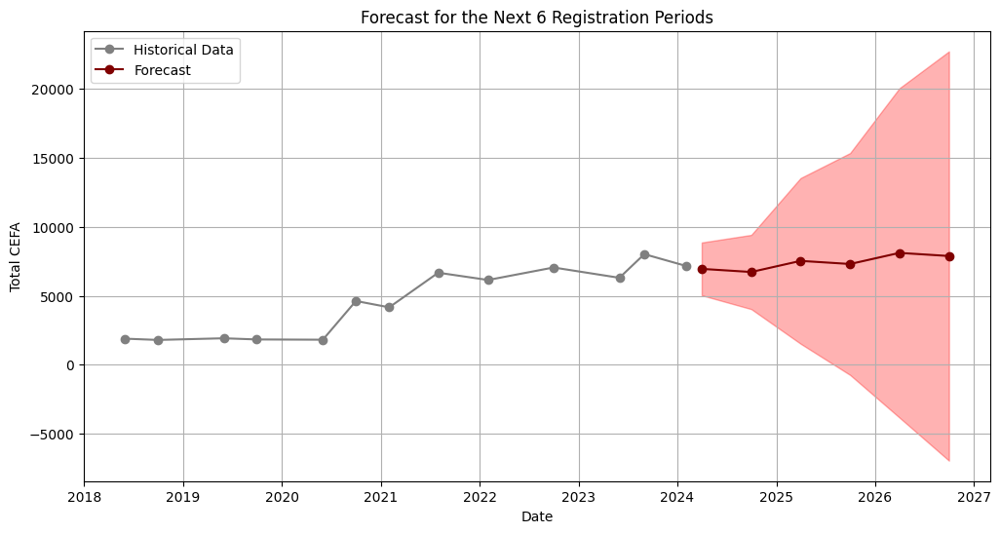

In [102]:
forecast_steps = 6
forecast = results.get_forecast(steps=forecast_steps, alpha=0.2)
forecast_index = pd.date_range(start=totalCEFA.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='6M')
forecast_mean = forecast.predicted_mean
forecast_mean.index = forecast_index

# Plot historical data and forecast
plt.figure(figsize=(12, 6))
plt.plot(totalCEFA.index, totalCEFA, label='Historical Data', marker='o', color='gray')
plt.plot(forecast_mean.index, forecast_mean, label='Forecast', color='maroon', marker='o')
plt.fill_between(forecast_mean.index,
                 forecast.conf_int().iloc[:, 0],
                 forecast.conf_int().iloc[:, 1], color='red', alpha=0.3)
plt.title('Forecast for the Next 6 Registration Periods')
plt.xlabel('Date')
plt.ylabel('Total CEFA')
plt.legend()
plt.grid()
plt.show()

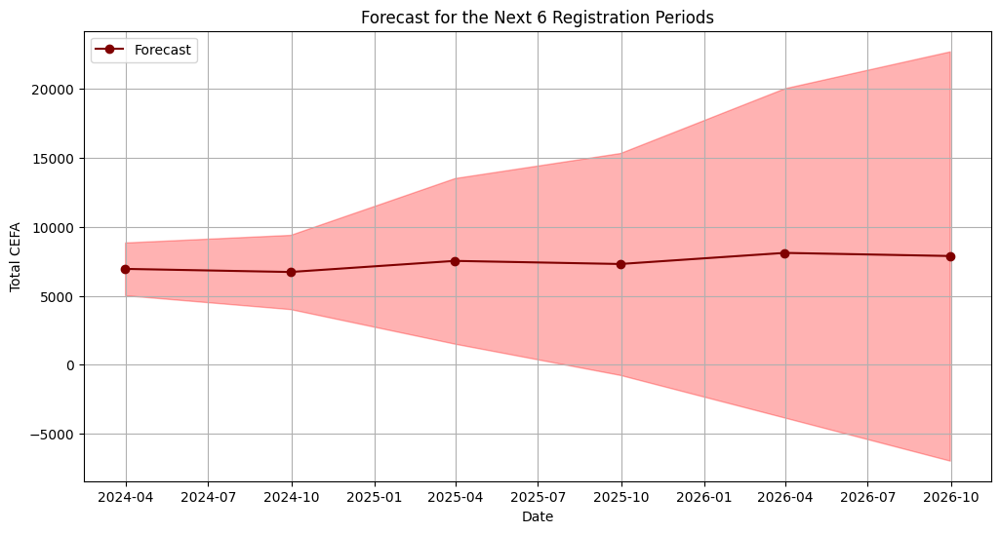

In [104]:
# Plot historical data and forecast
plt.figure(figsize=(12, 6))
plt.plot(forecast_mean.index, forecast_mean, label='Forecast', color='maroon', marker='o')
plt.fill_between(forecast_mean.index,
                 forecast.conf_int().iloc[:, 0],
                 forecast.conf_int().iloc[:, 1], color='red', alpha=0.3)
plt.title('Forecast for the Next 6 Registration Periods')
plt.xlabel('Date')
plt.ylabel('Total CEFA')
plt.legend()
plt.grid()
plt.show()

# Total SHS

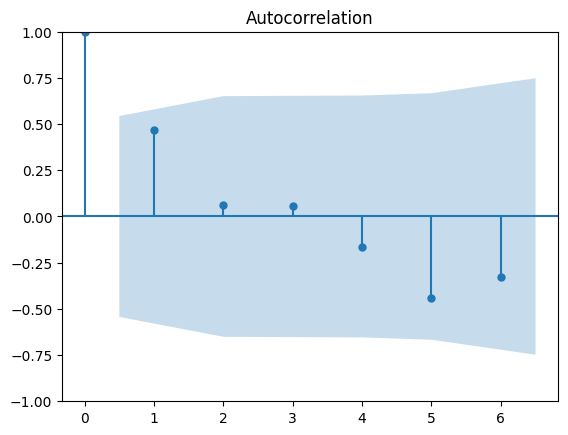

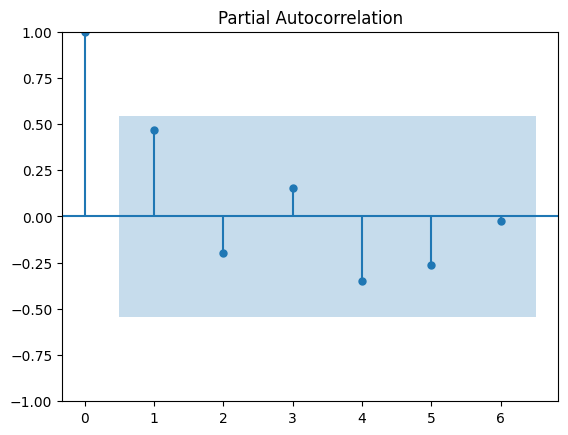

In [105]:
SHSACF = plot_acf(totalSHS)
SHSPACF = plot_pacf(totalSHS)

In [106]:
# Null Hypothesis: There is a unit root in the data. The data is non-stationary
# Alternative Hypothesis: There is no unit root in the data. The data is stationary

result = adfuller(totalSHS)
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -1.654217159667894
p-value: 0.4548419894027523


In [107]:
data_diff = totalSHS.diff().dropna()

# ADF test
result = adfuller(data_diff)
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -3.4886751791864588
p-value: 0.008282747618213362


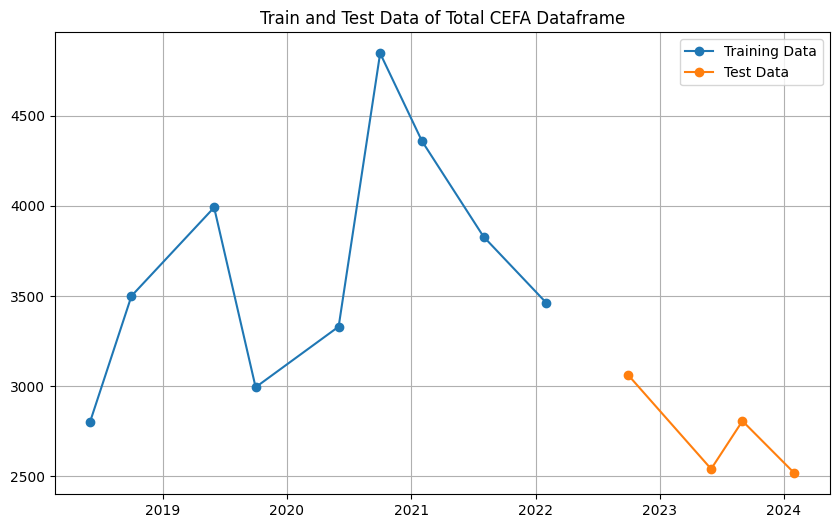

In [108]:
trainSize = int(len(totalSHS) * 0.7)
train, test = totalSHS[:trainSize], totalSHS[trainSize:]

plt.figure(figsize=(10,6))
plt.plot(train, label='Training Data', marker='o')
plt.plot(test, label='Test Data', marker='o')
plt.title('Train and Test Data of Total CEFA Dataframe')
plt.legend()
plt.grid()
plt.show()

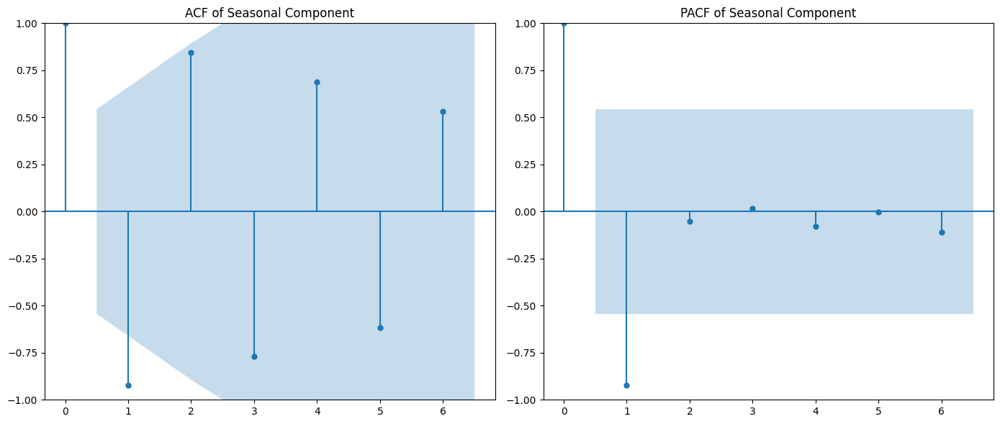

In [109]:
plt.figure(figsize=(14, 6))

plt.subplot(121)
plot_acf(decomposition.seasonal.dropna(), lags=6, ax=plt.gca())
plt.title('ACF of Seasonal Component')

plt.subplot(122)
plot_pacf(decomposition.seasonal.dropna(), lags=6, ax=plt.gca())
plt.title('PACF of Seasonal Component')

plt.tight_layout()
plt.show()

In [164]:
result = adfuller(decomposition.seasonal.dropna())
print('ADF Statistic:', result[0])
print('p-value:', result[1])

ADF Statistic: -2720461550368084.0
p-value: 0.0


In [166]:
model = SARIMAX(train, order=(0, 2, 0), seasonal_order=(1, 0, 1, 2))

results = model.fit()
print(results.summary())

                                      SARIMAX Results                                      
Dep. Variable:                                 SHS   No. Observations:                    9
Model:             SARIMAX(0, 2, 0)x(1, 0, [1], 2)   Log Likelihood                 -58.080
Date:                             Fri, 20 Sep 2024   AIC                            122.161
Time:                                     00:16:24   BIC                            121.998
Sample:                                          0   HQIC                           120.155
                                               - 9                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L2        0.0226      0.574      0.039      0.969      -1.102       1.147
ma.S.L2       -0.9851      

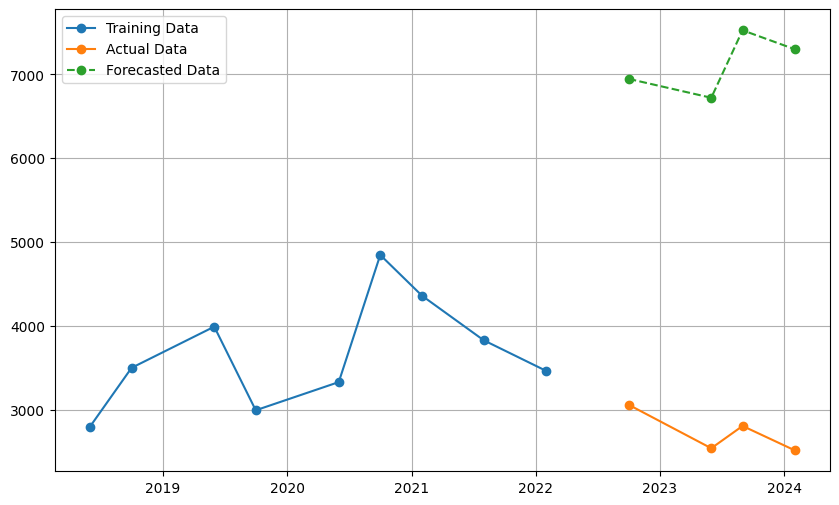

Root Mean Squared Error: 4407.420228566032


In [111]:
forecast = results.forecast(steps=len(test))

plt.figure(figsize=(10,6))
plt.plot(train.index, train, label='Training Data', marker='o')
plt.plot(test.index, test, label='Actual Data', marker='o')
plt.plot(test.index, forecast, label='Forecasted Data', linestyle='--', marker='o')
plt.legend()
plt.grid()
plt.show()

mse = mean_squared_error(test, forecast)
rmse = np.sqrt(mse)
print(f'Root Mean Squared Error: {rmse}')

forecast_df = pd.DataFrame(forecast, index=test.index, columns=['Forecast'])

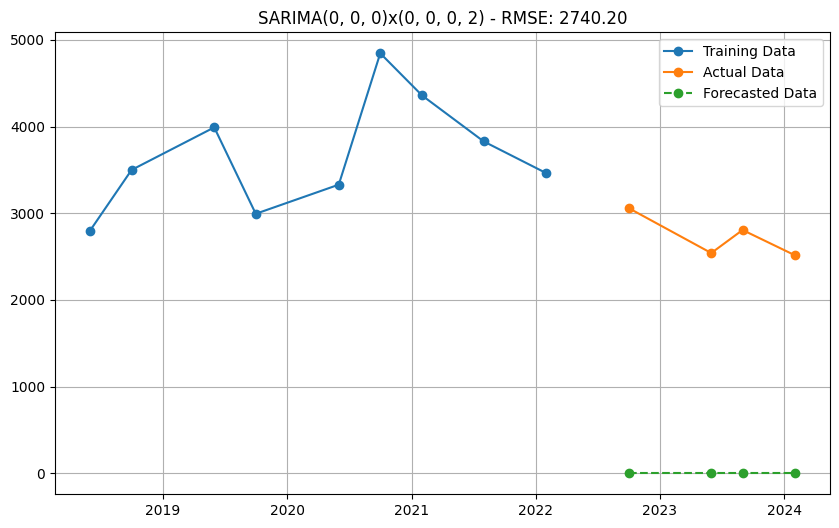

Model: SARIMA(0, 0, 0)x(0, 0, 0, 2) - AIC: 175.58 - RMSE: 2740.20
New best model found: SARIMA(0, 0, 0)x(0, 0, 0, 2) - AIC: 175.58


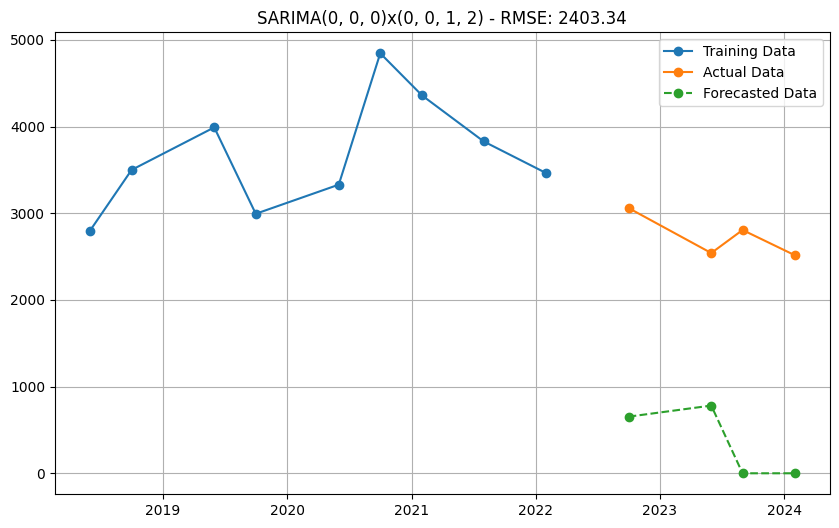

Model: SARIMA(0, 0, 0)x(0, 0, 1, 2) - AIC: 170.44 - RMSE: 2403.34
New best model found: SARIMA(0, 0, 0)x(0, 0, 1, 2) - AIC: 170.44


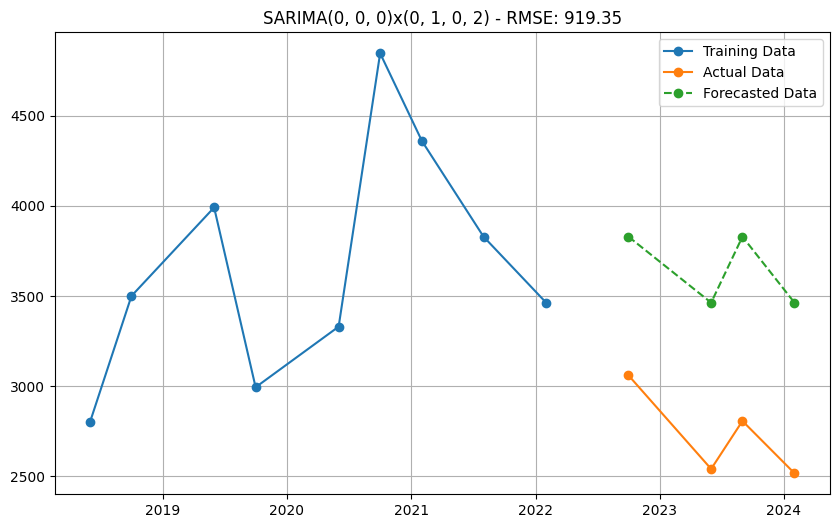

Model: SARIMA(0, 0, 0)x(0, 1, 0, 2) - AIC: 119.88 - RMSE: 919.35
New best model found: SARIMA(0, 0, 0)x(0, 1, 0, 2) - AIC: 119.88


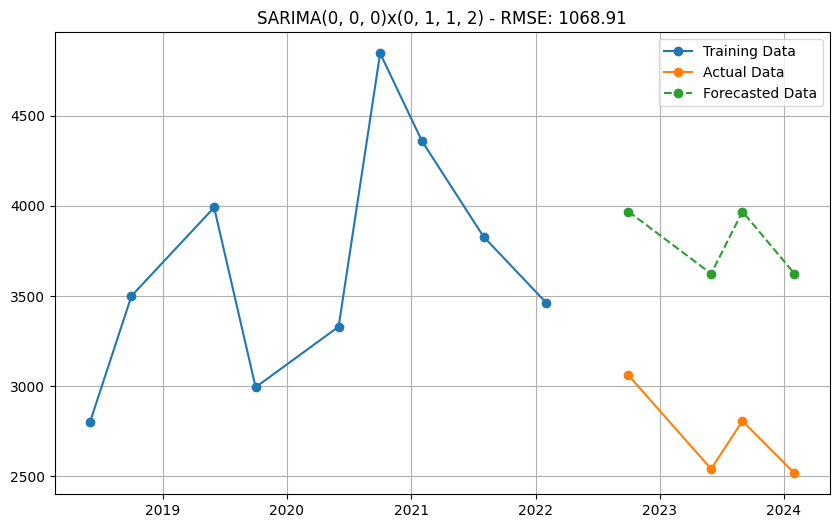

Model: SARIMA(0, 0, 0)x(0, 1, 1, 2) - AIC: 121.01 - RMSE: 1068.91


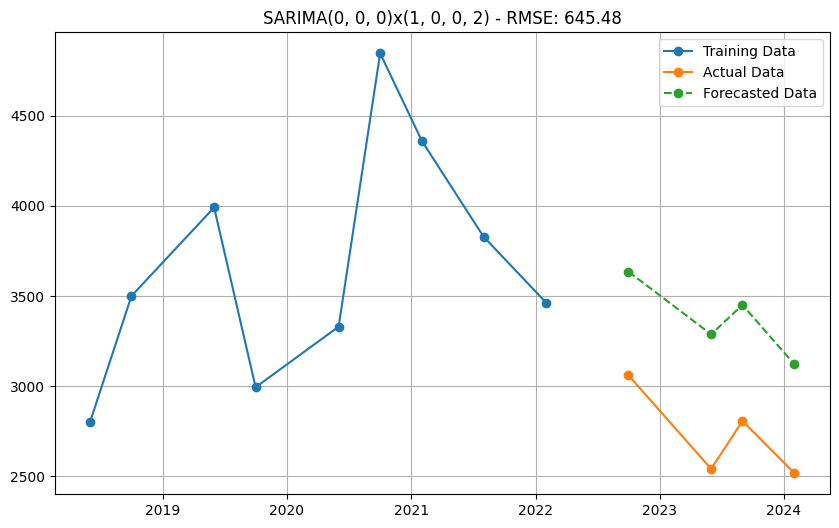

Model: SARIMA(0, 0, 0)x(1, 0, 0, 2) - AIC: 159.97 - RMSE: 645.48


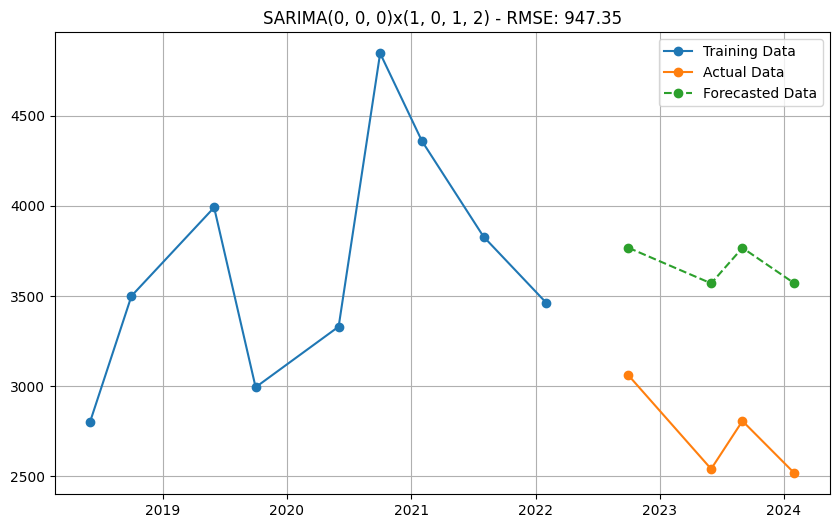

Model: SARIMA(0, 0, 0)x(1, 0, 1, 2) - AIC: 158.98 - RMSE: 947.35


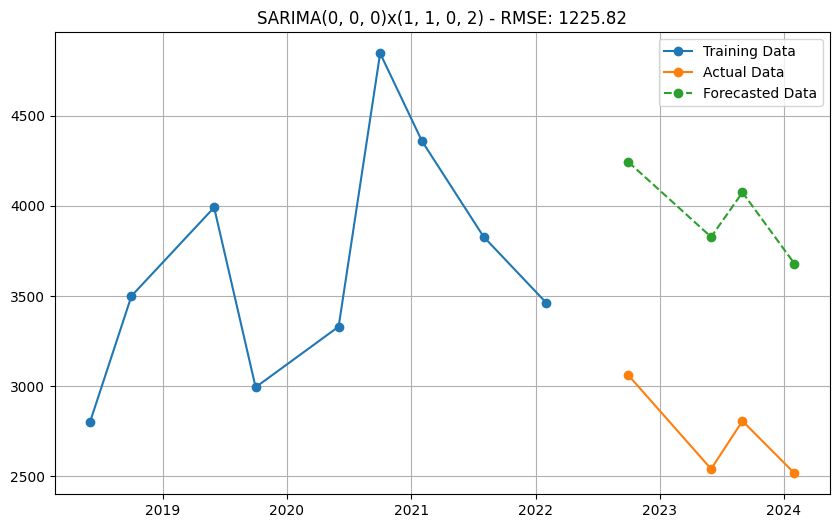

Model: SARIMA(0, 0, 0)x(1, 1, 0, 2) - AIC: 120.23 - RMSE: 1225.82


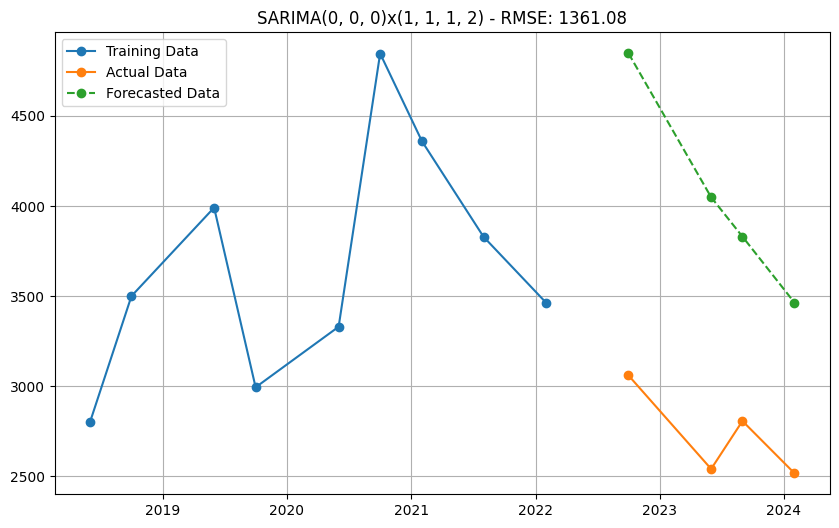

Model: SARIMA(0, 0, 0)x(1, 1, 1, 2) - AIC: 120.68 - RMSE: 1361.08


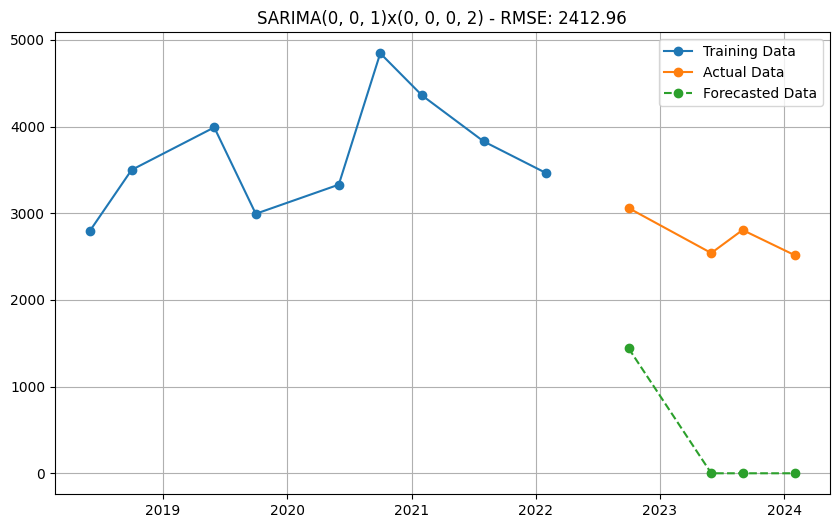

Model: SARIMA(0, 0, 1)x(0, 0, 0, 2) - AIC: 168.19 - RMSE: 2412.96


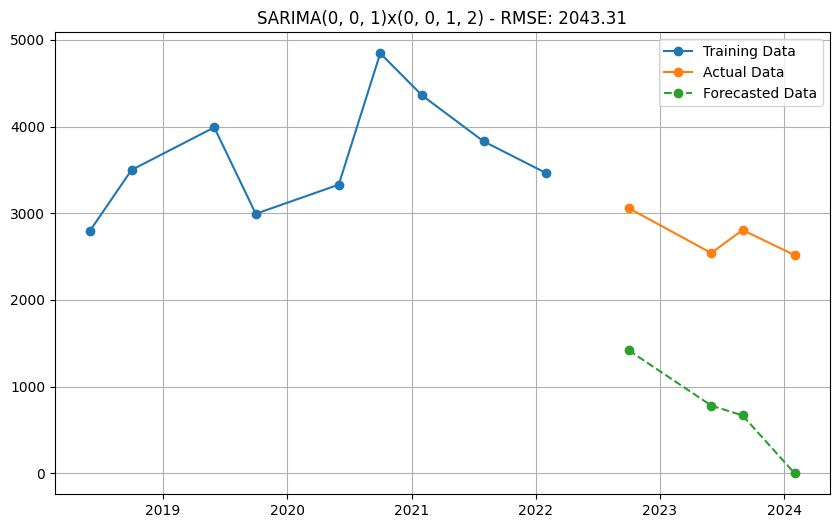

Model: SARIMA(0, 0, 1)x(0, 0, 1, 2) - AIC: 162.91 - RMSE: 2043.31


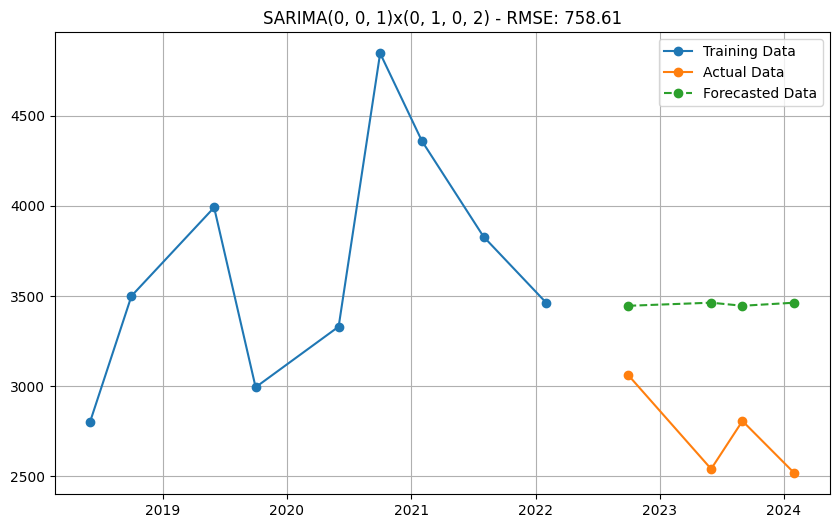

Model: SARIMA(0, 0, 1)x(0, 1, 0, 2) - AIC: 118.96 - RMSE: 758.61
New best model found: SARIMA(0, 0, 1)x(0, 1, 0, 2) - AIC: 118.96


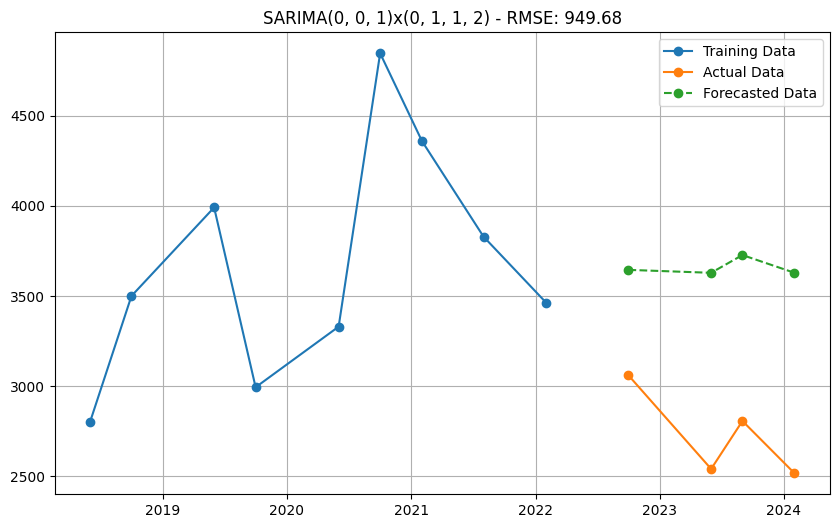

Model: SARIMA(0, 0, 1)x(0, 1, 1, 2) - AIC: 120.21 - RMSE: 949.68


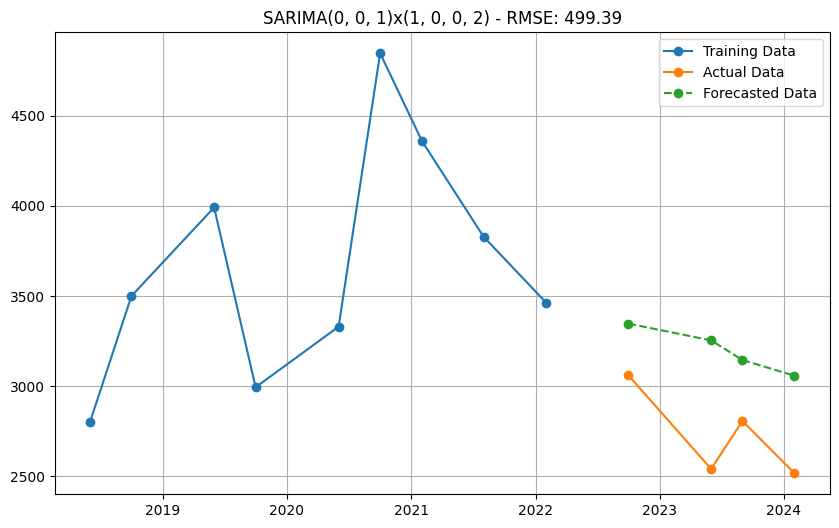

Model: SARIMA(0, 0, 1)x(1, 0, 0, 2) - AIC: 153.89 - RMSE: 499.39


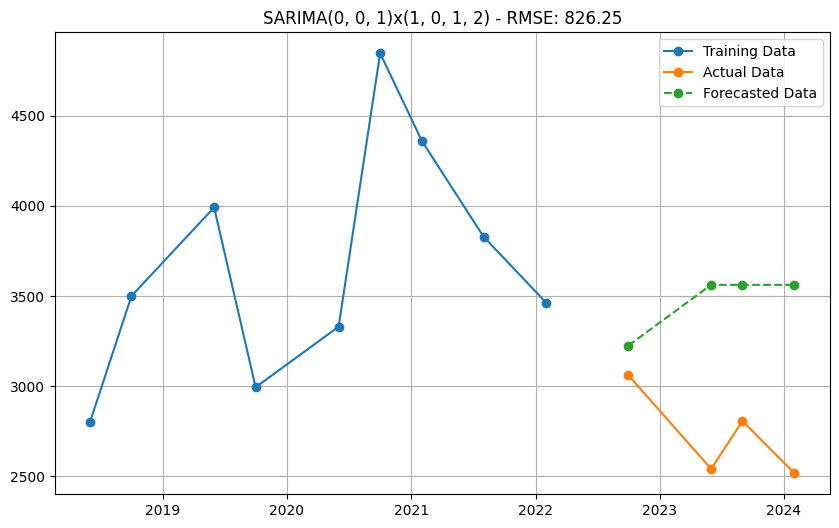

Model: SARIMA(0, 0, 1)x(1, 0, 1, 2) - AIC: 152.49 - RMSE: 826.25


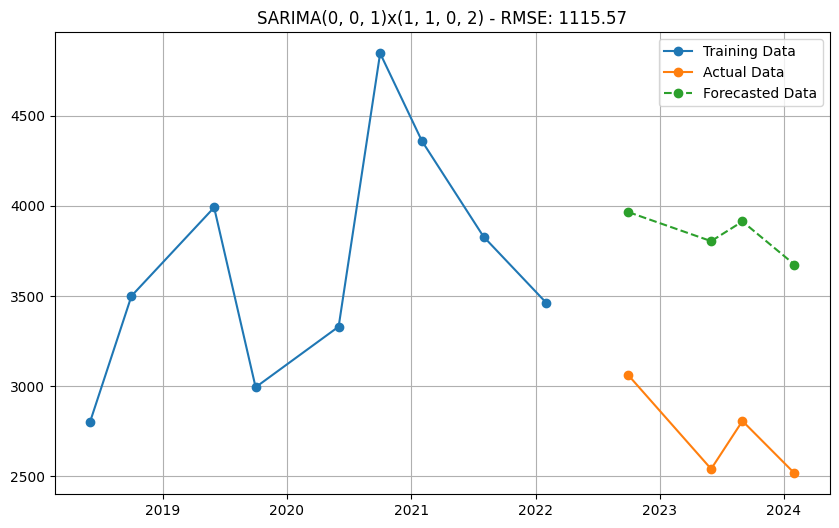

Model: SARIMA(0, 0, 1)x(1, 1, 0, 2) - AIC: 119.71 - RMSE: 1115.57


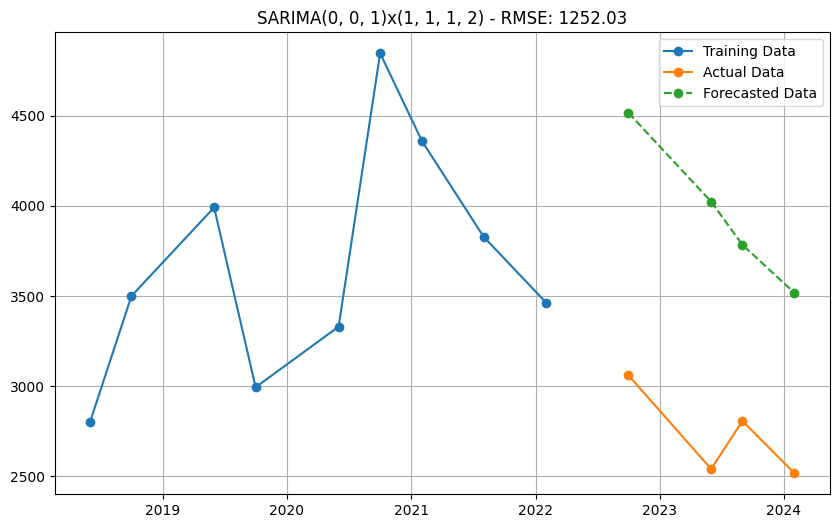

Model: SARIMA(0, 0, 1)x(1, 1, 1, 2) - AIC: 120.97 - RMSE: 1252.03


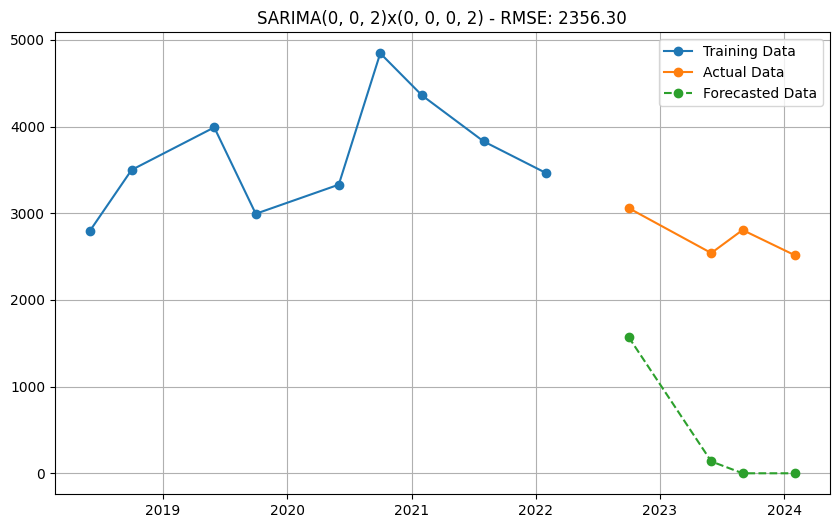

Model: SARIMA(0, 0, 2)x(0, 0, 0, 2) - AIC: 163.15 - RMSE: 2356.30
Failed to fit SARIMA(0, 0, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


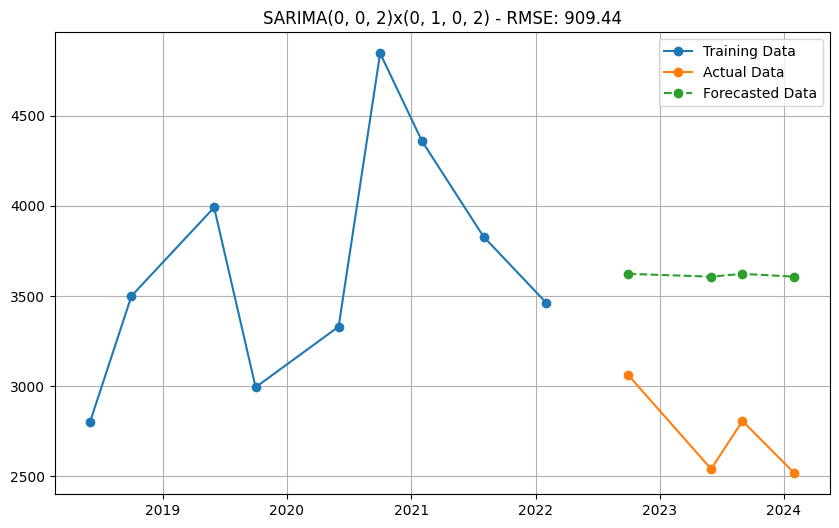

Model: SARIMA(0, 0, 2)x(0, 1, 0, 2) - AIC: 120.56 - RMSE: 909.44
Failed to fit SARIMA(0, 0, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


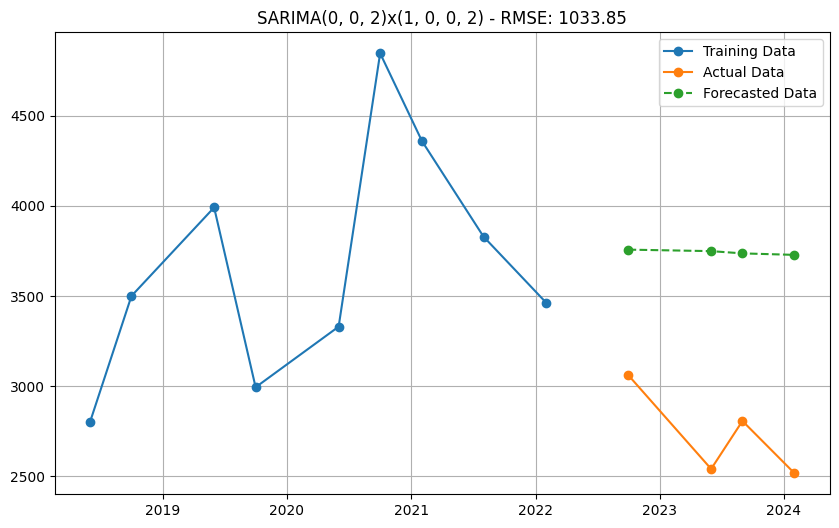

Model: SARIMA(0, 0, 2)x(1, 0, 0, 2) - AIC: 155.48 - RMSE: 1033.85
Failed to fit SARIMA(0, 0, 2)x(1, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


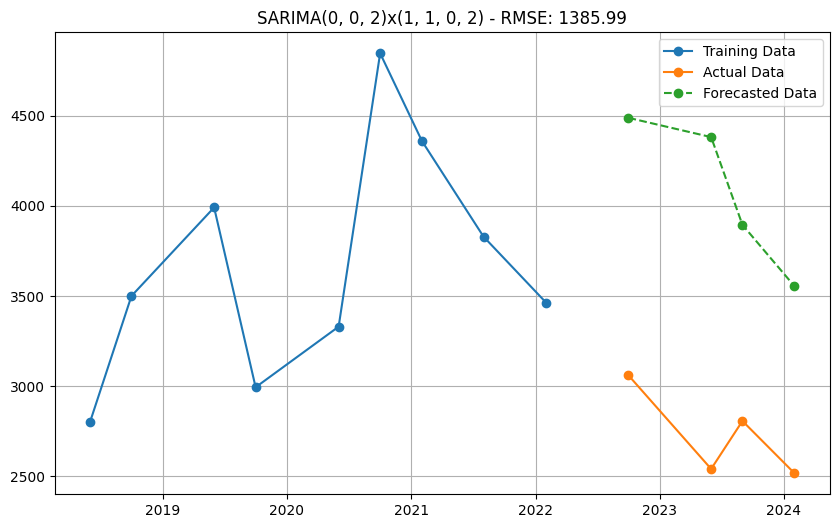

Model: SARIMA(0, 0, 2)x(1, 1, 0, 2) - AIC: 120.81 - RMSE: 1385.99
Failed to fit SARIMA(0, 0, 2)x(1, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


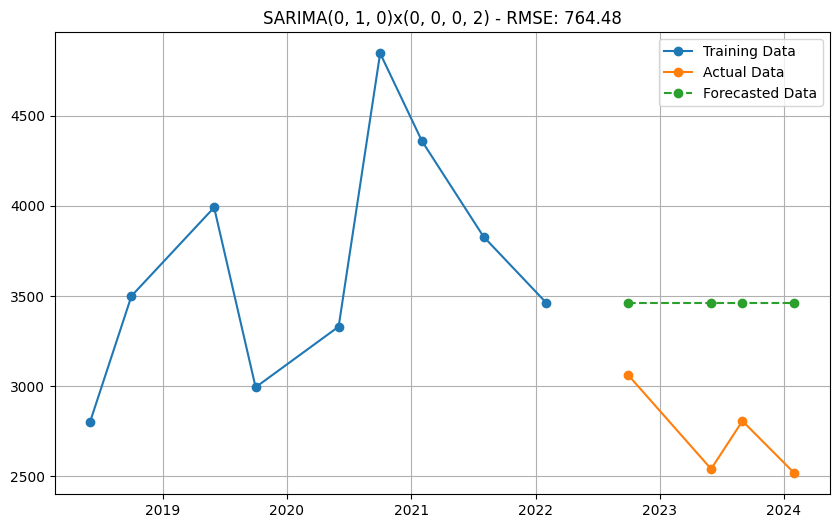

Model: SARIMA(0, 1, 0)x(0, 0, 0, 2) - AIC: 131.12 - RMSE: 764.48


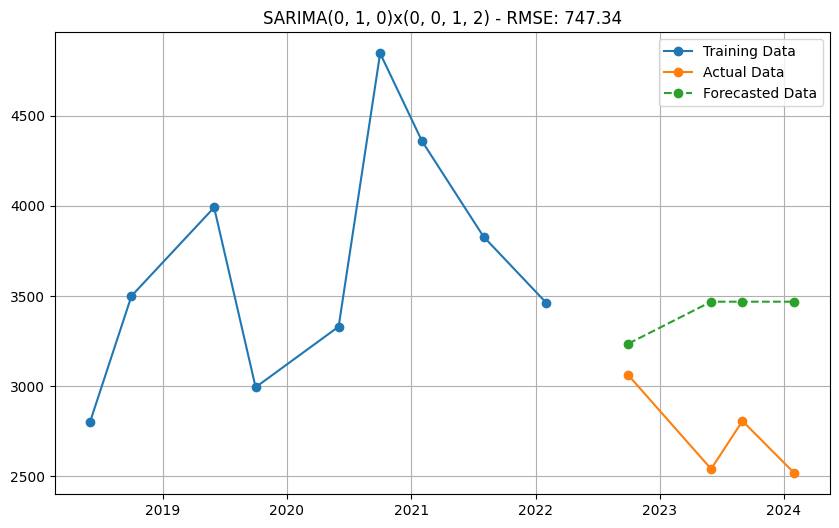

Model: SARIMA(0, 1, 0)x(0, 0, 1, 2) - AIC: 131.42 - RMSE: 747.34


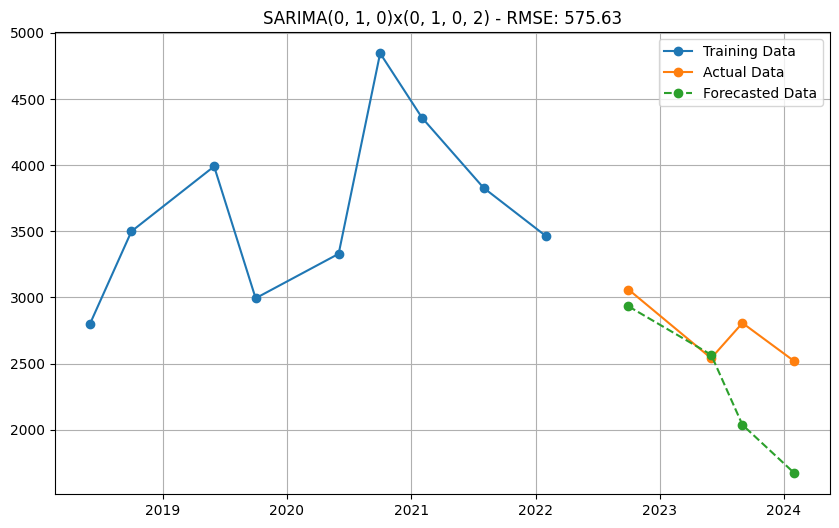

Model: SARIMA(0, 1, 0)x(0, 1, 0, 2) - AIC: 107.05 - RMSE: 575.63
New best model found: SARIMA(0, 1, 0)x(0, 1, 0, 2) - AIC: 107.05


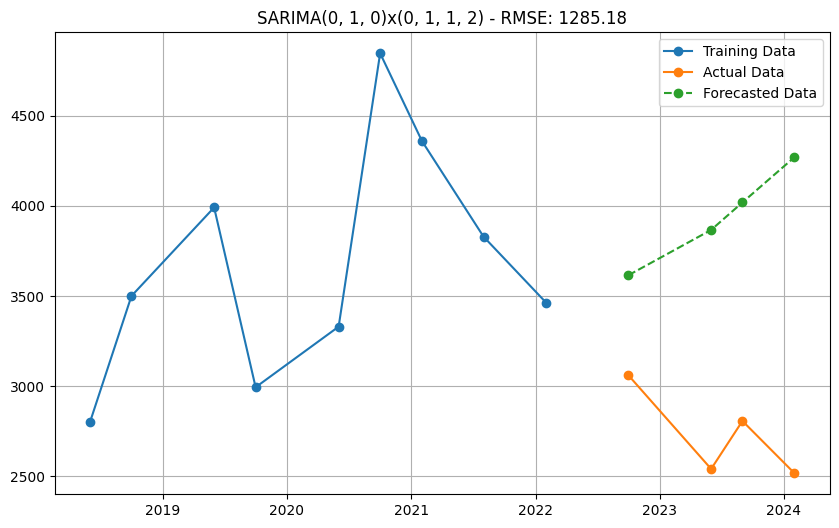

Model: SARIMA(0, 1, 0)x(0, 1, 1, 2) - AIC: 105.60 - RMSE: 1285.18
New best model found: SARIMA(0, 1, 0)x(0, 1, 1, 2) - AIC: 105.60


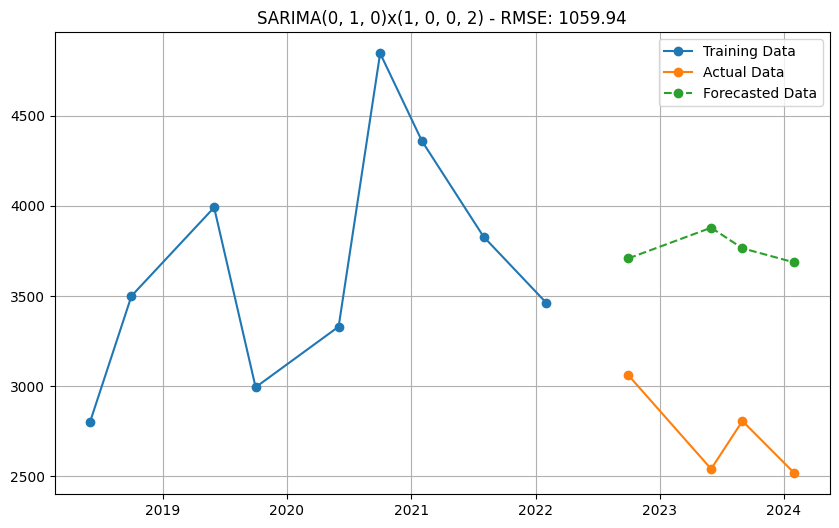

Model: SARIMA(0, 1, 0)x(1, 0, 0, 2) - AIC: 131.00 - RMSE: 1059.94


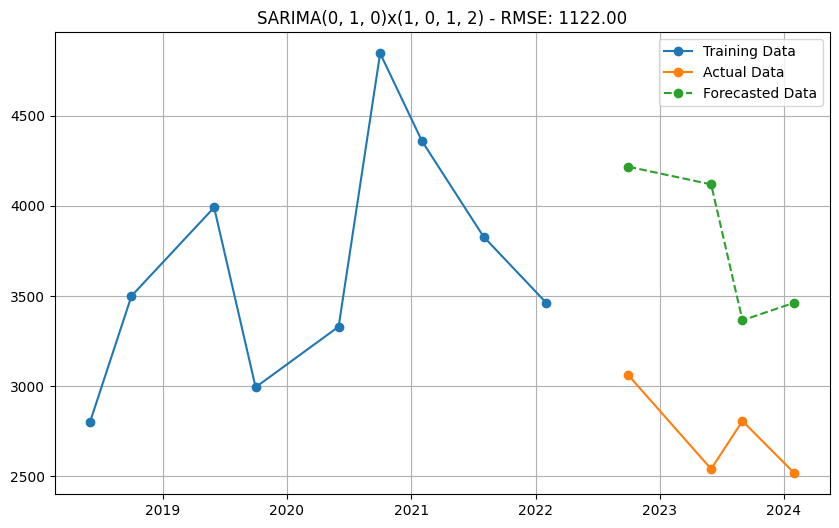

Model: SARIMA(0, 1, 0)x(1, 0, 1, 2) - AIC: 131.98 - RMSE: 1122.00


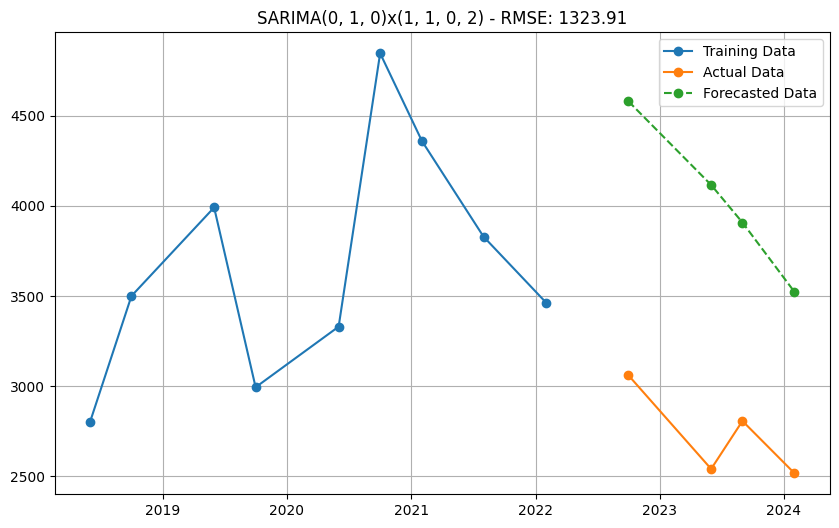

Model: SARIMA(0, 1, 0)x(1, 1, 0, 2) - AIC: 103.46 - RMSE: 1323.91
New best model found: SARIMA(0, 1, 0)x(1, 1, 0, 2) - AIC: 103.46


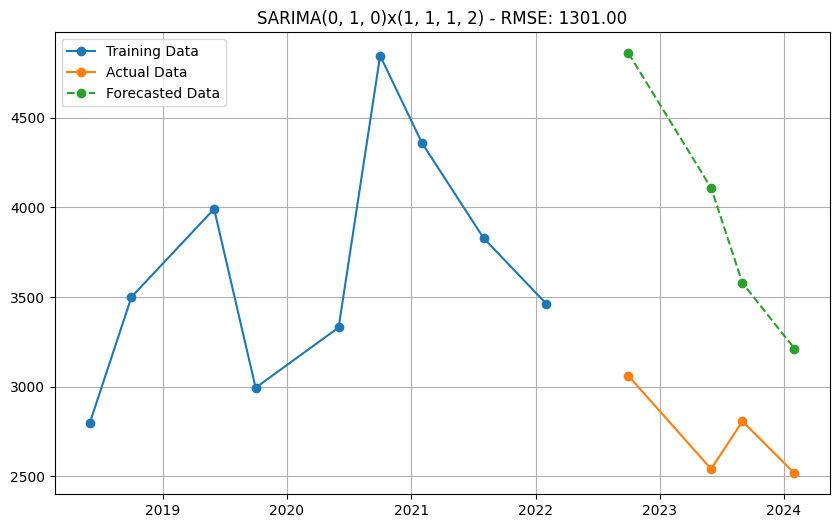

Model: SARIMA(0, 1, 0)x(1, 1, 1, 2) - AIC: 104.62 - RMSE: 1301.00


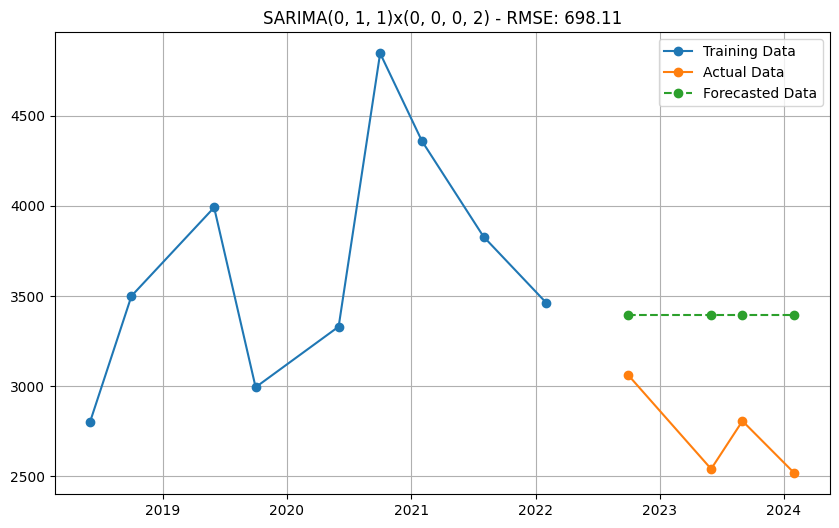

Model: SARIMA(0, 1, 1)x(0, 0, 0, 2) - AIC: 132.90 - RMSE: 698.11


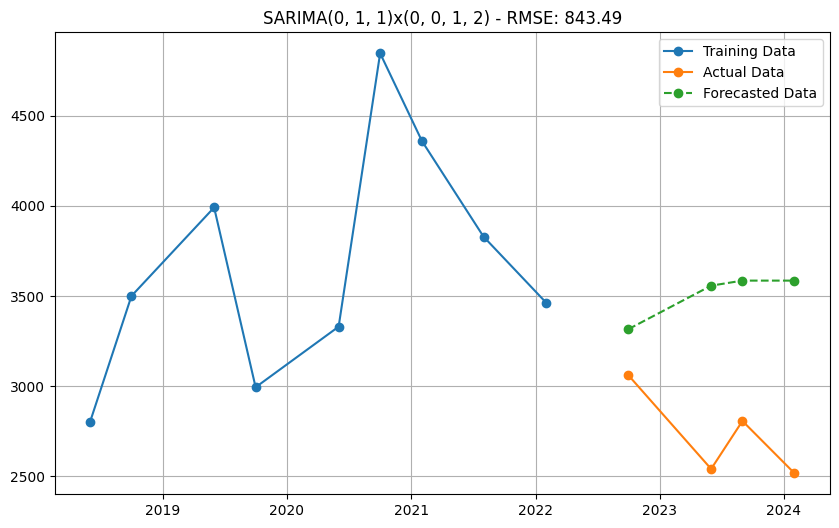

Model: SARIMA(0, 1, 1)x(0, 0, 1, 2) - AIC: 133.21 - RMSE: 843.49


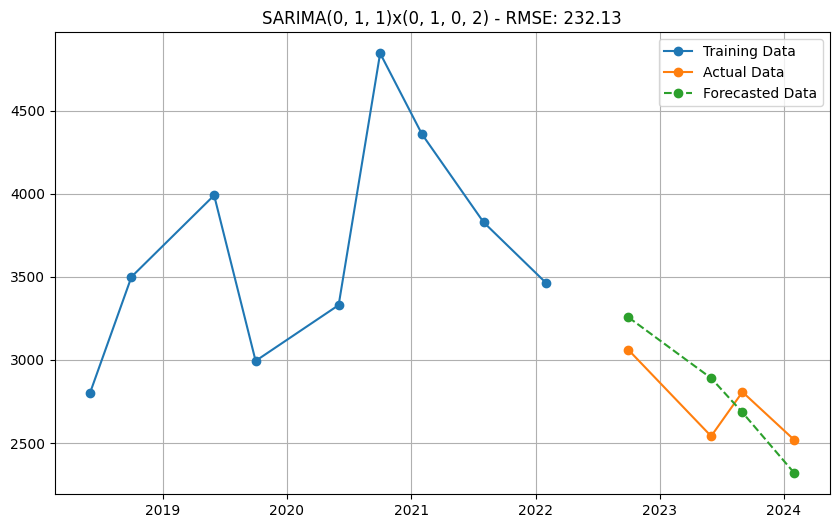

Model: SARIMA(0, 1, 1)x(0, 1, 0, 2) - AIC: 108.14 - RMSE: 232.13


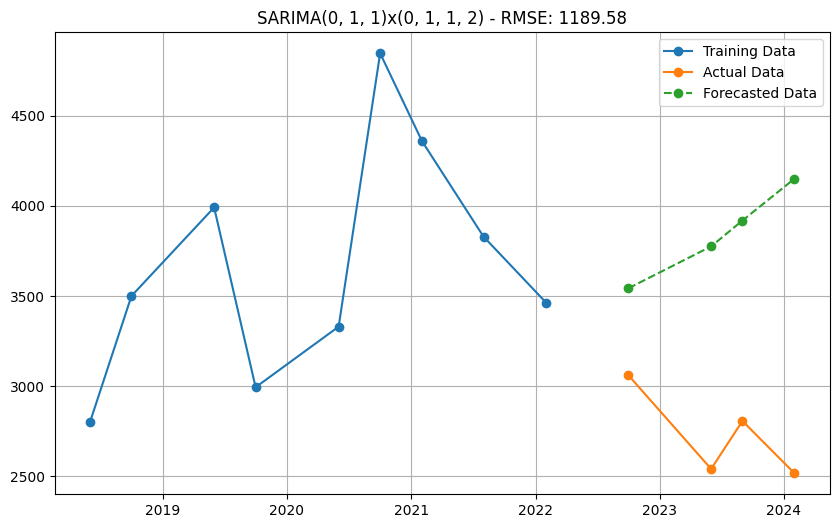

Model: SARIMA(0, 1, 1)x(0, 1, 1, 2) - AIC: 107.54 - RMSE: 1189.58


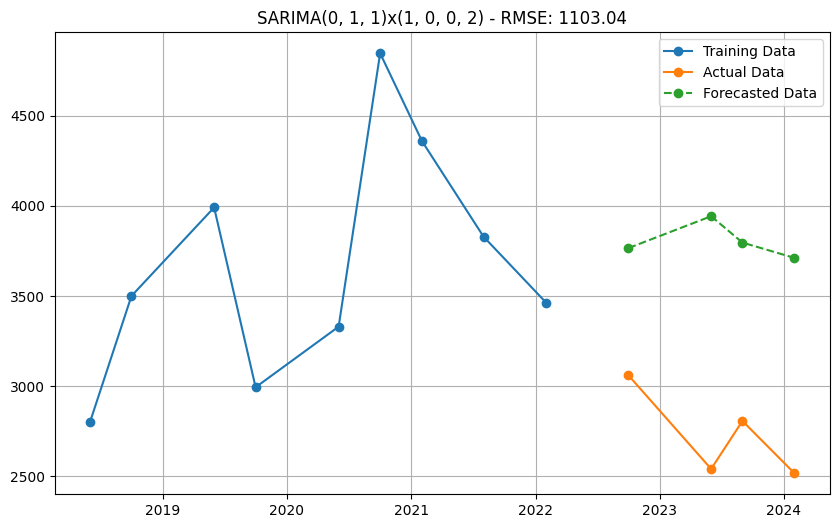

Model: SARIMA(0, 1, 1)x(1, 0, 0, 2) - AIC: 132.96 - RMSE: 1103.04


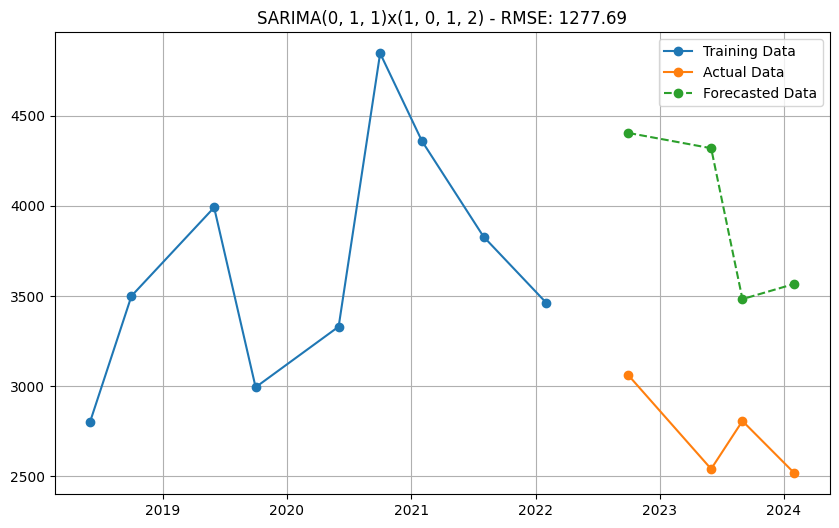

Model: SARIMA(0, 1, 1)x(1, 0, 1, 2) - AIC: 133.25 - RMSE: 1277.69


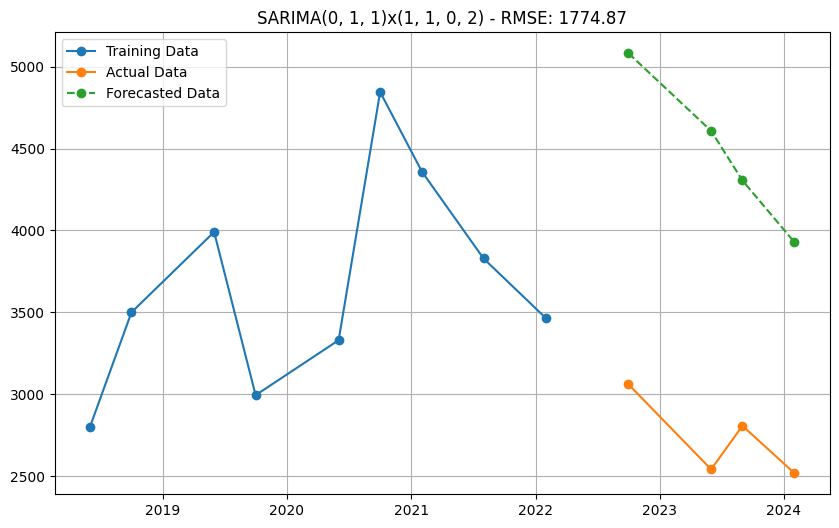

Model: SARIMA(0, 1, 1)x(1, 1, 0, 2) - AIC: 104.47 - RMSE: 1774.87


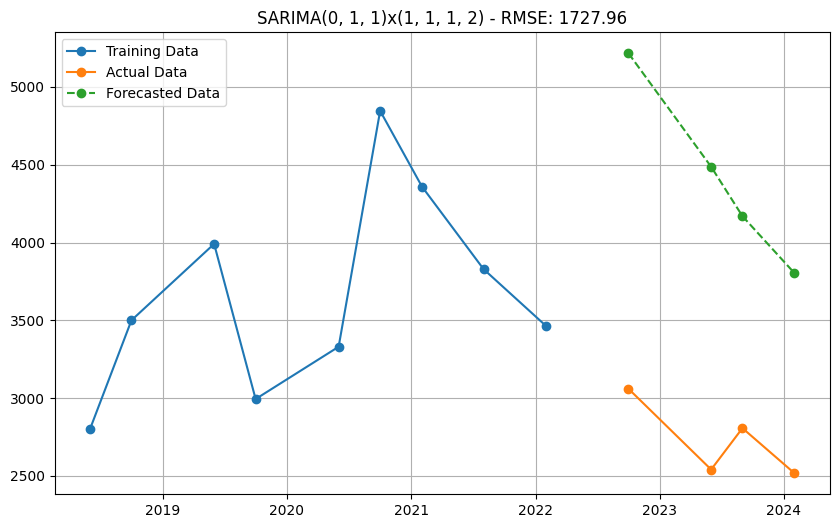

Model: SARIMA(0, 1, 1)x(1, 1, 1, 2) - AIC: 104.71 - RMSE: 1727.96


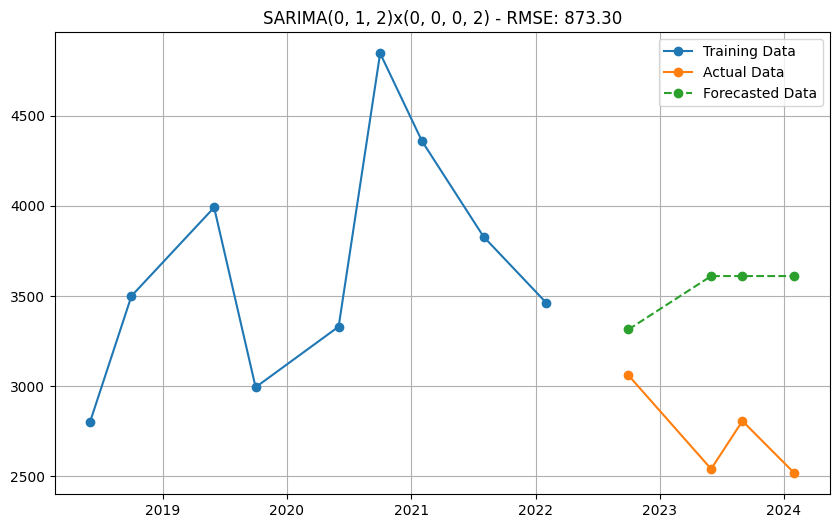

Model: SARIMA(0, 1, 2)x(0, 0, 0, 2) - AIC: 132.84 - RMSE: 873.30
Failed to fit SARIMA(0, 1, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


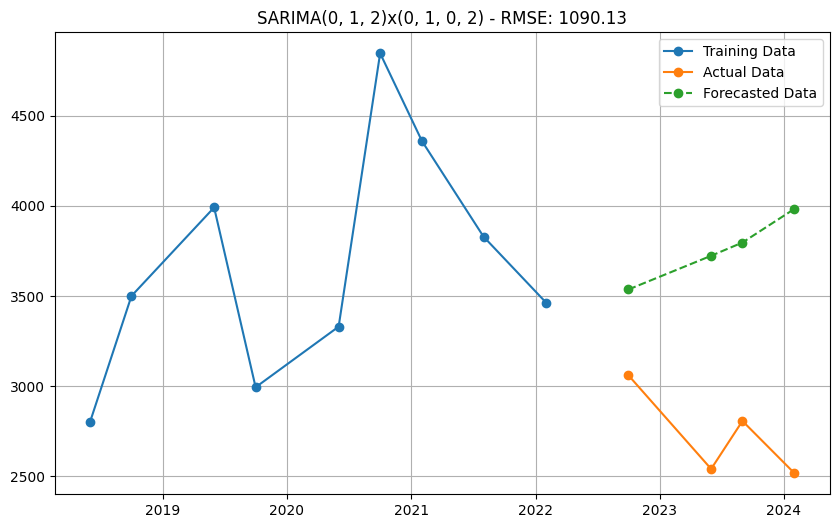

Model: SARIMA(0, 1, 2)x(0, 1, 0, 2) - AIC: 107.58 - RMSE: 1090.13
Failed to fit SARIMA(0, 1, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


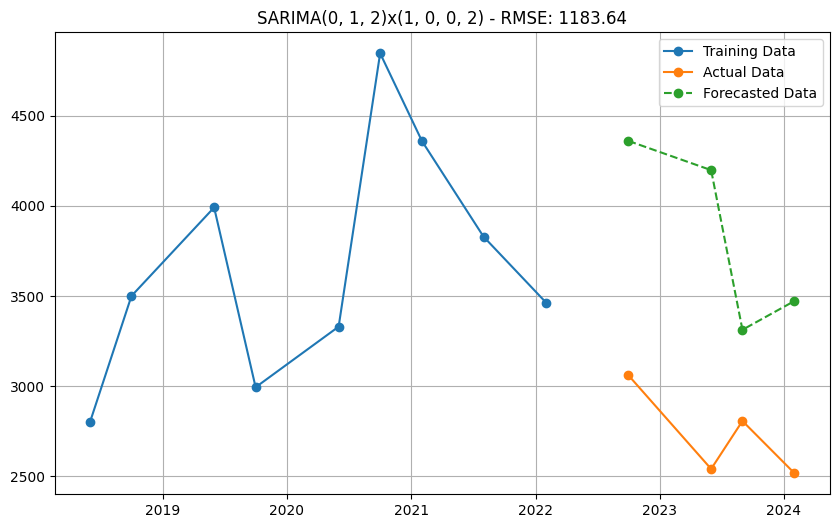

Model: SARIMA(0, 1, 2)x(1, 0, 0, 2) - AIC: 133.88 - RMSE: 1183.64
Failed to fit SARIMA(0, 1, 2)x(1, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


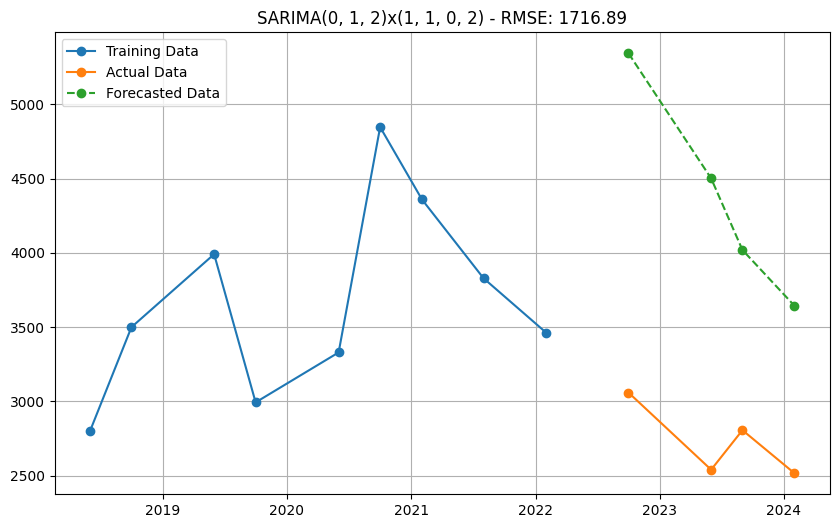

Model: SARIMA(0, 1, 2)x(1, 1, 0, 2) - AIC: 104.61 - RMSE: 1716.89
Failed to fit SARIMA(0, 1, 2)x(1, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


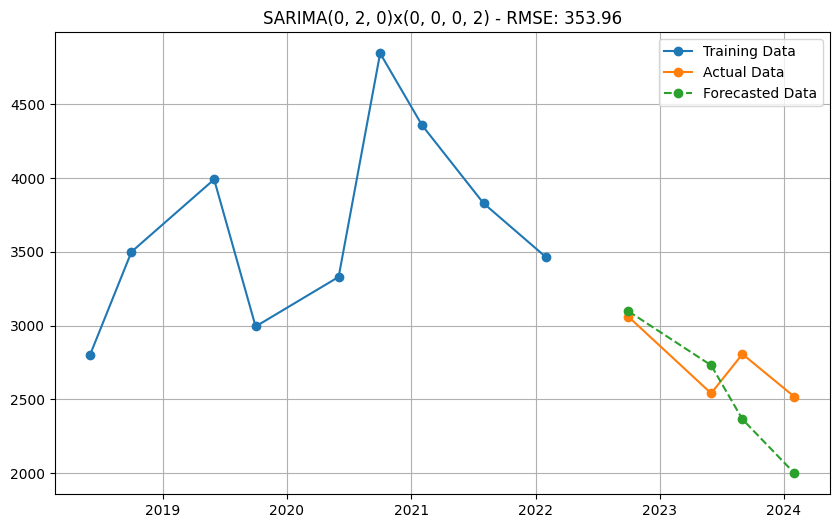

Model: SARIMA(0, 2, 0)x(0, 0, 0, 2) - AIC: 120.69 - RMSE: 353.96


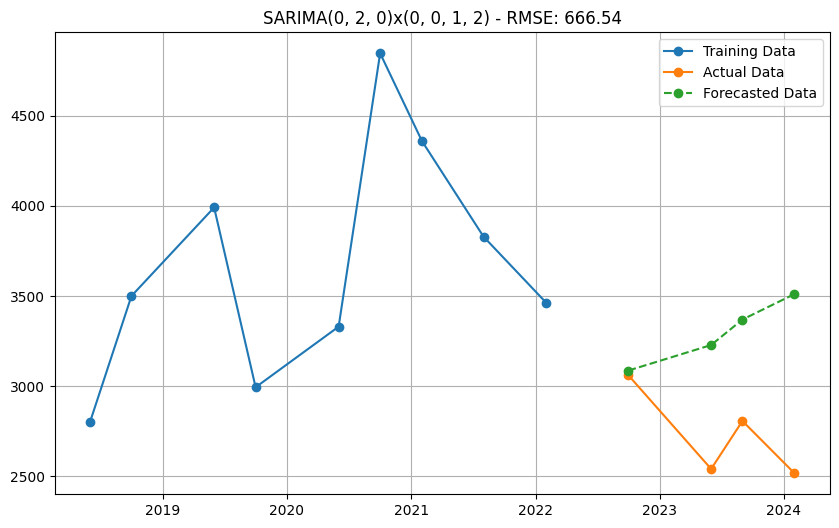

Model: SARIMA(0, 2, 0)x(0, 0, 1, 2) - AIC: 120.16 - RMSE: 666.54


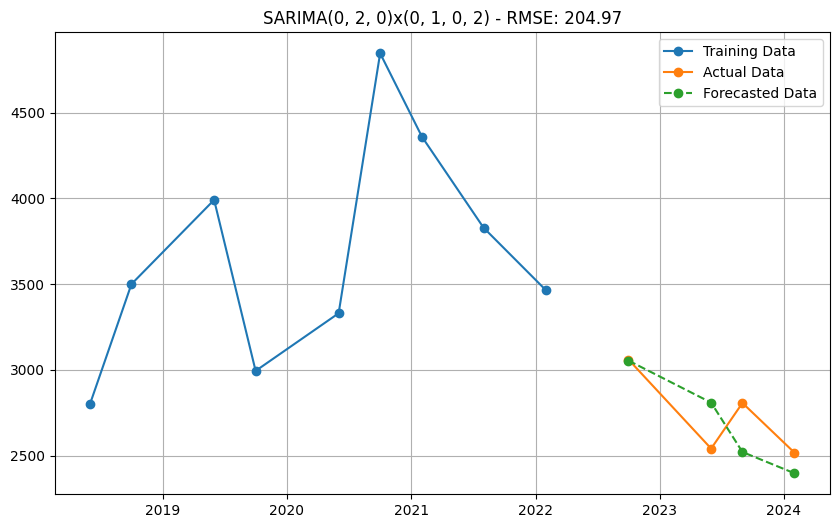

Model: SARIMA(0, 2, 0)x(0, 1, 0, 2) - AIC: 93.67 - RMSE: 204.97
New best model found: SARIMA(0, 2, 0)x(0, 1, 0, 2) - AIC: 93.67


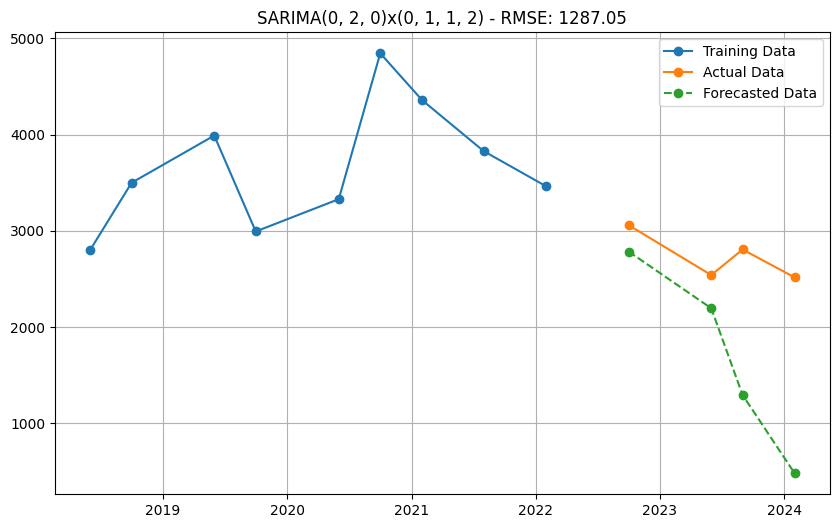

Model: SARIMA(0, 2, 0)x(0, 1, 1, 2) - AIC: 92.17 - RMSE: 1287.05
New best model found: SARIMA(0, 2, 0)x(0, 1, 1, 2) - AIC: 92.17


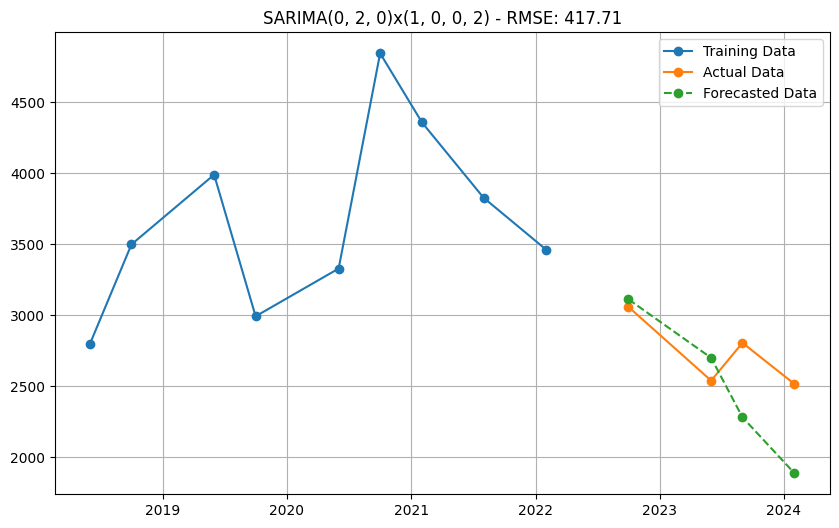

Model: SARIMA(0, 2, 0)x(1, 0, 0, 2) - AIC: 121.42 - RMSE: 417.71


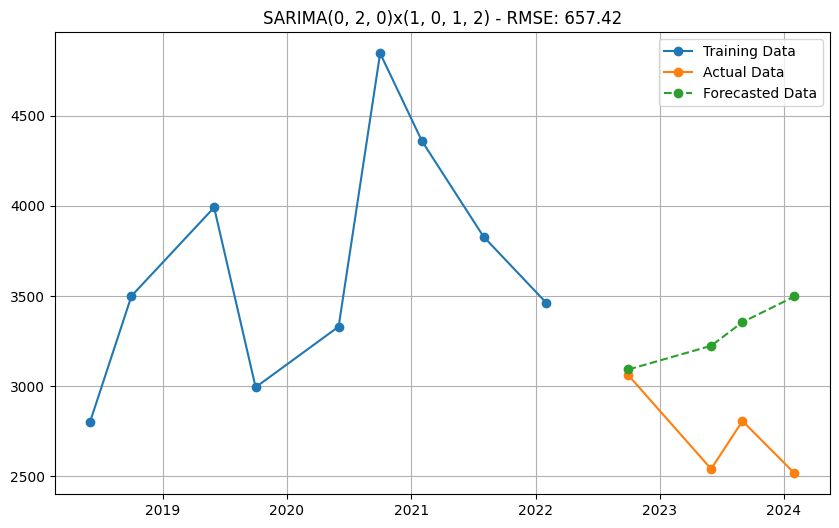

Model: SARIMA(0, 2, 0)x(1, 0, 1, 2) - AIC: 122.16 - RMSE: 657.42


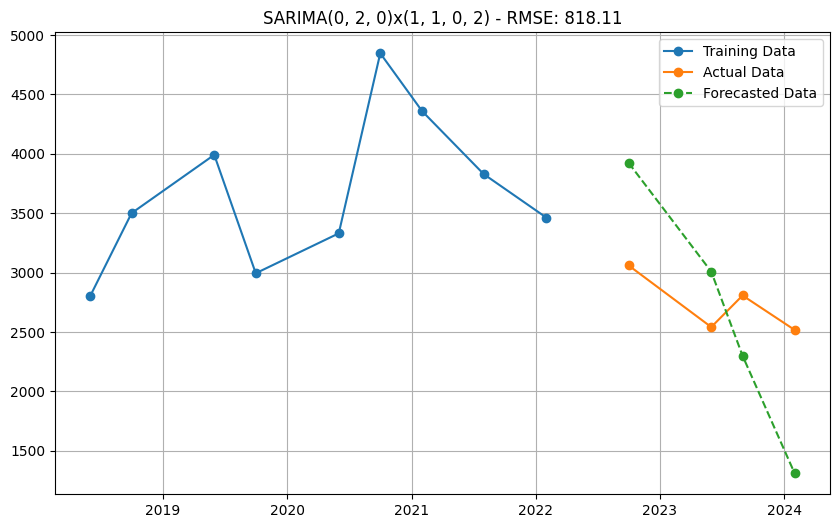

Model: SARIMA(0, 2, 0)x(1, 1, 0, 2) - AIC: 91.98 - RMSE: 818.11
New best model found: SARIMA(0, 2, 0)x(1, 1, 0, 2) - AIC: 91.98


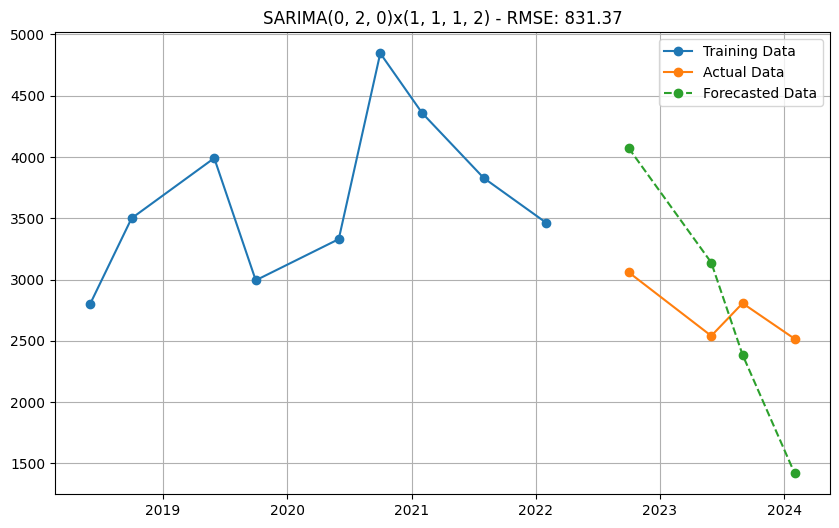

Model: SARIMA(0, 2, 0)x(1, 1, 1, 2) - AIC: 93.98 - RMSE: 831.37


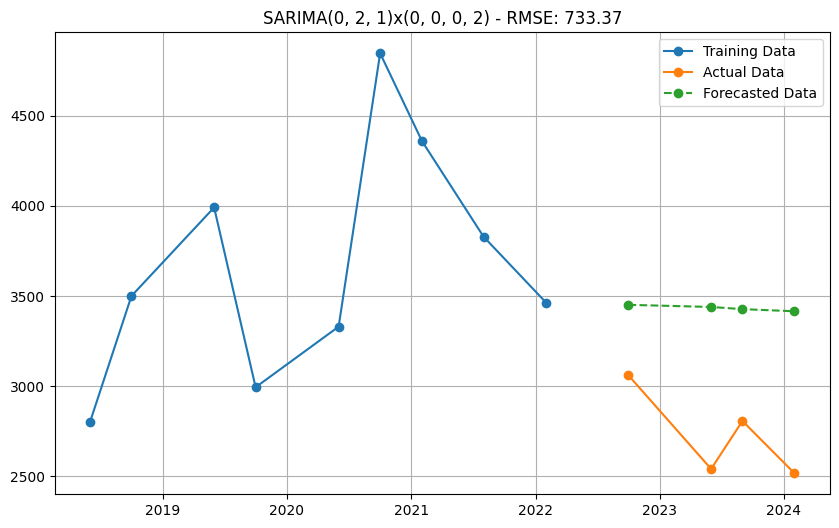

Model: SARIMA(0, 2, 1)x(0, 0, 0, 2) - AIC: 120.79 - RMSE: 733.37


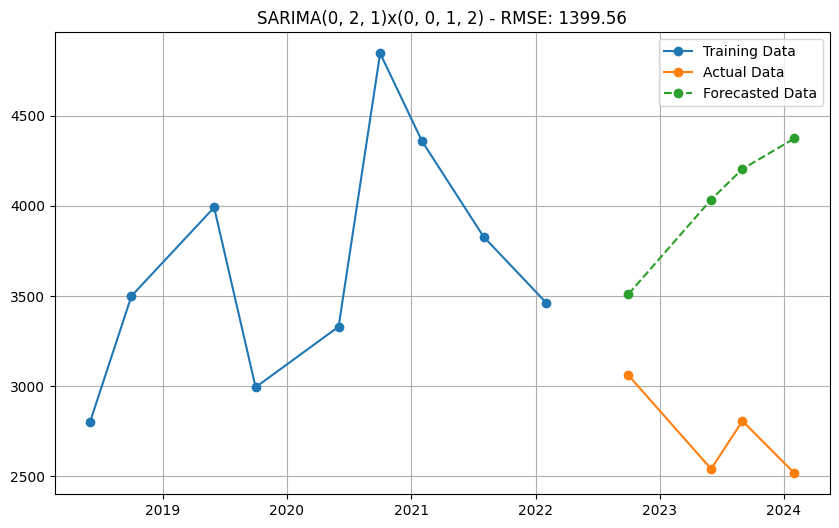

Model: SARIMA(0, 2, 1)x(0, 0, 1, 2) - AIC: 120.89 - RMSE: 1399.56


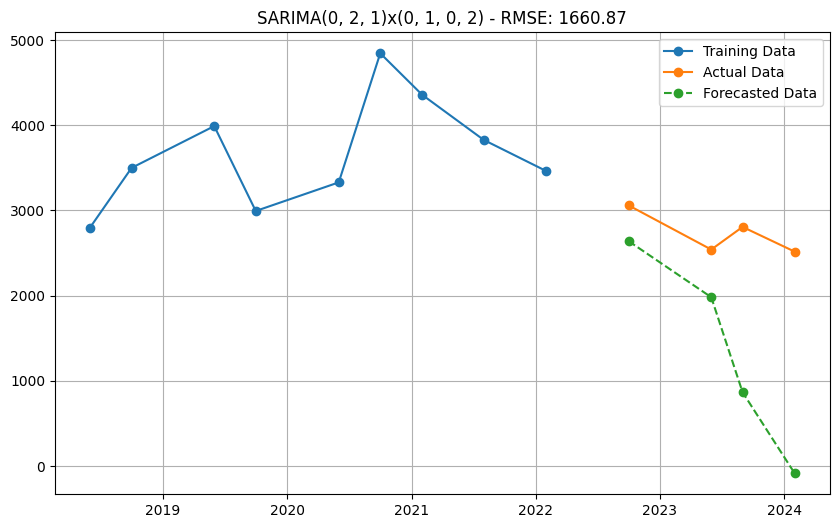

Model: SARIMA(0, 2, 1)x(0, 1, 0, 2) - AIC: 92.48 - RMSE: 1660.87


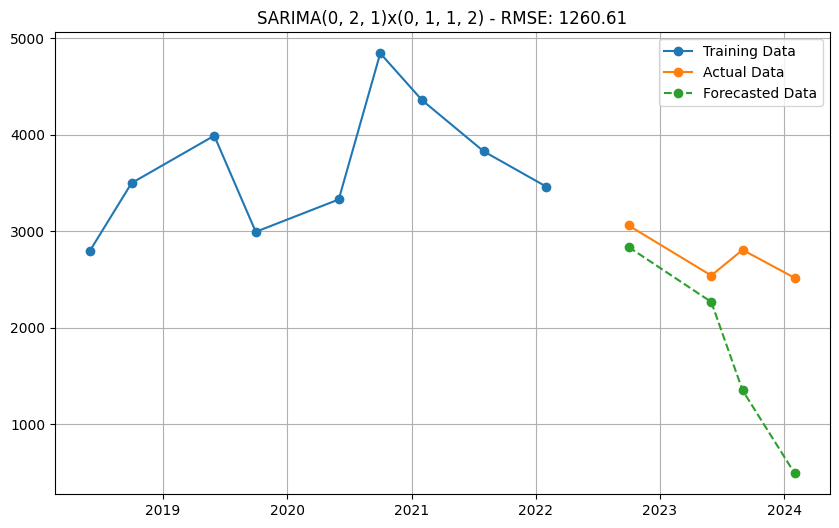

Model: SARIMA(0, 2, 1)x(0, 1, 1, 2) - AIC: 91.36 - RMSE: 1260.61
New best model found: SARIMA(0, 2, 1)x(0, 1, 1, 2) - AIC: 91.36


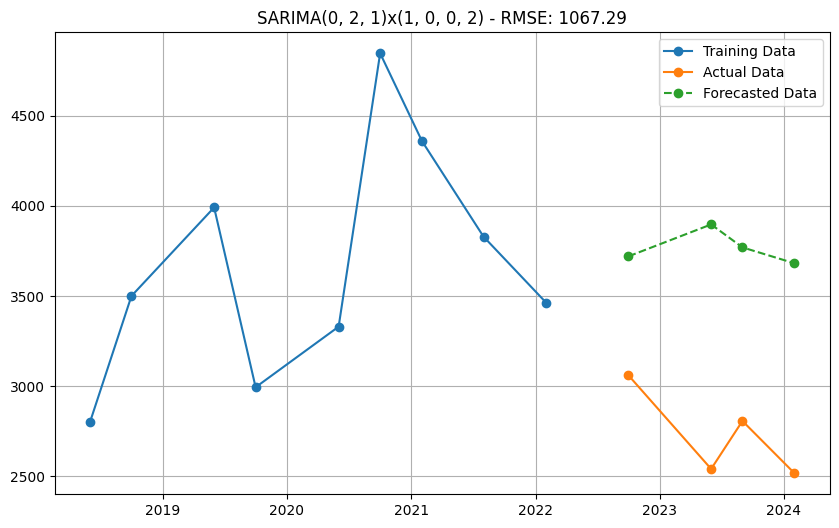

Model: SARIMA(0, 2, 1)x(1, 0, 0, 2) - AIC: 120.92 - RMSE: 1067.29


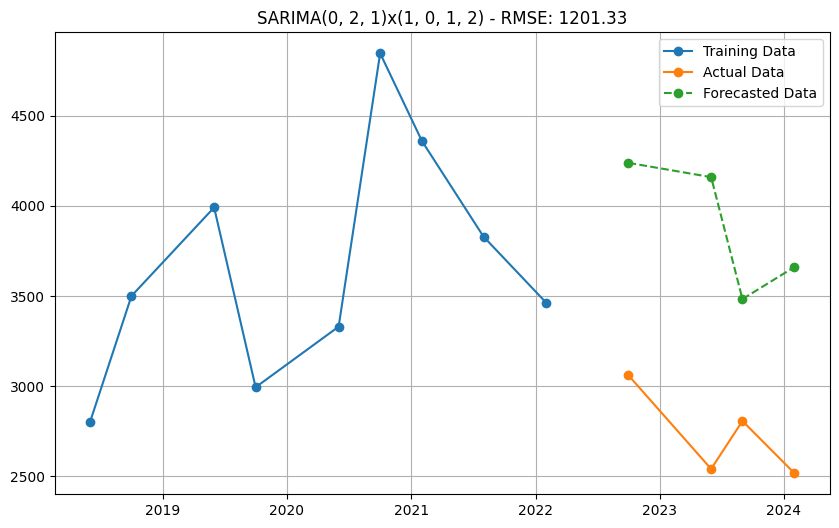

Model: SARIMA(0, 2, 1)x(1, 0, 1, 2) - AIC: 122.30 - RMSE: 1201.33


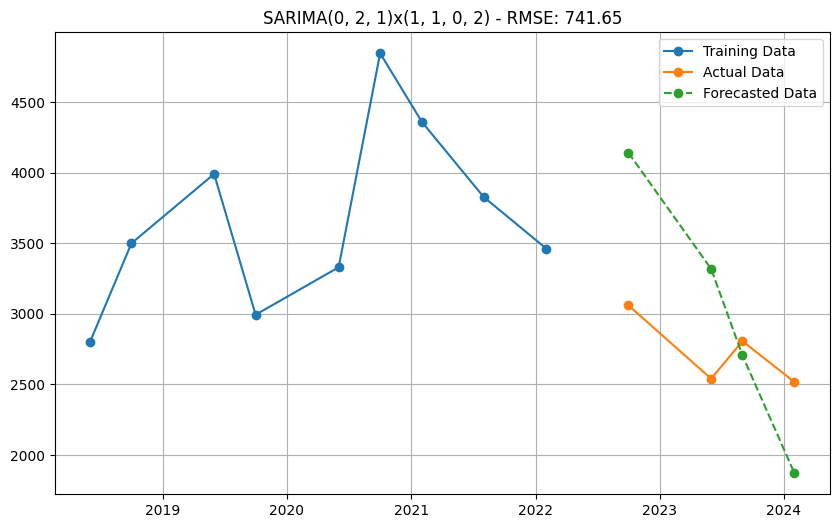

Model: SARIMA(0, 2, 1)x(1, 1, 0, 2) - AIC: 90.28 - RMSE: 741.65
New best model found: SARIMA(0, 2, 1)x(1, 1, 0, 2) - AIC: 90.28


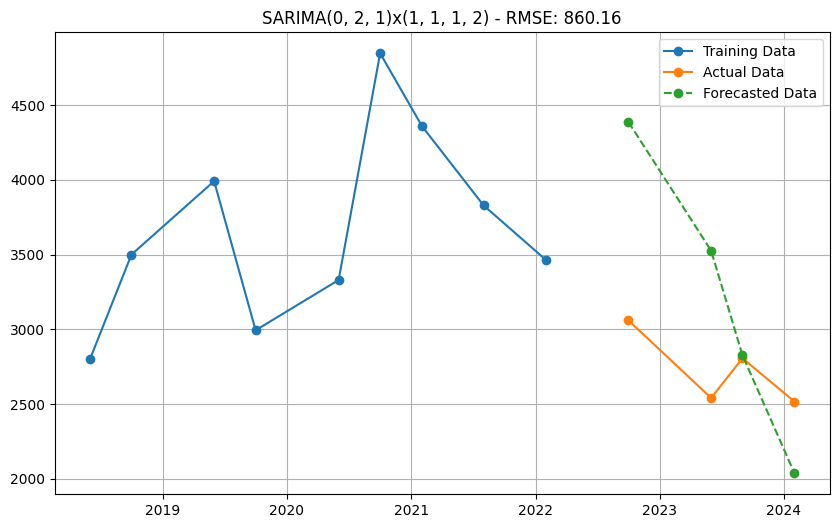

Model: SARIMA(0, 2, 1)x(1, 1, 1, 2) - AIC: 92.23 - RMSE: 860.16


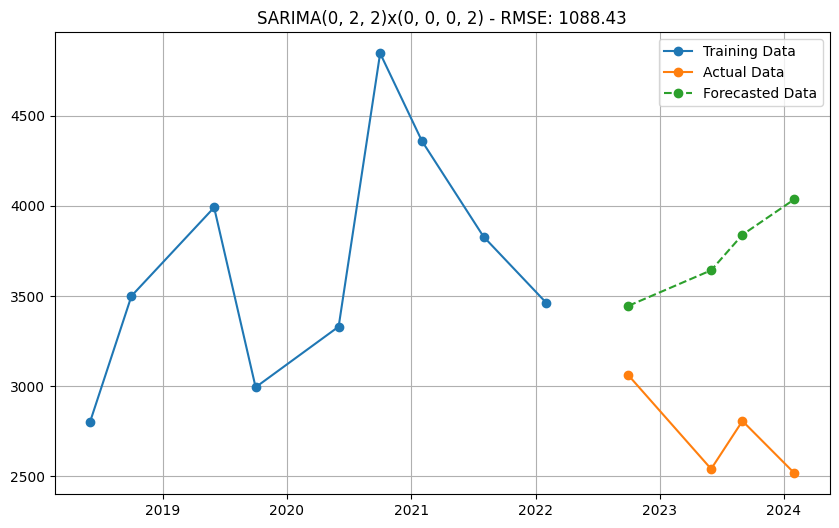

Model: SARIMA(0, 2, 2)x(0, 0, 0, 2) - AIC: 122.02 - RMSE: 1088.43
Failed to fit SARIMA(0, 2, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


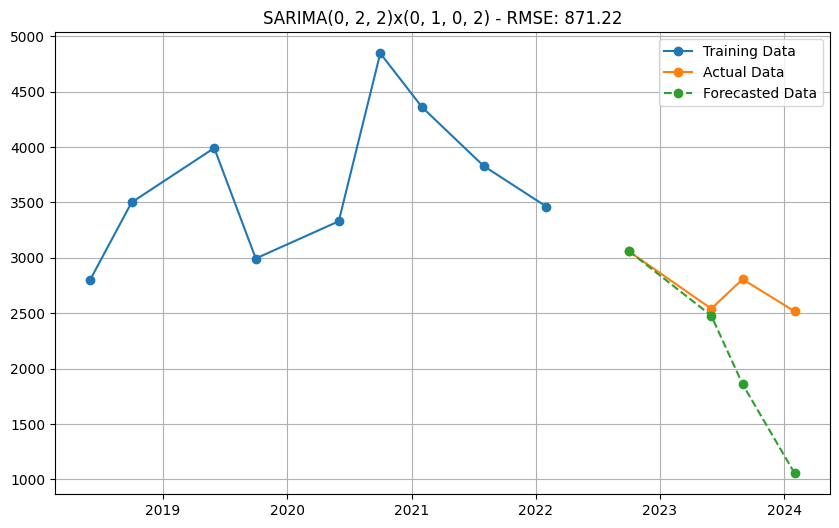

Model: SARIMA(0, 2, 2)x(0, 1, 0, 2) - AIC: 94.05 - RMSE: 871.22
Failed to fit SARIMA(0, 2, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


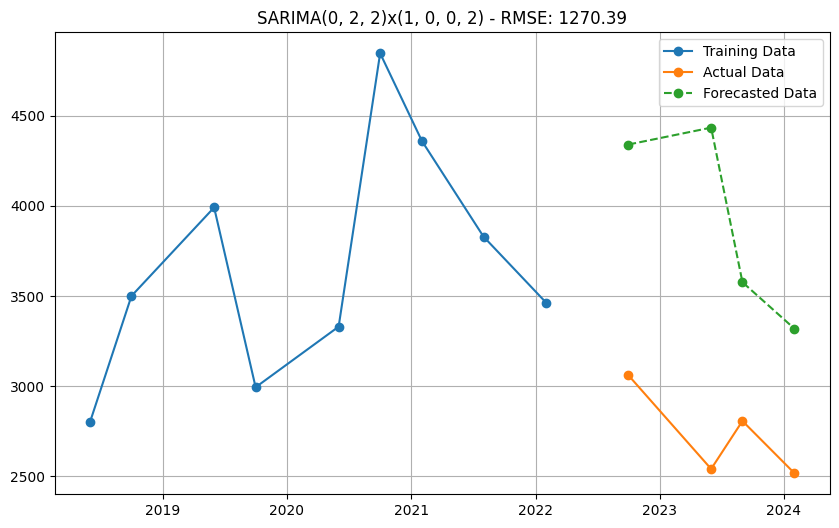

Model: SARIMA(0, 2, 2)x(1, 0, 0, 2) - AIC: 121.54 - RMSE: 1270.39
Failed to fit SARIMA(0, 2, 2)x(1, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


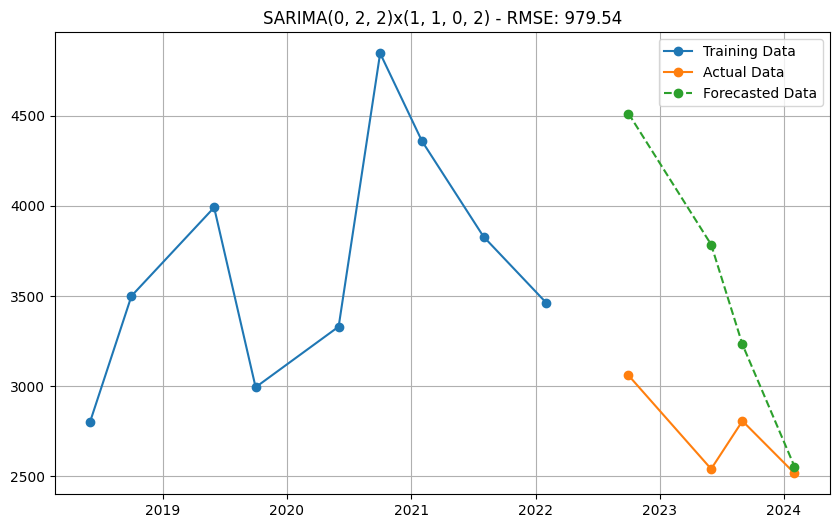

Model: SARIMA(0, 2, 2)x(1, 1, 0, 2) - AIC: 91.44 - RMSE: 979.54
Failed to fit SARIMA(0, 2, 2)x(1, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


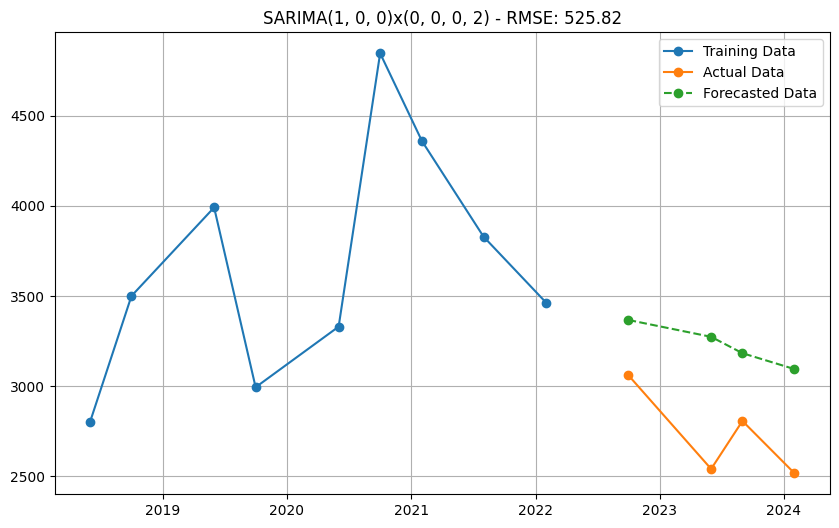

Model: SARIMA(1, 0, 0)x(0, 0, 0, 2) - AIC: 152.00 - RMSE: 525.82


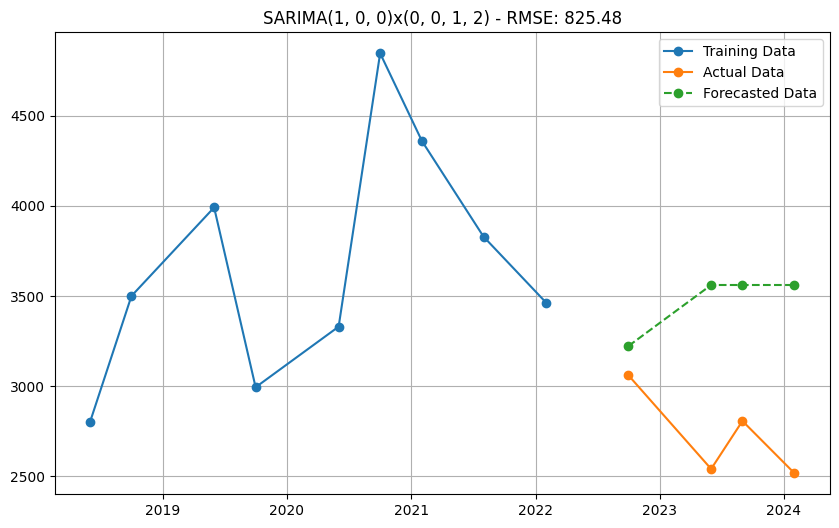

Model: SARIMA(1, 0, 0)x(0, 0, 1, 2) - AIC: 150.48 - RMSE: 825.48


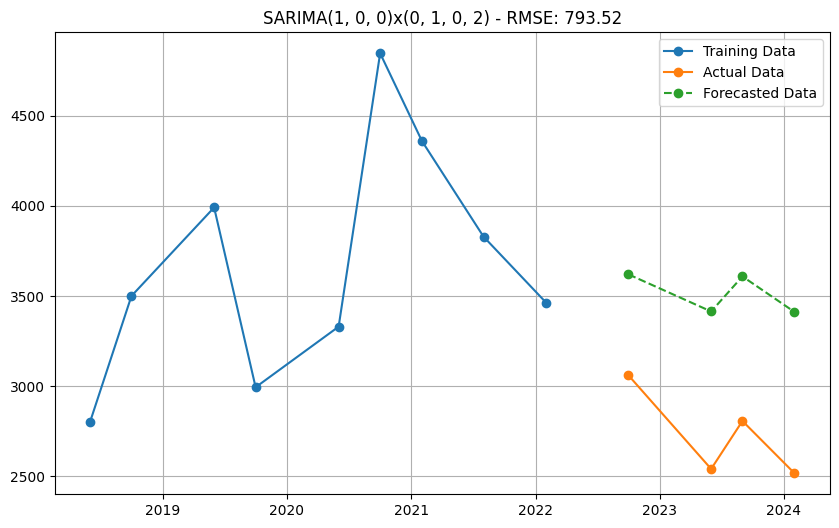

Model: SARIMA(1, 0, 0)x(0, 1, 0, 2) - AIC: 121.36 - RMSE: 793.52


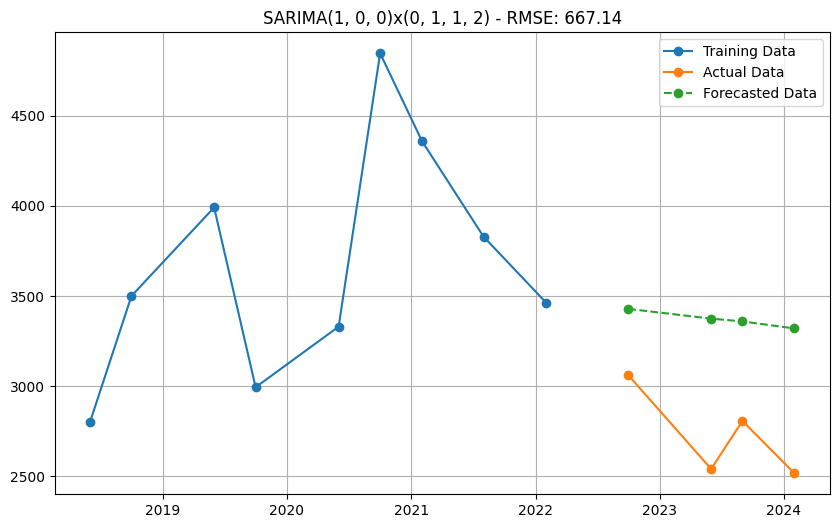

Model: SARIMA(1, 0, 0)x(0, 1, 1, 2) - AIC: 120.71 - RMSE: 667.14


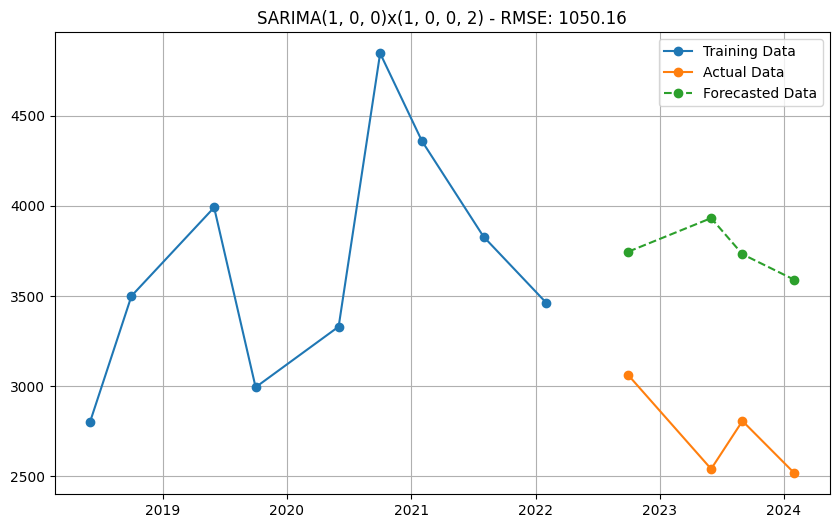

Model: SARIMA(1, 0, 0)x(1, 0, 0, 2) - AIC: 150.59 - RMSE: 1050.16


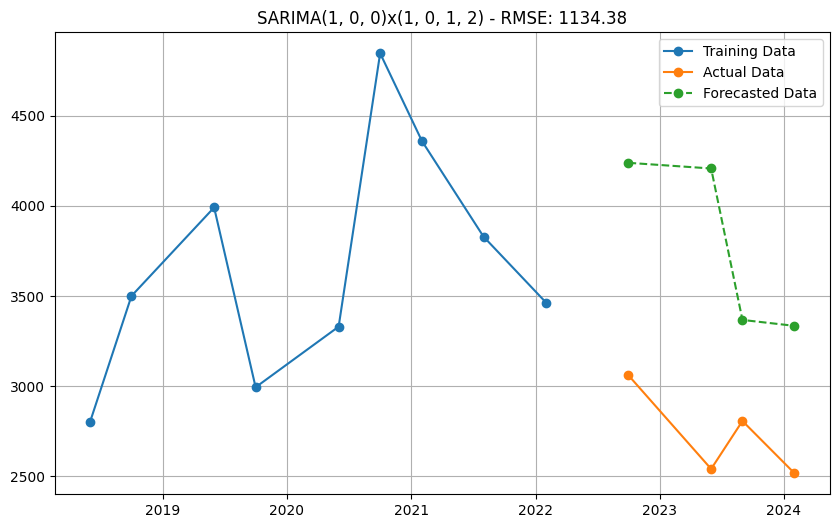

Model: SARIMA(1, 0, 0)x(1, 0, 1, 2) - AIC: 152.27 - RMSE: 1134.38


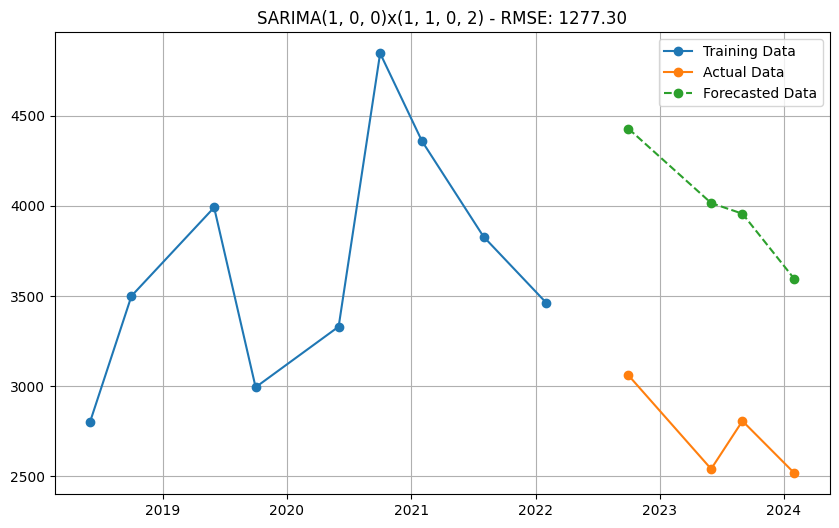

Model: SARIMA(1, 0, 0)x(1, 1, 0, 2) - AIC: 118.64 - RMSE: 1277.30


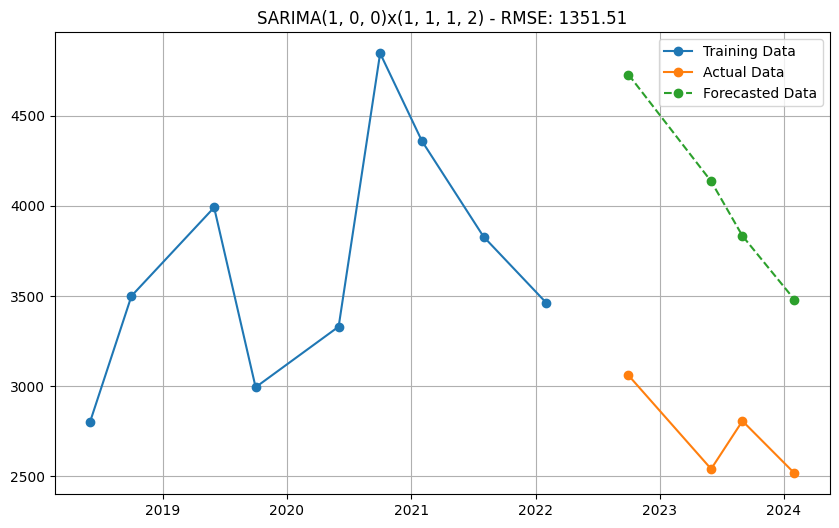

Model: SARIMA(1, 0, 0)x(1, 1, 1, 2) - AIC: 120.29 - RMSE: 1351.51


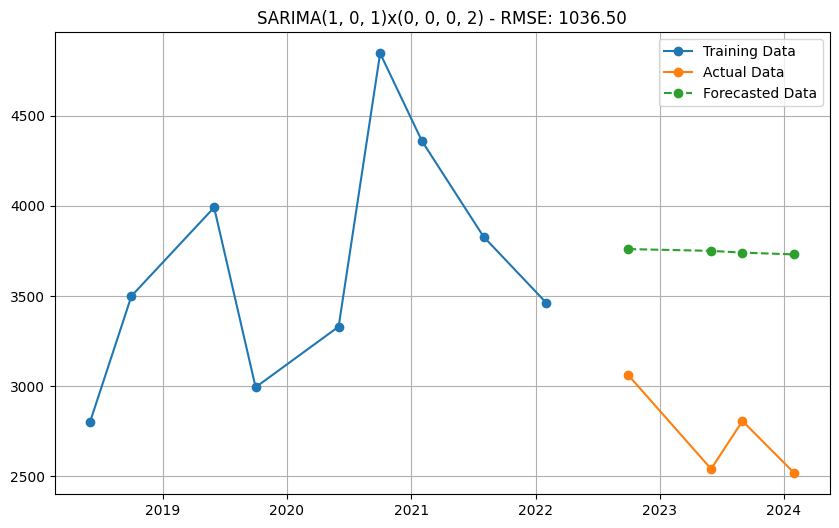

Model: SARIMA(1, 0, 1)x(0, 0, 0, 2) - AIC: 153.49 - RMSE: 1036.50


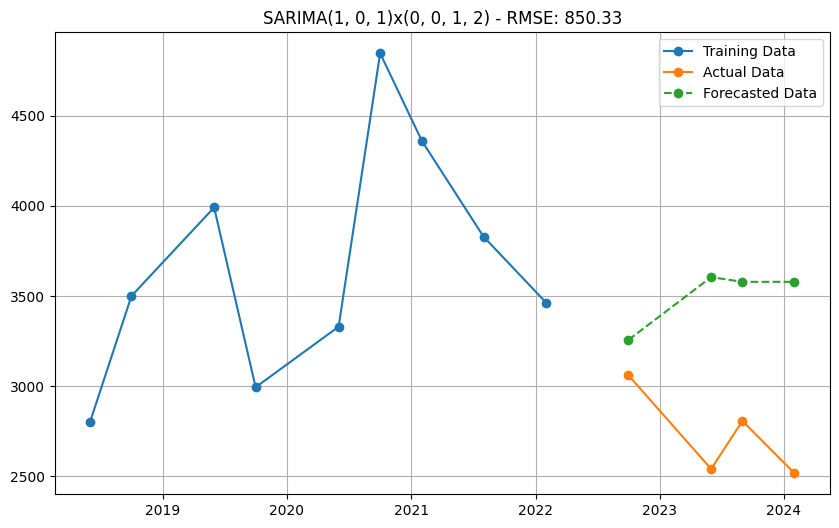

Model: SARIMA(1, 0, 1)x(0, 0, 1, 2) - AIC: 152.46 - RMSE: 850.33


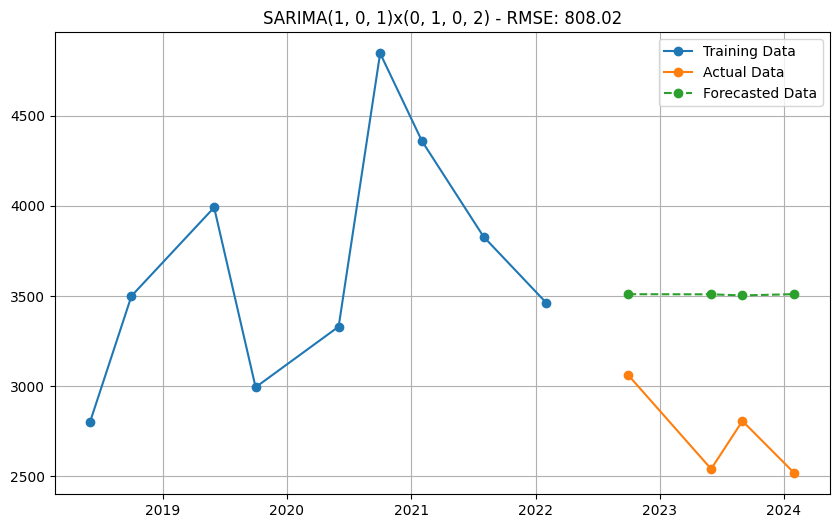

Model: SARIMA(1, 0, 1)x(0, 1, 0, 2) - AIC: 120.79 - RMSE: 808.02


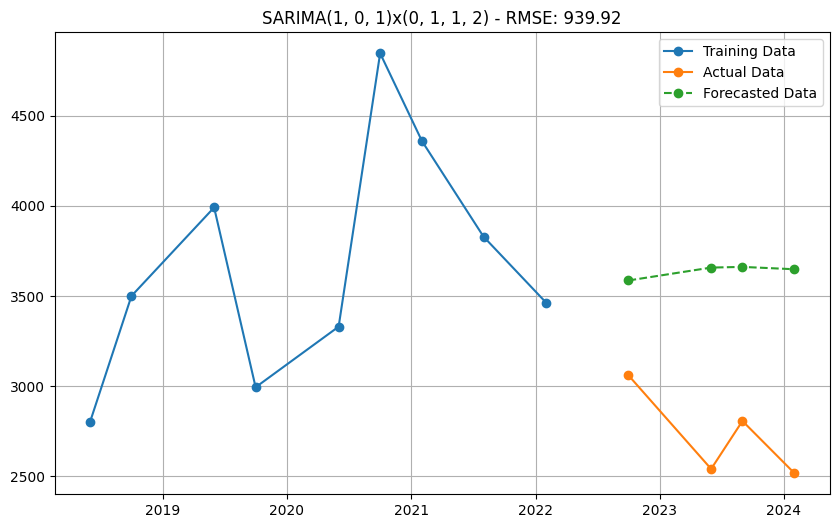

Model: SARIMA(1, 0, 1)x(0, 1, 1, 2) - AIC: 122.18 - RMSE: 939.92


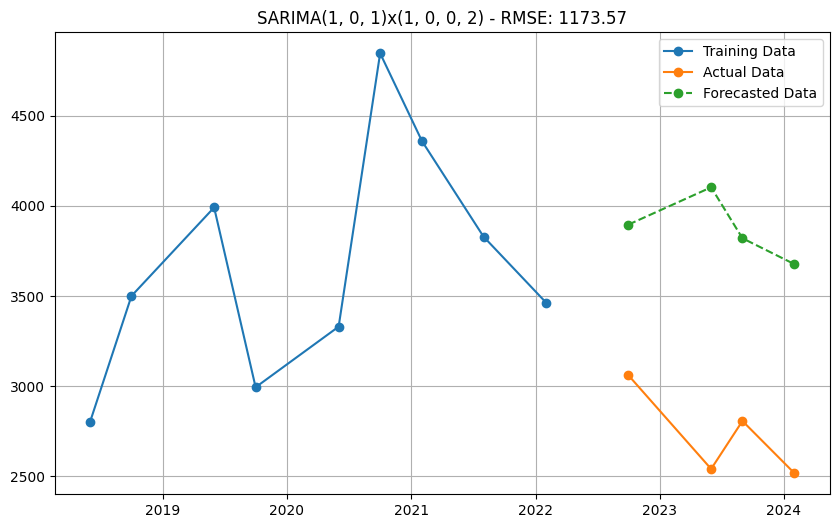

Model: SARIMA(1, 0, 1)x(1, 0, 0, 2) - AIC: 152.26 - RMSE: 1173.57


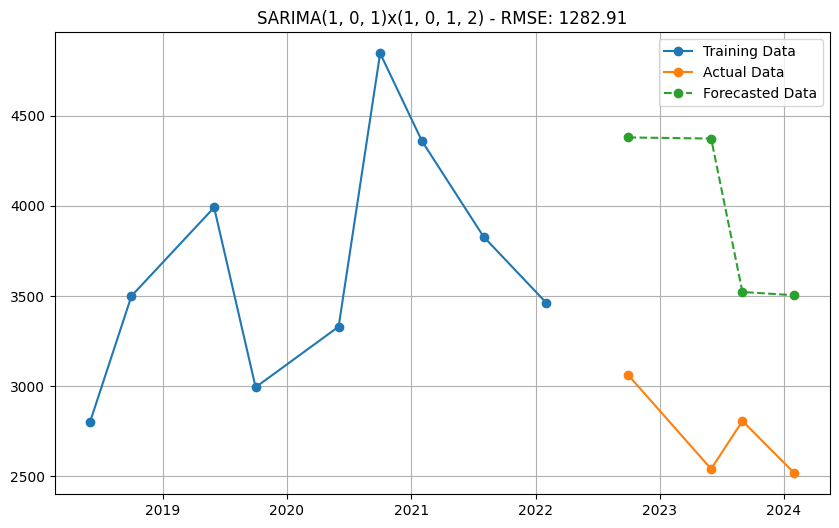

Model: SARIMA(1, 0, 1)x(1, 0, 1, 2) - AIC: 153.38 - RMSE: 1282.91


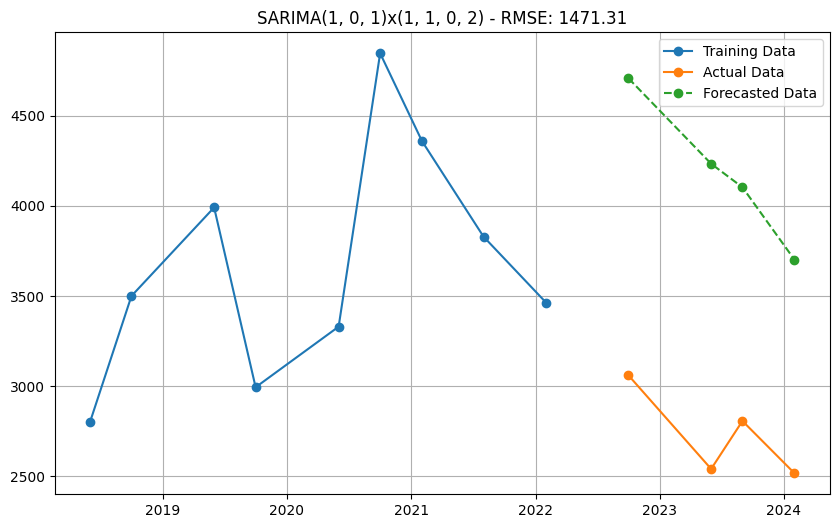

Model: SARIMA(1, 0, 1)x(1, 1, 0, 2) - AIC: 120.17 - RMSE: 1471.31


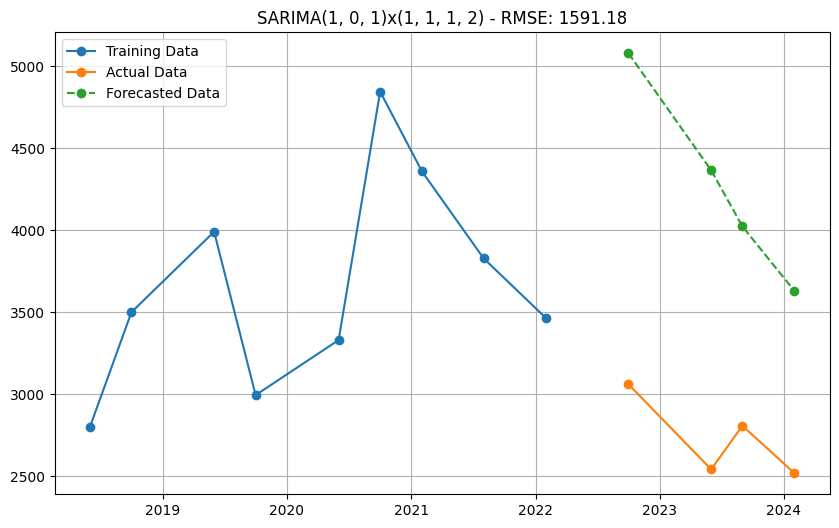

Model: SARIMA(1, 0, 1)x(1, 1, 1, 2) - AIC: 121.51 - RMSE: 1591.18


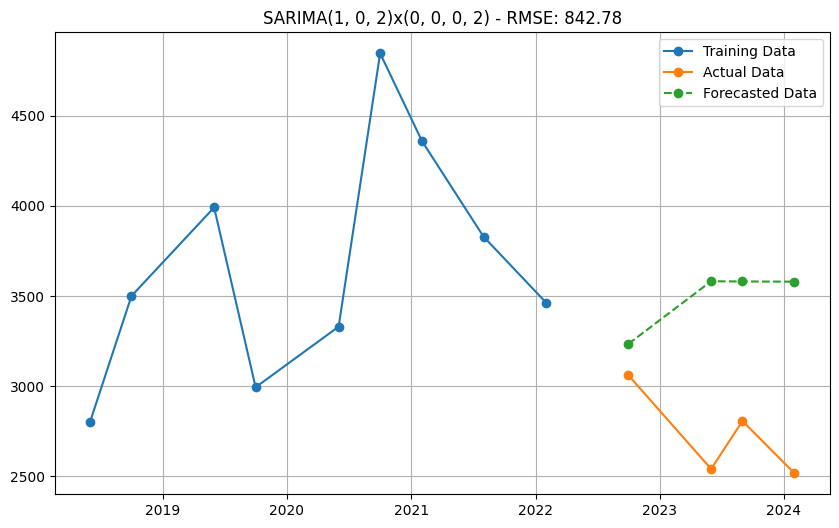

Model: SARIMA(1, 0, 2)x(0, 0, 0, 2) - AIC: 316.65 - RMSE: 842.78
Failed to fit SARIMA(1, 0, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


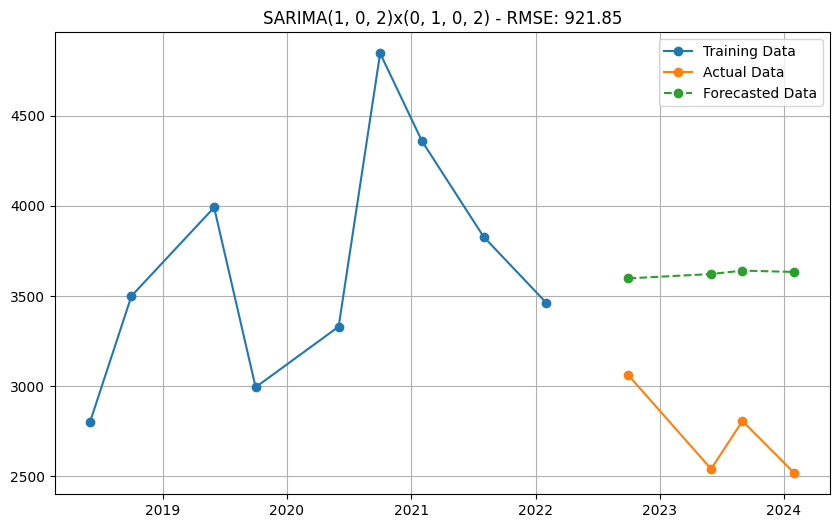

Model: SARIMA(1, 0, 2)x(0, 1, 0, 2) - AIC: 122.40 - RMSE: 921.85
Failed to fit SARIMA(1, 0, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


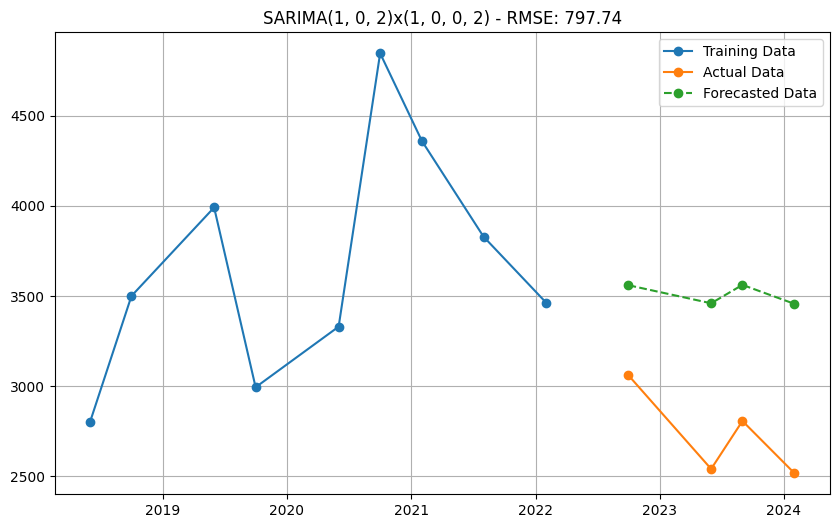

Model: SARIMA(1, 0, 2)x(1, 0, 0, 2) - AIC: 184.76 - RMSE: 797.74
Failed to fit SARIMA(1, 0, 2)x(1, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


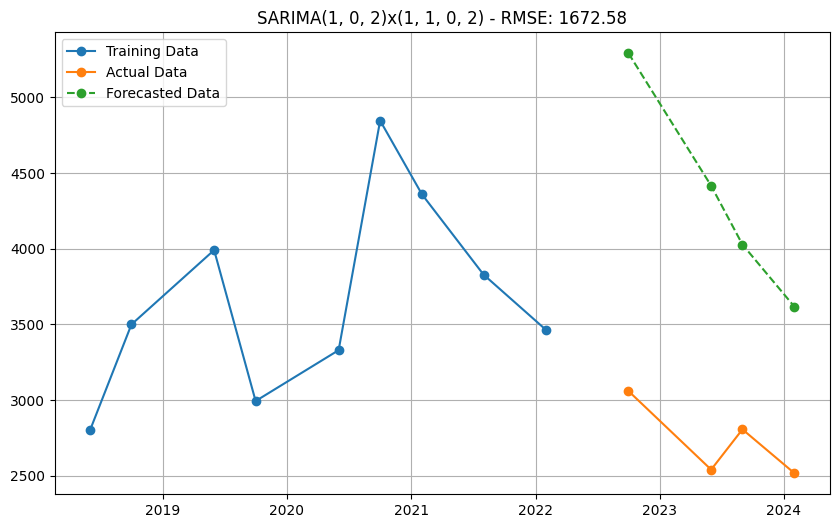

Model: SARIMA(1, 0, 2)x(1, 1, 0, 2) - AIC: 121.38 - RMSE: 1672.58
Failed to fit SARIMA(1, 0, 2)x(1, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


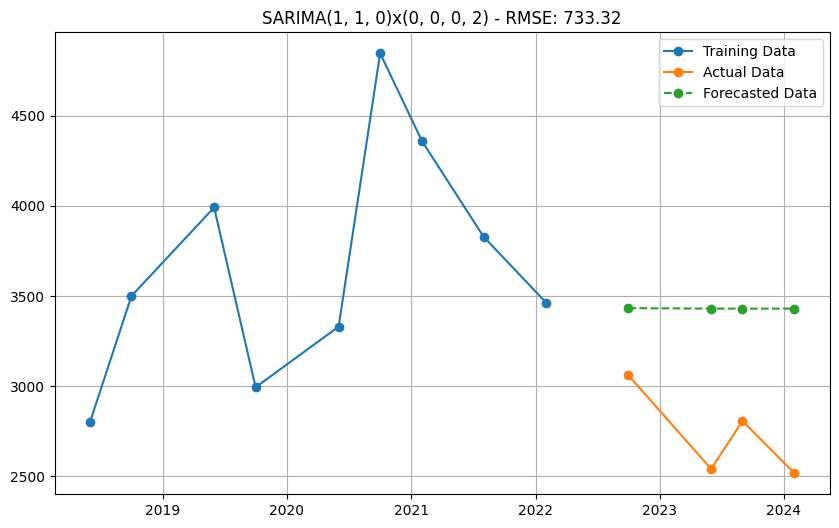

Model: SARIMA(1, 1, 0)x(0, 0, 0, 2) - AIC: 133.06 - RMSE: 733.32


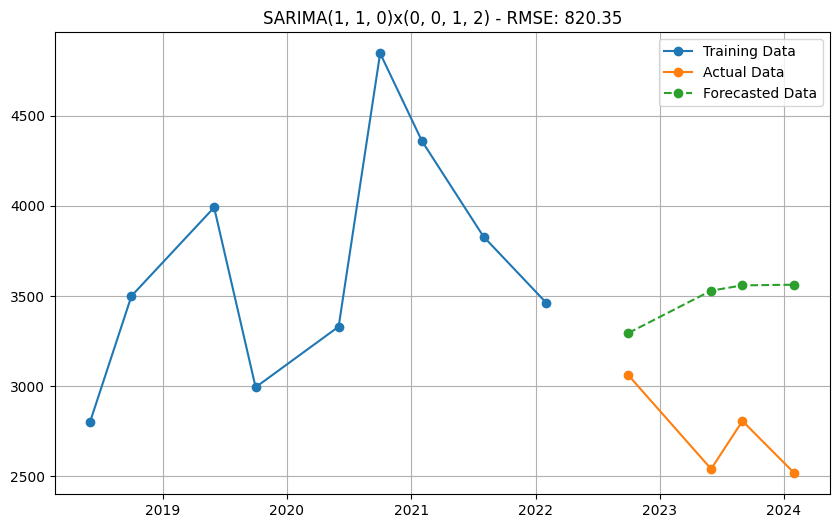

Model: SARIMA(1, 1, 0)x(0, 0, 1, 2) - AIC: 133.20 - RMSE: 820.35


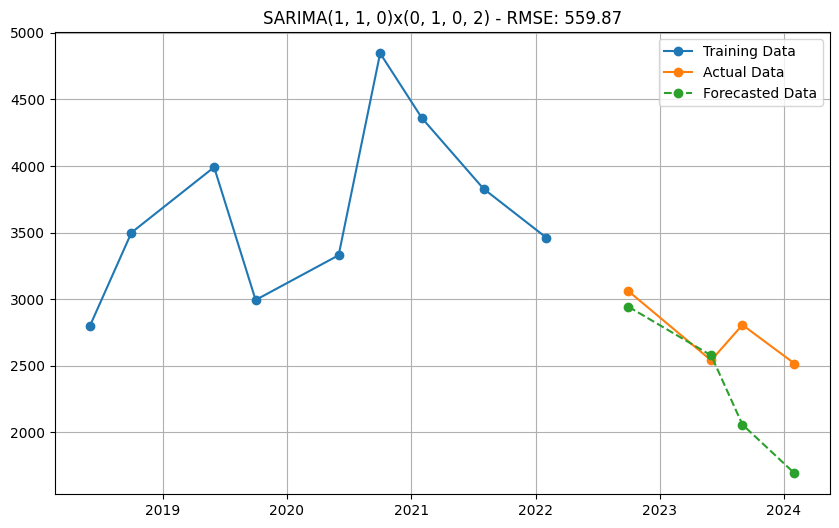

Model: SARIMA(1, 1, 0)x(0, 1, 0, 2) - AIC: 109.00 - RMSE: 559.87


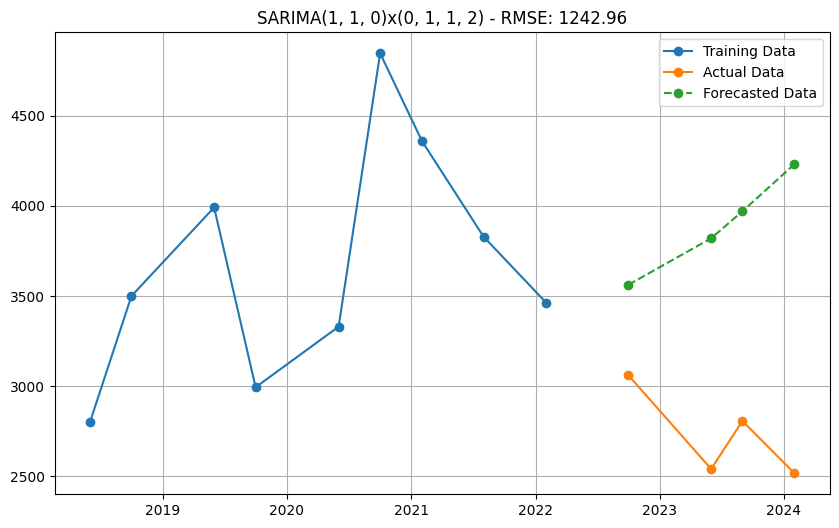

Model: SARIMA(1, 1, 0)x(0, 1, 1, 2) - AIC: 107.56 - RMSE: 1242.96


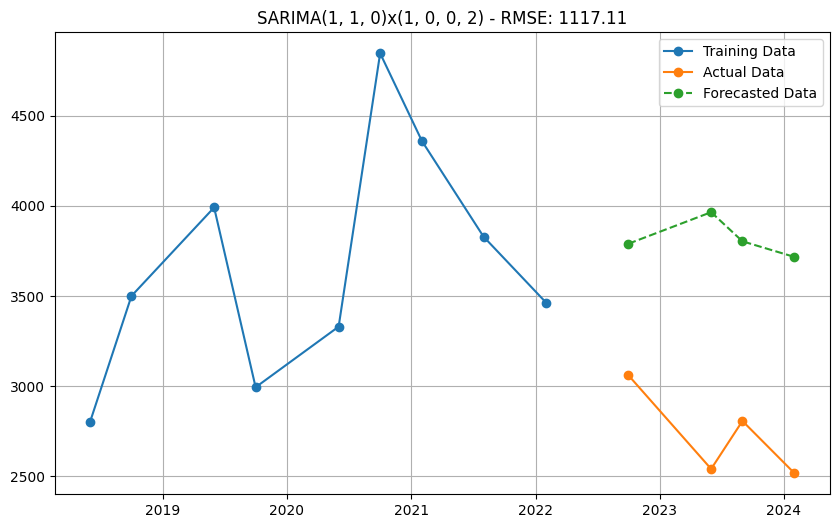

Model: SARIMA(1, 1, 0)x(1, 0, 0, 2) - AIC: 132.95 - RMSE: 1117.11


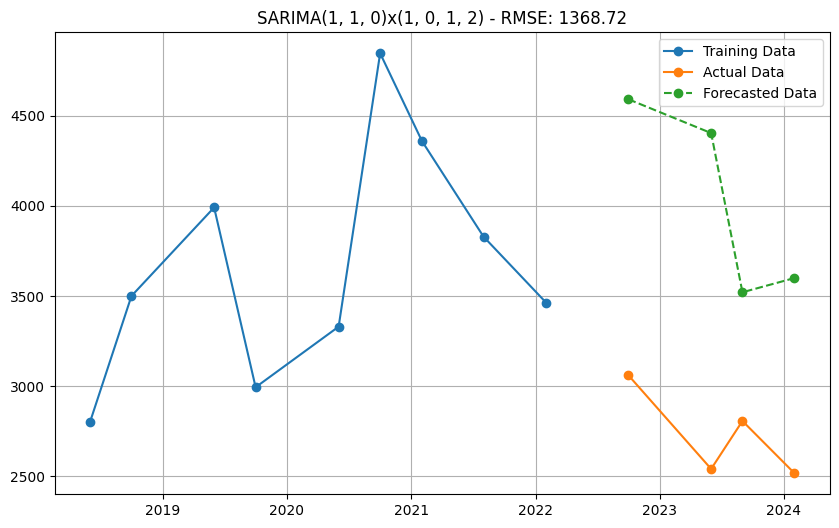

Model: SARIMA(1, 1, 0)x(1, 0, 1, 2) - AIC: 132.77 - RMSE: 1368.72


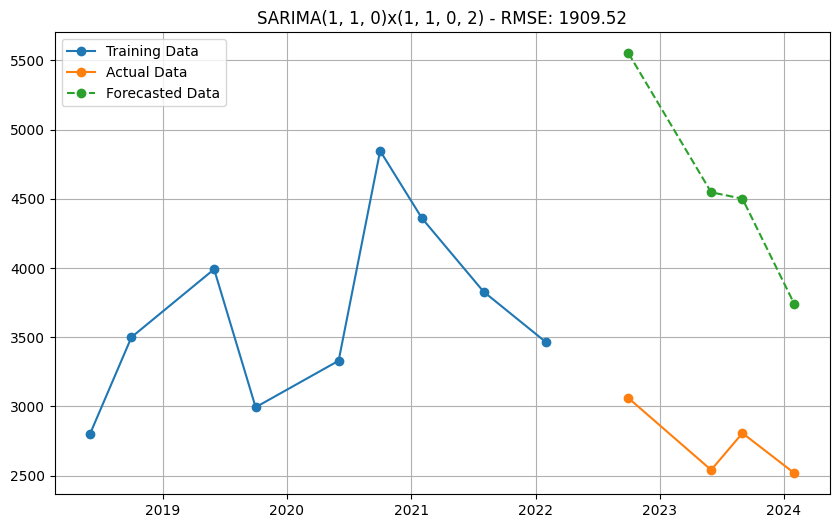

Model: SARIMA(1, 1, 0)x(1, 1, 0, 2) - AIC: 102.21 - RMSE: 1909.52


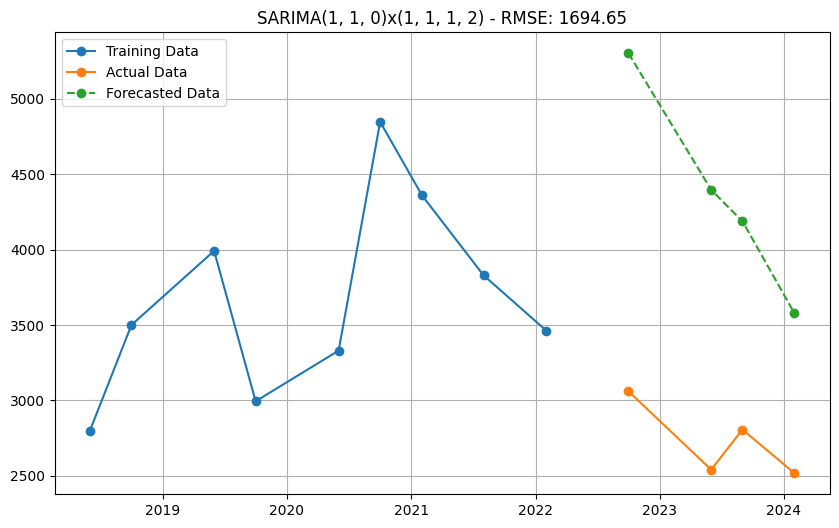

Model: SARIMA(1, 1, 0)x(1, 1, 1, 2) - AIC: 103.71 - RMSE: 1694.65


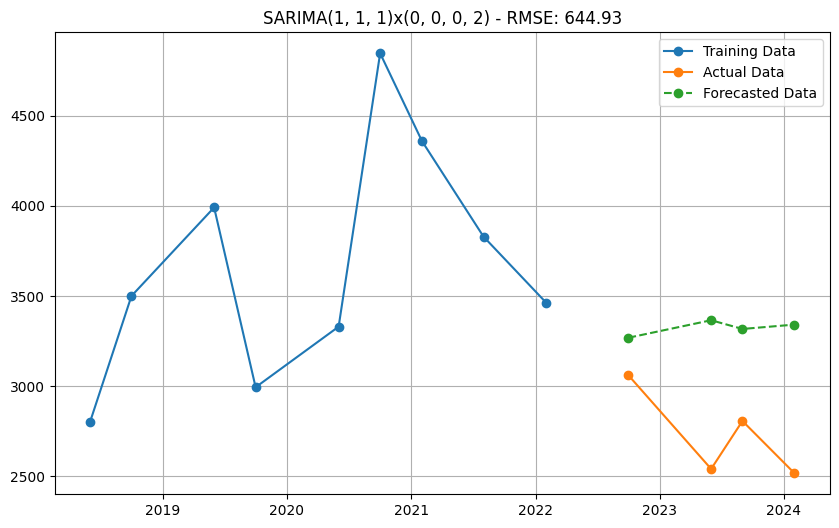

Model: SARIMA(1, 1, 1)x(0, 0, 0, 2) - AIC: 133.66 - RMSE: 644.93


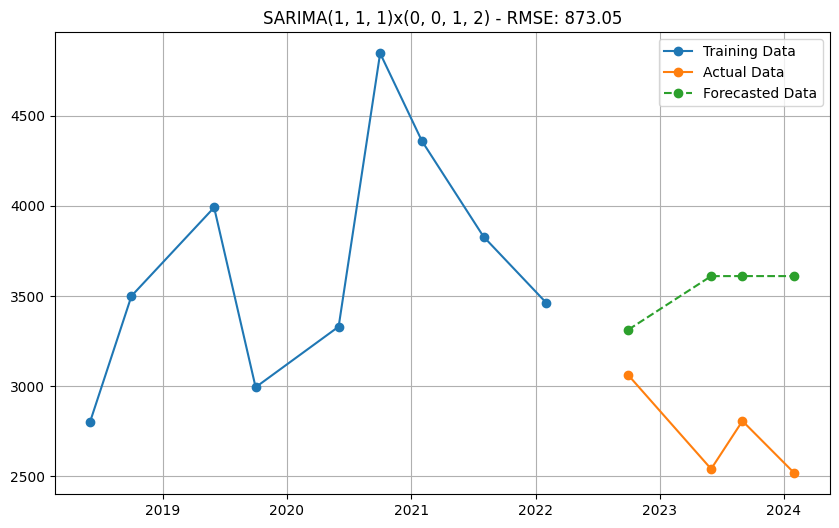

Model: SARIMA(1, 1, 1)x(0, 0, 1, 2) - AIC: 134.84 - RMSE: 873.05


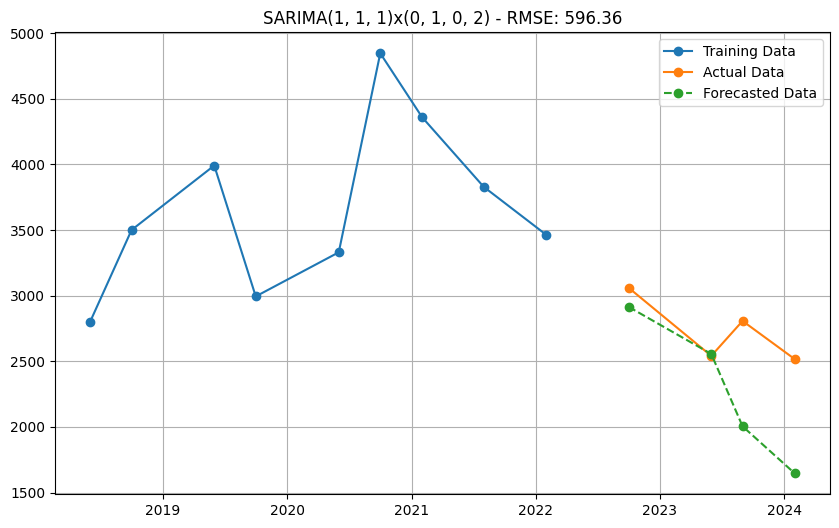

Model: SARIMA(1, 1, 1)x(0, 1, 0, 2) - AIC: 109.43 - RMSE: 596.36


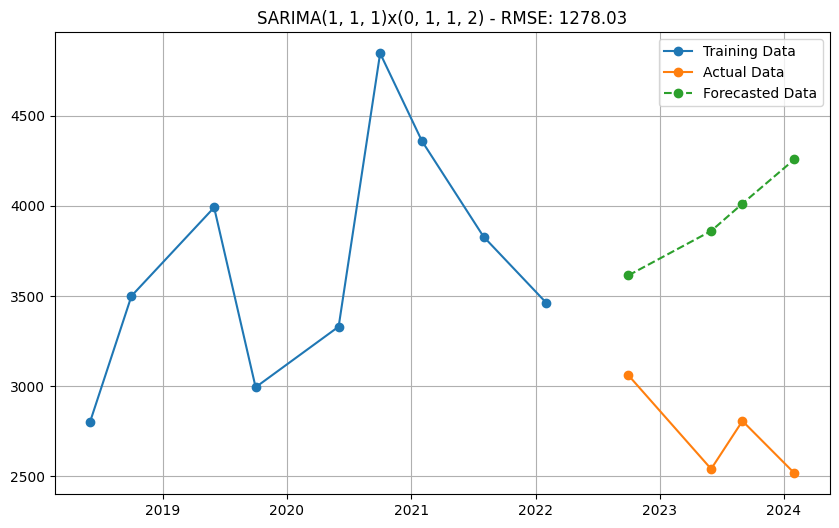

Model: SARIMA(1, 1, 1)x(0, 1, 1, 2) - AIC: 109.60 - RMSE: 1278.03


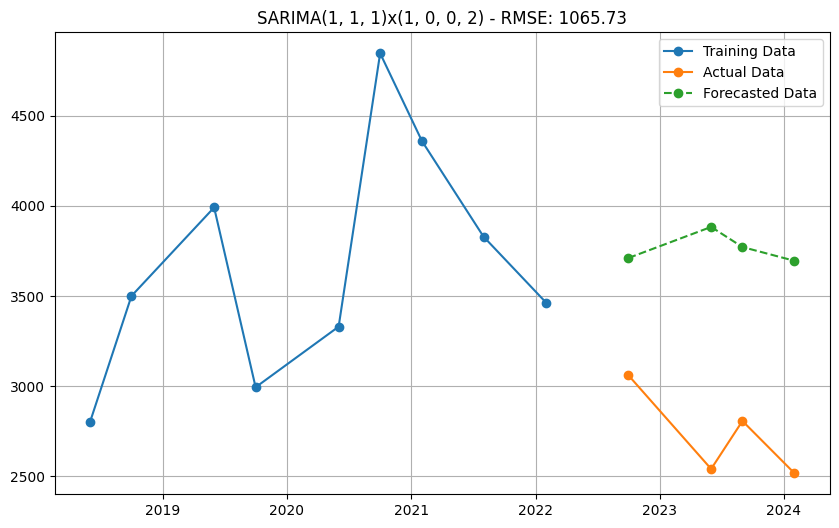

Model: SARIMA(1, 1, 1)x(1, 0, 0, 2) - AIC: 135.00 - RMSE: 1065.73


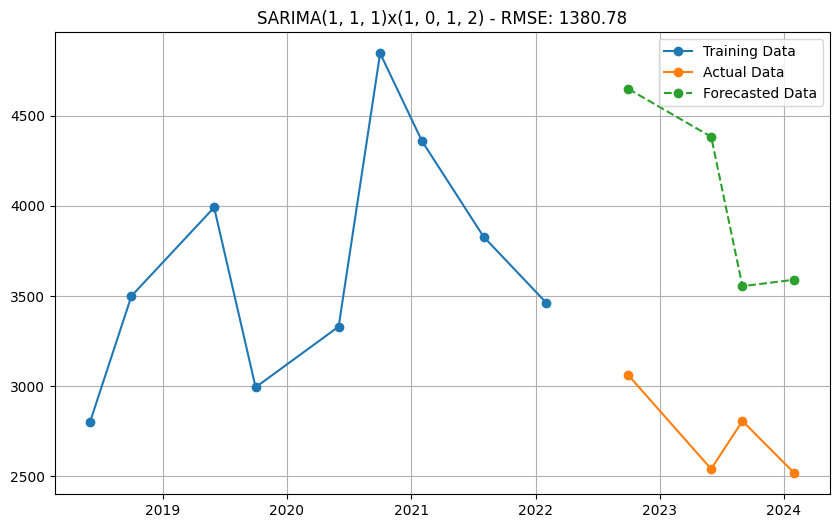

Model: SARIMA(1, 1, 1)x(1, 0, 1, 2) - AIC: 134.63 - RMSE: 1380.78


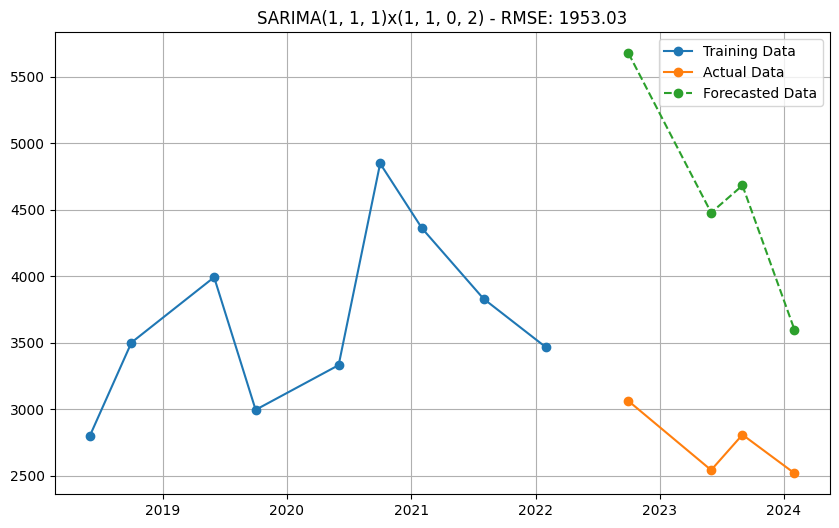

Model: SARIMA(1, 1, 1)x(1, 1, 0, 2) - AIC: 103.54 - RMSE: 1953.03


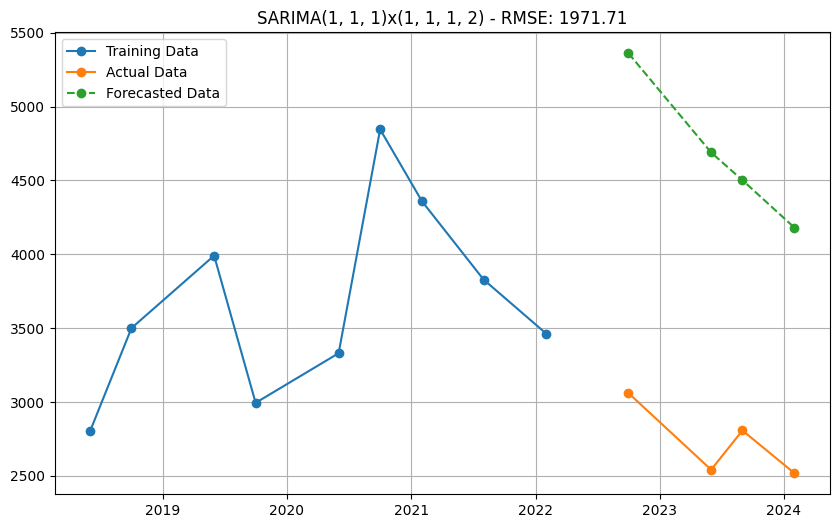

Model: SARIMA(1, 1, 1)x(1, 1, 1, 2) - AIC: 107.54 - RMSE: 1971.71


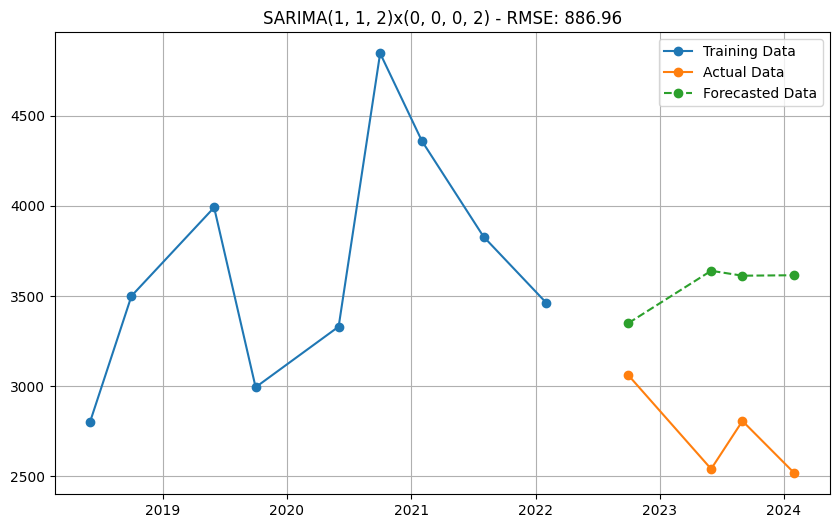

Model: SARIMA(1, 1, 2)x(0, 0, 0, 2) - AIC: 134.80 - RMSE: 886.96
Failed to fit SARIMA(1, 1, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


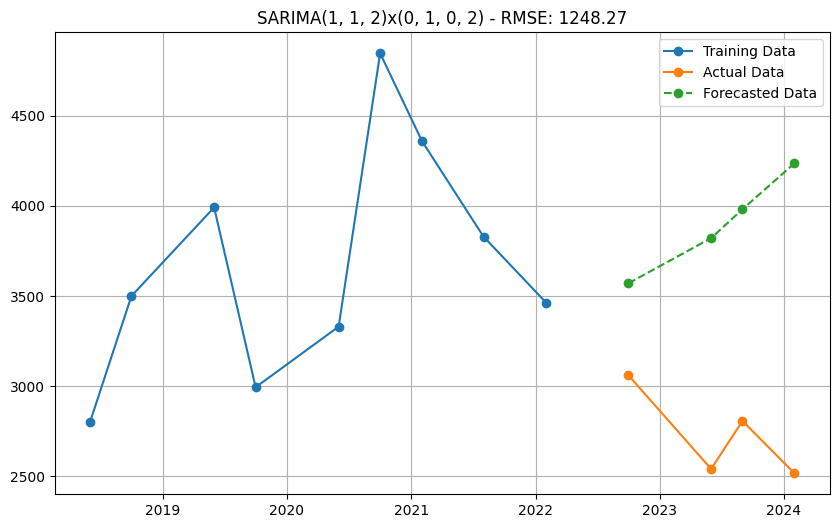

Model: SARIMA(1, 1, 2)x(0, 1, 0, 2) - AIC: 109.56 - RMSE: 1248.27
Failed to fit SARIMA(1, 1, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


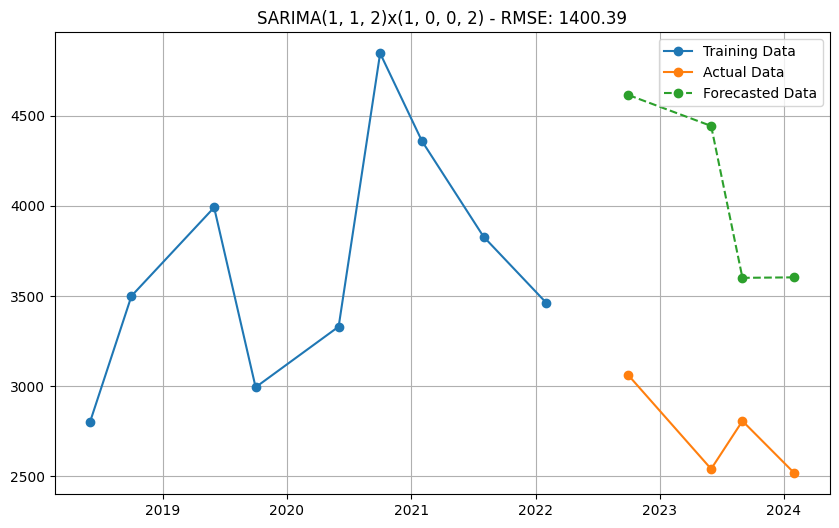

Model: SARIMA(1, 1, 2)x(1, 0, 0, 2) - AIC: 134.56 - RMSE: 1400.39
Failed to fit SARIMA(1, 1, 2)x(1, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


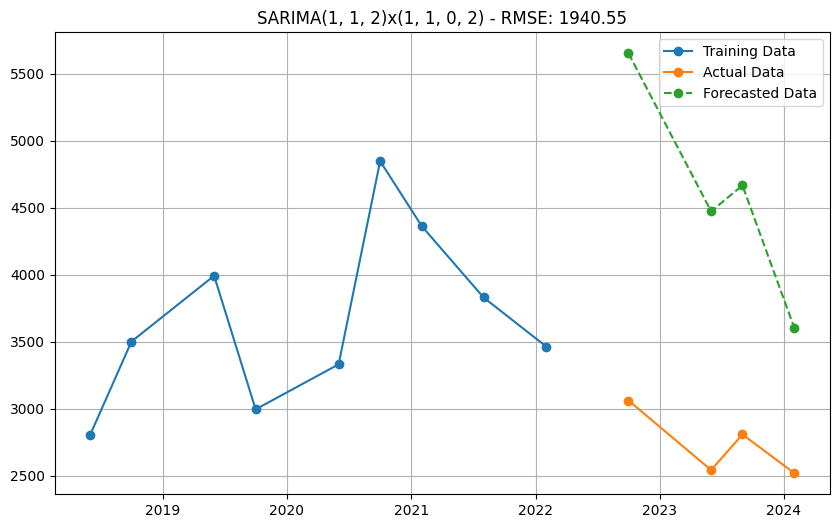

Model: SARIMA(1, 1, 2)x(1, 1, 0, 2) - AIC: 105.58 - RMSE: 1940.55
Failed to fit SARIMA(1, 1, 2)x(1, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


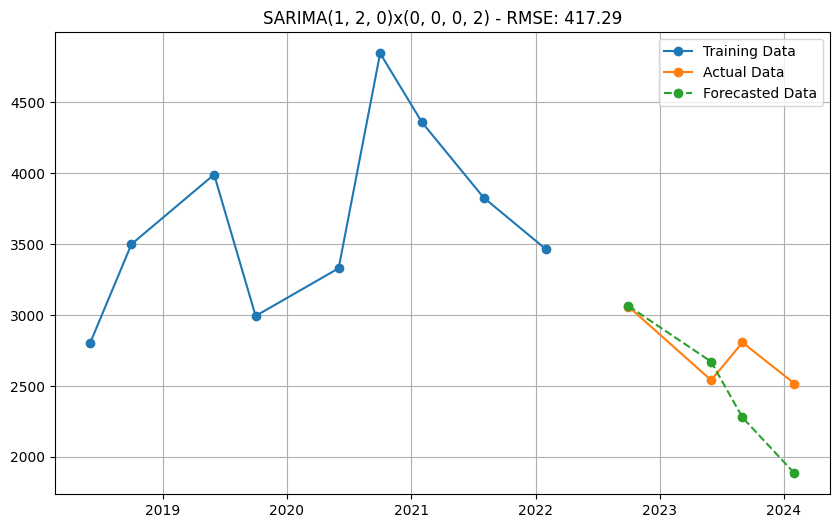

Model: SARIMA(1, 2, 0)x(0, 0, 0, 2) - AIC: 122.35 - RMSE: 417.29


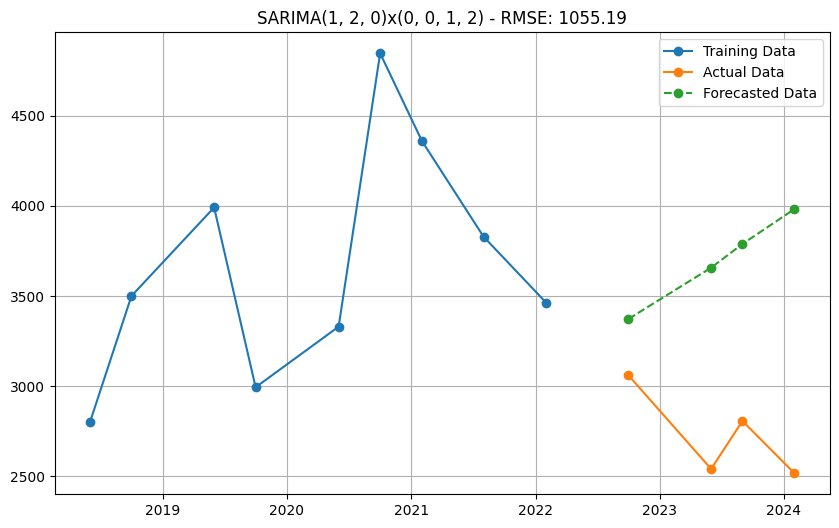

Model: SARIMA(1, 2, 0)x(0, 0, 1, 2) - AIC: 121.14 - RMSE: 1055.19


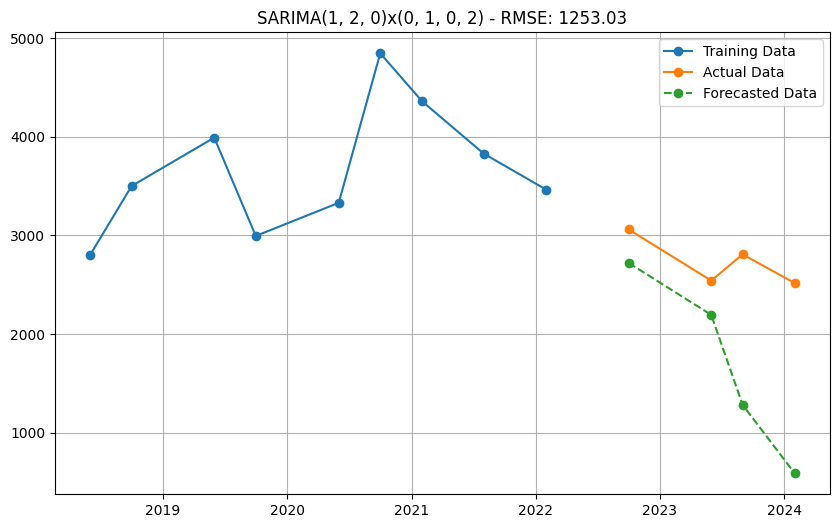

Model: SARIMA(1, 2, 0)x(0, 1, 0, 2) - AIC: 95.60 - RMSE: 1253.03


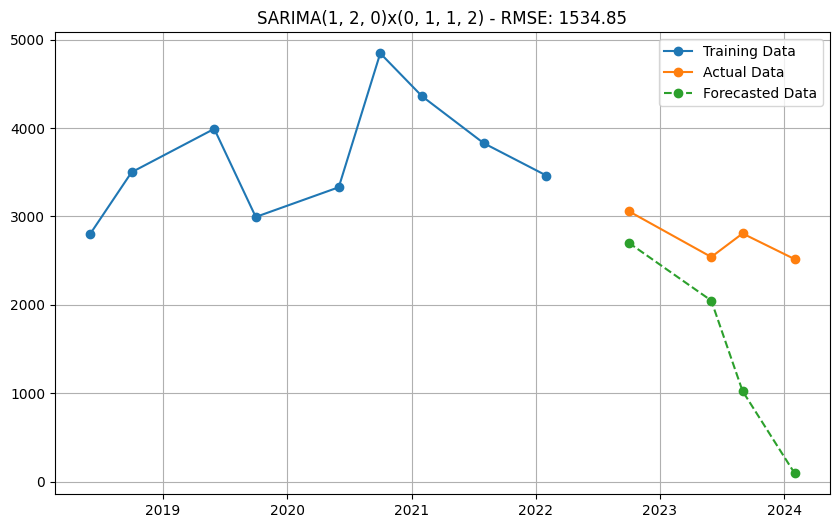

Model: SARIMA(1, 2, 0)x(0, 1, 1, 2) - AIC: 93.13 - RMSE: 1534.85


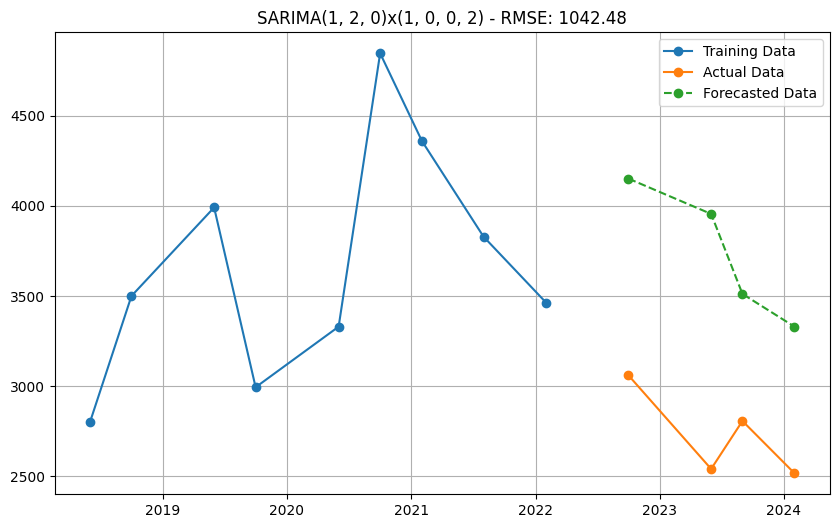

Model: SARIMA(1, 2, 0)x(1, 0, 0, 2) - AIC: 120.79 - RMSE: 1042.48


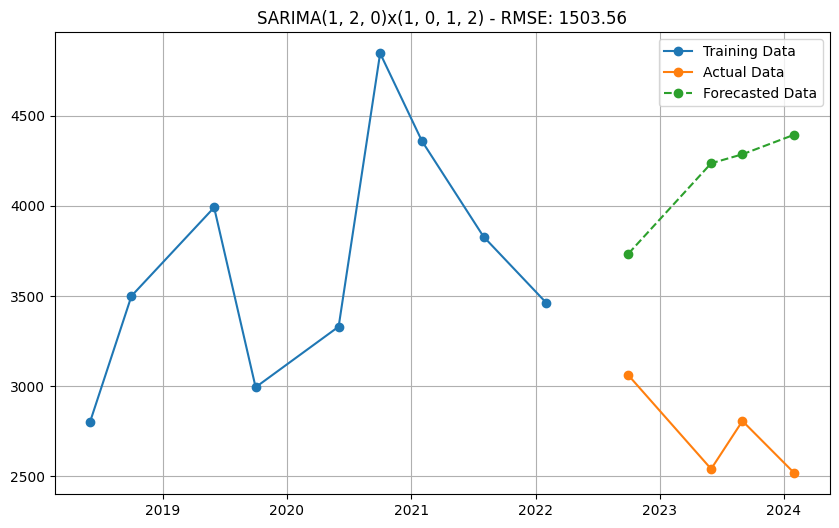

Model: SARIMA(1, 2, 0)x(1, 0, 1, 2) - AIC: 122.73 - RMSE: 1503.56


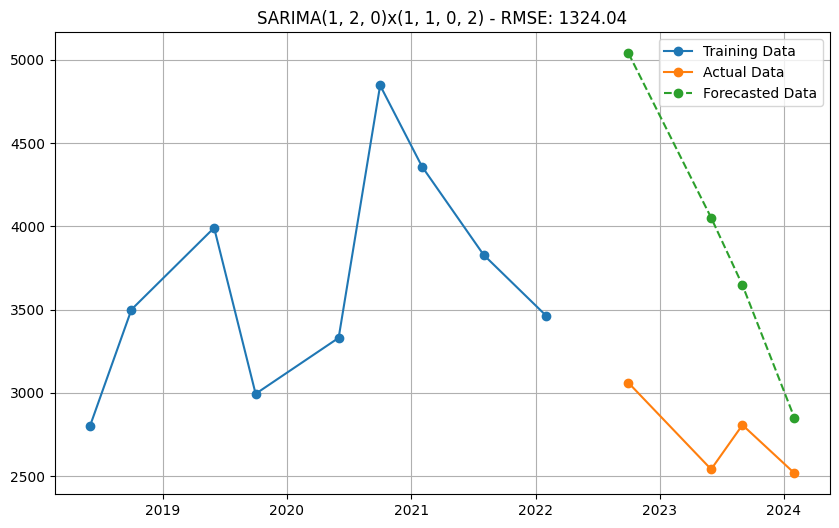

Model: SARIMA(1, 2, 0)x(1, 1, 0, 2) - AIC: 90.78 - RMSE: 1324.04


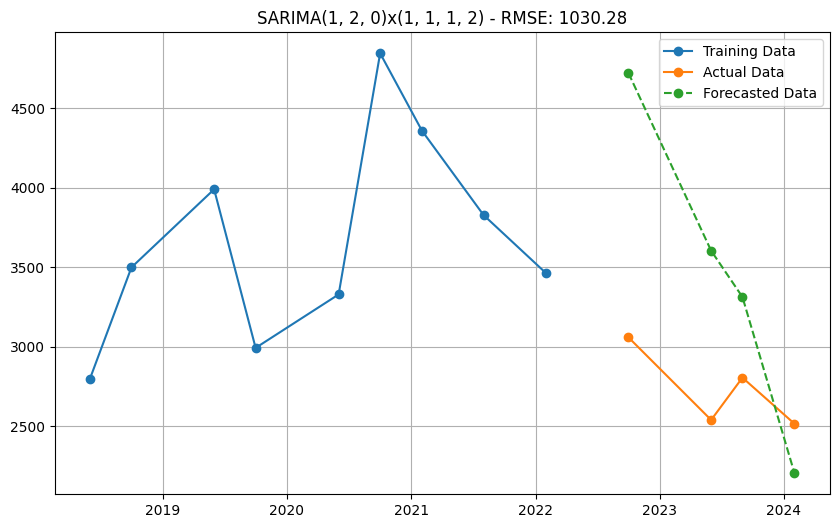

Model: SARIMA(1, 2, 0)x(1, 1, 1, 2) - AIC: 92.10 - RMSE: 1030.28


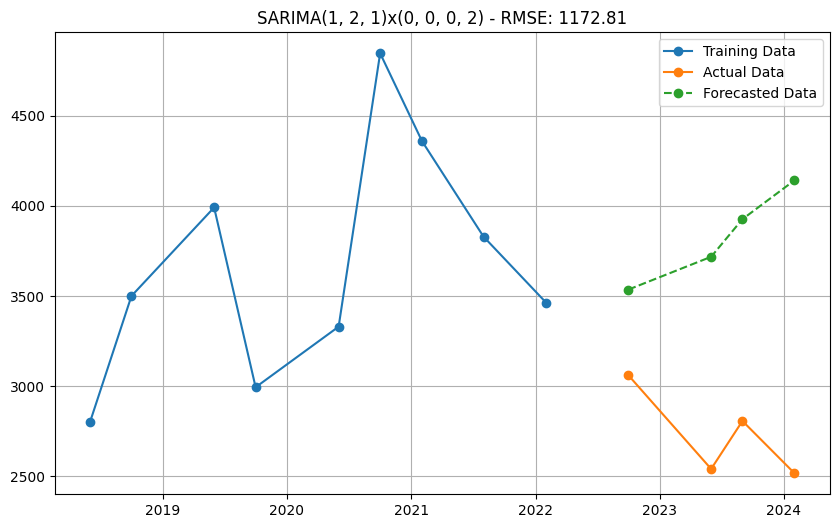

Model: SARIMA(1, 2, 1)x(0, 0, 0, 2) - AIC: 122.51 - RMSE: 1172.81


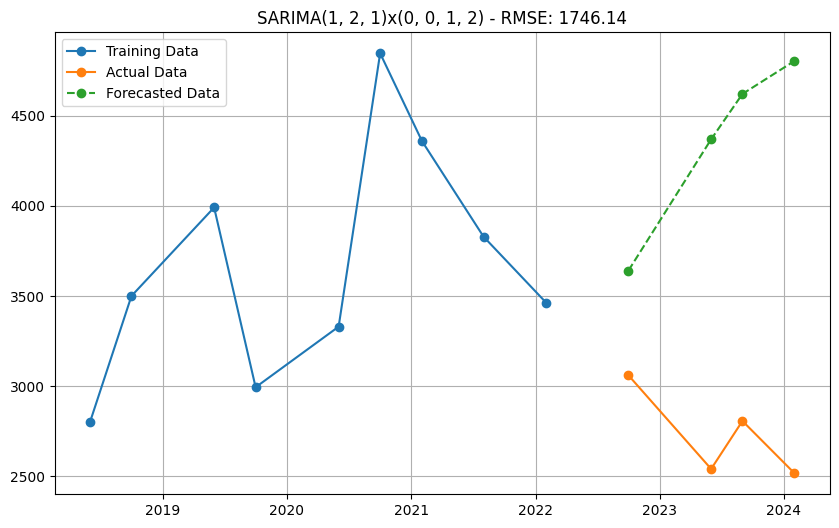

Model: SARIMA(1, 2, 1)x(0, 0, 1, 2) - AIC: 123.03 - RMSE: 1746.14


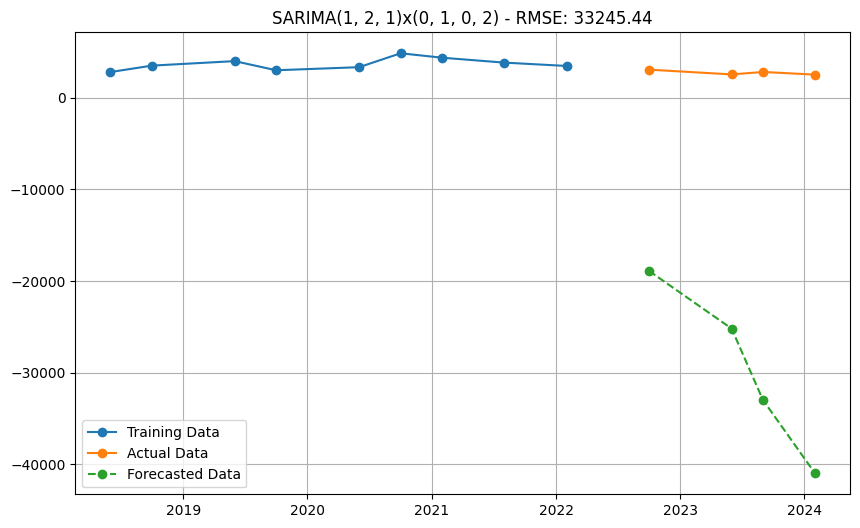

Model: SARIMA(1, 2, 1)x(0, 1, 0, 2) - AIC: 6.00 - RMSE: 33245.44
New best model found: SARIMA(1, 2, 1)x(0, 1, 0, 2) - AIC: 6.00


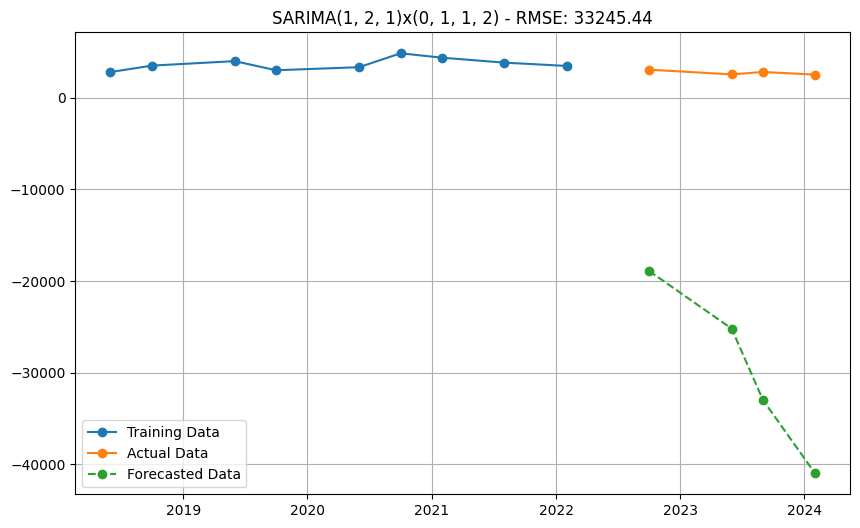

Model: SARIMA(1, 2, 1)x(0, 1, 1, 2) - AIC: 8.00 - RMSE: 33245.44


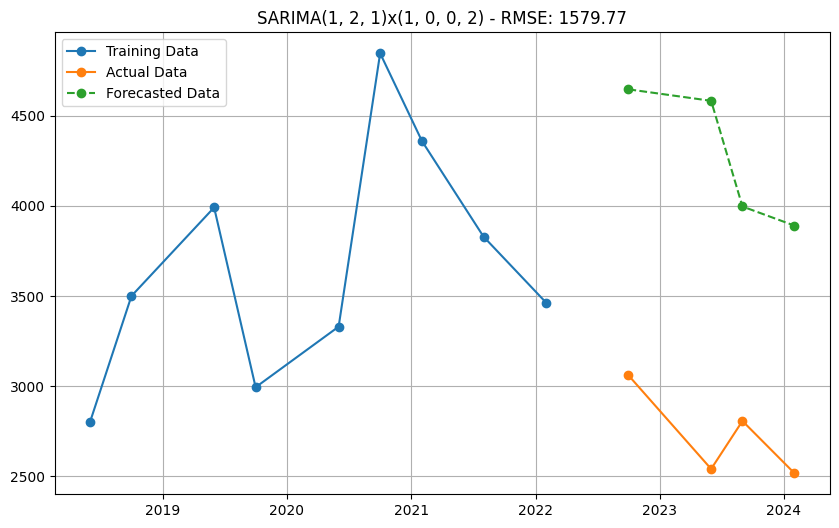

Model: SARIMA(1, 2, 1)x(1, 0, 0, 2) - AIC: 121.98 - RMSE: 1579.77


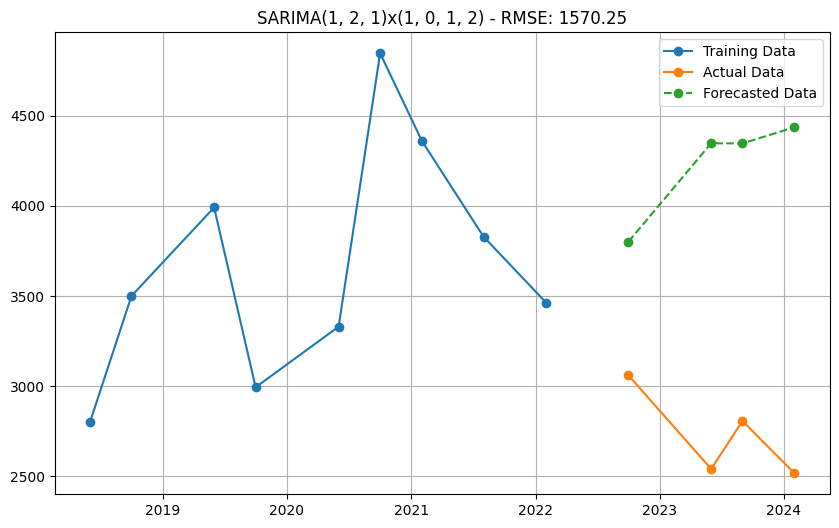

Model: SARIMA(1, 2, 1)x(1, 0, 1, 2) - AIC: 124.71 - RMSE: 1570.25


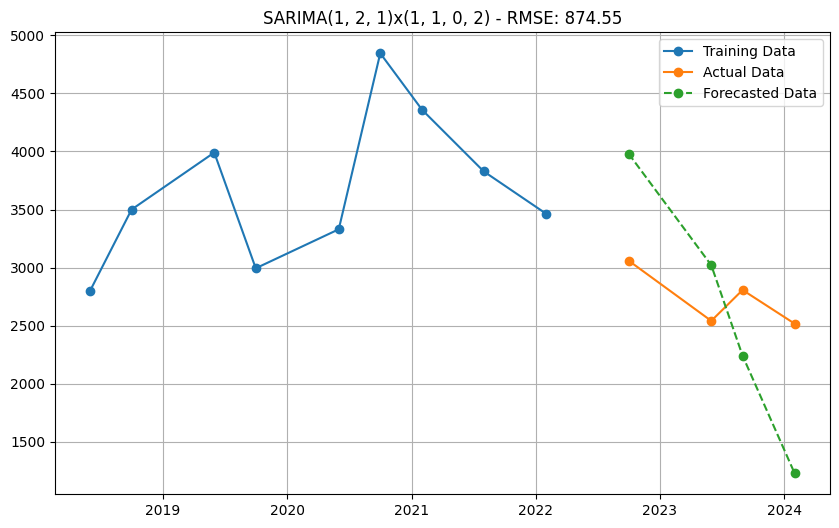

Model: SARIMA(1, 2, 1)x(1, 1, 0, 2) - AIC: 62833167985.86 - RMSE: 874.55


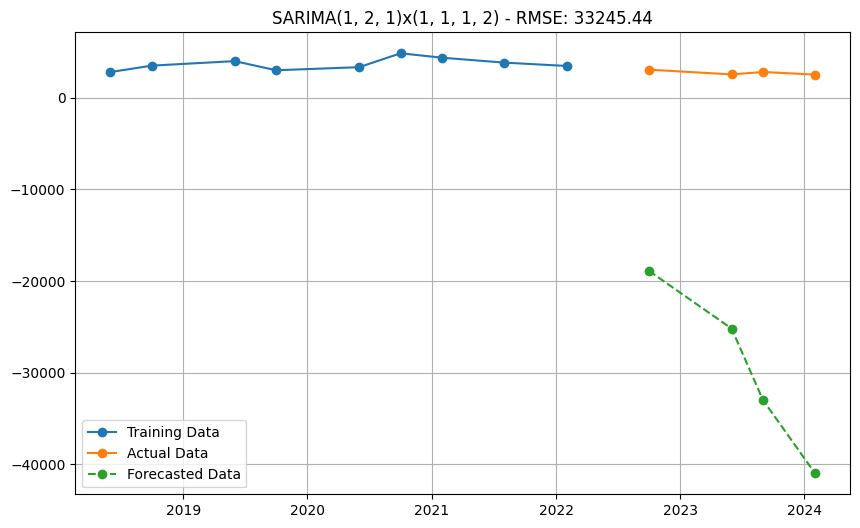

Model: SARIMA(1, 2, 1)x(1, 1, 1, 2) - AIC: 10.00 - RMSE: 33245.44


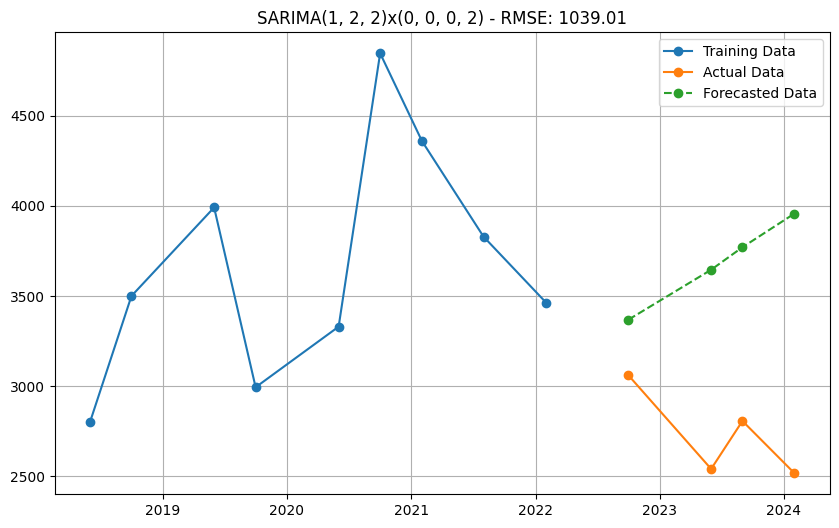

Model: SARIMA(1, 2, 2)x(0, 0, 0, 2) - AIC: 123.14 - RMSE: 1039.01
Failed to fit SARIMA(1, 2, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


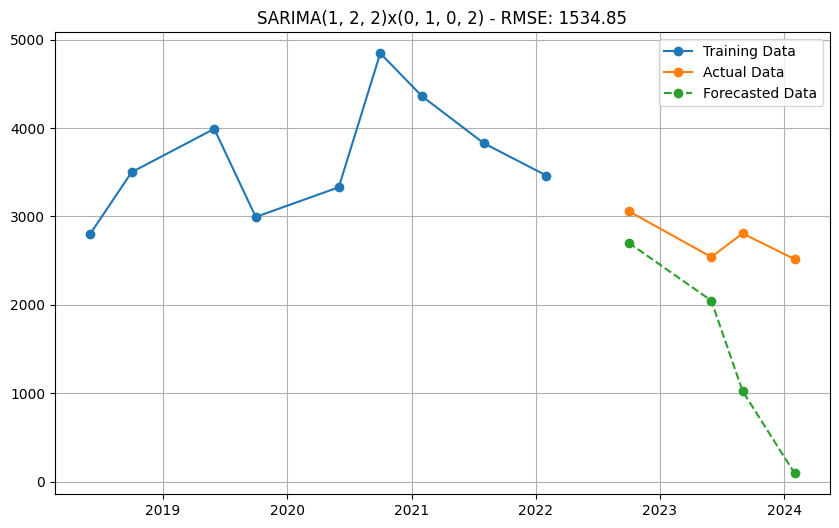

Model: SARIMA(1, 2, 2)x(0, 1, 0, 2) - AIC: 95.13 - RMSE: 1534.85
Failed to fit SARIMA(1, 2, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


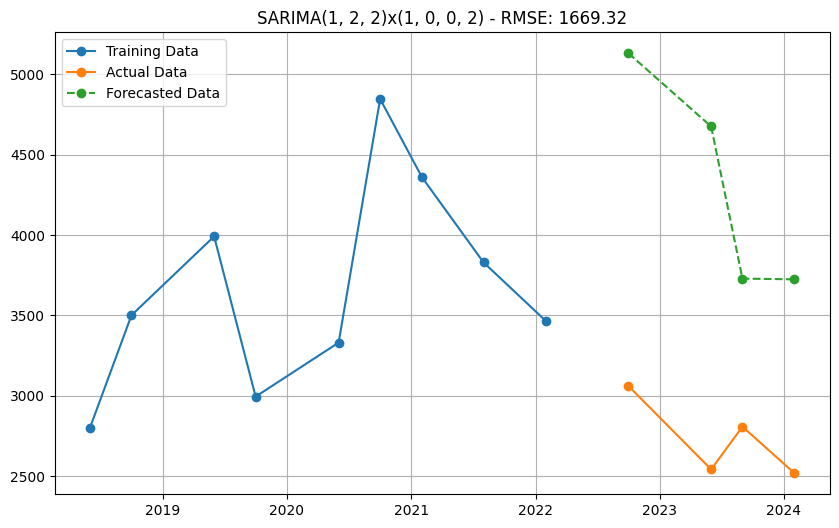

Model: SARIMA(1, 2, 2)x(1, 0, 0, 2) - AIC: 122.54 - RMSE: 1669.32
Failed to fit SARIMA(1, 2, 2)x(1, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


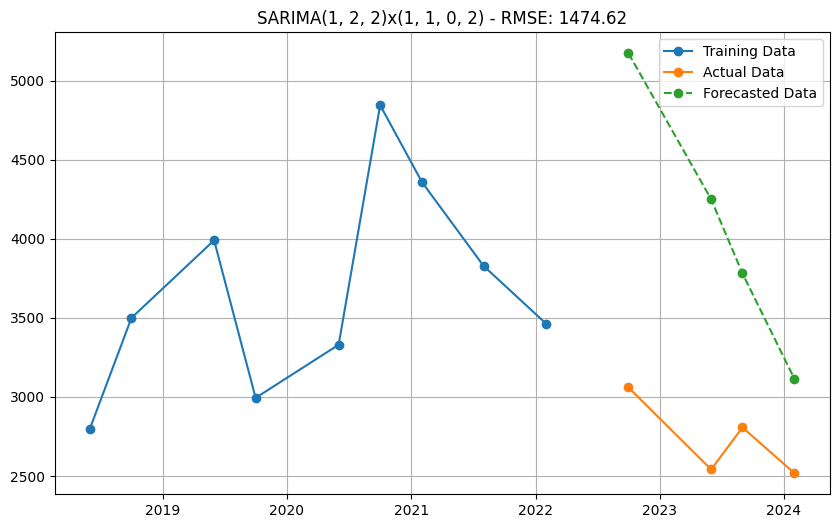

Model: SARIMA(1, 2, 2)x(1, 1, 0, 2) - AIC: 93.32 - RMSE: 1474.62
Failed to fit SARIMA(1, 2, 2)x(1, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


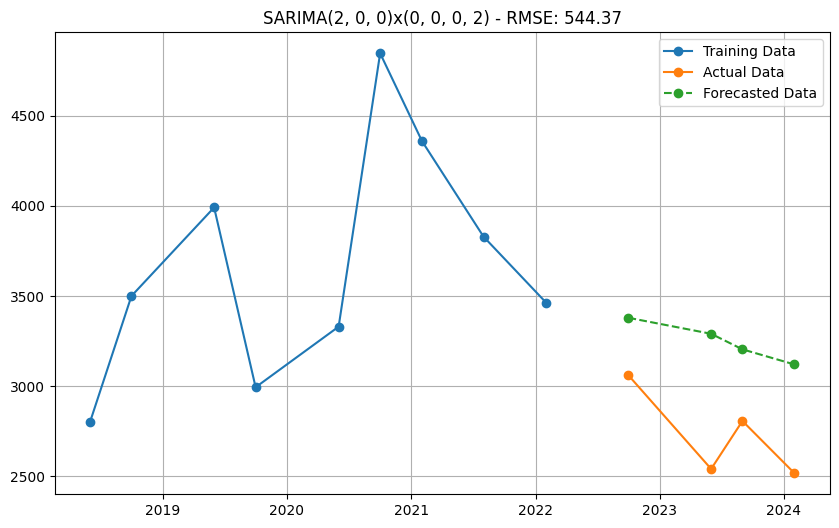

Model: SARIMA(2, 0, 0)x(0, 0, 0, 2) - AIC: 153.99 - RMSE: 544.37


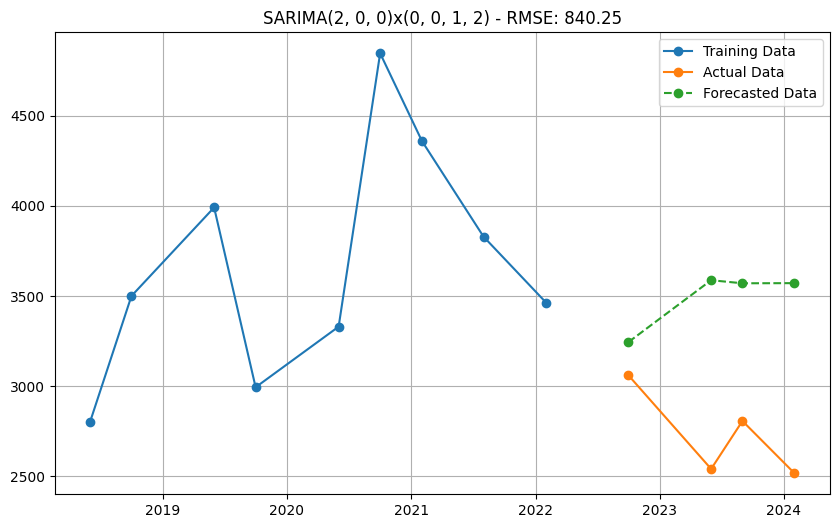

Model: SARIMA(2, 0, 0)x(0, 0, 1, 2) - AIC: 152.47 - RMSE: 840.25


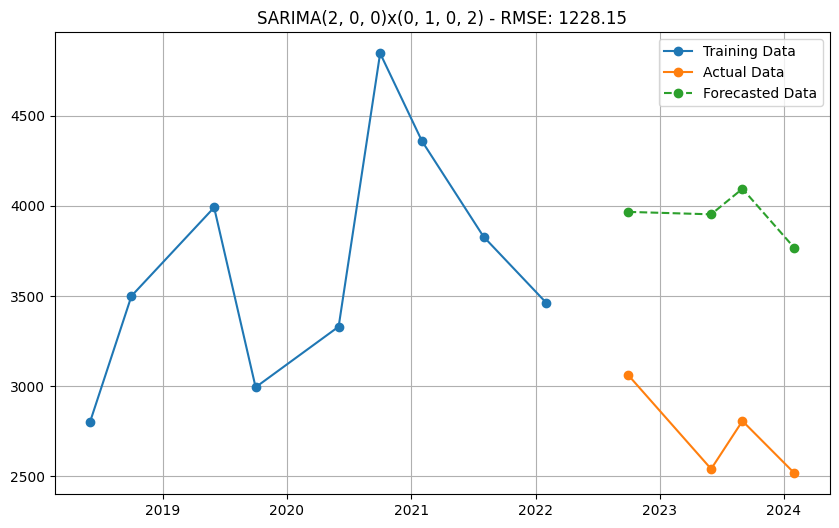

Model: SARIMA(2, 0, 0)x(0, 1, 0, 2) - AIC: 120.55 - RMSE: 1228.15


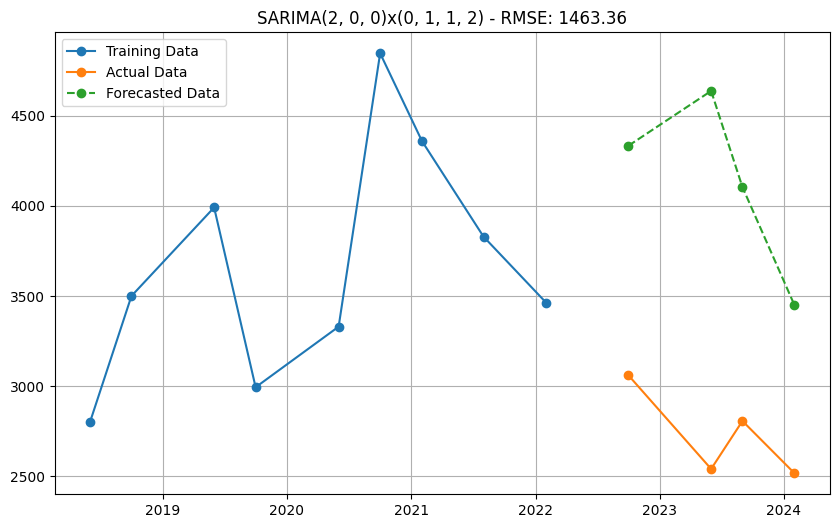

Model: SARIMA(2, 0, 0)x(0, 1, 1, 2) - AIC: 120.71 - RMSE: 1463.36
Failed to fit SARIMA(2, 0, 0)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 0)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 0)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 0)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


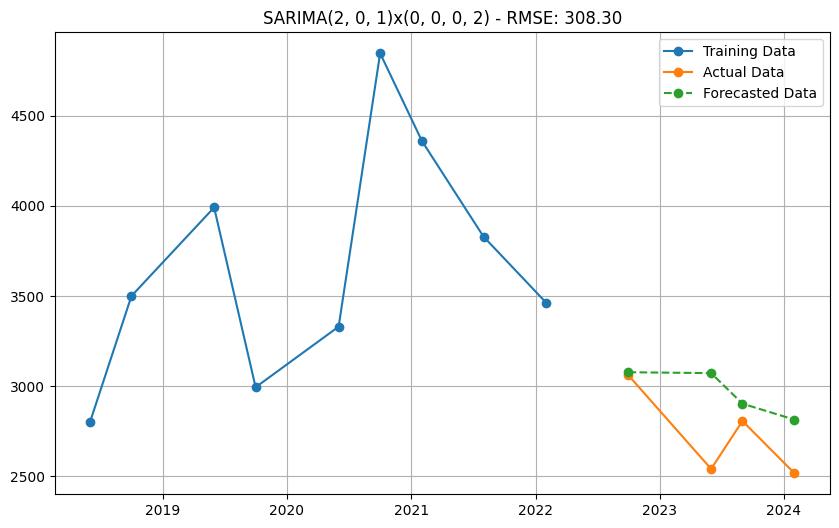

Model: SARIMA(2, 0, 1)x(0, 0, 0, 2) - AIC: 154.49 - RMSE: 308.30


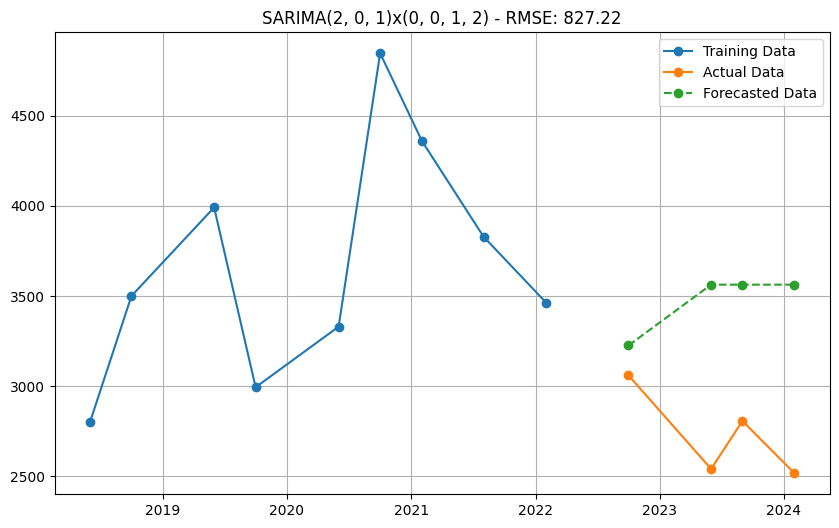

Model: SARIMA(2, 0, 1)x(0, 0, 1, 2) - AIC: 154.49 - RMSE: 827.22


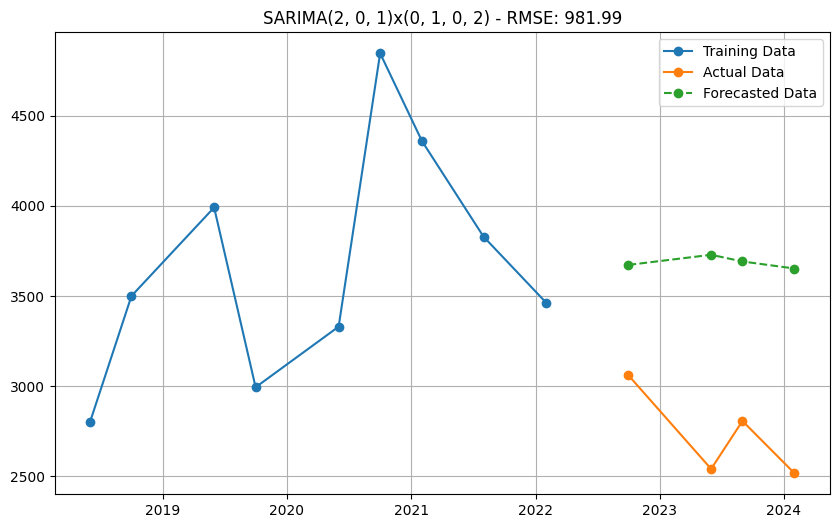

Model: SARIMA(2, 0, 1)x(0, 1, 0, 2) - AIC: 121.97 - RMSE: 981.99


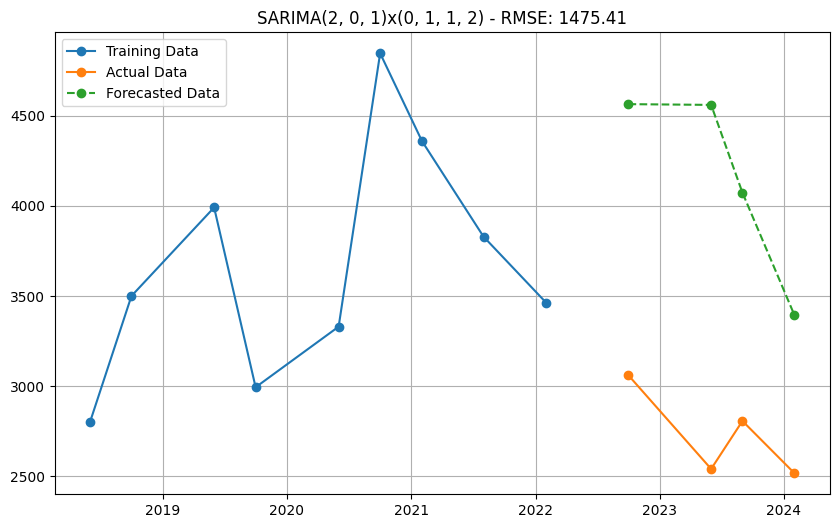

Model: SARIMA(2, 0, 1)x(0, 1, 1, 2) - AIC: 121.67 - RMSE: 1475.41
Failed to fit SARIMA(2, 0, 1)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 1)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 1)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 1)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


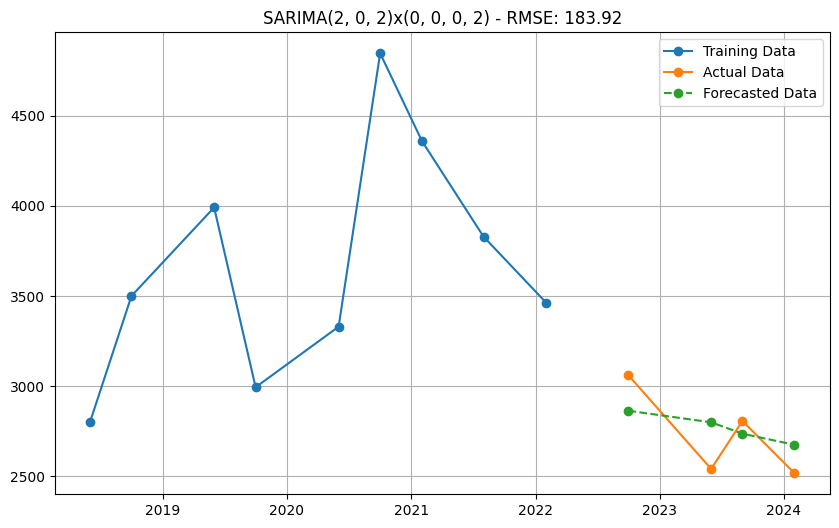

Model: SARIMA(2, 0, 2)x(0, 0, 0, 2) - AIC: 312.14 - RMSE: 183.92
Failed to fit SARIMA(2, 0, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


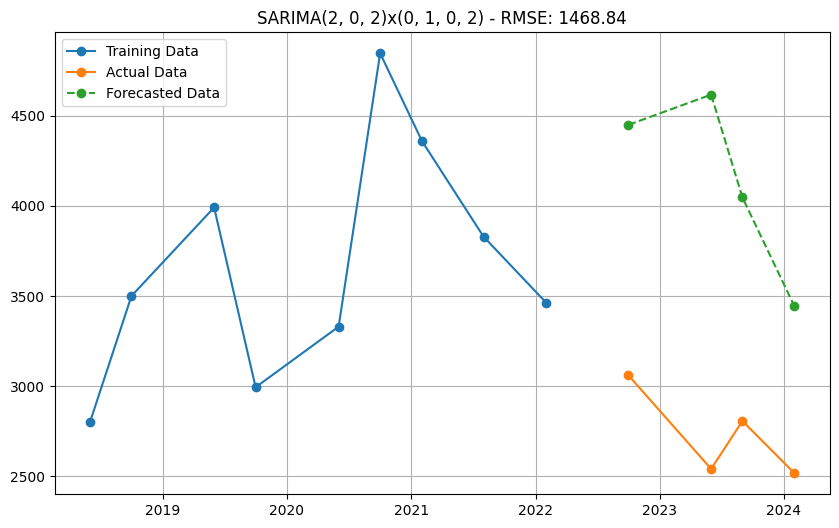

Model: SARIMA(2, 0, 2)x(0, 1, 0, 2) - AIC: 122.54 - RMSE: 1468.84
Failed to fit SARIMA(2, 0, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.
Failed to fit SARIMA(2, 0, 2)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 2)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 2)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 0, 2)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


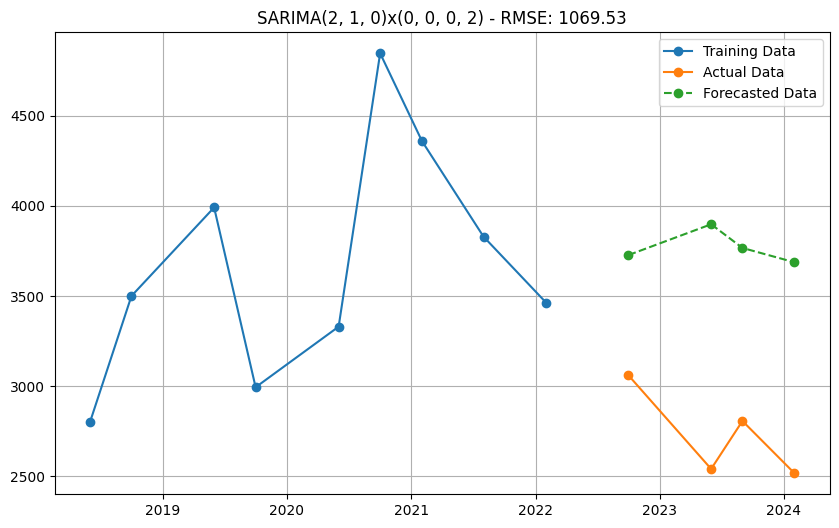

Model: SARIMA(2, 1, 0)x(0, 0, 0, 2) - AIC: 133.04 - RMSE: 1069.53


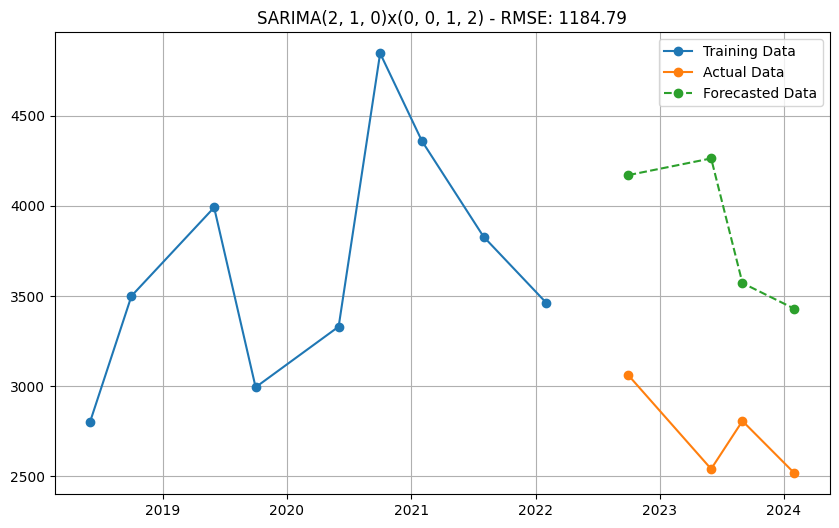

Model: SARIMA(2, 1, 0)x(0, 0, 1, 2) - AIC: 133.94 - RMSE: 1184.79


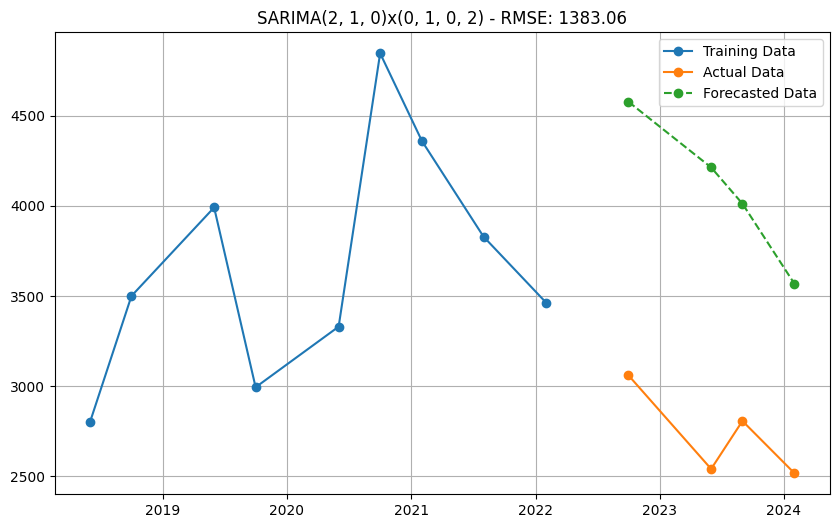

Model: SARIMA(2, 1, 0)x(0, 1, 0, 2) - AIC: 105.40 - RMSE: 1383.06


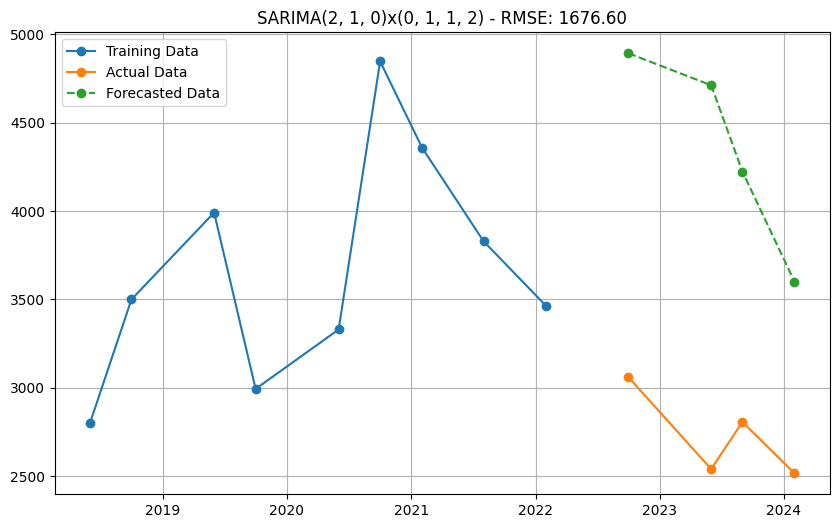

Model: SARIMA(2, 1, 0)x(0, 1, 1, 2) - AIC: 106.24 - RMSE: 1676.60
Failed to fit SARIMA(2, 1, 0)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 0)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 0)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 0)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


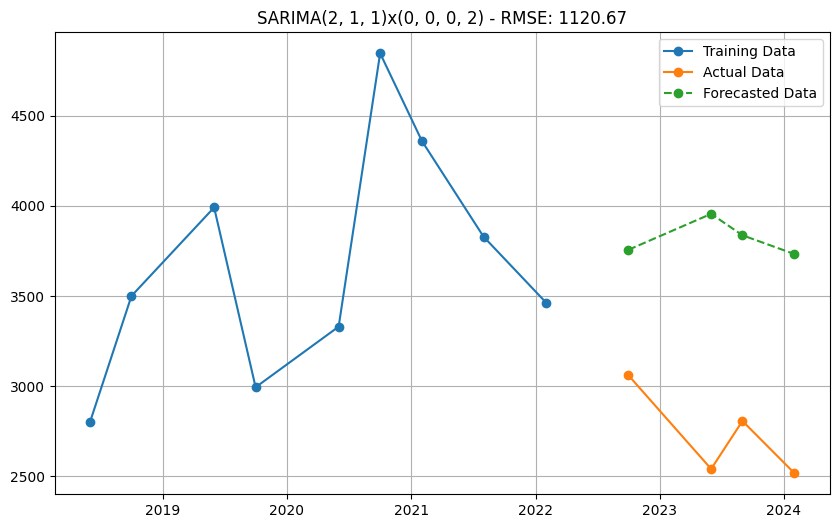

Model: SARIMA(2, 1, 1)x(0, 0, 0, 2) - AIC: 134.93 - RMSE: 1120.67


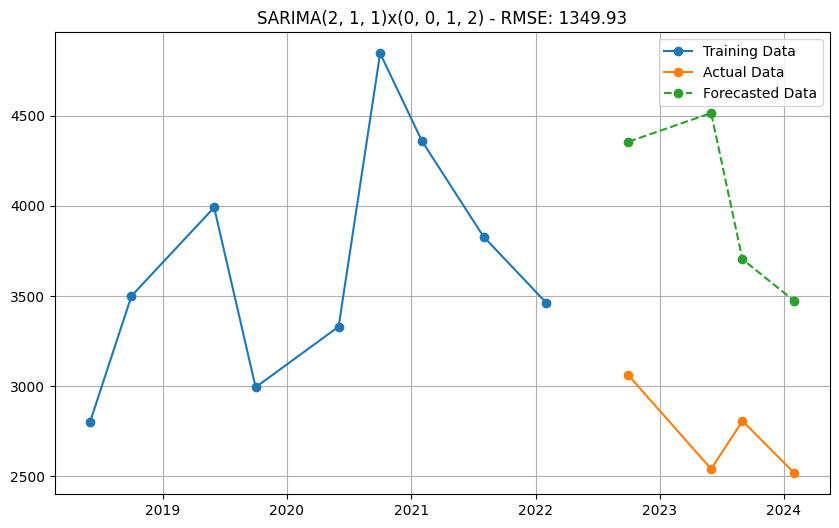

Model: SARIMA(2, 1, 1)x(0, 0, 1, 2) - AIC: 134.89 - RMSE: 1349.93


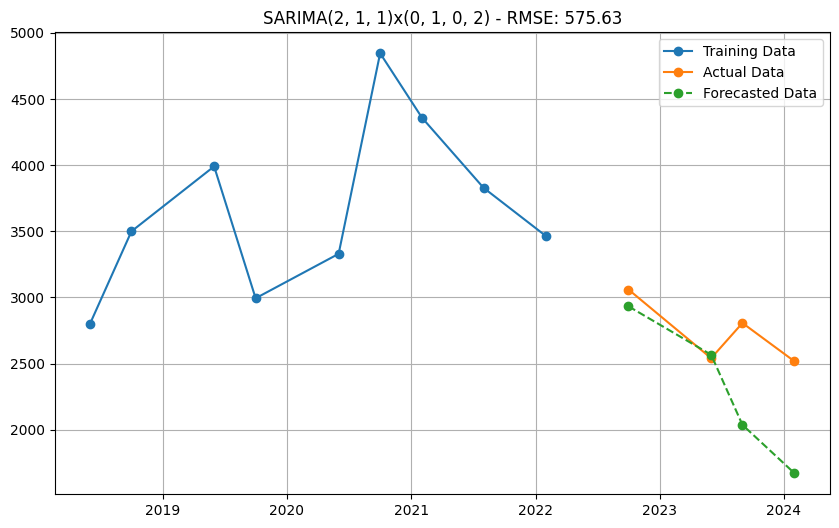

Model: SARIMA(2, 1, 1)x(0, 1, 0, 2) - AIC: 836793653985.02 - RMSE: 575.63
Failed to fit SARIMA(2, 1, 1)x(0, 1, 1, 2): LU decomposition error.
Failed to fit SARIMA(2, 1, 1)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 1)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 1)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 1)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


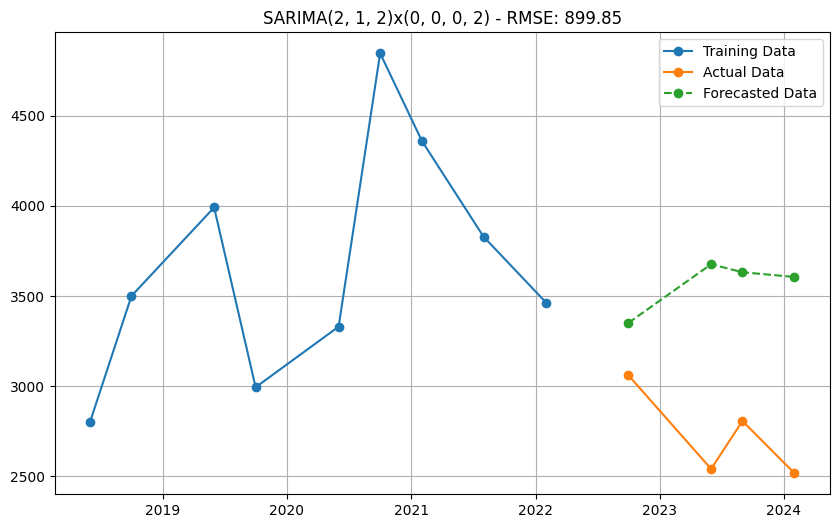

Model: SARIMA(2, 1, 2)x(0, 0, 0, 2) - AIC: 136.76 - RMSE: 899.85
Failed to fit SARIMA(2, 1, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


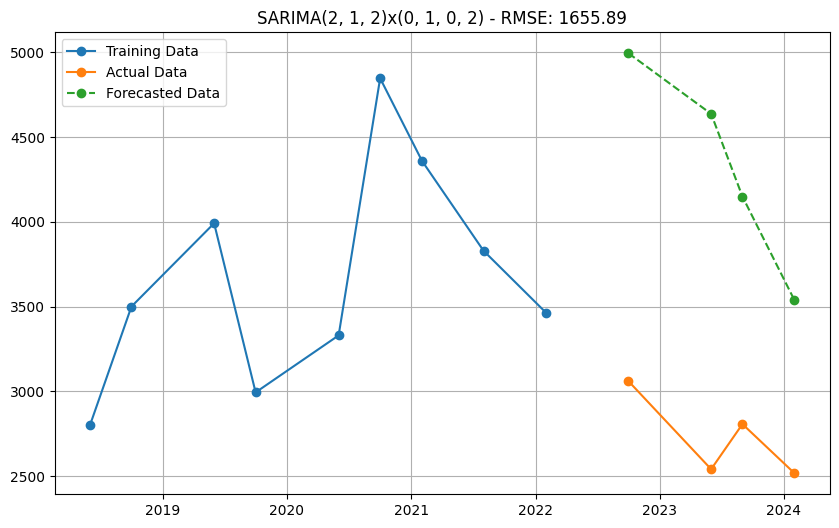

Model: SARIMA(2, 1, 2)x(0, 1, 0, 2) - AIC: 105.74 - RMSE: 1655.89
Failed to fit SARIMA(2, 1, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.
Failed to fit SARIMA(2, 1, 2)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 2)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 2)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 1, 2)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


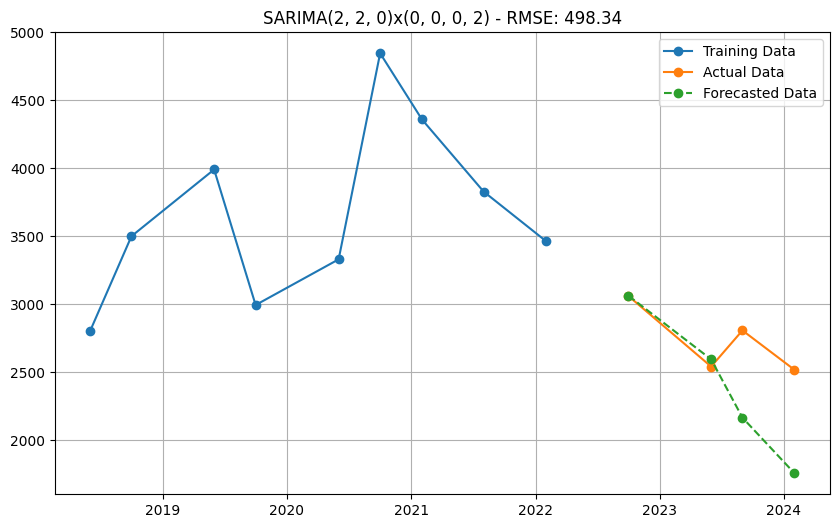

Model: SARIMA(2, 2, 0)x(0, 0, 0, 2) - AIC: 122.25 - RMSE: 498.34


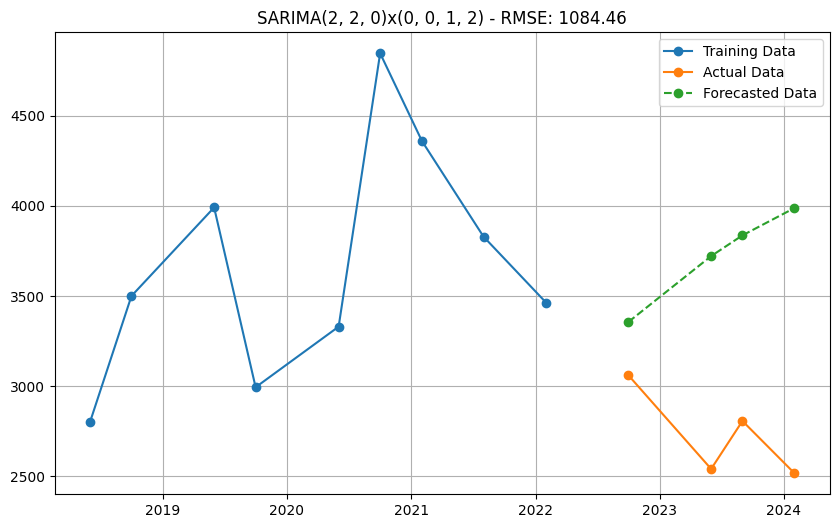

Model: SARIMA(2, 2, 0)x(0, 0, 1, 2) - AIC: 123.00 - RMSE: 1084.46


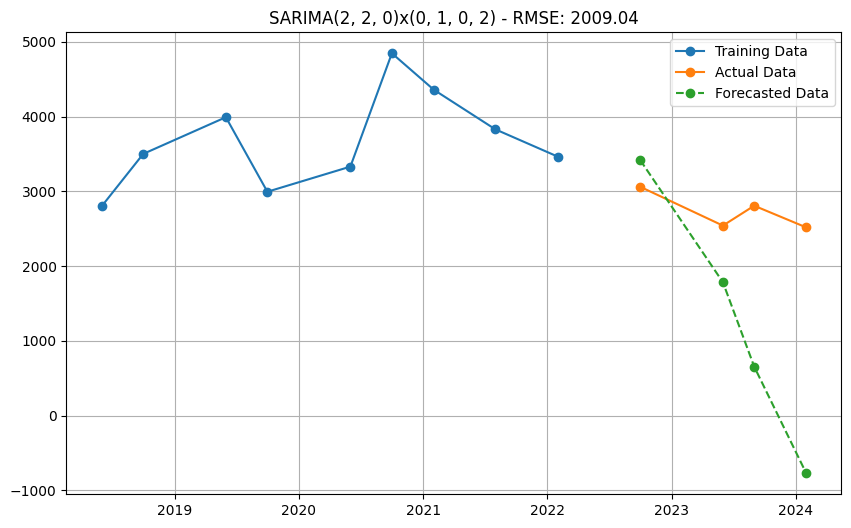

Model: SARIMA(2, 2, 0)x(0, 1, 0, 2) - AIC: 93.36 - RMSE: 2009.04


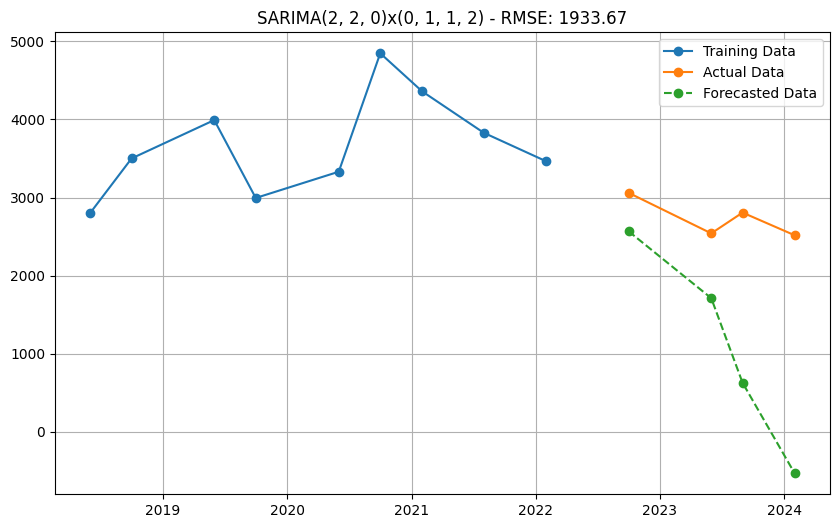

Model: SARIMA(2, 2, 0)x(0, 1, 1, 2) - AIC: 93.90 - RMSE: 1933.67
Failed to fit SARIMA(2, 2, 0)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 0)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 0)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 0)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


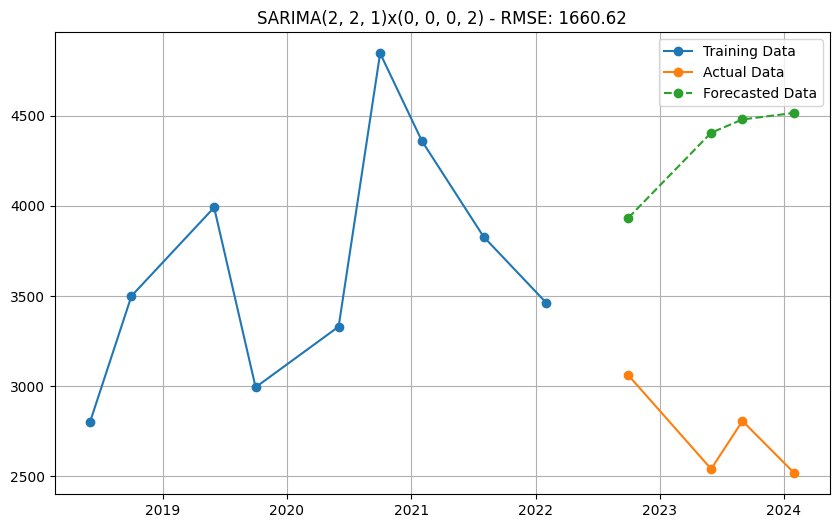

Model: SARIMA(2, 2, 1)x(0, 0, 0, 2) - AIC: 123.09 - RMSE: 1660.62


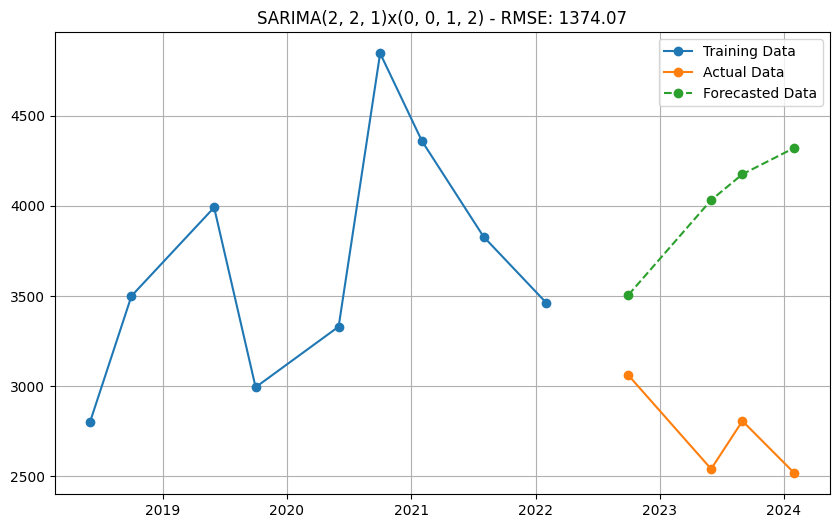

Model: SARIMA(2, 2, 1)x(0, 0, 1, 2) - AIC: 124.87 - RMSE: 1374.07


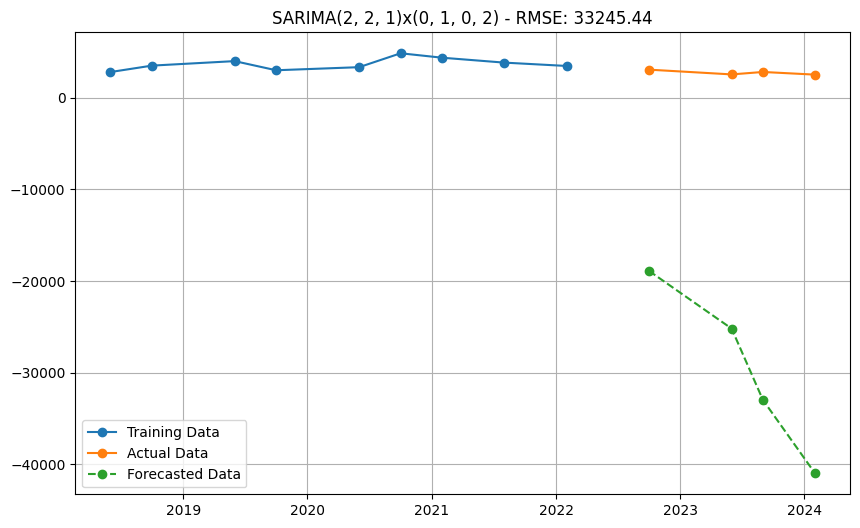

Model: SARIMA(2, 2, 1)x(0, 1, 0, 2) - AIC: 8.00 - RMSE: 33245.44


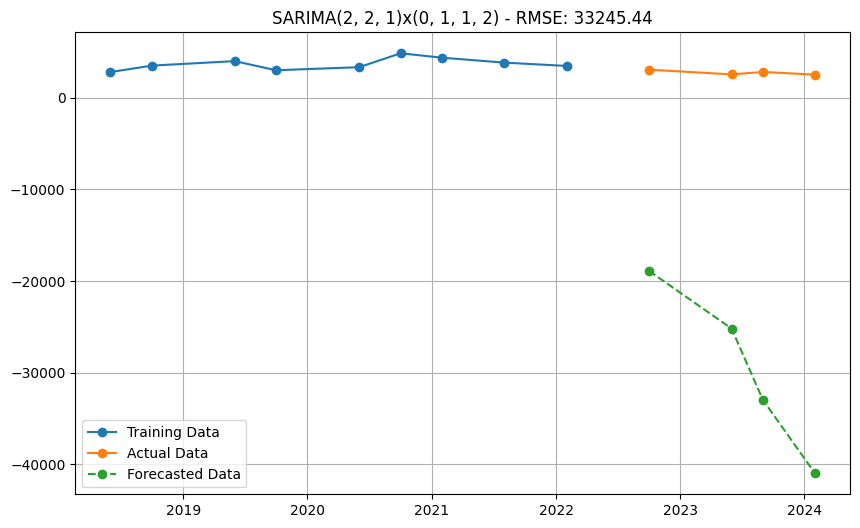

Model: SARIMA(2, 2, 1)x(0, 1, 1, 2) - AIC: 10.00 - RMSE: 33245.44
Failed to fit SARIMA(2, 2, 1)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 1)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 1)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 1)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


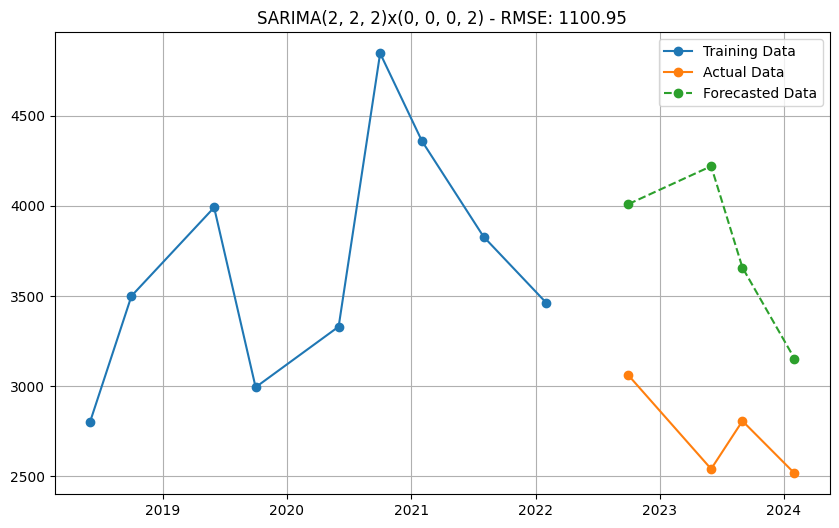

Model: SARIMA(2, 2, 2)x(0, 0, 0, 2) - AIC: 122.69 - RMSE: 1100.95
Failed to fit SARIMA(2, 2, 2)x(0, 0, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.


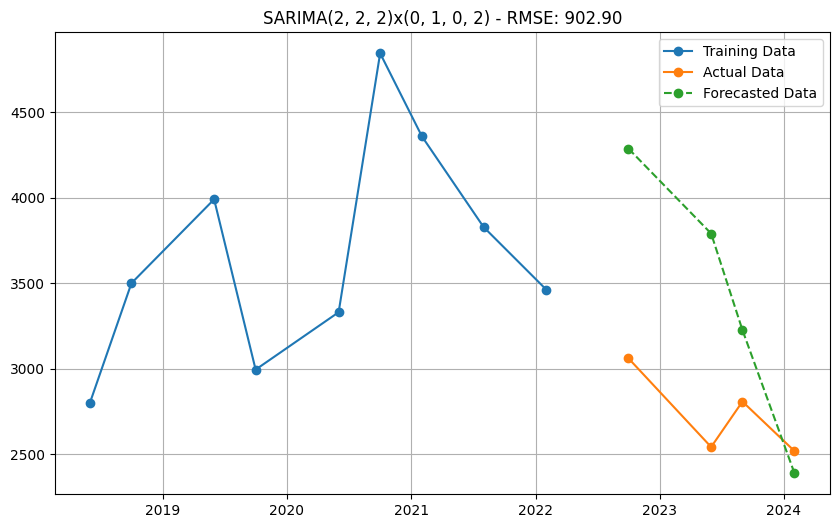

Model: SARIMA(2, 2, 2)x(0, 1, 0, 2) - AIC: 93.03 - RMSE: 902.90
Failed to fit SARIMA(2, 2, 2)x(0, 1, 1, 2): Invalid model: moving average lag(s) {np.int64(2)} are in both the seasonal and non-seasonal moving average components.
Failed to fit SARIMA(2, 2, 2)x(1, 0, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 2)x(1, 0, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 2)x(1, 1, 0, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.
Failed to fit SARIMA(2, 2, 2)x(1, 1, 1, 2): Invalid model: autoregressive lag(s) {np.int64(2)} are in both the seasonal and non-seasonal autoregressive components.


In [127]:
p = d = q = range(0, 3)
P = D = Q = range(0, 2)
m = [2]


non_seasonal_pdq = list(itertools.product(p, d, q))
seasonal_pdq = list(itertools.product(P, D, Q, m))


def sarima_grid_search(train, test, non_seasonal_pdq, seasonal_pdq):
    best_aic = float('inf')
    best_params = None
    best_model = None
    
    for param in non_seasonal_pdq:
        for seasonal_param in seasonal_pdq:
            try:
                model = SARIMAX(train, 
                                order=param, 
                                seasonal_order=seasonal_param)
                
                model_fit = model.fit(disp=False)
                
                forecast = model_fit.forecast(steps=len(test))

                mse = mean_squared_error(test, forecast)
                rmse = np.sqrt(mse)

                plt.figure(figsize=(10,6))
                plt.plot(train.index, train, label='Training Data', marker='o')
                plt.plot(test.index, test, label='Actual Data', marker='o')
                plt.plot(test.index, forecast, label='Forecasted Data', linestyle='--', marker='o')
                plt.title(f'SARIMA{param}x{seasonal_param} - RMSE: {rmse:.2f}')
                plt.legend()
                plt.grid()
                plt.show()
                
                print(f"Model: SARIMA{param}x{seasonal_param} - AIC: {model_fit.aic:.2f} - RMSE: {rmse:.2f}")
                
                if model_fit.aic < best_aic:
                    best_aic = model_fit.aic
                    best_params = (param, seasonal_param)
                    best_model = model_fit
                    print(f"New best model found: SARIMA{param}x{seasonal_param} - AIC: {model_fit.aic:.2f}")
                    
            except Exception as e:
                print(f"Failed to fit SARIMA{param}x{seasonal_param}: {e}")
                continue
                
    return best_model, best_params

best_model, best_params = sarima_grid_search(train, test, non_seasonal_pdq, seasonal_pdq)

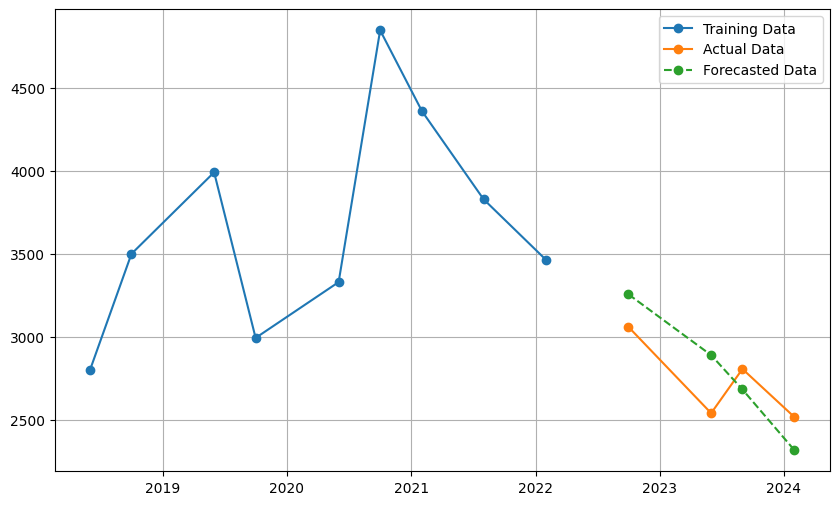

Root Mean Squared Error: 232.12586655147282
Mean Absolute Error: 217.09392553280668
Mean Absolute Percentage Error: 7.95%


In [128]:
model = SARIMAX(train, order=(0, 1, 1), seasonal_order=(0, 1, 0, 2))

results = model.fit()
forecast = results.forecast(steps=len(test))

plt.figure(figsize=(10,6))
plt.plot(train.index, train, label='Training Data', marker='o')
plt.plot(test.index, test, label='Actual Data', marker='o')
plt.plot(test.index, forecast, label='Forecasted Data', linestyle='--', marker='o')
plt.legend()
plt.grid()
plt.show()

mse = mean_squared_error(test, forecast)
rmse = np.sqrt(mse)
mae = mean_absolute_error(test, forecast)
mape = MAE_to_MAPE(mae, test)
print(f'Root Mean Squared Error: {rmse}')
print(f'Mean Absolute Error: {mae}')
print(f'Mean Absolute Percentage Error: {mape:.2f}%')

forecast_df = pd.DataFrame(forecast, index=test.index, columns=['Forecast'])

In [129]:
forecast.index = test.index

model_result = pd.DataFrame({
    'Actual': test,
    'Forecast': forecast
})
model_result['Difference'] = model_result['Actual'] - model_result['Forecast']

mse = mean_squared_error(test, forecast)
rmse = np.sqrt(mse)

print(model_result)
print(" ")
print(f'Root Mean Squared Error: {rmse}')


            Actual     Forecast  Difference
Date                                       
2022-10-01    3060  3256.312149 -196.312149
2023-06-01    2541  2890.312149 -349.312149
2023-09-01    2807  2683.624298  123.375702
2024-02-01    2517  2317.624298  199.375702
 
Root Mean Squared Error: 232.12586655147282


In [130]:
# Null Hypothesis: The residuals are independently distributed.
# Alternative Hypothesis: The residuals are not independently distributed; they exhibit serial correlation.
sm.stats.acorr_ljungbox(results.resid, lags=[5], return_df=True)

,lb_stat,lb_pvalue
5,7.23535,0.203717


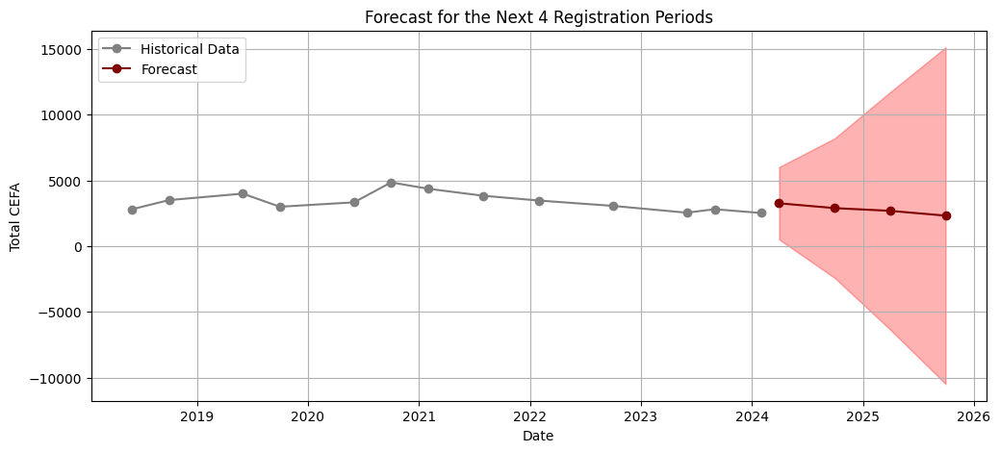

In [131]:
forecast_steps = 4
forecast = results.get_forecast(steps=forecast_steps, alpha=0.08)
forecast_index = pd.date_range(start=totalSHS.index[-1] + pd.DateOffset(months=1), periods=forecast_steps, freq='6M')
forecast_mean = forecast.predicted_mean
forecast_mean.index = forecast_index

# Plot historical data and forecast
plt.figure(figsize=(12, 5))
plt.plot(totalSHS.index, totalSHS, label='Historical Data', marker='o', color='gray')
plt.plot(forecast_mean.index, forecast_mean, label='Forecast', color='maroon', marker='o')
plt.fill_between(forecast_mean.index,
                 forecast.conf_int().iloc[:, 0],
                 forecast.conf_int().iloc[:, 1], color='red', alpha=0.3)
plt.title('Forecast for the Next 4 Registration Periods')
plt.xlabel('Date')
plt.ylabel('Total CEFA')
plt.legend()
plt.grid()
plt.show()

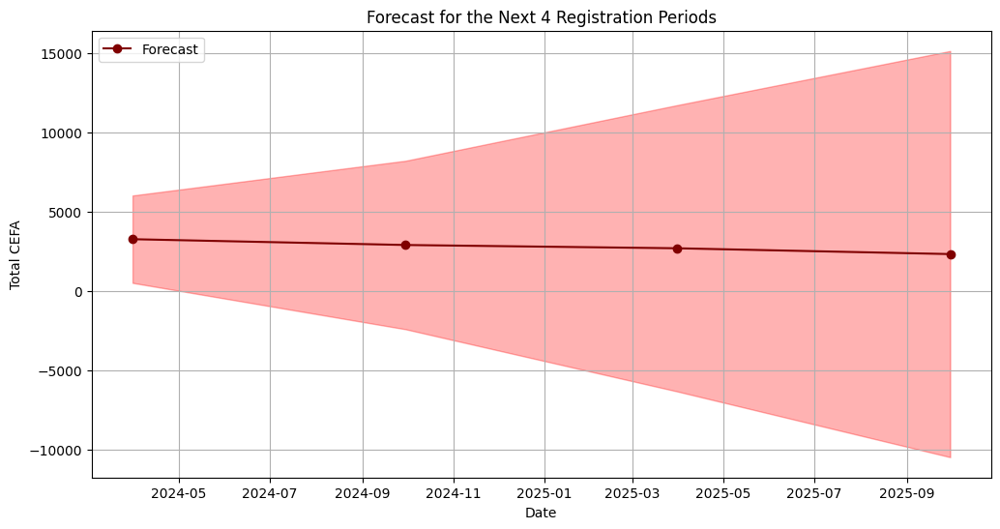

In [132]:
# Plot historical data and forecast
plt.figure(figsize=(12, 6))
plt.plot(forecast_mean.index, forecast_mean, label='Forecast', color='maroon', marker='o')
plt.fill_between(forecast_mean.index,
                 forecast.conf_int().iloc[:, 0],
                 forecast.conf_int().iloc[:, 1], color='red', alpha=0.3)
plt.title('Forecast for the Next 4 Registration Periods')
plt.xlabel('Date')
plt.ylabel('Total CEFA')
plt.legend()
plt.grid()
plt.show()